In [1]:
### STARTS HERE

#ANN




In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
%matplotlib inline

In [16]:
df = pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/2 month.csv")
df.sample(5)

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result5
1494,ORBIT EXPORTS LTD.,ORBTEXP,50000,7.275386e+06,0,0.0,50000,7.275386e+06,145.51,09-01-2018,...,9.57,0.26,38.00,-26.0,-13.00,37.23,14.91,Textiles - Processing,LOSS,LOSS
3018,GMR INFRASTRUCTURE LTD.,GMRINFRA,100654784,1.639260e+09,0,0.0,100654784,1.639260e+09,16.29,04-01-2020,...,-5.93,0.05,2052.00,-3605.0,816.00,-3444.00,-2.70,Engineering - Turnkey Services,PROFIT,PROFIT
2209,Satin Creditcare Network Ltd,SATIN,250012,7.225093e+07,0,0.0,250012,7.225093e+07,288.99,04-01-2019,...,11.43,0.12,-1541.00,-55.0,1394.00,116.00,31.18,Finance & Investments,LOSS,LOSS
3208,NRB BEARINGS LTD.,NRBBEARING,10491,6.214340e+05,0,0.0,10491,6.214340e+05,59.23,05-01-2020,...,3.31,0.09,102.00,-65.0,9.00,47.00,20.38,Bearings,PROFIT,PROFIT
1806,INDOWIND ENERGY LTD.,INDOWIND,650406,4.081063e+06,0,0.0,650406,4.081063e+06,6.27,12-01-2018,...,-2.34,0.02,7.47,9.8,-18.23,-23.65,-2.71,Power Generation And Supply,LOSS,LOSS


In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4241 entries, 0 to 4240
Data columns (total 32 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Row Labels             4241 non-null   object 
 1   Symbol                 4241 non-null   object 
 2   No of Shares Bought    4241 non-null   int64  
 3   Value of purchase      4241 non-null   float64
 4   No of shares sold      4241 non-null   int64  
 5   Value of sale          4241 non-null   float64
 6   No of shares           4241 non-null   int64  
 7   Value                  4241 non-null   float64
 8   Avg Price              4241 non-null   float64
 9   Buy Date               4241 non-null   object 
 10  Sell date              4241 non-null   object 
 11  Buy price              4241 non-null   float64
 12  Sell price             4241 non-null   float64
 13  Nifty Index at buying  4241 non-null   float64
 14  Nfty index at selling  4241 non-null   float64
 15  Chan

In [18]:
df.drop('Row Labels',axis=1,inplace=True)
#df.drop('Symbol',axis=1,inplace=True)
df.drop('Return',axis=1,inplace=True)
df.drop('Sell price',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)
df.drop('Buy Date',axis=1,inplace=True)
df.drop('Sell date',axis=1,inplace=True)
df.drop('Result5',axis=1,inplace=True)

In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4241 entries, 0 to 4240
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Symbol                 4241 non-null   object 
 1   No of Shares Bought    4241 non-null   int64  
 2   Value of purchase      4241 non-null   float64
 3   No of shares sold      4241 non-null   int64  
 4   Value of sale          4241 non-null   float64
 5   No of shares           4241 non-null   int64  
 6   Value                  4241 non-null   float64
 7   Avg Price              4241 non-null   float64
 8   Buy price              4241 non-null   float64
 9   Nifty Index at buying  4241 non-null   float64
 10  Nfty index at selling  4241 non-null   float64
 11  No of shares.1         4241 non-null   int64  
 12  Market Cap             4241 non-null   float64
 13  %age of Marketcap      4241 non-null   float64
 14  Cap                    4241 non-null   object 
 15  Devi

In [20]:
df['code'] = pd.factorize(df['Symbol'])[0] + 1

In [21]:
df['code']

0         1
1         2
2         3
3         4
4         5
       ... 
4236    566
4237    626
4238    448
4239    153
4240    100
Name: code, Length: 4241, dtype: int64

In [22]:
df.drop('Symbol',axis=1,inplace=True)

In [23]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result']=df['Result'].map(r)

In [24]:
df['Result']

0       1
1       1
2       1
3       1
4       1
       ..
4236    1
4237    0
4238    0
4239    1
4240    0
Name: Result, Length: 4241, dtype: int64

In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4241 entries, 0 to 4240
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   No of Shares Bought    4241 non-null   int64  
 1   Value of purchase      4241 non-null   float64
 2   No of shares sold      4241 non-null   int64  
 3   Value of sale          4241 non-null   float64
 4   No of shares           4241 non-null   int64  
 5   Value                  4241 non-null   float64
 6   Avg Price              4241 non-null   float64
 7   Buy price              4241 non-null   float64
 8   Nifty Index at buying  4241 non-null   float64
 9   Nfty index at selling  4241 non-null   float64
 10  No of shares.1         4241 non-null   int64  
 11  Market Cap             4241 non-null   float64
 12  %age of Marketcap      4241 non-null   float64
 13  Cap                    4241 non-null   int64  
 14  Deviation              4241 non-null   float64
 15  EPS 

In [26]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            0
No of shares             0
Value                    0
Avg Price                0
Buy price                0
Nifty Index at buying    0
Nfty index at selling    0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Result                   0
code                     0
dtype: int64
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            0
No of shares             0
Value                    0
Avg Price                0
Buy price                0
Nifty Index at buying    0
Nfty index at selling    0
No of shares.1           0
Market Cap     

In [27]:
cols_to_scale=['No of Shares Bought','Value of purchase','No of shares sold','Value of sale','No of shares','Value','Avg Price','Buy price','Nifty Index at buying','Nfty index at selling','No of shares.1','Market Cap','%age of Marketcap','Deviation','EPS','ROE','COA','CIA','CFA','PBT','PE','Industry','code']
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df[cols_to_scale] = scaler.fit_transform(df[cols_to_scale])

In [28]:
df.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,code
0,0.000333,0.000002,0.0,0.0,0.000333,0.000002,0.000004,0.000940,0.061711,0.072551,...,0.005955,0.178030,0.504167,0.869876,0.416881,0.438885,0.702581,0.000000,1,0.000000
1,0.000100,0.000472,0.0,0.0,0.000100,0.000472,0.002446,0.157032,0.061711,0.072551,...,0.008039,0.208333,0.505860,0.868413,0.415264,0.442086,0.704055,0.010417,1,0.001585
2,0.076195,0.000590,0.0,0.0,0.076198,0.000591,0.000004,0.001351,0.350718,0.358562,...,0.005739,0.162879,0.519492,0.840871,0.421233,0.410258,0.702048,0.020833,1,0.003170
3,0.019868,0.000278,0.0,0.0,0.019868,0.000278,0.000007,0.000430,0.061711,0.072551,...,0.005877,0.164773,0.504271,0.870008,0.416468,0.438778,0.715401,0.031250,1,0.004754
4,0.005643,0.002854,0.0,0.0,0.005643,0.002857,0.000263,0.014241,0.061711,0.072551,...,0.006128,0.200758,0.506555,0.865890,0.416735,0.443021,0.703668,0.041667,1,0.006339


In [15]:
X = df.drop('Result',axis='columns')
y = df['Result']
a=X[3990:]
b=y[3990:]
X=X[:3990]
y=y[:3990]

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=5)

In [16]:
X_train.shape

(3192, 24)

In [17]:
X_test.shape

(798, 24)

In [18]:
X_train[:10]

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
890,0.004777,0.000064,0.000000,0.00000,0.004777,0.000064,0.000007,0.000455,0.185285,0.204195,...,3.942832e-08,0.005884,0.174242,0.504230,0.869867,0.416704,0.438824,0.703722,0.229167,0.456418
1840,0.000022,0.000038,0.000000,0.00000,0.000022,0.000038,0.000911,0.046859,0.097736,0.094219,...,3.091180e-08,0.006472,0.166667,0.505818,0.869628,0.414773,0.441120,0.704203,0.229167,0.681458
2082,0.002472,0.000769,0.006384,0.00823,0.001507,0.000461,0.000159,0.009138,0.086975,0.105383,...,3.438150e-08,0.005972,0.174242,0.504616,0.870106,0.416047,0.438783,0.704619,0.156250,0.462758
1829,0.000008,0.000015,0.000000,0.00000,0.000008,0.000015,0.001060,0.059878,0.097736,0.094219,...,3.375064e-08,0.006953,0.196970,0.506461,0.866848,0.415556,0.443132,0.703641,0.281250,0.071315
64,0.256545,0.002800,0.000000,0.00000,0.256556,0.002802,0.000006,0.001123,0.072551,0.053818,...,1.189158e-07,0.005817,0.157197,0.503294,0.867768,0.420440,0.432178,0.701832,0.031250,0.014263
1542,0.000054,0.000056,0.000000,0.00000,0.000054,0.000056,0.000536,0.028086,0.271014,0.271007,...,3.122723e-08,0.006003,0.214015,0.506466,0.868265,0.414471,0.445937,0.707685,0.364583,0.223455
2860,0.000140,0.000004,0.000000,0.00000,0.000140,0.000004,0.000015,0.000717,0.096402,0.000000,...,2.965010e-08,0.005889,0.166667,0.504316,0.869820,0.416557,0.438825,0.703745,0.447917,0.167987
3835,0.000194,0.000166,0.000000,0.00000,0.000194,0.000166,0.000446,0.020512,0.169252,0.211742,...,2.744211e-08,0.006009,0.166667,0.504595,0.869913,0.415921,0.438803,0.706048,0.270833,0.068146
1064,0.000081,0.000057,0.000000,0.00000,0.000081,0.000057,0.000365,0.019293,0.176438,0.177966,...,3.154266e-08,0.005829,0.151515,0.503921,0.869002,0.418082,0.438570,0.692449,0.281250,0.231379
3306,0.000270,0.000061,0.000000,0.00000,0.000270,0.000061,0.000118,0.005488,0.440094,0.500488,...,2.807297e-08,0.005978,0.176136,0.526577,0.841690,0.425690,0.451780,0.703603,0.000000,0.434231


In [19]:
len(X_train.columns)

24

In [20]:
#ANN in tensorflow/keras

import tensorflow as tf
from tensorflow import keras


model = keras.Sequential([
    keras.layers.Dense(24, input_shape=(24,), activation='relu'),
    keras.layers.Dense(15, activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')
])

opt = keras.optimizers.Adam(learning_rate=0.01)

model.compile(optimizer=opt,
              loss='binary_crossentropy',
              metrics=['accuracy'])

model.fit(X_train, y_train, epochs=500)

Epoch 1/500
100/100 [==============================] - 0s 1ms/step - loss: 0.6890 - accuracy: 0.5457
Epoch 2/500
100/100 [==============================] - 0s 1ms/step - loss: 0.6837 - accuracy: 0.5523
Epoch 3/500
100/100 [==============================] - 0s 1ms/step - loss: 0.6823 - accuracy: 0.5627
Epoch 4/500
100/100 [==============================] - 0s 1ms/step - loss: 0.6798 - accuracy: 0.5717
Epoch 5/500
100/100 [==============================] - 0s 1ms/step - loss: 0.6810 - accuracy: 0.5517
Epoch 6/500
100/100 [==============================] - 0s 1ms/step - loss: 0.6754 - accuracy: 0.5717
Epoch 7/500
100/100 [==============================] - 0s 1ms/step - loss: 0.6684 - accuracy: 0.5871
Epoch 8/500
100/100 [==============================] - 0s 1ms/step - loss: 0.6642 - accuracy: 0.5965
Epoch 9/500
100/100 [==============================] - 0s 1ms/step - loss: 0.6492 - accuracy: 0.6300
Epoch 10/500
100/100 [==============================] - 0s 1ms/step - loss: 0.6218 - accura

Epoch 81/500
100/100 [==============================] - 0s 1ms/step - loss: 0.5572 - accuracy: 0.7190
Epoch 82/500
100/100 [==============================] - 0s 1ms/step - loss: 0.5582 - accuracy: 0.7187
Epoch 83/500
100/100 [==============================] - 0s 1ms/step - loss: 0.5614 - accuracy: 0.7159
Epoch 84/500
100/100 [==============================] - 0s 1ms/step - loss: 0.5571 - accuracy: 0.7231
Epoch 85/500
100/100 [==============================] - 0s 1ms/step - loss: 0.5591 - accuracy: 0.7196
Epoch 86/500
100/100 [==============================] - 0s 1ms/step - loss: 0.5549 - accuracy: 0.7174
Epoch 87/500
100/100 [==============================] - 0s 1ms/step - loss: 0.5588 - accuracy: 0.7159
Epoch 88/500
100/100 [==============================] - 0s 1ms/step - loss: 0.5649 - accuracy: 0.7083
Epoch 89/500
100/100 [==============================] - 0s 1ms/step - loss: 0.5644 - accuracy: 0.7137
Epoch 90/500
100/100 [==============================] - 0s 1ms/step - loss: 0.5568

100/100 [==============================] - 0s 1ms/step - loss: 0.5527 - accuracy: 0.7137
Epoch 240/500
100/100 [==============================] - 0s 1ms/step - loss: 0.5500 - accuracy: 0.7256
Epoch 241/500
100/100 [==============================] - 0s 1ms/step - loss: 0.5454 - accuracy: 0.7256
Epoch 242/500
100/100 [==============================] - 0s 1ms/step - loss: 0.5462 - accuracy: 0.7187
Epoch 243/500
100/100 [==============================] - 0s 1ms/step - loss: 0.5506 - accuracy: 0.7224
Epoch 244/500
100/100 [==============================] - 0s 1ms/step - loss: 0.5486 - accuracy: 0.7140
Epoch 245/500
100/100 [==============================] - 0s 1ms/step - loss: 0.5484 - accuracy: 0.7246
Epoch 246/500
100/100 [==============================] - 0s 1ms/step - loss: 0.5504 - accuracy: 0.7221
Epoch 247/500
100/100 [==============================] - 0s 1ms/step - loss: 0.5444 - accuracy: 0.7262
Epoch 248/500
100/100 [==============================] - 0s 1ms/step - loss: 0.5554 - a

100/100 [==============================] - 0s 1ms/step - loss: 0.5475 - accuracy: 0.7218
Epoch 398/500
100/100 [==============================] - 0s 1ms/step - loss: 0.5428 - accuracy: 0.7287
Epoch 399/500
100/100 [==============================] - 0s 1ms/step - loss: 0.5551 - accuracy: 0.7174
Epoch 400/500
100/100 [==============================] - 0s 1ms/step - loss: 0.5415 - accuracy: 0.7287
Epoch 401/500
100/100 [==============================] - 0s 1ms/step - loss: 0.5417 - accuracy: 0.7359
Epoch 402/500
100/100 [==============================] - 0s 1ms/step - loss: 0.5449 - accuracy: 0.7253
Epoch 403/500
100/100 [==============================] - 0s 1ms/step - loss: 0.5408 - accuracy: 0.7303
Epoch 404/500
100/100 [==============================] - 0s 1ms/step - loss: 0.5387 - accuracy: 0.7293
Epoch 405/500
100/100 [==============================] - 0s 987us/step - loss: 0.5420 - accuracy: 0.7312
Epoch 406/500
100/100 [==============================] - 0s 1ms/step - loss: 0.5447 -

In [22]:
model.evaluate(X_test, y_test)

25/25 [==============================] - 0s 997us/step - loss: 0.8956 - accuracy: 0.6792


[0.8956210613250732, 0.6791979670524597]

In [23]:
yp = model.predict(X_test)
yp[:5]

array([[0.8425873 ],
       [0.74941754],
       [0.8037797 ],
       [0.73778623],
       [0.7889687 ]], dtype=float32)

In [24]:
y_pred = []
for element in yp:
    if element > 0.5:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [25]:
y_pred[:10]

[1, 1, 1, 1, 1, 0, 1, 1, 1, 1]

In [26]:
y_test[:10]

3866    1
3780    1
3246    1
3558    1
3602    0
1980    1
2272    1
3616    1
329     0
3279    1
Name: Result, dtype: int64

In [27]:
from sklearn.metrics import confusion_matrix , classification_report

print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.70      0.45      0.55       346
           1       0.67      0.85      0.75       452

    accuracy                           0.68       798
   macro avg       0.69      0.65      0.65       798
weighted avg       0.68      0.68      0.66       798



Text(69.0, 0.5, 'Truth')

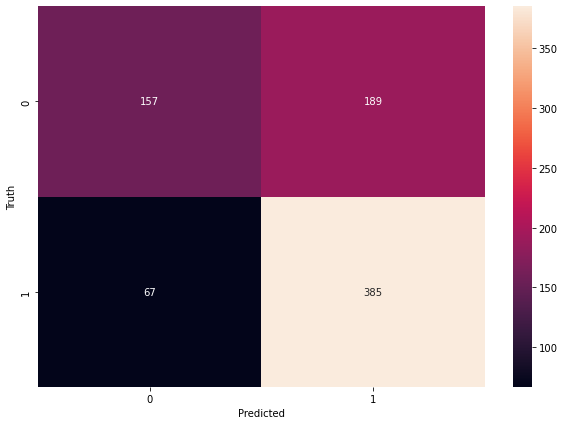

In [28]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=y_test,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [29]:
y_pred=pd.DataFrame(y_pred)

In [30]:
df_x=X[3990:]
df_y=y[3990:]

In [30]:
yp = model.predict(a)
yp[:5]

array([[0.7091718 ],
       [0.9888574 ],
       [0.6714984 ],
       [0.79423165],
       [0.66875005]], dtype=float32)

In [31]:
y_pred1 = []
for element in yp:
    if element > 0.5:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [32]:
y_pred1[:10]

[1, 1, 1, 1, 1, 1, 1, 0, 1, 1]

In [33]:
b[:10]

3990    1
3991    1
3992    0
3993    1
3994    1
3995    1
3996    1
3997    0
3998    0
3999    1
Name: Result, dtype: int64

In [34]:
model.evaluate(a, b)

8/8 [==============================] - 0s 996us/step - loss: 1.0172 - accuracy: 0.6215


[1.017224669456482, 0.6215139627456665]

In [36]:
y_pred1=pd.DataFrame(y_pred1)
a.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_ann_2mon_test.xlsx")
b.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_ann_2mon_test.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_ann_2mon_test.xlsx")

In [38]:
X_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_ann_2mon.xlsx")
y_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_ann_2mon.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_ann_2mon.xlsx")

In [37]:
## 6 months data

In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
%matplotlib inline

In [4]:
df1 = pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/6month_test_neg.csv")
df1.sample(5)

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result10
3070,MAYUR UNIQUOTERS LTD.-$,MAYURUNIQ,53632,8148527.00,0,0.0,53632,8148527.00,151.93,04-01-2020,...,19.76,0.27,63.0,-68.0,-3.0,132.0,7.56,Plastics Products,PROFIT,PROFIT
3389,SOMANY CERAMICS LTD.,SOMANYCERA,300000,51165723.00,0,0.0,300000,51165723.00,170.55,09-01-2020,...,3.54,0.07,153.0,-15.0,-153.0,10.0,43.29,Ceramics - Tiles / Sanitaryware,PROFIT,PROFIT
1844,RAYMOND LTD.,RAYMOND,70000,55732700.00,0,0.0,70000,55732700.00,796.18,12-01-2018,...,21.93,0.09,395.0,-415.0,30.0,208.0,36.64,Textiles - Products,PROFIT,LOSS
2223,SUNTECK REALTY LTD.,SUNTECK,45000,15042518.00,0,0.0,45000,15042518.00,334.28,04-01-2019,...,14.64,0.13,-169.0,18.0,140.0,332.0,32.69,Construction,LOSS,LOSS
691,RAYMOND LTD.,RAYMOND,39970,26043036.31,0,0.0,39970,26043036.31,651.56,06-01-2017,...,4.16,0.06,348.0,-223.0,-122.0,52.0,168.91,Textiles - Products,PROFIT,PROFIT


In [5]:
df1.drop('Row Labels',axis=1,inplace=True)
#df.drop('Symbol',axis=1,inplace=True)
df1.drop('Return',axis=1,inplace=True)
df1.drop('Sell price',axis=1,inplace=True)
#df1.drop('Change in Nifty 50',axis=1,inplace=True)
df1.drop('Buy Date',axis=1,inplace=True)
df1.drop('Sell date',axis=1,inplace=True)
df1.drop('Result10',axis=1,inplace=True)

In [6]:
df1['code'] = pd.factorize(df1['Symbol'])[0] + 1

In [7]:
df1.drop('Symbol',1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_32916\985873070.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df1.drop('Symbol',1,inplace=True)


In [8]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4071 entries, 0 to 4070
Data columns (total 24 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   No of Shares Bought  4071 non-null   int64  
 1   Value of purchase    4071 non-null   float64
 2   No of shares sold    4071 non-null   int64  
 3   Value of sale        4069 non-null   float64
 4   No of shares         4071 non-null   int64  
 5   Value                4071 non-null   float64
 6   Avg Price            4071 non-null   float64
 7   Buy price            4071 non-null   float64
 8   Change in Nifty 50   4071 non-null   float64
 9   No of shares.1       4071 non-null   int64  
 10  Market Cap           4071 non-null   float64
 11  %age of Marketcap    4071 non-null   float64
 12  Cap                  4071 non-null   object 
 13  Deviation            4071 non-null   float64
 14  EPS                  4071 non-null   float64
 15  ROE                  4071 non-null   f

In [9]:
df1['Industry']

0                           Finance & Investments
1                               Dyes And Pigments
2                  Engineering - Turnkey Services
3                     Power Generation And Supply
4       Entertainment / Electronic Media Software
                          ...                    
4066                                      Trading
4067                        Finance & Investments
4068                        Finance & Investments
4069              Computers - Software - Converts
4070                                   Cigarettes
Name: Industry, Length: 4071, dtype: object

In [10]:
print(df1.isnull().sum())
df1 = df1.dropna(how='any',axis=0) 
print(df1.isnull().sum())

No of Shares Bought    0
Value of purchase      0
No of shares sold      0
Value of sale          2
No of shares           0
Value                  0
Avg Price              0
Buy price              0
Change in Nifty 50     0
No of shares.1         0
Market Cap             0
%age of Marketcap      0
Cap                    0
Deviation              0
EPS                    0
ROE                    0
COA                    0
CIA                    0
CFA                    0
PBT                    0
PE                     0
Industry               0
Result                 0
code                   0
dtype: int64
No of Shares Bought    0
Value of purchase      0
No of shares sold      0
Value of sale          0
No of shares           0
Value                  0
Avg Price              0
Buy price              0
Change in Nifty 50     0
No of shares.1         0
Market Cap             0
%age of Marketcap      0
Cap                    0
Deviation              0
EPS                    0
ROE         

In [11]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df1['Cap']=df1['Cap'].map(c)
i={}
count=0
for _ in df1['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df1['Industry']=df1['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df1['Result']=df1['Result'].map(r)

In [13]:
cols_to_scale=['No of Shares Bought','Value of purchase','No of shares sold','Value of sale','No of shares','Value','Avg Price','Buy price','Change in Nifty 50','No of shares.1','Market Cap','%age of Marketcap','Deviation','EPS','ROE','COA','CIA','CFA','PBT','PE','Industry','code']
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df1[cols_to_scale] = scaler.fit_transform(df1[cols_to_scale])

In [14]:
df1.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Change in Nifty 50,No of shares.1,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,code
0,0.000333,0.000002,0.0,0.0,0.000333,0.000002,0.000004,0.001022,0.286191,0.002393,...,0.005955,0.178030,0.504167,0.869876,0.416881,0.438885,0.702581,0.000000,0,0.000000
1,0.000100,0.000472,0.0,0.0,0.000100,0.000472,0.002446,0.170689,0.286191,0.002762,...,0.008039,0.208333,0.505860,0.868413,0.415264,0.442086,0.704055,0.010526,0,0.001592
2,0.076195,0.000590,0.0,0.0,0.076198,0.000591,0.000004,0.001469,0.334478,0.588284,...,0.005739,0.162879,0.519492,0.840871,0.421233,0.410258,0.702048,0.021053,0,0.003185
3,0.019868,0.000278,0.0,0.0,0.019868,0.000278,0.000007,0.000467,0.286191,0.008618,...,0.005877,0.164186,0.504271,0.870008,0.416468,0.438778,0.715401,0.031579,0,0.004777
4,0.005643,0.002854,0.0,0.0,0.005643,0.002857,0.000263,0.015479,0.286191,0.028766,...,0.006128,0.200758,0.506555,0.865890,0.416735,0.443021,0.703668,0.042105,1,0.006369


In [49]:
#just checking
# df1.drop('Nifty Index at buying',axis=1,inplace=True)
# df1.drop('Nfty index at selling',axis=1,inplace=True)
# df1.drop('Change in Nifty 50',axis=1,inplace=True)

In [15]:
X = df1.drop('Result',axis='columns')
y = df1['Result']
a=X[3806:]
b=y[3806:]
X=X[:3806]
y=y[:3806]

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=5)

In [16]:
X_train.shape

(3044, 23)

In [17]:
X_test.shape

(762, 23)

In [18]:
X_train[:10]

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Change in Nifty 50,No of shares.1,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
2054,0.000266,0.000038,0.000000,0.000000,0.000266,0.000038,0.000073,0.006245,0.266795,0.004840,...,9.938407e-08,0.005962,0.179924,0.504078,0.869987,0.416902,0.439027,0.703922,0.063158,0.474522
149,0.000043,0.000019,0.000000,0.000000,0.000043,0.000019,0.000229,0.014128,0.774321,0.001259,...,7.203677e-08,0.005917,0.174242,0.504507,0.869931,0.416057,0.438824,0.710198,0.273684,0.068471
1402,0.005704,0.003166,0.000249,0.000587,0.005666,0.003147,0.000288,0.004880,0.181635,0.064541,...,2.001022e-08,0.005898,0.172348,0.504768,0.870134,0.415546,0.439941,0.707349,0.284211,0.401274
2600,0.000019,0.000050,0.000000,0.000000,0.000019,0.000050,0.001370,0.075509,0.103445,0.043973,...,6.403269e-08,0.006234,0.178030,0.512966,0.839739,0.424322,0.454047,0.707021,0.242105,0.207006
3277,0.000351,0.003453,0.000000,0.000000,0.000351,0.003456,0.005107,0.310069,0.719972,0.028079,...,7.070276e-08,0.010677,0.215909,0.524378,0.886206,0.351363,0.506778,0.703734,0.210526,0.052548
2833,0.000183,0.000028,0.000000,0.000000,0.000183,0.000028,0.000080,0.004678,0.148500,0.004931,...,6.870174e-08,0.005904,0.168561,0.504361,0.869886,0.416435,0.438809,0.706066,0.042105,0.557325
1471,0.001384,0.000059,0.000000,0.000000,0.001384,0.000059,0.000022,0.001297,0.131730,0.007581,...,6.870174e-08,0.005892,0.171326,0.504323,0.869933,0.416541,0.438847,0.704167,0.452632,0.168790
2981,0.002615,0.024653,0.000000,0.000000,0.002615,0.024677,0.004899,0.219008,0.687847,0.028079,...,5.202656e-08,0.010416,0.215909,0.517256,0.867437,0.394913,0.509461,0.703368,0.210526,0.052548
455,0.211351,0.185836,0.000000,0.000000,0.211360,0.186016,0.000457,0.022080,0.527225,0.193441,...,5.602860e-08,0.006025,0.181818,0.518943,0.831610,0.406560,0.459178,0.705617,0.126316,0.283439
186,0.000062,0.000004,0.000000,0.000000,0.000062,0.000004,0.000030,0.001749,0.629154,0.001034,...,6.803473e-08,0.005882,0.162879,0.504261,0.869954,0.416527,0.438775,0.709286,0.000000,0.030255


In [19]:
len(X_train.columns)

23

In [21]:
#ANN in tensorflow/keras

import tensorflow as tf
from tensorflow import keras


model = keras.Sequential([
    keras.layers.Dense(24, input_shape=(23,), activation='relu'),
    keras.layers.Dense(15, activation='relu'),
    keras.layers.Dense(7, activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')
])

opt = keras.optimizers.Adam(learning_rate=0.01)
early_stopping = tf.keras.callbacks.EarlyStopping(patience=2)
model.compile(optimizer=opt,
              loss='binary_crossentropy',
              metrics=['accuracy'])

model.fit(X_train, y_train, epochs=500)

Epoch 1/500
96/96 [==============================] - 0s 1ms/step - loss: 0.5880 - accuracy: 0.6748
Epoch 2/500
96/96 [==============================] - 0s 1ms/step - loss: 0.5259 - accuracy: 0.7362
Epoch 3/500
96/96 [==============================] - 0s 1ms/step - loss: 0.5360 - accuracy: 0.7319
Epoch 4/500
96/96 [==============================] - 0s 1ms/step - loss: 0.5303 - accuracy: 0.7336
Epoch 5/500
96/96 [==============================] - 0s 1ms/step - loss: 0.5293 - accuracy: 0.7336
Epoch 6/500
96/96 [==============================] - 0s 1ms/step - loss: 0.5253 - accuracy: 0.7401
Epoch 7/500
96/96 [==============================] - 0s 1ms/step - loss: 0.5238 - accuracy: 0.7352
Epoch 8/500
96/96 [==============================] - 0s 1ms/step - loss: 0.5228 - accuracy: 0.7418
Epoch 9/500
96/96 [==============================] - 0s 1ms/step - loss: 0.5247 - accuracy: 0.7398
Epoch 10/500
96/96 [==============================] - 0s 1ms/step - loss: 0.5236 - accuracy: 0.7431
Epoch 11/

96/96 [==============================] - 0s 1ms/step - loss: 0.4843 - accuracy: 0.7635
Epoch 164/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4850 - accuracy: 0.7658
Epoch 165/500
96/96 [==============================] - 0s 966us/step - loss: 0.4833 - accuracy: 0.7658
Epoch 166/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4849 - accuracy: 0.7684
Epoch 167/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4958 - accuracy: 0.7589
Epoch 168/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4818 - accuracy: 0.7612
Epoch 169/500
96/96 [==============================] - 0s 997us/step - loss: 0.4818 - accuracy: 0.7671
Epoch 170/500
96/96 [==============================] - 0s 997us/step - loss: 0.4857 - accuracy: 0.7664
Epoch 171/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4902 - accuracy: 0.7612
Epoch 172/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4807 - accuracy: 0.767

96/96 [==============================] - 0s 997us/step - loss: 0.4735 - accuracy: 0.7740
Epoch 245/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4730 - accuracy: 0.7671
Epoch 246/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4760 - accuracy: 0.7723
Epoch 247/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4696 - accuracy: 0.7700
Epoch 248/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4689 - accuracy: 0.7730
Epoch 249/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4711 - accuracy: 0.7714
Epoch 250/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4688 - accuracy: 0.7691
Epoch 251/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4735 - accuracy: 0.7730
Epoch 252/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4667 - accuracy: 0.7704
Epoch 253/500
96/96 [==============================] - 0s 987us/step - loss: 0.4760 - accuracy: 0.7684


96/96 [==============================] - 0s 1ms/step - loss: 0.4622 - accuracy: 0.7829
Epoch 326/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4557 - accuracy: 0.7773
Epoch 327/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4606 - accuracy: 0.7727
Epoch 328/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4643 - accuracy: 0.7753
Epoch 329/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4625 - accuracy: 0.7720
Epoch 330/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4567 - accuracy: 0.7720
Epoch 331/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4631 - accuracy: 0.7786
Epoch 332/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4602 - accuracy: 0.7737
Epoch 333/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4640 - accuracy: 0.7763
Epoch 334/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4682 - accuracy: 0.7720
Epoc

96/96 [==============================] - 0s 1ms/step - loss: 0.4481 - accuracy: 0.7776
Epoch 407/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4492 - accuracy: 0.7802
Epoch 408/500
96/96 [==============================] - 0s 2ms/step - loss: 0.4547 - accuracy: 0.7756
Epoch 409/500
96/96 [==============================] - 0s 2ms/step - loss: 0.4568 - accuracy: 0.7746
Epoch 410/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4639 - accuracy: 0.7773
Epoch 411/500
96/96 [==============================] - 0s 2ms/step - loss: 0.4526 - accuracy: 0.7776
Epoch 412/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4640 - accuracy: 0.7697
Epoch 413/500
96/96 [==============================] - 0s 2ms/step - loss: 0.4632 - accuracy: 0.7763
Epoch 414/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4497 - accuracy: 0.7815
Epoch 415/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4517 - accuracy: 0.7789
Epoc

96/96 [==============================] - 0s 1ms/step - loss: 0.4545 - accuracy: 0.7809
Epoch 488/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4497 - accuracy: 0.7809
Epoch 489/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4475 - accuracy: 0.7852
Epoch 490/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4509 - accuracy: 0.7812
Epoch 491/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4513 - accuracy: 0.7842
Epoch 492/500
96/96 [==============================] - 0s 935us/step - loss: 0.4664 - accuracy: 0.7714
Epoch 493/500
96/96 [==============================] - 0s 977us/step - loss: 0.4468 - accuracy: 0.7861
Epoch 494/500
96/96 [==============================] - 0s 987us/step - loss: 0.4459 - accuracy: 0.7858
Epoch 495/500
96/96 [==============================] - 0s 1ms/step - loss: 0.5114 - accuracy: 0.7526
Epoch 496/500
96/96 [==============================] - 0s 1ms/step - loss: 0.4617 - accuracy: 0.779

In [22]:
model.evaluate(X_test, y_test)

24/24 [==============================] - 0s 916us/step - loss: 0.5629 - accuracy: 0.7402


[0.5629364848136902, 0.7401574850082397]

In [23]:
yp = model.predict(X_test)
yp[:5]

array([[0.90515774],
       [0.5681634 ],
       [0.15055934],
       [0.9012451 ],
       [0.93048894]], dtype=float32)

In [24]:
y_pred = []
for element in yp:
    if element > 0.5:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [25]:
y_pred[:10]

[1, 1, 0, 1, 1, 0, 1, 1, 0, 1]

In [26]:
y_test[:10]

3182    1
847     0
2166    0
3340    0
142     1
1269    0
3634    1
3000    1
1533    0
3043    1
Name: Result, dtype: int64

In [27]:
y_pred=pd.DataFrame(y_pred)

In [28]:
X_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_ann_6mon.xlsx")
y_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_ann_6mon.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_ann_6mon.xlsx")

In [29]:
from sklearn.metrics import confusion_matrix , classification_report

print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.77      0.62      0.68       347
           1       0.73      0.84      0.78       415

    accuracy                           0.74       762
   macro avg       0.75      0.73      0.73       762
weighted avg       0.74      0.74      0.74       762



Text(69.0, 0.5, 'Truth')

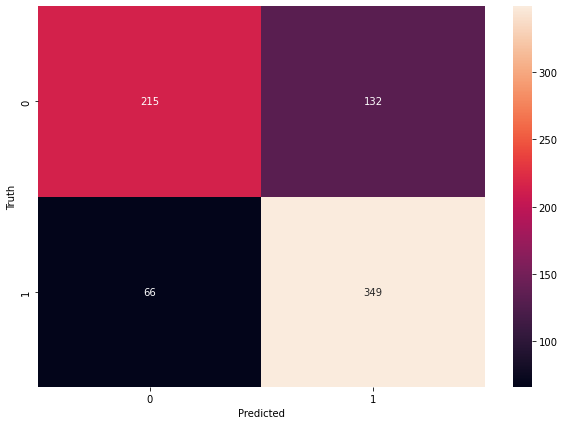

In [30]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=y_test,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [31]:
df_x=X[3806:]
df_y=y[3806:]

In [32]:
yp = model.predict(a)
yp[:5]

array([[0.52200127],
       [0.15297306],
       [0.13670704],
       [0.88444257],
       [0.5281766 ]], dtype=float32)

In [33]:
y_pred1 = []
for element in yp:
    if element > 0.5:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [34]:
y_pred1[:10]

[1, 0, 0, 1, 1, 0, 0, 1, 1, 0]

In [35]:
b[:10]

3808    1
3809    1
3810    1
3811    1
3812    1
3813    1
3814    1
3815    1
3816    1
3817    1
Name: Result, dtype: int64

In [36]:
model.evaluate(a, b)

9/9 [==============================] - 0s 1ms/step - loss: 5.2974 - accuracy: 0.3954


[5.297430038452148, 0.3954372704029083]

In [37]:
y_pred1=pd.DataFrame(y_pred1)
a.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_ann_6mon_test.xlsx")
b.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_ann_6mon_test.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_ann_6mon_test.xlsx")

In [71]:
# 9 months

In [72]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
%matplotlib inline

In [73]:
df = pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/9 months.csv")
df.sample(5)

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result13
539,THE BYKE HOSPITALITY LTD.,BYKE,88500,1.506313e+07,0,0.0,88500,1.506313e+07,170.20,01-01-2017,...,6.47,0.34,27.0,-18.0,-8.0,40.0,25.53,Hotels,PROFIT,LOSS
377,ADANI PORTS AND SPECIAL ECONOMIC ZONE LTD.,ADANIPORTS,15315169,4.115997e+09,0,0.0,15315169,4.115997e+09,268.75,10-01-2016,...,13.99,0.13,2381.0,-4153.0,2170.0,3119.0,18.91,Miscellaneous,PROFIT,PROFIT
536,SUMMIT SECURITIES LTD.,SUMMITSEC,16154,6.841040e+06,0,0.0,16154,6.841040e+06,423.49,01-01-2017,...,45.93,0.10,48.0,-18.0,0.0,51.0,9.22,Finance & Investments,PROFIT,PROFIT
1738,PRECISION WIRES INDIA LTD.,PRECWIRE,4449,8.793010e+05,0,0.0,4449,8.793010e+05,197.64,11-01-2018,...,3.11,0.28,95.0,-17.0,-31.0,58.0,13.84,Mining / Minerals / Metals,LOSS,LOSS
3084,Newgen Software Technologies Ltd,NEWGEN,50000,8.020989e+06,0,0.0,50000,8.020989e+06,160.42,04-01-2020,...,14.69,0.27,102.0,-85.0,-5.0,134.0,6.94,Computers - Software - Medium / Small,PROFIT,PROFIT


In [74]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3932 entries, 0 to 3931
Data columns (total 32 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Row Labels             3932 non-null   object 
 1   Symbol                 3932 non-null   object 
 2   No of Shares Bought    3932 non-null   int64  
 3   Value of purchase      3932 non-null   float64
 4   No of shares sold      3932 non-null   int64  
 5   Value of sale          3930 non-null   float64
 6   No of shares           3932 non-null   int64  
 7   Value                  3932 non-null   float64
 8   Avg Price              3932 non-null   float64
 9   Buy Date               3932 non-null   object 
 10  Sell date              3932 non-null   object 
 11  Buy price              3932 non-null   float64
 12  Sell price             3932 non-null   float64
 13  Nifty Index at buying  3932 non-null   float64
 14  Nfty index at selling  3932 non-null   float64
 15  Chan

In [75]:
df.drop('Row Labels',axis=1,inplace=True)
#df.drop('Symbol',axis=1,inplace=True)
df.drop('Return',axis=1,inplace=True)
df.drop('Sell price',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)
df.drop('Buy Date',axis=1,inplace=True)
df.drop('Sell date',axis=1,inplace=True)
df.drop('Result13',axis=1,inplace=True)

In [76]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3932 entries, 0 to 3931
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Symbol                 3932 non-null   object 
 1   No of Shares Bought    3932 non-null   int64  
 2   Value of purchase      3932 non-null   float64
 3   No of shares sold      3932 non-null   int64  
 4   Value of sale          3930 non-null   float64
 5   No of shares           3932 non-null   int64  
 6   Value                  3932 non-null   float64
 7   Avg Price              3932 non-null   float64
 8   Buy price              3932 non-null   float64
 9   Nifty Index at buying  3932 non-null   float64
 10  Nfty index at selling  3932 non-null   float64
 11  No of shares.1         3932 non-null   int64  
 12  Market Cap             3932 non-null   float64
 13  %age of Marketcap      3932 non-null   float64
 14  Cap                    3932 non-null   object 
 15  Devi

In [77]:
df['code'] = pd.factorize(df['Symbol'])[0] + 1

In [78]:
df['code']

0         1
1         2
2         3
3         4
4         5
       ... 
3927    409
3928    342
3929    593
3930    618
3931    603
Name: code, Length: 3932, dtype: int64

In [79]:
df.drop('Symbol',axis=1,inplace=True)

In [80]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result']=df['Result'].map(r)

In [81]:
df['Result']

0       1
1       1
2       0
3       1
4       1
       ..
3927    1
3928    1
3929    1
3930    0
3931    0
Name: Result, Length: 3932, dtype: int64

In [82]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3932 entries, 0 to 3931
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   No of Shares Bought    3932 non-null   int64  
 1   Value of purchase      3932 non-null   float64
 2   No of shares sold      3932 non-null   int64  
 3   Value of sale          3930 non-null   float64
 4   No of shares           3932 non-null   int64  
 5   Value                  3932 non-null   float64
 6   Avg Price              3932 non-null   float64
 7   Buy price              3932 non-null   float64
 8   Nifty Index at buying  3932 non-null   float64
 9   Nfty index at selling  3932 non-null   float64
 10  No of shares.1         3932 non-null   int64  
 11  Market Cap             3932 non-null   float64
 12  %age of Marketcap      3932 non-null   float64
 13  Cap                    3932 non-null   int64  
 14  Deviation              3932 non-null   float64
 15  EPS 

In [83]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            2
No of shares             0
Value                    0
Avg Price                0
Buy price                0
Nifty Index at buying    0
Nfty index at selling    0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Result                   0
code                     0
dtype: int64
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            0
No of shares             0
Value                    0
Avg Price                0
Buy price                0
Nifty Index at buying    0
Nfty index at selling    0
No of shares.1           0
Market Cap     

In [84]:
cols_to_scale=['No of Shares Bought','Value of purchase','No of shares sold','Value of sale','No of shares','Value','Avg Price','Buy price','Nifty Index at buying','Nfty index at selling','No of shares.1','Market Cap','%age of Marketcap','Deviation','EPS','ROE','COA','CIA','CFA','PBT','PE','Industry','code']
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df[cols_to_scale] = scaler.fit_transform(df[cols_to_scale])

In [85]:
df.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,code
0,0.000333,0.000002,0.0,0.0,0.000333,0.000002,0.000004,0.001078,0.074711,0.082054,...,0.036400,0.178030,0.504167,0.869876,0.416881,0.438885,0.702581,0.000000,1,0.000000
1,0.000100,0.000472,0.0,0.0,0.000100,0.000472,0.002446,0.180073,0.074711,0.082054,...,0.049141,0.208333,0.505860,0.868413,0.415264,0.442086,0.704055,0.010526,1,0.001621
2,0.076195,0.000590,0.0,0.0,0.076198,0.000591,0.000004,0.001550,0.424598,0.379938,...,0.035082,0.162879,0.519492,0.840871,0.421233,0.410258,0.702048,0.021053,0,0.003241
3,0.019868,0.000278,0.0,0.0,0.019868,0.000278,0.000007,0.000493,0.074711,0.082054,...,0.035927,0.164773,0.504271,0.870008,0.416468,0.438778,0.715401,0.031579,1,0.004862
4,0.005643,0.002854,0.0,0.0,0.005643,0.002857,0.000263,0.016330,0.074711,0.082054,...,0.037457,0.200758,0.506555,0.865890,0.416735,0.443021,0.703668,0.042105,1,0.006483


In [86]:
X = df.drop('Result',axis='columns')
y = df['Result']

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=5)

In [87]:
X_train.shape

(3144, 24)

In [88]:
X_test.shape

(786, 24)

In [89]:
X_train[:10]

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
3807,0.000065,0.000042,0.0,0.0,0.000065,0.000042,0.000333,0.020369,0.204905,0.286047,...,1.319410e-07,0.037135,0.196970,0.504167,0.870318,0.416381,0.439139,0.704468,0.115789,0.194489
287,0.000859,0.000918,0.0,0.0,0.000859,0.000919,0.000555,0.035303,0.459973,0.505315,...,1.371664e-07,0.038647,0.208333,0.506309,0.871275,0.415598,0.449738,0.703969,0.368421,0.111831
3641,0.001846,0.000555,0.0,0.0,0.001846,0.000556,0.000156,0.013609,0.156742,0.268249,...,1.881139e-07,0.043184,0.130682,0.504345,0.868514,0.417925,0.442655,0.702531,0.294737,0.197731
1269,0.000108,0.000078,0.0,0.0,0.000108,0.000078,0.000373,0.023493,0.189230,0.086975,...,1.358600e-07,0.037635,0.185606,0.504339,0.869793,0.416589,0.439159,0.704068,0.063158,0.518639
1905,0.001984,0.000793,0.0,0.0,0.001984,0.000794,0.000208,0.012178,0.127531,0.074318,...,1.267156e-07,0.036810,0.204545,0.504512,0.869453,0.415734,0.440907,0.704067,0.768421,0.713128
1291,0.000162,0.000166,0.0,0.0,0.000162,0.000166,0.000533,0.027975,0.161451,0.114945,...,1.136521e-07,0.038979,0.187500,0.504292,0.869545,0.416955,0.439098,0.703476,0.010526,0.196110
529,0.000027,0.000011,0.0,0.0,0.000027,0.000011,0.000207,0.011950,0.098375,0.150166,...,1.254093e-07,0.037337,0.198864,0.504470,0.869655,0.416464,0.439098,0.703384,0.389474,0.226904
368,0.000440,0.000081,0.0,0.0,0.000440,0.000081,0.000095,0.006446,0.115037,0.132421,...,1.463108e-07,0.034047,0.132576,0.504198,0.869941,0.416694,0.438397,0.701842,0.000000,0.267423
3795,0.000005,0.000036,0.0,0.0,0.000005,0.000036,0.003493,0.239258,0.497239,0.499690,...,1.476172e-07,0.045405,0.179924,1.000000,0.202605,0.390040,0.983527,0.705561,0.715789,0.397083
1627,0.000082,0.000195,0.0,0.0,0.000082,0.000195,0.001233,0.071402,0.328104,0.304685,...,1.254093e-07,0.040615,0.232955,0.511425,0.858038,0.411601,0.456231,0.704261,0.042105,0.350081


In [90]:
len(X_train.columns)

24

In [91]:
#ANN in tensorflow/keras

import tensorflow as tf
from tensorflow import keras


model = keras.Sequential([
    keras.layers.Dense(24, input_shape=(24,), activation='relu'),
    keras.layers.Dense(15, activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')
])

opt = keras.optimizers.Adam(learning_rate=0.01)

model.compile(optimizer=opt,
              loss='binary_crossentropy',
              metrics=['accuracy'])

model.fit(X_train, y_train, epochs=500)

Epoch 1/500
99/99 [==============================] - 0s 625us/step - loss: 0.6869 - accuracy: 0.5436
Epoch 2/500
99/99 [==============================] - 0s 705us/step - loss: 0.6008 - accuracy: 0.6892
Epoch 3/500
99/99 [==============================] - 0s 695us/step - loss: 0.5120 - accuracy: 0.7564
Epoch 4/500
99/99 [==============================] - 0s 735us/step - loss: 0.4848 - accuracy: 0.7707
Epoch 5/500
99/99 [==============================] - 0s 726us/step - loss: 0.4823 - accuracy: 0.7735
Epoch 6/500
99/99 [==============================] - 0s 705us/step - loss: 0.4912 - accuracy: 0.7665
Epoch 7/500
99/99 [==============================] - 0s 766us/step - loss: 0.4773 - accuracy: 0.7844
Epoch 8/500
99/99 [==============================] - 0s 756us/step - loss: 0.4819 - accuracy: 0.7796
Epoch 9/500
99/99 [==============================] - 0s 725us/step - loss: 0.4844 - accuracy: 0.7767
Epoch 10/500
99/99 [==============================] - 0s 726us/step - loss: 0.4811 - accura

99/99 [==============================] - 0s 679us/step - loss: 0.4503 - accuracy: 0.7958
Epoch 161/500
99/99 [==============================] - 0s 645us/step - loss: 0.4480 - accuracy: 0.8018
Epoch 162/500
99/99 [==============================] - 0s 665us/step - loss: 0.4425 - accuracy: 0.8066
Epoch 163/500
99/99 [==============================] - 0s 655us/step - loss: 0.4495 - accuracy: 0.7996
Epoch 164/500
99/99 [==============================] - 0s 665us/step - loss: 0.4537 - accuracy: 0.7990
Epoch 165/500
99/99 [==============================] - 0s 675us/step - loss: 0.4489 - accuracy: 0.8006
Epoch 166/500
99/99 [==============================] - 0s 645us/step - loss: 0.4422 - accuracy: 0.8088
Epoch 167/500
99/99 [==============================] - 0s 655us/step - loss: 0.4463 - accuracy: 0.8009
Epoch 168/500
99/99 [==============================] - 0s 655us/step - loss: 0.4481 - accuracy: 0.8012
Epoch 169/500
99/99 [==============================] - 0s 655us/step - loss: 0.4499 - a

99/99 [==============================] - 0s 675us/step - loss: 0.4205 - accuracy: 0.8133
Epoch 319/500
99/99 [==============================] - 0s 699us/step - loss: 0.4188 - accuracy: 0.8120
Epoch 320/500
99/99 [==============================] - 0s 667us/step - loss: 0.4171 - accuracy: 0.8136
Epoch 321/500
99/99 [==============================] - 0s 685us/step - loss: 0.4204 - accuracy: 0.8149
Epoch 322/500
99/99 [==============================] - 0s 705us/step - loss: 0.4150 - accuracy: 0.8155
Epoch 323/500
99/99 [==============================] - 0s 695us/step - loss: 0.4167 - accuracy: 0.8133
Epoch 324/500
99/99 [==============================] - 0s 685us/step - loss: 0.4160 - accuracy: 0.8123
Epoch 325/500
99/99 [==============================] - 0s 675us/step - loss: 0.4157 - accuracy: 0.8181
Epoch 326/500
99/99 [==============================] - 0s 635us/step - loss: 0.4183 - accuracy: 0.8073
Epoch 327/500
99/99 [==============================] - 0s 655us/step - loss: 0.4164 - a

99/99 [==============================] - 0s 717us/step - loss: 0.4068 - accuracy: 0.8139
Epoch 476/500
99/99 [==============================] - 0s 681us/step - loss: 0.4110 - accuracy: 0.8139
Epoch 477/500
99/99 [==============================] - 0s 705us/step - loss: 0.4038 - accuracy: 0.8111
Epoch 478/500
99/99 [==============================] - 0s 705us/step - loss: 0.4017 - accuracy: 0.8200
Epoch 479/500
99/99 [==============================] - 0s 685us/step - loss: 0.4051 - accuracy: 0.8162
Epoch 480/500
99/99 [==============================] - 0s 705us/step - loss: 0.4050 - accuracy: 0.8193
Epoch 481/500
99/99 [==============================] - 0s 705us/step - loss: 0.4112 - accuracy: 0.8123
Epoch 482/500
99/99 [==============================] - 0s 705us/step - loss: 0.4091 - accuracy: 0.8152
Epoch 483/500
99/99 [==============================] - 0s 685us/step - loss: 0.4053 - accuracy: 0.8181
Epoch 484/500
99/99 [==============================] - 0s 715us/step - loss: 0.4066 - a

In [92]:
model.evaluate(X_test, y_test)

25/25 [==============================] - 0s 519us/step - loss: 0.5647 - accuracy: 0.7608


[0.5647133588790894, 0.7608142495155334]

In [93]:
yp = model.predict(X_test)
yp[:5]

array([[0.30352536],
       [0.95117056],
       [0.98377275],
       [0.9672151 ],
       [0.45316678]], dtype=float32)

In [94]:
y_pred = []
for element in yp:
    if element > 0.5:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [95]:
y_pred[:10]

[0, 1, 1, 1, 0, 1, 0, 0, 0, 0]

In [96]:
y_test[:10]

2868    0
3179    1
97      1
3798    1
194     1
3696    1
1186    0
1704    0
1278    0
1974    0
Name: Result, dtype: int64

In [97]:
from sklearn.metrics import confusion_matrix , classification_report

print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.72      0.79      0.75       363
           1       0.80      0.74      0.77       423

    accuracy                           0.76       786
   macro avg       0.76      0.76      0.76       786
weighted avg       0.76      0.76      0.76       786



Text(69.0, 0.5, 'Truth')

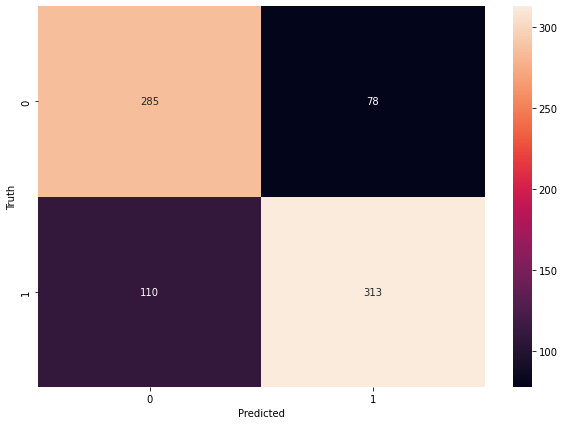

In [98]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=y_test,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [99]:
y_pred=pd.DataFrame(y_pred)

In [100]:
X_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_ann_9mon.xlsx")
y_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_ann_9mon.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_ann_9mon.xlsx")

In [101]:
df_x=X[3718:]
df_y=y[3718:]

In [102]:
yp = model.predict(df_x)
yp[:5]

array([[0.9991808 ],
       [0.8318671 ],
       [0.92316985],
       [0.9999844 ],
       [0.99996614]], dtype=float32)

In [103]:
y_pred1 = []
for element in yp:
    if element > 0.5:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [104]:
y_pred1[:10]

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

In [105]:
df_y[:10]

3720    0
3721    0
3722    1
3723    1
3724    1
3725    1
3726    1
3727    1
3728    1
3729    1
Name: Result, dtype: int64

In [106]:
y_pred1=pd.DataFrame(y_pred1)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_ann_9mon_test.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_ann_9mon_test.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_ann_9mon_test.xlsx")

In [107]:
# 12 months

In [108]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
%matplotlib inline

In [109]:
df = pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/12_months.csv")
df.sample(5)

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result15
2219,T T LTD.-$,TTL,8113,486780.0,0,0.00,8113,486780.00,60.00,04-01-2019,...,-6.86,0.05,52.0,24.0,-76.0,-6.0,-8.37,Textiles - Products,LOSS,LOSS
1974,K.M.SUGAR MILLS LTD.,KMSUGAR,546973,4406591.0,25601,204808.00,521372,4201783.00,8.06,02-01-2019,...,2.05,0.20,72.0,-11.0,-58.0,29.0,3.80,Sugar,PROFIT,LOSS
1008,S.P. Apparels Ltd,SPAL,15921,6077650.3,8921,3400471.97,7000,2677178.33,382.45,01-01-2018,...,21.30,0.22,26.0,-116.0,92.0,87.0,19.03,Textiles - Products,LOSS,LOSS
1880,GYSCOAL ALLOYS LTD.,GAL,130092,935510.0,30000,203649.00,100092,731861.00,7.31,01-01-2019,...,-1.13,-0.07,20.0,-2.0,-19.0,-21.0,-30.74,Steel - Medium / Small,PROFIT,PROFIT
2063,JBF INDUSTRIES LTD.,JBFIND,58949,973371.0,0,0.00,58949,973371.00,16.51,03-01-2019,...,-15.00,0.04,-418.0,-377.0,783.0,-162.0,-1.31,Textiles - Manmade,LOSS,LOSS


In [110]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3802 entries, 0 to 3801
Data columns (total 32 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Row Labels             3802 non-null   object 
 1   Symbol                 3802 non-null   object 
 2   No of Shares Bought    3802 non-null   int64  
 3   Value of purchase      3802 non-null   float64
 4   No of shares sold      3802 non-null   int64  
 5   Value of sale          3800 non-null   float64
 6   No of shares           3802 non-null   int64  
 7   Value                  3802 non-null   float64
 8   Avg Price              3802 non-null   float64
 9   Buy Date               3802 non-null   object 
 10  Sell date              3802 non-null   object 
 11  Buy price              3802 non-null   float64
 12  Sell price             3802 non-null   float64
 13  Nifty Index at buying  3802 non-null   float64
 14  Nfty index at selling  3802 non-null   float64
 15  Chan

In [111]:
df.drop('Row Labels',axis=1,inplace=True)
#df.drop('Symbol',axis=1,inplace=True)
df.drop('Return',axis=1,inplace=True)
df.drop('Sell price',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)
df.drop('Buy Date',axis=1,inplace=True)
df.drop('Sell date',axis=1,inplace=True)
df.drop('Result15',axis=1,inplace=True)

In [112]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3802 entries, 0 to 3801
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Symbol                 3802 non-null   object 
 1   No of Shares Bought    3802 non-null   int64  
 2   Value of purchase      3802 non-null   float64
 3   No of shares sold      3802 non-null   int64  
 4   Value of sale          3800 non-null   float64
 5   No of shares           3802 non-null   int64  
 6   Value                  3802 non-null   float64
 7   Avg Price              3802 non-null   float64
 8   Buy price              3802 non-null   float64
 9   Nifty Index at buying  3802 non-null   float64
 10  Nfty index at selling  3802 non-null   float64
 11  No of shares.1         3802 non-null   int64  
 12  Market Cap             3802 non-null   float64
 13  %age of Marketcap      3802 non-null   float64
 14  Cap                    3802 non-null   object 
 15  Devi

In [113]:
df['code'] = pd.factorize(df['Symbol'])[0] + 1

In [114]:
df['code']

0         1
1         2
2         3
3         4
4         5
       ... 
3797    397
3798    384
3799    491
3800    411
3801     31
Name: code, Length: 3802, dtype: int64

In [115]:
df.drop('Symbol',axis=1,inplace=True)

In [116]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result']=df['Result'].map(r)

In [117]:
df['Result']

0       1
1       1
2       0
3       0
4       1
       ..
3797    1
3798    1
3799    1
3800    0
3801    1
Name: Result, Length: 3802, dtype: int64

In [118]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3802 entries, 0 to 3801
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   No of Shares Bought    3802 non-null   int64  
 1   Value of purchase      3802 non-null   float64
 2   No of shares sold      3802 non-null   int64  
 3   Value of sale          3800 non-null   float64
 4   No of shares           3802 non-null   int64  
 5   Value                  3802 non-null   float64
 6   Avg Price              3802 non-null   float64
 7   Buy price              3802 non-null   float64
 8   Nifty Index at buying  3802 non-null   float64
 9   Nfty index at selling  3802 non-null   float64
 10  No of shares.1         3802 non-null   int64  
 11  Market Cap             3802 non-null   float64
 12  %age of Marketcap      3802 non-null   float64
 13  Cap                    3802 non-null   int64  
 14  Deviation              3802 non-null   float64
 15  EPS 

In [119]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            2
No of shares             0
Value                    0
Avg Price                0
Buy price                0
Nifty Index at buying    0
Nfty index at selling    0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Result                   0
code                     0
dtype: int64
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            0
No of shares             0
Value                    0
Avg Price                0
Buy price                0
Nifty Index at buying    0
Nfty index at selling    0
No of shares.1           0
Market Cap     

In [120]:
cols_to_scale=['No of Shares Bought','Value of purchase','No of shares sold','Value of sale','No of shares','Value','Avg Price','Buy price','Nifty Index at buying','Nfty index at selling','No of shares.1','Market Cap','%age of Marketcap','Deviation','EPS','ROE','COA','CIA','CFA','PBT','PE','Industry','code']
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df[cols_to_scale] = scaler.fit_transform(df[cols_to_scale])

In [121]:
df.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,code
0,0.000333,0.000002,0.0,0.0,0.000333,0.000002,0.000004,0.001078,0.083904,0.095447,...,0.036400,0.178030,0.504167,0.869876,0.416881,0.438885,0.702581,0.000000,1,0.000000
1,0.000100,0.000472,0.0,0.0,0.000100,0.000472,0.002446,0.180073,0.083904,0.095447,...,0.049141,0.208333,0.505860,0.868413,0.415264,0.442086,0.704055,0.010526,1,0.001642
2,0.076195,0.000590,0.0,0.0,0.076198,0.000591,0.000004,0.001550,0.476846,0.441966,...,0.035082,0.162879,0.519492,0.840871,0.421233,0.410258,0.702048,0.021053,0,0.003284
3,0.019868,0.000278,0.0,0.0,0.019868,0.000278,0.000007,0.000493,0.083904,0.095447,...,0.035927,0.164773,0.504271,0.870008,0.416468,0.438778,0.715401,0.031579,0,0.004926
4,0.005643,0.002854,0.0,0.0,0.005643,0.002857,0.000263,0.016330,0.083904,0.095447,...,0.037457,0.200758,0.506555,0.865890,0.416735,0.443021,0.703668,0.042105,1,0.006568


In [122]:
X = df.drop('Result',axis='columns')
y = df['Result']

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=5)

In [123]:
X_train.shape

(3040, 24)

In [124]:
X_test.shape

(760, 24)

In [125]:
X_train[:10]

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
851,0.000270,0.000193,0.0,0.0,0.000270,0.000193,0.000371,0.020125,0.204170,0.093065,...,1.175712e-07,0.037902,0.202652,0.507689,0.853445,0.428330,0.442909,0.703607,0.694737,0.415435
1773,0.017792,0.003939,0.0,0.0,0.017793,0.003943,0.000115,0.000761,0.124788,0.079997,...,1.436981e-08,0.036007,0.176136,0.506748,0.868219,0.413761,0.442756,0.703455,0.231579,0.195402
149,0.000043,0.000019,0.0,0.0,0.000043,0.000019,0.000229,0.014904,0.038779,0.115782,...,1.410854e-07,0.036167,0.174242,0.504507,0.869931,0.416057,0.438824,0.710198,0.273684,0.070608
1416,0.000216,0.000031,0.0,0.0,0.000216,0.000031,0.000075,0.005395,0.194871,0.069895,...,1.541489e-07,0.036063,0.179924,0.504360,0.869977,0.416328,0.438793,0.707283,0.389474,0.215107
3564,0.001491,0.000098,0.0,0.0,0.001492,0.000098,0.000034,0.002992,0.151770,0.264302,...,1.894202e-07,0.036071,0.160985,0.503822,0.869904,0.417007,0.439068,0.704907,0.073684,0.254516
2820,0.000625,0.000298,0.0,0.0,0.000625,0.000298,0.000248,0.015120,0.112747,0.129469,...,1.319410e-07,0.036983,0.172348,0.504475,0.869434,0.416714,0.438915,0.704137,0.273684,0.070608
2829,0.000042,0.000021,0.0,0.0,0.000042,0.000021,0.000257,0.017432,0.112747,0.129469,...,1.463108e-07,0.037645,0.176136,0.504522,0.869710,0.416307,0.438935,0.703601,0.063158,0.645320
1467,0.001297,0.000276,0.0,0.0,0.001297,0.000276,0.000111,0.005810,0.206230,0.066456,...,1.136521e-07,0.036048,0.185606,0.500185,0.869398,0.425752,0.439586,0.708296,0.000000,0.587849
2977,0.000378,0.000048,0.0,0.0,0.000378,0.000048,0.000066,0.003276,0.000000,0.169252,...,1.084268e-07,0.035572,0.160985,0.504454,0.869830,0.416485,0.438692,0.701074,0.284211,0.582923
455,0.211351,0.185836,0.0,0.0,0.211360,0.186016,0.000457,0.023294,0.233159,0.246300,...,1.097331e-07,0.036830,0.181818,0.518943,0.831610,0.406560,0.459178,0.705617,0.126316,0.292282


In [126]:
len(X_train.columns)

24

In [127]:
#ANN in tensorflow/keras

import tensorflow as tf
from tensorflow import keras


model = keras.Sequential([
    keras.layers.Dense(24, input_shape=(24,), activation='relu'),
    keras.layers.Dense(15, activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')
])

opt = keras.optimizers.Adam(learning_rate=0.01)

model.compile(optimizer=opt,
              loss='binary_crossentropy',
              metrics=['accuracy'])

model.fit(X_train, y_train, epochs=500)

Epoch 1/500
95/95 [==============================] - 0s 724us/step - loss: 0.6403 - accuracy: 0.6280
Epoch 2/500
95/95 [==============================] - 0s 672us/step - loss: 0.5178 - accuracy: 0.7454
Epoch 3/500
95/95 [==============================] - 0s 588us/step - loss: 0.4991 - accuracy: 0.7559
Epoch 4/500
95/95 [==============================] - 0s 630us/step - loss: 0.4892 - accuracy: 0.7638
Epoch 5/500
95/95 [==============================] - 0s 609us/step - loss: 0.4928 - accuracy: 0.7641
Epoch 6/500
95/95 [==============================] - 0s 609us/step - loss: 0.4873 - accuracy: 0.7651
Epoch 7/500
95/95 [==============================] - 0s 651us/step - loss: 0.4798 - accuracy: 0.7688
Epoch 8/500
95/95 [==============================] - 0s 619us/step - loss: 0.4752 - accuracy: 0.7714
Epoch 9/500
95/95 [==============================] - 0s 640us/step - loss: 0.4788 - accuracy: 0.7743
Epoch 10/500
95/95 [==============================] - 0s 756us/step - loss: 0.4878 - accura

95/95 [==============================] - 0s 665us/step - loss: 0.4147 - accuracy: 0.8069
Epoch 158/500
95/95 [==============================] - 0s 661us/step - loss: 0.4156 - accuracy: 0.80390s - loss: 0.4103 - accuracy: 0.80
Epoch 159/500
95/95 [==============================] - 0s 661us/step - loss: 0.4161 - accuracy: 0.8016
Epoch 160/500
95/95 [==============================] - 0s 640us/step - loss: 0.4166 - accuracy: 0.8026
Epoch 161/500
95/95 [==============================] - 0s 653us/step - loss: 0.4185 - accuracy: 0.7970
Epoch 162/500
95/95 [==============================] - 0s 651us/step - loss: 0.4132 - accuracy: 0.8039
Epoch 163/500
95/95 [==============================] - 0s 651us/step - loss: 0.4177 - accuracy: 0.7984
Epoch 164/500
95/95 [==============================] - 0s 640us/step - loss: 0.4134 - accuracy: 0.8076
Epoch 165/500
95/95 [==============================] - 0s 640us/step - loss: 0.4191 - accuracy: 0.8039
Epoch 166/500
95/95 [==============================] 

Epoch 313/500
95/95 [==============================] - 0s 661us/step - loss: 0.3996 - accuracy: 0.8079
Epoch 314/500
95/95 [==============================] - 0s 651us/step - loss: 0.3980 - accuracy: 0.8089
Epoch 315/500
95/95 [==============================] - 0s 651us/step - loss: 0.3937 - accuracy: 0.8092
Epoch 316/500
95/95 [==============================] - 0s 649us/step - loss: 0.4008 - accuracy: 0.8056
Epoch 317/500
95/95 [==============================] - 0s 651us/step - loss: 0.3974 - accuracy: 0.8105
Epoch 318/500
95/95 [==============================] - 0s 630us/step - loss: 0.3945 - accuracy: 0.8102
Epoch 319/500
95/95 [==============================] - 0s 630us/step - loss: 0.3986 - accuracy: 0.8089
Epoch 320/500
95/95 [==============================] - 0s 651us/step - loss: 0.3948 - accuracy: 0.8095
Epoch 321/500
95/95 [==============================] - 0s 619us/step - loss: 0.4021 - accuracy: 0.8066
Epoch 322/500
95/95 [==============================] - 0s 630us/step - lo

95/95 [==============================] - 0s 639us/step - loss: 0.3828 - accuracy: 0.8263
Epoch 469/500
95/95 [==============================] - 0s 651us/step - loss: 0.3814 - accuracy: 0.8155
Epoch 470/500
95/95 [==============================] - 0s 619us/step - loss: 0.3818 - accuracy: 0.8194
Epoch 471/500
95/95 [==============================] - 0s 640us/step - loss: 0.3925 - accuracy: 0.8135
Epoch 472/500
95/95 [==============================] - 0s 641us/step - loss: 0.3855 - accuracy: 0.8181
Epoch 473/500
95/95 [==============================] - 0s 630us/step - loss: 0.3847 - accuracy: 0.8184
Epoch 474/500
95/95 [==============================] - 0s 630us/step - loss: 0.3878 - accuracy: 0.8158
Epoch 475/500
95/95 [==============================] - 0s 651us/step - loss: 0.3864 - accuracy: 0.8197
Epoch 476/500
95/95 [==============================] - 0s 651us/step - loss: 0.3897 - accuracy: 0.8099
Epoch 477/500
95/95 [==============================] - 0s 639us/step - loss: 0.3802 - a

In [128]:
model.evaluate(X_test, y_test)

24/24 [==============================] - 0s 582us/step - loss: 0.5745 - accuracy: 0.7750


[0.5745062828063965, 0.7749999761581421]

In [129]:
yp = model.predict(X_test)
yp[:5]

array([[0.99654365],
       [0.5284029 ],
       [0.5901295 ],
       [0.99586606],
       [0.09342149]], dtype=float32)

In [130]:
y_pred = []
for element in yp:
    if element > 0.5:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [131]:
y_pred[:10]

[1, 1, 1, 1, 0, 0, 1, 1, 0, 0]

In [132]:
y_test[:10]

3258    1
955     0
2608    0
639     1
1490    0
1630    1
396     1
2792    0
1877    0
1238    0
Name: Result, dtype: int64

In [133]:
from sklearn.metrics import confusion_matrix , classification_report

print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.73      0.76      0.74       324
           1       0.81      0.79      0.80       436

    accuracy                           0.78       760
   macro avg       0.77      0.77      0.77       760
weighted avg       0.78      0.78      0.78       760



Text(69.0, 0.5, 'Truth')

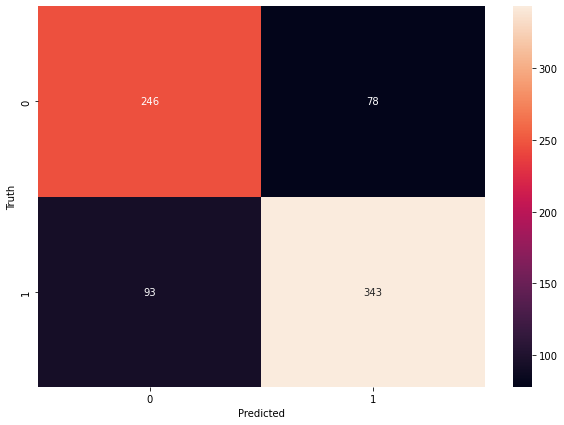

In [134]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=y_test,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [135]:
y_pred=pd.DataFrame(y_pred)

In [136]:
X_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_ann_12mon.xlsx")
y_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_ann_12mon.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_ann_12mon.xlsx")

In [137]:
df_x=X[3508:]
df_y=y[3508:]

In [138]:
yp = model.predict(df_x)
yp[:5]

array([[0.99992657],
       [0.9987323 ],
       [0.9984027 ],
       [1.        ],
       [0.95757663]], dtype=float32)

In [139]:
y_pred1 = []
for element in yp:
    if element > 0.5:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [140]:
y_pred1[:10]

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

In [141]:
df_y[:10]

3510    1
3511    1
3512    1
3513    1
3514    1
3515    1
3516    1
3517    1
3518    1
3519    1
Name: Result, dtype: int64

In [142]:
y_pred1=pd.DataFrame(y_pred1)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_ann_12mon_test.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_ann_12mon_test.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_ann_12mon_test.xlsx")

In [143]:
# 2 months 5%

In [144]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
%matplotlib inline

In [145]:
df = pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/2 month.csv")
df.sample(5)

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result5
1336,ONWARD TECHNOLOGIES LTD.,ONWARDTEC,66098,5497291.64,0,0.0,66098,5497291.64,83.17,07-01-2018,...,4.32,0.15,16.00,-5.00,-10.00,8.00,17.09,Computers - Software - Medium / Small,LOSS,LOSS
449,Adroit Infotech Ltd,ADROITINFO,60000,4000950.00,0,0.0,60000,4000950.00,66.68,12-01-2016,...,1.14,0.10,8.47,-7.32,-1.29,1.98,53.42,Computers - Software - Medium / Small,PROFIT,PROFIT
3475,Shree Pushkar Chemicals & Fertilisers Ltd,SHREEPUSHK,377950,40979379.00,0,0.0,377950,40979379.00,108.43,10-01-2020,...,11.58,0.12,76.00,-61.00,-14.00,40.00,10.25,Dyes And Pigments,LOSS,LOSS
4156,Genus Paper & Boards Ltd,GENUSPAPER,11000,118078.00,0,0.0,11000,118078.00,10.73,12-01-2021,...,0.30,0.03,50.00,-29.00,20.00,10.00,34.17,Paper,PROFIT,PROFIT
3355,JAMNA AUTO INDUSTRIES LTD.,JAMNAAUTO,1280258,50708018.00,0,0.0,1280258,50708018.00,39.61,09-01-2020,...,1.20,0.15,-1.00,-97.00,80.00,72.00,34.92,Auto Ancillaries,PROFIT,LOSS


In [146]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4241 entries, 0 to 4240
Data columns (total 32 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Row Labels             4241 non-null   object 
 1   Symbol                 4241 non-null   object 
 2   No of Shares Bought    4241 non-null   int64  
 3   Value of purchase      4241 non-null   float64
 4   No of shares sold      4241 non-null   int64  
 5   Value of sale          4241 non-null   float64
 6   No of shares           4241 non-null   int64  
 7   Value                  4241 non-null   float64
 8   Avg Price              4241 non-null   float64
 9   Buy Date               4241 non-null   object 
 10  Sell date              4241 non-null   object 
 11  Buy price              4241 non-null   float64
 12  Sell price             4241 non-null   float64
 13  Nifty Index at buying  4241 non-null   float64
 14  Nfty index at selling  4241 non-null   float64
 15  Chan

In [147]:
df.drop('Row Labels',axis=1,inplace=True)
#df.drop('Symbol',axis=1,inplace=True)
df.drop('Return',axis=1,inplace=True)
df.drop('Sell price',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)
df.drop('Buy Date',axis=1,inplace=True)
df.drop('Sell date',axis=1,inplace=True)
df.drop('Result',axis=1,inplace=True)

In [148]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4241 entries, 0 to 4240
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Symbol                 4241 non-null   object 
 1   No of Shares Bought    4241 non-null   int64  
 2   Value of purchase      4241 non-null   float64
 3   No of shares sold      4241 non-null   int64  
 4   Value of sale          4241 non-null   float64
 5   No of shares           4241 non-null   int64  
 6   Value                  4241 non-null   float64
 7   Avg Price              4241 non-null   float64
 8   Buy price              4241 non-null   float64
 9   Nifty Index at buying  4241 non-null   float64
 10  Nfty index at selling  4241 non-null   float64
 11  No of shares.1         4241 non-null   int64  
 12  Market Cap             4241 non-null   float64
 13  %age of Marketcap      4241 non-null   float64
 14  Cap                    4241 non-null   object 
 15  Devi

In [149]:
df['code'] = pd.factorize(df['Symbol'])[0] + 1

In [150]:
df['code']

0         1
1         2
2         3
3         4
4         5
       ... 
4236    566
4237    626
4238    448
4239    153
4240    100
Name: code, Length: 4241, dtype: int64

In [151]:
df.drop('Symbol',axis=1,inplace=True)

In [152]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result5']=df['Result5'].map(r)

In [153]:
df['Result5']

0       1
1       0
2       1
3       1
4       1
       ..
4236    0
4237    0
4238    0
4239    0
4240    0
Name: Result5, Length: 4241, dtype: int64

In [154]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4241 entries, 0 to 4240
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   No of Shares Bought    4241 non-null   int64  
 1   Value of purchase      4241 non-null   float64
 2   No of shares sold      4241 non-null   int64  
 3   Value of sale          4241 non-null   float64
 4   No of shares           4241 non-null   int64  
 5   Value                  4241 non-null   float64
 6   Avg Price              4241 non-null   float64
 7   Buy price              4241 non-null   float64
 8   Nifty Index at buying  4241 non-null   float64
 9   Nfty index at selling  4241 non-null   float64
 10  No of shares.1         4241 non-null   int64  
 11  Market Cap             4241 non-null   float64
 12  %age of Marketcap      4241 non-null   float64
 13  Cap                    4241 non-null   int64  
 14  Deviation              4241 non-null   float64
 15  EPS 

In [155]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            0
No of shares             0
Value                    0
Avg Price                0
Buy price                0
Nifty Index at buying    0
Nfty index at selling    0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Result5                  0
code                     0
dtype: int64
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            0
No of shares             0
Value                    0
Avg Price                0
Buy price                0
Nifty Index at buying    0
Nfty index at selling    0
No of shares.1           0
Market Cap     

In [156]:
cols_to_scale=['No of Shares Bought','Value of purchase','No of shares sold','Value of sale','No of shares','Value','Avg Price','Buy price','Nifty Index at buying','Nfty index at selling','No of shares.1','Market Cap','%age of Marketcap','Deviation','EPS','ROE','COA','CIA','CFA','PBT','PE','Industry','code']
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df[cols_to_scale] = scaler.fit_transform(df[cols_to_scale])

In [157]:
df.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result5,code
0,0.000333,0.000002,0.0,0.0,0.000333,0.000002,0.000004,0.000940,0.061711,0.072551,...,0.005955,0.178030,0.504167,0.869876,0.416881,0.438885,0.702581,0.000000,1,0.000000
1,0.000100,0.000472,0.0,0.0,0.000100,0.000472,0.002446,0.157032,0.061711,0.072551,...,0.008039,0.208333,0.505860,0.868413,0.415264,0.442086,0.704055,0.010417,0,0.001585
2,0.076195,0.000590,0.0,0.0,0.076198,0.000591,0.000004,0.001351,0.350718,0.358562,...,0.005739,0.162879,0.519492,0.840871,0.421233,0.410258,0.702048,0.020833,1,0.003170
3,0.019868,0.000278,0.0,0.0,0.019868,0.000278,0.000007,0.000430,0.061711,0.072551,...,0.005877,0.164773,0.504271,0.870008,0.416468,0.438778,0.715401,0.031250,1,0.004754
4,0.005643,0.002854,0.0,0.0,0.005643,0.002857,0.000263,0.014241,0.061711,0.072551,...,0.006128,0.200758,0.506555,0.865890,0.416735,0.443021,0.703668,0.041667,1,0.006339


In [158]:
X = df.drop('Result5',axis='columns')
y = df['Result5']

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=5)

In [159]:
X_train.shape

(3392, 24)

In [160]:
X_test.shape

(849, 24)

In [161]:
X_train[:10]

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
2336,0.001255,0.000073,0.000000,0.000000,0.001255,0.000073,0.000030,0.001361,0.096823,0.066456,...,2.712669e-08,0.003409,0.159091,0.505431,0.869913,0.414210,0.429119,0.702275,0.541667,0.714739
3321,0.012374,0.001358,0.080599,0.035611,0.000184,0.000020,0.000057,0.017039,0.440094,0.500488,...,1.779006e-07,0.006024,0.185606,0.509126,0.870051,0.405631,0.442706,0.705106,0.072917,0.786054
2965,0.001740,0.002559,0.000000,0.000000,0.001740,0.002561,0.000764,0.040990,0.000000,0.017224,...,3.217351e-08,0.006364,0.196970,0.504339,0.869471,0.416944,0.439342,0.704335,0.395833,0.123613
4210,0.000002,0.000005,0.000000,0.000000,0.000002,0.000005,0.001335,0.073322,0.286047,0.228063,...,3.280436e-08,0.006754,0.187500,0.504423,0.869701,0.416506,0.439748,0.704323,0.156250,0.473851
3542,0.000057,0.000004,0.000000,0.000000,0.000057,0.000004,0.000035,0.001886,0.081280,0.129469,...,3.280436e-08,0.005984,0.189394,0.504324,0.870033,0.416422,0.438946,0.702718,0.375000,0.618067
2558,0.000562,0.000050,0.000000,0.000000,0.000562,0.000050,0.000046,0.002273,0.074318,0.081723,...,2.965010e-08,0.005951,0.147727,0.497066,0.877240,0.421807,0.441252,0.703032,0.000000,0.557845
1481,0.000135,0.000061,0.000000,0.000000,0.000135,0.000061,0.000232,0.013047,0.151681,0.091781,...,3.375064e-08,0.006131,0.204545,0.504413,0.869480,0.416401,0.439860,0.703534,0.229167,0.497623
517,0.001717,0.000237,0.000000,0.000000,0.001717,0.000238,0.000072,0.002621,0.081258,0.115782,...,2.176443e-08,0.005889,0.172348,0.503378,0.870530,0.417789,0.439169,0.707381,0.072917,0.174326
3536,0.000111,0.000005,0.000000,0.000000,0.000111,0.000005,0.000021,0.000985,0.081280,0.129469,...,2.775754e-08,0.005378,0.081439,0.504261,0.869948,0.416558,0.438693,0.702240,0.114583,0.740095
3712,0.000005,0.000039,0.000000,0.000000,0.000005,0.000039,0.004327,0.208138,0.646059,0.750433,...,2.870382e-08,0.007609,0.204545,0.505912,0.868578,0.415055,0.441710,0.705212,0.875000,0.779715


In [162]:
len(X_train.columns)

24

In [163]:
#ANN in tensorflow/keras

import tensorflow as tf
from tensorflow import keras


model = keras.Sequential([
    keras.layers.Dense(24, input_shape=(24,), activation='relu'),
    keras.layers.Dense(15, activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')
])

opt = keras.optimizers.Adam(learning_rate=0.01)

model.compile(optimizer=opt,
              loss='binary_crossentropy',
              metrics=['accuracy'])

model.fit(X_train, y_train, epochs=500)

Epoch 1/500
106/106 [==============================] - 0s 677us/step - loss: 0.6822 - accuracy: 0.5772
Epoch 2/500
106/106 [==============================] - 0s 753us/step - loss: 0.6791 - accuracy: 0.5828
Epoch 3/500
106/106 [==============================] - 0s 687us/step - loss: 0.6785 - accuracy: 0.5814
Epoch 4/500
106/106 [==============================] - 0s 687us/step - loss: 0.6772 - accuracy: 0.5814
Epoch 5/500
106/106 [==============================] - 0s 743us/step - loss: 0.6755 - accuracy: 0.5731
Epoch 6/500
106/106 [==============================] - 0s 696us/step - loss: 0.6729 - accuracy: 0.5825
Epoch 7/500
106/106 [==============================] - 0s 706us/step - loss: 0.6690 - accuracy: 0.5793
Epoch 8/500
106/106 [==============================] - 0s 621us/step - loss: 0.6620 - accuracy: 0.5985
Epoch 9/500
106/106 [==============================] - 0s 593us/step - loss: 0.6521 - accuracy: 0.6079
Epoch 10/500
106/106 [==============================] - 0s 593us/step - l

106/106 [==============================] - 0s 668us/step - loss: 0.5462 - accuracy: 0.7061
Epoch 158/500
106/106 [==============================] - 0s 671us/step - loss: 0.5486 - accuracy: 0.7049
Epoch 159/500
106/106 [==============================] - 0s 648us/step - loss: 0.5427 - accuracy: 0.7140
Epoch 160/500
106/106 [==============================] - 0s 638us/step - loss: 0.5543 - accuracy: 0.6993
Epoch 161/500
106/106 [==============================] - 0s 668us/step - loss: 0.5420 - accuracy: 0.7096
Epoch 162/500
106/106 [==============================] - 0s 640us/step - loss: 0.5533 - accuracy: 0.6999
Epoch 163/500
106/106 [==============================] - 0s 649us/step - loss: 0.5465 - accuracy: 0.7075
Epoch 164/500
106/106 [==============================] - 0s 668us/step - loss: 0.5442 - accuracy: 0.7025
Epoch 165/500
106/106 [==============================] - 0s 649us/step - loss: 0.5423 - accuracy: 0.7073
Epoch 166/500
106/106 [==============================] - 0s 639us/ste

106/106 [==============================] - 0s 640us/step - loss: 0.5343 - accuracy: 0.7143
Epoch 312/500
106/106 [==============================] - 0s 650us/step - loss: 0.5347 - accuracy: 0.7126
Epoch 313/500
106/106 [==============================] - 0s 630us/step - loss: 0.5312 - accuracy: 0.7161
Epoch 314/500
106/106 [==============================] - 0s 621us/step - loss: 0.5430 - accuracy: 0.7087
Epoch 315/500
106/106 [==============================] - 0s 630us/step - loss: 0.5422 - accuracy: 0.7126
Epoch 316/500
106/106 [==============================] - 0s 659us/step - loss: 0.5333 - accuracy: 0.7143
Epoch 317/500
106/106 [==============================] - 0s 640us/step - loss: 0.5439 - accuracy: 0.7049
Epoch 318/500
106/106 [==============================] - 0s 644us/step - loss: 0.5326 - accuracy: 0.7167
Epoch 319/500
106/106 [==============================] - 0s 659us/step - loss: 0.5340 - accuracy: 0.7081
Epoch 320/500
106/106 [==============================] - 0s 649us/ste

106/106 [==============================] - 0s 640us/step - loss: 0.5273 - accuracy: 0.7155
Epoch 467/500
106/106 [==============================] - 0s 649us/step - loss: 0.5298 - accuracy: 0.7134
Epoch 468/500
106/106 [==============================] - 0s 668us/step - loss: 0.5292 - accuracy: 0.7202
Epoch 469/500
106/106 [==============================] - 0s 667us/step - loss: 0.5280 - accuracy: 0.7126
Epoch 470/500
106/106 [==============================] - 0s 687us/step - loss: 0.5272 - accuracy: 0.7176
Epoch 471/500
106/106 [==============================] - 0s 734us/step - loss: 0.5284 - accuracy: 0.7208
Epoch 472/500
106/106 [==============================] - 0s 724us/step - loss: 0.5305 - accuracy: 0.7226
Epoch 473/500
106/106 [==============================] - 0s 715us/step - loss: 0.5376 - accuracy: 0.7140
Epoch 474/500
106/106 [==============================] - 0s 734us/step - loss: 0.5321 - accuracy: 0.7123
Epoch 475/500
106/106 [==============================] - 0s 724us/ste

In [164]:
model.evaluate(X_test, y_test)

27/27 [==============================] - 0s 554us/step - loss: 0.8143 - accuracy: 0.6855


[0.8142682909965515, 0.685512363910675]

In [165]:
yp = model.predict(X_test)
yp[:5]

array([[0.01125351],
       [0.5053849 ],
       [0.39782518],
       [0.45488998],
       [0.49974403]], dtype=float32)

In [166]:
y_pred = []
for element in yp:
    if element > 0.5:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [167]:
y_pred[:10]

[0, 1, 0, 0, 0, 0, 0, 1, 1, 1]

In [168]:
y_test[:10]

1203    0
3738    0
621     1
4037    0
3337    0
1761    0
1321    0
2007    1
3254    1
3316    1
Name: Result5, dtype: int64

In [169]:
from sklearn.metrics import confusion_matrix , classification_report

print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.72      0.73      0.72       477
           1       0.64      0.63      0.64       372

    accuracy                           0.69       849
   macro avg       0.68      0.68      0.68       849
weighted avg       0.68      0.69      0.69       849



Text(69.0, 0.5, 'Truth')

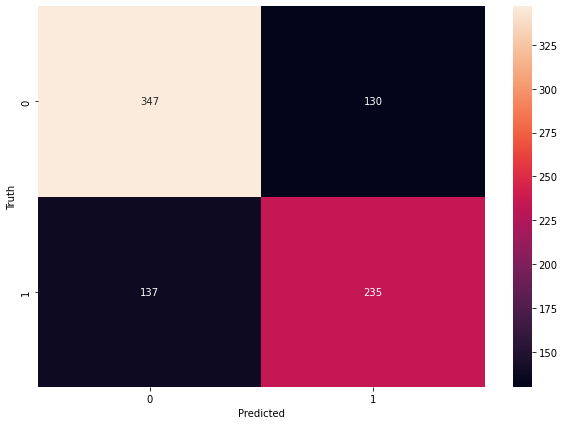

In [170]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=y_test,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [171]:
y_pred=pd.DataFrame(y_pred)

In [172]:
X_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_ann_2mon_5.xlsx")
y_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_ann_2mon_5.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_ann_2mon_5.xlsx")

In [173]:
df_x=X[3990:]
df_y=y[3990:]

In [174]:
yp = model.predict(df_x)
yp[:5]

array([[0.47200972],
       [1.        ],
       [0.0336363 ],
       [0.5595603 ],
       [0.5649763 ]], dtype=float32)

In [175]:
y_pred1 = []
for element in yp:
    if element > 0.5:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [176]:
y_pred1[:10]

[0, 1, 0, 1, 1, 1, 0, 0, 0, 1]

In [177]:
df_y[:10]

3990    1
3991    1
3992    0
3993    1
3994    1
3995    1
3996    0
3997    0
3998    0
3999    1
Name: Result5, dtype: int64

In [178]:
y_pred1=pd.DataFrame(y_pred1)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_ann_2mon_test_5.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_ann_2mon_test_5.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_ann_2mon_test_5.xlsx")

In [179]:
# 6 months 10%

In [180]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
%matplotlib inline

In [181]:
df = pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/6 months.csv")
df.sample(5)

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result10
2452,Axiscades Technologies Ltd,AXISCADES,142000,8737665.0,0,0.0,142000,8737665.0,61.53,09-01-2019,...,-2.15,0.01,37.0,-13.0,-7.0,-8.0,-29.60,Computers - Software - Medium / Small,LOSS,LOSS
1441,SEQUENT SCIENTIFIC LTD.,SEQUENT,50000,2610920.0,0,0.0,50000,2610920.0,52.22,08-01-2018,...,17.30,0.41,45.0,7.0,-57.0,444.0,3.27,Pharmaceuticals - Indian - Bulk Drugs,PROFIT,PROFIT
3737,RAJESH EXPORTS LTD.,RAJESHEXPO,5000,2427500.0,0,0.0,5000,2427500.0,485.50,02-01-2021,...,40.84,0.11,2572.0,324.0,-5172.0,1261.0,11.69,Diamond Cutting / Jewellery,PROFIT,PROFIT
841,ELECTROTHERM (INDIA) LTD.,ELECTHERM,44600,9965755.8,0,0.0,44600,9965755.8,223.45,10-01-2017,...,-71.62,-0.04,58.0,-25.0,-52.0,-91.0,-3.30,Steel - Medium / Small,LOSS,LOSS
684,MAN INFRACONSTRUCTION LTD.,MANINFRA,200000,11708050.0,0,0.0,200000,11708050.0,58.54,06-01-2017,...,1.43,0.16,94.0,-59.0,-17.0,112.0,28.13,Construction,PROFIT,LOSS


In [182]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4071 entries, 0 to 4070
Data columns (total 32 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Row Labels             4071 non-null   object 
 1   Symbol                 4071 non-null   object 
 2   No of Shares Bought    4071 non-null   int64  
 3   Value of purchase      4071 non-null   float64
 4   No of shares sold      4071 non-null   int64  
 5   Value of sale          4069 non-null   float64
 6   No of shares           4071 non-null   int64  
 7   Value                  4071 non-null   float64
 8   Avg Price              4071 non-null   float64
 9   Buy Date               4071 non-null   object 
 10  Sell date              4071 non-null   object 
 11  Buy price              4071 non-null   float64
 12  Sell price             4071 non-null   float64
 13  Nifty Index at buying  4071 non-null   float64
 14  Nfty index at selling  4071 non-null   float64
 15  Chan

In [183]:
df.drop('Row Labels',axis=1,inplace=True)
#df.drop('Symbol',axis=1,inplace=True)
df.drop('Return',axis=1,inplace=True)
df.drop('Sell price',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)
df.drop('Buy Date',axis=1,inplace=True)
df.drop('Sell date',axis=1,inplace=True)
df.drop('Result',axis=1,inplace=True)

In [184]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4071 entries, 0 to 4070
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Symbol                 4071 non-null   object 
 1   No of Shares Bought    4071 non-null   int64  
 2   Value of purchase      4071 non-null   float64
 3   No of shares sold      4071 non-null   int64  
 4   Value of sale          4069 non-null   float64
 5   No of shares           4071 non-null   int64  
 6   Value                  4071 non-null   float64
 7   Avg Price              4071 non-null   float64
 8   Buy price              4071 non-null   float64
 9   Nifty Index at buying  4071 non-null   float64
 10  Nfty index at selling  4071 non-null   float64
 11  No of shares.1         4071 non-null   int64  
 12  Market Cap             4071 non-null   float64
 13  %age of Marketcap      4071 non-null   float64
 14  Cap                    4071 non-null   object 
 15  Devi

In [185]:
df['code'] = pd.factorize(df['Symbol'])[0] + 1

In [186]:
df['code']

0         1
1         2
2         3
3         4
4         5
       ... 
4066    628
4067    344
4068    629
4069    293
4070    619
Name: code, Length: 4071, dtype: int64

In [187]:
df.drop('Symbol',axis=1,inplace=True)

In [188]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result10']=df['Result10'].map(r)

In [189]:
df['Result10']

0       0
1       0
2       0
3       0
4       1
       ..
4066    1
4067    0
4068    0
4069    0
4070    0
Name: Result10, Length: 4071, dtype: int64

In [190]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4071 entries, 0 to 4070
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   No of Shares Bought    4071 non-null   int64  
 1   Value of purchase      4071 non-null   float64
 2   No of shares sold      4071 non-null   int64  
 3   Value of sale          4069 non-null   float64
 4   No of shares           4071 non-null   int64  
 5   Value                  4071 non-null   float64
 6   Avg Price              4071 non-null   float64
 7   Buy price              4071 non-null   float64
 8   Nifty Index at buying  4071 non-null   float64
 9   Nfty index at selling  4071 non-null   float64
 10  No of shares.1         4071 non-null   int64  
 11  Market Cap             4071 non-null   float64
 12  %age of Marketcap      4071 non-null   float64
 13  Cap                    4071 non-null   int64  
 14  Deviation              4071 non-null   float64
 15  EPS 

In [191]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            2
No of shares             0
Value                    0
Avg Price                0
Buy price                0
Nifty Index at buying    0
Nfty index at selling    0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Result10                 0
code                     0
dtype: int64
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            0
No of shares             0
Value                    0
Avg Price                0
Buy price                0
Nifty Index at buying    0
Nfty index at selling    0
No of shares.1           0
Market Cap     

In [192]:
cols_to_scale=['No of Shares Bought','Value of purchase','No of shares sold','Value of sale','No of shares','Value','Avg Price','Buy price','Nifty Index at buying','Nfty index at selling','No of shares.1','Market Cap','%age of Marketcap','Deviation','EPS','ROE','COA','CIA','CFA','PBT','PE','Industry','code']
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df[cols_to_scale] = scaler.fit_transform(df[cols_to_scale])

In [193]:
df.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result10,code
0,0.000333,0.000002,0.0,0.0,0.000333,0.000002,0.000004,0.001022,0.066709,0.047291,...,0.005955,0.178030,0.504167,0.869876,0.416881,0.438885,0.702581,0.000000,0,0.000000
1,0.000100,0.000472,0.0,0.0,0.000100,0.000472,0.002446,0.170689,0.066709,0.047291,...,0.008039,0.208333,0.505860,0.868413,0.415264,0.442086,0.704055,0.010526,0,0.001592
2,0.076195,0.000590,0.0,0.0,0.076198,0.000591,0.000004,0.001469,0.379120,0.338165,...,0.005739,0.162879,0.519492,0.840871,0.421233,0.410258,0.702048,0.021053,0,0.003185
3,0.019868,0.000278,0.0,0.0,0.019868,0.000278,0.000007,0.000467,0.066709,0.047291,...,0.005877,0.164186,0.504271,0.870008,0.416468,0.438778,0.715401,0.031579,0,0.004777
4,0.005643,0.002854,0.0,0.0,0.005643,0.002857,0.000263,0.015479,0.066709,0.047291,...,0.006128,0.200758,0.506555,0.865890,0.416735,0.443021,0.703668,0.042105,1,0.006369


In [194]:
X = df.drop('Result10',axis='columns')
y = df['Result10']

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=5)

In [195]:
X_train.shape

(3255, 24)

In [196]:
X_test.shape

(814, 24)

In [197]:
X_train[:10]

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
3625,0.000022,2.139059e-06,0.000000,0.000000,0.000022,2.141140e-06,0.000051,0.002769,0.120666,0.211742,...,6.269867e-08,0.005934,0.172348,0.504475,0.869305,0.416829,0.438986,0.703370,0.315789,0.633758
2584,0.001007,5.758337e-05,0.000000,0.000000,0.001007,5.763936e-05,0.000030,0.001571,0.080337,0.000000,...,6.136466e-08,0.005821,0.176136,0.504658,0.871340,0.414272,0.438773,0.701651,0.073684,0.759554
1083,0.000090,1.252398e-05,0.000000,0.000000,0.000090,1.253616e-05,0.000072,0.002050,0.190726,0.151681,...,3.335036e-08,0.005865,0.163201,0.504234,0.869961,0.416588,0.438749,0.698186,0.000000,0.442675
2563,0.005018,3.978388e-03,0.001843,0.006936,0.004740,3.721468e-03,0.000408,0.025004,0.498022,0.300064,...,7.136977e-08,0.006078,0.183712,0.510296,0.863479,0.414032,0.451120,0.705073,0.178947,0.128981
120,0.000162,3.530610e-05,0.000000,0.000000,0.000162,3.534043e-05,0.000113,0.006853,0.058176,0.092896,...,7.070276e-08,0.005881,0.174242,0.505604,0.869747,0.414158,0.438824,0.736148,0.389474,0.122611
241,0.000031,3.514733e-05,0.000000,0.000000,0.000031,3.518150e-05,0.000597,0.031228,0.063011,0.107300,...,6.069765e-08,0.007101,0.178030,0.504512,0.869784,0.416558,0.439291,0.702859,0.000000,0.114650
228,0.000078,1.316954e-04,0.000000,0.000000,0.000078,1.318235e-04,0.000873,0.024826,0.063011,0.107300,...,3.335036e-08,0.006416,0.191288,0.504872,0.869149,0.416214,0.439565,0.703319,0.157895,0.205414
1523,0.006531,3.031997e-03,0.000000,0.000000,0.006531,3.034945e-03,0.000241,0.013724,0.163965,0.086975,...,6.603371e-08,0.006183,0.206439,0.504679,0.869563,0.416151,0.440602,0.703292,0.589474,0.463376
3444,0.000022,7.694532e-07,0.000000,0.000000,0.000022,7.702014e-07,0.000018,0.001135,0.091592,0.169252,...,7.136977e-08,0.005930,0.185606,0.504245,0.869692,0.416871,0.439057,0.702763,0.800000,0.600318
2480,0.010946,1.553082e-03,0.000000,0.000000,0.010946,1.554593e-03,0.000074,0.005270,0.071838,0.079860,...,8.337590e-08,0.005998,0.176136,0.504716,0.869793,0.416057,0.439047,0.703257,0.063158,0.426752


In [198]:
len(X_train.columns)

24

In [199]:
#ANN in tensorflow/keras

import tensorflow as tf
from tensorflow import keras


model = keras.Sequential([
    keras.layers.Dense(24, input_shape=(24,), activation='relu'),
    keras.layers.Dense(15, activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')
])

opt = keras.optimizers.Adam(learning_rate=0.01)

model.compile(optimizer=opt,
              loss='binary_crossentropy',
              metrics=['accuracy'])

model.fit(X_train, y_train, epochs=500)

Epoch 1/500
102/102 [==============================] - 0s 782us/step - loss: 0.6779 - accuracy: 0.5816
Epoch 2/500
102/102 [==============================] - 0s 811us/step - loss: 0.6353 - accuracy: 0.6575
Epoch 3/500
102/102 [==============================] - 0s 753us/step - loss: 0.5530 - accuracy: 0.7370
Epoch 4/500
102/102 [==============================] - 0s 704us/step - loss: 0.5242 - accuracy: 0.7484
Epoch 5/500
102/102 [==============================] - 0s 684us/step - loss: 0.5136 - accuracy: 0.7604
Epoch 6/500
102/102 [==============================] - 0s 694us/step - loss: 0.5204 - accuracy: 0.7502
Epoch 7/500
102/102 [==============================] - 0s 684us/step - loss: 0.5192 - accuracy: 0.7564
Epoch 8/500
102/102 [==============================] - 0s 675us/step - loss: 0.5042 - accuracy: 0.7705
Epoch 9/500
102/102 [==============================] - 0s 704us/step - loss: 0.5126 - accuracy: 0.7598
Epoch 10/500
102/102 [==============================] - 0s 665us/step - l

102/102 [==============================] - 0s 714us/step - loss: 0.4811 - accuracy: 0.7779
Epoch 158/500
102/102 [==============================] - 0s 694us/step - loss: 0.4800 - accuracy: 0.7785
Epoch 159/500
102/102 [==============================] - 0s 684us/step - loss: 0.4815 - accuracy: 0.7782
Epoch 160/500
102/102 [==============================] - 0s 684us/step - loss: 0.4772 - accuracy: 0.7819
Epoch 161/500
102/102 [==============================] - 0s 665us/step - loss: 0.4753 - accuracy: 0.7828
Epoch 162/500
102/102 [==============================] - 0s 694us/step - loss: 0.4805 - accuracy: 0.7757
Epoch 163/500
102/102 [==============================] - 0s 675us/step - loss: 0.4747 - accuracy: 0.7843
Epoch 164/500
102/102 [==============================] - 0s 684us/step - loss: 0.4760 - accuracy: 0.7803
Epoch 165/500
102/102 [==============================] - 0s 694us/step - loss: 0.4773 - accuracy: 0.7797
Epoch 166/500
102/102 [==============================] - 0s 734us/ste

102/102 [==============================] - 0s 724us/step - loss: 0.4642 - accuracy: 0.7853
Epoch 314/500
102/102 [==============================] - 0s 724us/step - loss: 0.4645 - accuracy: 0.7856
Epoch 315/500
102/102 [==============================] - 0s 704us/step - loss: 0.4642 - accuracy: 0.7843
Epoch 316/500
102/102 [==============================] - 0s 733us/step - loss: 0.4671 - accuracy: 0.7859
Epoch 317/500
102/102 [==============================] - 0s 714us/step - loss: 0.4660 - accuracy: 0.7856
Epoch 318/500
102/102 [==============================] - 0s 704us/step - loss: 0.4679 - accuracy: 0.7788
Epoch 319/500
102/102 [==============================] - 0s 724us/step - loss: 0.4659 - accuracy: 0.7868
Epoch 320/500
102/102 [==============================] - 0s 724us/step - loss: 0.4658 - accuracy: 0.7880
Epoch 321/500
102/102 [==============================] - 0s 694us/step - loss: 0.4672 - accuracy: 0.7853
Epoch 322/500
102/102 [==============================] - 0s 694us/ste

102/102 [==============================] - 0s 743us/step - loss: 0.4594 - accuracy: 0.7899
Epoch 468/500
102/102 [==============================] - 0s 714us/step - loss: 0.4606 - accuracy: 0.7856
Epoch 469/500
102/102 [==============================] - 0s 704us/step - loss: 0.4583 - accuracy: 0.7868
Epoch 470/500
102/102 [==============================] - 0s 717us/step - loss: 0.4598 - accuracy: 0.7871
Epoch 471/500
102/102 [==============================] - 0s 724us/step - loss: 0.4597 - accuracy: 0.7877
Epoch 472/500
102/102 [==============================] - 0s 714us/step - loss: 0.4634 - accuracy: 0.7846
Epoch 473/500
102/102 [==============================] - 0s 714us/step - loss: 0.4595 - accuracy: 0.7908
Epoch 474/500
102/102 [==============================] - 0s 724us/step - loss: 0.4578 - accuracy: 0.7905
Epoch 475/500
102/102 [==============================] - 0s 704us/step - loss: 0.4614 - accuracy: 0.7862
Epoch 476/500
102/102 [==============================] - 0s 714us/ste

In [200]:
model.evaluate(X_test, y_test)

26/26 [==============================] - 0s 537us/step - loss: 0.5350 - accuracy: 0.7543


[0.5349656343460083, 0.7542997598648071]

In [201]:
yp = model.predict(X_test)
yp[:5]

array([[0.29338163],
       [0.05828938],
       [0.91729164],
       [0.0664534 ],
       [0.17360371]], dtype=float32)

In [202]:
y_pred = []
for element in yp:
    if element > 0.5:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [203]:
y_pred[:10]

[0, 0, 1, 0, 0, 0, 0, 0, 0, 0]

In [204]:
y_test[:10]

861     0
1422    0
3299    1
1197    0
1342    0
1271    0
1914    1
338     0
1883    1
2306    0
Name: Result10, dtype: int64

In [205]:
from sklearn.metrics import confusion_matrix , classification_report

print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.75      0.84      0.80       463
           1       0.75      0.64      0.69       351

    accuracy                           0.75       814
   macro avg       0.75      0.74      0.74       814
weighted avg       0.75      0.75      0.75       814



Text(69.0, 0.5, 'Truth')

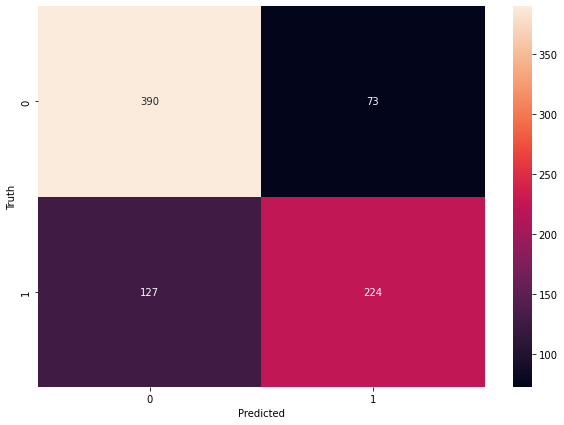

In [206]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=y_test,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [207]:
y_pred=pd.DataFrame(y_pred)

In [208]:
X_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_ann_6mon_10.xlsx")
y_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_ann_6mon_10.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_ann_6mon_10.xlsx")

In [209]:
df_x=X[3806:]
df_y=y[3806:]

In [210]:
yp = model.predict(df_x)
yp[:5]

array([[0.93791425],
       [0.8934745 ],
       [0.8299799 ],
       [0.7379444 ],
       [0.99799603]], dtype=float32)

In [211]:
y_pred1 = []
for element in yp:
    if element > 0.5:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [212]:
y_pred1[:10]

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

In [213]:
df_y[:10]

3808    1
3809    1
3810    0
3811    0
3812    1
3813    1
3814    1
3815    1
3816    1
3817    1
Name: Result10, dtype: int64

In [214]:
y_pred1=pd.DataFrame(y_pred1)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_ann_6mon_test_10.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_ann_6mon_test_10.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_ann_6mon_test_10.xlsx")

In [215]:
# 9 months 13%

In [216]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
%matplotlib inline

In [217]:
df = pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/9 months.csv")
df.sample(5)

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result13
3289,INDIABULLS REAL ESTATE LTD.,IBREALEST,541572,23255631.0,60000,2991990.00,481572,20263641.00,42.08,07-01-2020,...,2.65,0.12,111.0,1897.00,-2020.00,378.0,20.28,Construction,PROFIT,PROFIT
2831,RAJ TELEVISION NETWORK LTD.,RAJTV,33845,1430326.0,0,0.00,33845,1430326.00,42.26,01-01-2020,...,1.04,0.05,19.1,-6.92,-11.81,3.6,41.78,Entertainment / Electronic Media Software,LOSS,LOSS
130,CAMLIN FINE SCIENCES LTD.,CAMLINFINE,31500,2656637.0,0,0.00,31500,2656637.00,84.34,03-01-2016,...,5.74,0.28,46.0,-26.00,-15.00,53.0,14.83,Chemicals,PROFIT,PROFIT
627,ZUARI AGRO CHEMICALS LTD.,ZUARI,150585,52099102.0,5000,1772776.39,145585,50326325.61,345.68,04-01-2017,...,-27.40,0.05,-397.0,-374.00,773.00,-157.0,-12.89,Fertilizers,PROFIT,PROFIT
2284,GATEWAY DISTRIPARKS LTD.,GDL,419000,57808303.0,0,0.00,419000,57808303.00,137.97,06-01-2019,...,29.26,0.07,121.0,-563.00,450.00,395.0,0.31,Miscellaneous,LOSS,LOSS


In [218]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3932 entries, 0 to 3931
Data columns (total 32 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Row Labels             3932 non-null   object 
 1   Symbol                 3932 non-null   object 
 2   No of Shares Bought    3932 non-null   int64  
 3   Value of purchase      3932 non-null   float64
 4   No of shares sold      3932 non-null   int64  
 5   Value of sale          3930 non-null   float64
 6   No of shares           3932 non-null   int64  
 7   Value                  3932 non-null   float64
 8   Avg Price              3932 non-null   float64
 9   Buy Date               3932 non-null   object 
 10  Sell date              3932 non-null   object 
 11  Buy price              3932 non-null   float64
 12  Sell price             3932 non-null   float64
 13  Nifty Index at buying  3932 non-null   float64
 14  Nfty index at selling  3932 non-null   float64
 15  Chan

In [219]:
df.drop('Row Labels',axis=1,inplace=True)
#df.drop('Symbol',axis=1,inplace=True)
df.drop('Return',axis=1,inplace=True)
df.drop('Sell price',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)
df.drop('Buy Date',axis=1,inplace=True)
df.drop('Sell date',axis=1,inplace=True)
df.drop('Result',axis=1,inplace=True)

In [220]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3932 entries, 0 to 3931
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Symbol                 3932 non-null   object 
 1   No of Shares Bought    3932 non-null   int64  
 2   Value of purchase      3932 non-null   float64
 3   No of shares sold      3932 non-null   int64  
 4   Value of sale          3930 non-null   float64
 5   No of shares           3932 non-null   int64  
 6   Value                  3932 non-null   float64
 7   Avg Price              3932 non-null   float64
 8   Buy price              3932 non-null   float64
 9   Nifty Index at buying  3932 non-null   float64
 10  Nfty index at selling  3932 non-null   float64
 11  No of shares.1         3932 non-null   int64  
 12  Market Cap             3932 non-null   float64
 13  %age of Marketcap      3932 non-null   float64
 14  Cap                    3932 non-null   object 
 15  Devi

In [221]:
df['code'] = pd.factorize(df['Symbol'])[0] + 1

In [222]:
df['code']

0         1
1         2
2         3
3         4
4         5
       ... 
3927    409
3928    342
3929    593
3930    618
3931    603
Name: code, Length: 3932, dtype: int64

In [223]:
df.drop('Symbol',axis=1,inplace=True)

In [224]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result13']=df['Result13'].map(r)

In [225]:
df['Result13']

0       1
1       1
2       0
3       0
4       1
       ..
3927    0
3928    1
3929    1
3930    0
3931    0
Name: Result13, Length: 3932, dtype: int64

In [226]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3932 entries, 0 to 3931
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   No of Shares Bought    3932 non-null   int64  
 1   Value of purchase      3932 non-null   float64
 2   No of shares sold      3932 non-null   int64  
 3   Value of sale          3930 non-null   float64
 4   No of shares           3932 non-null   int64  
 5   Value                  3932 non-null   float64
 6   Avg Price              3932 non-null   float64
 7   Buy price              3932 non-null   float64
 8   Nifty Index at buying  3932 non-null   float64
 9   Nfty index at selling  3932 non-null   float64
 10  No of shares.1         3932 non-null   int64  
 11  Market Cap             3932 non-null   float64
 12  %age of Marketcap      3932 non-null   float64
 13  Cap                    3932 non-null   int64  
 14  Deviation              3932 non-null   float64
 15  EPS 

In [227]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            2
No of shares             0
Value                    0
Avg Price                0
Buy price                0
Nifty Index at buying    0
Nfty index at selling    0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Result13                 0
code                     0
dtype: int64
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            0
No of shares             0
Value                    0
Avg Price                0
Buy price                0
Nifty Index at buying    0
Nfty index at selling    0
No of shares.1           0
Market Cap     

In [228]:
cols_to_scale=['No of Shares Bought','Value of purchase','No of shares sold','Value of sale','No of shares','Value','Avg Price','Buy price','Nifty Index at buying','Nfty index at selling','No of shares.1','Market Cap','%age of Marketcap','Deviation','EPS','ROE','COA','CIA','CFA','PBT','PE','Industry','code']
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df[cols_to_scale] = scaler.fit_transform(df[cols_to_scale])

In [229]:
df.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result13,code
0,0.000333,0.000002,0.0,0.0,0.000333,0.000002,0.000004,0.001078,0.074711,0.082054,...,0.036400,0.178030,0.504167,0.869876,0.416881,0.438885,0.702581,0.000000,1,0.000000
1,0.000100,0.000472,0.0,0.0,0.000100,0.000472,0.002446,0.180073,0.074711,0.082054,...,0.049141,0.208333,0.505860,0.868413,0.415264,0.442086,0.704055,0.010526,1,0.001621
2,0.076195,0.000590,0.0,0.0,0.076198,0.000591,0.000004,0.001550,0.424598,0.379938,...,0.035082,0.162879,0.519492,0.840871,0.421233,0.410258,0.702048,0.021053,0,0.003241
3,0.019868,0.000278,0.0,0.0,0.019868,0.000278,0.000007,0.000493,0.074711,0.082054,...,0.035927,0.164773,0.504271,0.870008,0.416468,0.438778,0.715401,0.031579,0,0.004862
4,0.005643,0.002854,0.0,0.0,0.005643,0.002857,0.000263,0.016330,0.074711,0.082054,...,0.037457,0.200758,0.506555,0.865890,0.416735,0.443021,0.703668,0.042105,1,0.006483


In [230]:
X = df.drop('Result13',axis='columns')
y = df['Result13']

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=5)

In [231]:
X_train.shape

(3144, 24)

In [232]:
X_test.shape

(786, 24)

In [233]:
X_train[:10]

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
3807,0.000065,0.000042,0.0,0.0,0.000065,0.000042,0.000333,0.020369,0.204905,0.286047,...,1.319410e-07,0.037135,0.196970,0.504167,0.870318,0.416381,0.439139,0.704468,0.115789,0.194489
287,0.000859,0.000918,0.0,0.0,0.000859,0.000919,0.000555,0.035303,0.459973,0.505315,...,1.371664e-07,0.038647,0.208333,0.506309,0.871275,0.415598,0.449738,0.703969,0.368421,0.111831
3641,0.001846,0.000555,0.0,0.0,0.001846,0.000556,0.000156,0.013609,0.156742,0.268249,...,1.881139e-07,0.043184,0.130682,0.504345,0.868514,0.417925,0.442655,0.702531,0.294737,0.197731
1269,0.000108,0.000078,0.0,0.0,0.000108,0.000078,0.000373,0.023493,0.189230,0.086975,...,1.358600e-07,0.037635,0.185606,0.504339,0.869793,0.416589,0.439159,0.704068,0.063158,0.518639
1905,0.001984,0.000793,0.0,0.0,0.001984,0.000794,0.000208,0.012178,0.127531,0.074318,...,1.267156e-07,0.036810,0.204545,0.504512,0.869453,0.415734,0.440907,0.704067,0.768421,0.713128
1291,0.000162,0.000166,0.0,0.0,0.000162,0.000166,0.000533,0.027975,0.161451,0.114945,...,1.136521e-07,0.038979,0.187500,0.504292,0.869545,0.416955,0.439098,0.703476,0.010526,0.196110
529,0.000027,0.000011,0.0,0.0,0.000027,0.000011,0.000207,0.011950,0.098375,0.150166,...,1.254093e-07,0.037337,0.198864,0.504470,0.869655,0.416464,0.439098,0.703384,0.389474,0.226904
368,0.000440,0.000081,0.0,0.0,0.000440,0.000081,0.000095,0.006446,0.115037,0.132421,...,1.463108e-07,0.034047,0.132576,0.504198,0.869941,0.416694,0.438397,0.701842,0.000000,0.267423
3795,0.000005,0.000036,0.0,0.0,0.000005,0.000036,0.003493,0.239258,0.497239,0.499690,...,1.476172e-07,0.045405,0.179924,1.000000,0.202605,0.390040,0.983527,0.705561,0.715789,0.397083
1627,0.000082,0.000195,0.0,0.0,0.000082,0.000195,0.001233,0.071402,0.328104,0.304685,...,1.254093e-07,0.040615,0.232955,0.511425,0.858038,0.411601,0.456231,0.704261,0.042105,0.350081


In [234]:
len(X_train.columns)

24

In [235]:
#ANN in tensorflow/keras

import tensorflow as tf
from tensorflow import keras


model = keras.Sequential([
    keras.layers.Dense(24, input_shape=(24,), activation='relu'),
    keras.layers.Dense(15, activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')
])

opt = keras.optimizers.Adam(learning_rate=0.01)

model.compile(optimizer=opt,
              loss='binary_crossentropy',
              metrics=['accuracy'])

model.fit(X_train, y_train, epochs=500)

Epoch 1/500
99/99 [==============================] - 0s 756us/step - loss: 0.6618 - accuracy: 0.6069
Epoch 2/500
99/99 [==============================] - 0s 816us/step - loss: 0.5369 - accuracy: 0.7529
Epoch 3/500
99/99 [==============================] - 0s 766us/step - loss: 0.4962 - accuracy: 0.7732
Epoch 4/500
99/99 [==============================] - 0s 806us/step - loss: 0.4907 - accuracy: 0.7809
Epoch 5/500
99/99 [==============================] - 0s 766us/step - loss: 0.4866 - accuracy: 0.7809
Epoch 6/500
99/99 [==============================] - 0s 655us/step - loss: 0.4846 - accuracy: 0.7742
Epoch 7/500
99/99 [==============================] - 0s 655us/step - loss: 0.4799 - accuracy: 0.7783
Epoch 8/500
99/99 [==============================] - 0s 665us/step - loss: 0.4770 - accuracy: 0.7888
Epoch 9/500
99/99 [==============================] - 0s 655us/step - loss: 0.4724 - accuracy: 0.7866
Epoch 10/500
99/99 [==============================] - 0s 695us/step - loss: 0.4826 - accura

99/99 [==============================] - 0s 665us/step - loss: 0.4396 - accuracy: 0.8025
Epoch 158/500
99/99 [==============================] - 0s 665us/step - loss: 0.4363 - accuracy: 0.7996
Epoch 159/500
99/99 [==============================] - 0s 675us/step - loss: 0.4404 - accuracy: 0.8050
Epoch 160/500
99/99 [==============================] - 0s 675us/step - loss: 0.4348 - accuracy: 0.8053
Epoch 161/500
99/99 [==============================] - 0s 655us/step - loss: 0.4362 - accuracy: 0.8079
Epoch 162/500
99/99 [==============================] - 0s 665us/step - loss: 0.4392 - accuracy: 0.7996
Epoch 163/500
99/99 [==============================] - 0s 655us/step - loss: 0.4339 - accuracy: 0.8057
Epoch 164/500
99/99 [==============================] - 0s 675us/step - loss: 0.4371 - accuracy: 0.8044
Epoch 165/500
99/99 [==============================] - 0s 665us/step - loss: 0.4399 - accuracy: 0.8015
Epoch 166/500
99/99 [==============================] - 0s 635us/step - loss: 0.4328 - a

99/99 [==============================] - 0s 736us/step - loss: 0.4190 - accuracy: 0.8114
Epoch 316/500
99/99 [==============================] - 0s 715us/step - loss: 0.4188 - accuracy: 0.8127
Epoch 317/500
99/99 [==============================] - 0s 705us/step - loss: 0.4172 - accuracy: 0.8111
Epoch 318/500
99/99 [==============================] - 0s 705us/step - loss: 0.4182 - accuracy: 0.8111
Epoch 319/500
99/99 [==============================] - 0s 695us/step - loss: 0.4115 - accuracy: 0.8158
Epoch 320/500
99/99 [==============================] - 0s 726us/step - loss: 0.4150 - accuracy: 0.8108
Epoch 321/500
99/99 [==============================] - 0s 725us/step - loss: 0.4185 - accuracy: 0.8069
Epoch 322/500
99/99 [==============================] - 0s 705us/step - loss: 0.4194 - accuracy: 0.8142
Epoch 323/500
99/99 [==============================] - 0s 692us/step - loss: 0.4160 - accuracy: 0.8117
Epoch 324/500
99/99 [==============================] - 0s 725us/step - loss: 0.4200 - a

99/99 [==============================] - 0s 685us/step - loss: 0.4082 - accuracy: 0.8108
Epoch 474/500
99/99 [==============================] - 0s 665us/step - loss: 0.4011 - accuracy: 0.8184
Epoch 475/500
99/99 [==============================] - 0s 675us/step - loss: 0.4035 - accuracy: 0.8168
Epoch 476/500
99/99 [==============================] - 0s 661us/step - loss: 0.4062 - accuracy: 0.8155
Epoch 477/500
99/99 [==============================] - 0s 675us/step - loss: 0.4037 - accuracy: 0.8123
Epoch 478/500
99/99 [==============================] - 0s 685us/step - loss: 0.3983 - accuracy: 0.8174
Epoch 479/500
99/99 [==============================] - 0s 675us/step - loss: 0.4076 - accuracy: 0.8149
Epoch 480/500
99/99 [==============================] - 0s 705us/step - loss: 0.4001 - accuracy: 0.8212
Epoch 481/500
99/99 [==============================] - 0s 675us/step - loss: 0.4100 - accuracy: 0.8088
Epoch 482/500
99/99 [==============================] - 0s 685us/step - loss: 0.4081 - a

In [236]:
model.evaluate(X_test, y_test)

25/25 [==============================] - 0s 519us/step - loss: 0.5322 - accuracy: 0.7863


[0.5322339534759521, 0.7862595319747925]

In [237]:
yp = model.predict(X_test)
yp[:5]

array([[0.0928261 ],
       [0.9321589 ],
       [0.98299026],
       [0.86573493],
       [0.4066506 ]], dtype=float32)

In [238]:
y_pred = []
for element in yp:
    if element > 0.5:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [239]:
y_pred[:10]

[0, 1, 1, 1, 0, 1, 0, 0, 0, 0]

In [240]:
y_test[:10]

2868    0
3179    1
97      1
3798    0
194     1
3696    1
1186    0
1704    0
1278    0
1974    0
Name: Result13, dtype: int64

In [241]:
from sklearn.metrics import confusion_matrix , classification_report

print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.81      0.82      0.82       457
           1       0.75      0.74      0.74       329

    accuracy                           0.79       786
   macro avg       0.78      0.78      0.78       786
weighted avg       0.79      0.79      0.79       786



Text(69.0, 0.5, 'Truth')

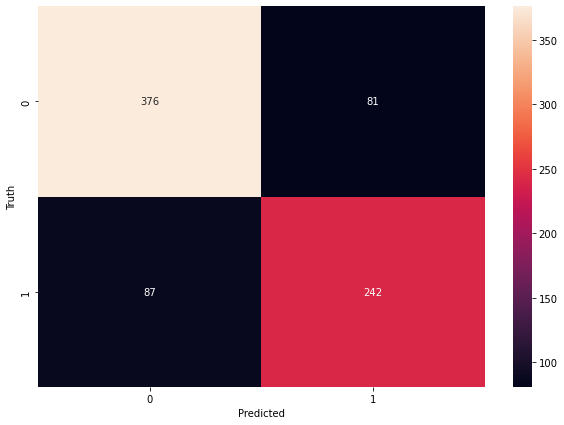

In [242]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=y_test,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [243]:
y_pred=pd.DataFrame(y_pred)

In [244]:
X_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_ann_9mon_13.xlsx")
y_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_ann_9mon_13.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_ann_9mon_13.xlsx")

In [245]:
df_x=X[3718:]
df_y=y[3718:]

In [246]:
yp = model.predict(df_x)
yp[:5]

array([[0.46439758],
       [0.7947944 ],
       [0.7750683 ],
       [0.946924  ],
       [0.86439836]], dtype=float32)

In [247]:
y_pred1 = []
for element in yp:
    if element > 0.5:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [248]:
y_pred1[:10]

[0, 1, 1, 1, 1, 1, 1, 1, 1, 1]

In [249]:
df_y[:10]

3720    0
3721    0
3722    1
3723    1
3724    0
3725    1
3726    1
3727    1
3728    1
3729    1
Name: Result13, dtype: int64

In [250]:
y_pred1=pd.DataFrame(y_pred1)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_ann_9mon_test_13.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_ann_9mon_test_13.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_ann_9mon_test_13.xlsx")

In [251]:
# 12 months 15%

In [252]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
%matplotlib inline

In [253]:
df = pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/12_months.csv")
df.sample(5)

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result15
3580,Galaxy Surfactants Ltd,GALAXYSURF,555,1026750.00,0,0.0,555,1026750.00,1850.00,12-01-2020,...,64.99,0.24,316.0,-149.0,-144.0,289.0,29.14,Detergents / Intermediates,PROFIT,PROFIT
2959,Aditya Birla Capital Ltd,ABCAPITAL,100000,5148627.00,0,0.0,100000,5148627.00,51.49,04-01-2020,...,3.96,0.09,-10256.0,-690.0,10852.0,1381.0,10.97,Finance & Investments,PROFIT,PROFIT
320,EVEREST KANTO CYLINDER LTD.,EKC,111655,1855425.53,0,0.0,111655,1855425.53,16.62,08-01-2016,...,-11.06,-0.06,31.0,-5.0,-57.0,-123.0,-1.88,Packaging,PROFIT,PROFIT
3444,KDDL LTD.-$,KDDL,21952,3372542.00,0,0.0,21952,3372542.00,153.63,10-01-2020,...,-0.46,0.09,64.0,-31.0,-26.0,5.0,-331.33,Miscellaneous,PROFIT,PROFIT
1059,CAPITAL TRUST LTD.,CAPTRUST,21680,10202342.98,0,0.0,21680,10202342.98,470.59,03-01-2018,...,23.14,0.21,-334.0,-31.0,311.0,57.0,19.73,Finance & Investments,LOSS,LOSS


In [254]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3802 entries, 0 to 3801
Data columns (total 32 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Row Labels             3802 non-null   object 
 1   Symbol                 3802 non-null   object 
 2   No of Shares Bought    3802 non-null   int64  
 3   Value of purchase      3802 non-null   float64
 4   No of shares sold      3802 non-null   int64  
 5   Value of sale          3800 non-null   float64
 6   No of shares           3802 non-null   int64  
 7   Value                  3802 non-null   float64
 8   Avg Price              3802 non-null   float64
 9   Buy Date               3802 non-null   object 
 10  Sell date              3802 non-null   object 
 11  Buy price              3802 non-null   float64
 12  Sell price             3802 non-null   float64
 13  Nifty Index at buying  3802 non-null   float64
 14  Nfty index at selling  3802 non-null   float64
 15  Chan

In [255]:
df.drop('Row Labels',axis=1,inplace=True)
#df.drop('Symbol',axis=1,inplace=True)
df.drop('Return',axis=1,inplace=True)
df.drop('Sell price',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)
df.drop('Buy Date',axis=1,inplace=True)
df.drop('Sell date',axis=1,inplace=True)
df.drop('Result',axis=1,inplace=True)

In [256]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3802 entries, 0 to 3801
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Symbol                 3802 non-null   object 
 1   No of Shares Bought    3802 non-null   int64  
 2   Value of purchase      3802 non-null   float64
 3   No of shares sold      3802 non-null   int64  
 4   Value of sale          3800 non-null   float64
 5   No of shares           3802 non-null   int64  
 6   Value                  3802 non-null   float64
 7   Avg Price              3802 non-null   float64
 8   Buy price              3802 non-null   float64
 9   Nifty Index at buying  3802 non-null   float64
 10  Nfty index at selling  3802 non-null   float64
 11  No of shares.1         3802 non-null   int64  
 12  Market Cap             3802 non-null   float64
 13  %age of Marketcap      3802 non-null   float64
 14  Cap                    3802 non-null   object 
 15  Devi

In [257]:
df['code'] = pd.factorize(df['Symbol'])[0] + 1

In [258]:
df['code']

0         1
1         2
2         3
3         4
4         5
       ... 
3797    397
3798    384
3799    491
3800    411
3801     31
Name: code, Length: 3802, dtype: int64

In [259]:
df.drop('Symbol',axis=1,inplace=True)

In [260]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result15']=df['Result15'].map(r)

In [261]:
df['Result15']

0       1
1       1
2       0
3       0
4       1
       ..
3797    1
3798    1
3799    1
3800    0
3801    0
Name: Result15, Length: 3802, dtype: int64

In [262]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3802 entries, 0 to 3801
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   No of Shares Bought    3802 non-null   int64  
 1   Value of purchase      3802 non-null   float64
 2   No of shares sold      3802 non-null   int64  
 3   Value of sale          3800 non-null   float64
 4   No of shares           3802 non-null   int64  
 5   Value                  3802 non-null   float64
 6   Avg Price              3802 non-null   float64
 7   Buy price              3802 non-null   float64
 8   Nifty Index at buying  3802 non-null   float64
 9   Nfty index at selling  3802 non-null   float64
 10  No of shares.1         3802 non-null   int64  
 11  Market Cap             3802 non-null   float64
 12  %age of Marketcap      3802 non-null   float64
 13  Cap                    3802 non-null   int64  
 14  Deviation              3802 non-null   float64
 15  EPS 

In [263]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            2
No of shares             0
Value                    0
Avg Price                0
Buy price                0
Nifty Index at buying    0
Nfty index at selling    0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Result15                 0
code                     0
dtype: int64
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            0
No of shares             0
Value                    0
Avg Price                0
Buy price                0
Nifty Index at buying    0
Nfty index at selling    0
No of shares.1           0
Market Cap     

In [264]:
cols_to_scale=['No of Shares Bought','Value of purchase','No of shares sold','Value of sale','No of shares','Value','Avg Price','Buy price','Nifty Index at buying','Nfty index at selling','No of shares.1','Market Cap','%age of Marketcap','Deviation','EPS','ROE','COA','CIA','CFA','PBT','PE','Industry','code']
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df[cols_to_scale] = scaler.fit_transform(df[cols_to_scale])

In [265]:
df.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result15,code
0,0.000333,0.000002,0.0,0.0,0.000333,0.000002,0.000004,0.001078,0.083904,0.095447,...,0.036400,0.178030,0.504167,0.869876,0.416881,0.438885,0.702581,0.000000,1,0.000000
1,0.000100,0.000472,0.0,0.0,0.000100,0.000472,0.002446,0.180073,0.083904,0.095447,...,0.049141,0.208333,0.505860,0.868413,0.415264,0.442086,0.704055,0.010526,1,0.001642
2,0.076195,0.000590,0.0,0.0,0.076198,0.000591,0.000004,0.001550,0.476846,0.441966,...,0.035082,0.162879,0.519492,0.840871,0.421233,0.410258,0.702048,0.021053,0,0.003284
3,0.019868,0.000278,0.0,0.0,0.019868,0.000278,0.000007,0.000493,0.083904,0.095447,...,0.035927,0.164773,0.504271,0.870008,0.416468,0.438778,0.715401,0.031579,0,0.004926
4,0.005643,0.002854,0.0,0.0,0.005643,0.002857,0.000263,0.016330,0.083904,0.095447,...,0.037457,0.200758,0.506555,0.865890,0.416735,0.443021,0.703668,0.042105,1,0.006568


In [266]:
X = df.drop('Result15',axis='columns')
y = df['Result15']

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=5)

In [267]:
X_train.shape

(3040, 24)

In [268]:
X_test.shape

(760, 24)

In [269]:
X_train[:10]

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
851,0.000270,0.000193,0.0,0.0,0.000270,0.000193,0.000371,0.020125,0.204170,0.093065,...,1.175712e-07,0.037902,0.202652,0.507689,0.853445,0.428330,0.442909,0.703607,0.694737,0.415435
1773,0.017792,0.003939,0.0,0.0,0.017793,0.003943,0.000115,0.000761,0.124788,0.079997,...,1.436981e-08,0.036007,0.176136,0.506748,0.868219,0.413761,0.442756,0.703455,0.231579,0.195402
149,0.000043,0.000019,0.0,0.0,0.000043,0.000019,0.000229,0.014904,0.038779,0.115782,...,1.410854e-07,0.036167,0.174242,0.504507,0.869931,0.416057,0.438824,0.710198,0.273684,0.070608
1416,0.000216,0.000031,0.0,0.0,0.000216,0.000031,0.000075,0.005395,0.194871,0.069895,...,1.541489e-07,0.036063,0.179924,0.504360,0.869977,0.416328,0.438793,0.707283,0.389474,0.215107
3564,0.001491,0.000098,0.0,0.0,0.001492,0.000098,0.000034,0.002992,0.151770,0.264302,...,1.894202e-07,0.036071,0.160985,0.503822,0.869904,0.417007,0.439068,0.704907,0.073684,0.254516
2820,0.000625,0.000298,0.0,0.0,0.000625,0.000298,0.000248,0.015120,0.112747,0.129469,...,1.319410e-07,0.036983,0.172348,0.504475,0.869434,0.416714,0.438915,0.704137,0.273684,0.070608
2829,0.000042,0.000021,0.0,0.0,0.000042,0.000021,0.000257,0.017432,0.112747,0.129469,...,1.463108e-07,0.037645,0.176136,0.504522,0.869710,0.416307,0.438935,0.703601,0.063158,0.645320
1467,0.001297,0.000276,0.0,0.0,0.001297,0.000276,0.000111,0.005810,0.206230,0.066456,...,1.136521e-07,0.036048,0.185606,0.500185,0.869398,0.425752,0.439586,0.708296,0.000000,0.587849
2977,0.000378,0.000048,0.0,0.0,0.000378,0.000048,0.000066,0.003276,0.000000,0.169252,...,1.084268e-07,0.035572,0.160985,0.504454,0.869830,0.416485,0.438692,0.701074,0.284211,0.582923
455,0.211351,0.185836,0.0,0.0,0.211360,0.186016,0.000457,0.023294,0.233159,0.246300,...,1.097331e-07,0.036830,0.181818,0.518943,0.831610,0.406560,0.459178,0.705617,0.126316,0.292282


In [270]:
len(X_train.columns)

24

In [271]:
#ANN in tensorflow/keras

import tensorflow as tf
from tensorflow import keras


model = keras.Sequential([
    keras.layers.Dense(24, input_shape=(24,), activation='relu'),
    keras.layers.Dense(15, activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')
])

opt = keras.optimizers.Adam(learning_rate=0.01)

model.compile(optimizer=opt,
              loss='binary_crossentropy',
              metrics=['accuracy'])

model.fit(X_train, y_train, epochs=500)

Epoch 1/500
95/95 [==============================] - 0s 630us/step - loss: 0.6284 - accuracy: 0.6451
Epoch 2/500
95/95 [==============================] - 0s 714us/step - loss: 0.4842 - accuracy: 0.7770
Epoch 3/500
95/95 [==============================] - 0s 672us/step - loss: 0.4757 - accuracy: 0.7836
Epoch 4/500
95/95 [==============================] - 0s 683us/step - loss: 0.5090 - accuracy: 0.7576
Epoch 5/500
95/95 [==============================] - 0s 703us/step - loss: 0.4790 - accuracy: 0.7845
Epoch 6/500
95/95 [==============================] - 0s 661us/step - loss: 0.4709 - accuracy: 0.7855
Epoch 7/500
95/95 [==============================] - 0s 682us/step - loss: 0.4672 - accuracy: 0.7839
Epoch 8/500
95/95 [==============================] - 0s 682us/step - loss: 0.4652 - accuracy: 0.7859
Epoch 9/500
95/95 [==============================] - 0s 682us/step - loss: 0.4664 - accuracy: 0.7924
Epoch 10/500
95/95 [==============================] - 0s 724us/step - loss: 0.4595 - accura

95/95 [==============================] - 0s 688us/step - loss: 0.4253 - accuracy: 0.8095
Epoch 161/500
95/95 [==============================] - 0s 651us/step - loss: 0.4356 - accuracy: 0.8062
Epoch 162/500
95/95 [==============================] - 0s 636us/step - loss: 0.4274 - accuracy: 0.8122
Epoch 163/500
95/95 [==============================] - 0s 682us/step - loss: 0.4231 - accuracy: 0.8132
Epoch 164/500
95/95 [==============================] - 0s 661us/step - loss: 0.4213 - accuracy: 0.8053
Epoch 165/500
95/95 [==============================] - 0s 662us/step - loss: 0.4242 - accuracy: 0.8072
Epoch 166/500
95/95 [==============================] - 0s 693us/step - loss: 0.4271 - accuracy: 0.8049
Epoch 167/500
95/95 [==============================] - 0s 682us/step - loss: 0.4192 - accuracy: 0.8161
Epoch 168/500
95/95 [==============================] - 0s 661us/step - loss: 0.4220 - accuracy: 0.8118
Epoch 169/500
95/95 [==============================] - 0s 682us/step - loss: 0.4260 - a

Epoch 318/500
95/95 [==============================] - 0s 682us/step - loss: 0.4050 - accuracy: 0.8220
Epoch 319/500
95/95 [==============================] - 0s 662us/step - loss: 0.3975 - accuracy: 0.8211
Epoch 320/500
95/95 [==============================] - 0s 677us/step - loss: 0.4080 - accuracy: 0.8194
Epoch 321/500
95/95 [==============================] - 0s 672us/step - loss: 0.4021 - accuracy: 0.8164
Epoch 322/500
95/95 [==============================] - 0s 672us/step - loss: 0.3976 - accuracy: 0.8243
Epoch 323/500
95/95 [==============================] - 0s 672us/step - loss: 0.4063 - accuracy: 0.8257
Epoch 324/500
95/95 [==============================] - 0s 672us/step - loss: 0.4013 - accuracy: 0.8237
Epoch 325/500
95/95 [==============================] - 0s 672us/step - loss: 0.3998 - accuracy: 0.8132
Epoch 326/500
95/95 [==============================] - 0s 672us/step - loss: 0.3989 - accuracy: 0.8211
Epoch 327/500
95/95 [==============================] - 0s 692us/step - lo

95/95 [==============================] - 0s 655us/step - loss: 0.3934 - accuracy: 0.8234
Epoch 476/500
95/95 [==============================] - 0s 651us/step - loss: 0.3907 - accuracy: 0.8266
Epoch 477/500
95/95 [==============================] - 0s 693us/step - loss: 0.3966 - accuracy: 0.8224
Epoch 478/500
95/95 [==============================] - 0s 682us/step - loss: 0.3942 - accuracy: 0.8273
Epoch 479/500
95/95 [==============================] - 0s 693us/step - loss: 0.3895 - accuracy: 0.8257
Epoch 480/500
95/95 [==============================] - 0s 661us/step - loss: 0.3893 - accuracy: 0.8283
Epoch 481/500
95/95 [==============================] - 0s 682us/step - loss: 0.3957 - accuracy: 0.8191
Epoch 482/500
95/95 [==============================] - 0s 651us/step - loss: 0.3846 - accuracy: 0.8263
Epoch 483/500
95/95 [==============================] - 0s 661us/step - loss: 0.3896 - accuracy: 0.8243
Epoch 484/500
95/95 [==============================] - 0s 661us/step - loss: 0.3874 - a

In [272]:
model.evaluate(X_test, y_test)

24/24 [==============================] - 0s 540us/step - loss: 0.5694 - accuracy: 0.7829


[0.5693820118904114, 0.7828947305679321]

In [273]:
yp = model.predict(X_test)
yp[:5]

array([[0.8662601 ],
       [0.16147357],
       [0.3625273 ],
       [0.55546397],
       [0.13924533]], dtype=float32)

In [274]:
y_pred = []
for element in yp:
    if element > 0.5:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [275]:
y_pred[:10]

[1, 0, 0, 1, 0, 0, 1, 1, 1, 0]

In [276]:
y_test[:10]

3258    1
955     0
2608    0
639     1
1490    0
1630    1
396     1
2792    0
1877    0
1238    0
Name: Result15, dtype: int64

In [277]:
from sklearn.metrics import confusion_matrix , classification_report

print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.78      0.83      0.81       412
           1       0.78      0.73      0.75       348

    accuracy                           0.78       760
   macro avg       0.78      0.78      0.78       760
weighted avg       0.78      0.78      0.78       760



Text(69.0, 0.5, 'Truth')

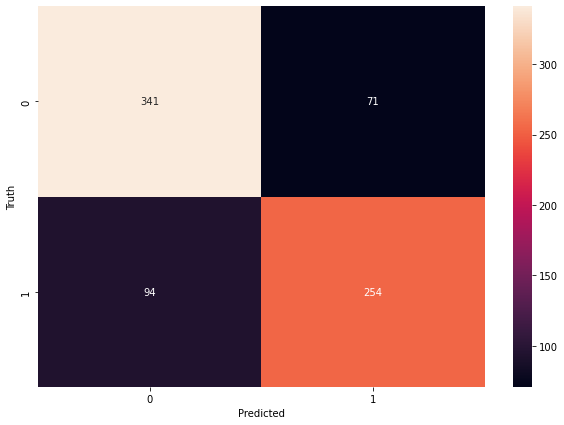

In [278]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=y_test,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [279]:
y_pred=pd.DataFrame(y_pred)

In [280]:
X_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_ann_12mon_15.xlsx")
y_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_ann_12mon_15.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_ann_12mon_15.xlsx")

In [281]:
df_x=X[3508:]
df_y=y[3508:]

In [282]:
yp = model.predict(df_x)
yp[:5]

array([[0.88874614],
       [0.8704178 ],
       [0.8971578 ],
       [0.99999845],
       [0.9988239 ]], dtype=float32)

In [283]:
y_pred1 = []
for element in yp:
    if element > 0.5:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [284]:
y_pred1[:10]

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

In [285]:
df_y[:10]

3510    1
3511    1
3512    1
3513    1
3514    1
3515    1
3516    1
3517    1
3518    1
3519    1
Name: Result15, dtype: int64

In [286]:
y_pred1=pd.DataFrame(y_pred1)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_ann_12mon_test_15.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_ann_12mon_test_15.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_ann_12mon_test_15.xlsx")

In [287]:
# max

In [288]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
%matplotlib inline

In [289]:
df = pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/max.csv")
df.sample(5)

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,Change in Nifty 50(6),Change in Nifty 50(9),Change in Nifty 50(12),Return(2),Return(6),Return(9),Return(12),Return,Change in Nifty 50,Result15
152,KANSAI NEROLAC PAINTS LTD.,KANSAINER,9489109,2.636856e+09,0,0.0,9489109,2.636856e+09,277.88,04-01-2016,...,21.99%,13.13%,35.41%,4.78%,33.76%,14.91%,32.44%,0.34,0.22,PROFIT
1234,Sadbhav Infrastructure Project Ltd,SADBHIN,1000,1.101440e+05,0,0.0,1000,1.101440e+05,110.14,09-01-2018,...,-22.66%,-15.03%,-29.84%,-14.19%,-27.08%,-33.73%,-62.38%,-0.14,-0.21,LOSS
1891,EMKAY GLOBAL FINANCIAL SERVICES LTD.,EMKAY,474884,3.516902e+07,0,0.0,474884,3.516902e+07,74.06,07-01-2019,...,-6.02%,-41.97%,-25.76%,-29.77%,-9.90%,-62.52%,-35.08%,-0.10,-0.06,LOSS
1173,ROSSELL INDIA LTD.,ROSSELLIND,33656,2.390358e+06,0,0.0,33656,2.390358e+06,71.02,08-01-2018,...,-17.72%,-13.69%,-26.49%,5.12%,0.48%,-16.75%,-52.25%,0.05,-0.18,LOSS
1382,KITEX GARMENTS LTD.,KITEX,55354,5.702292e+06,0,0.0,55354,5.702292e+06,103.01,11-01-2018,...,6.03%,-9.70%,-5.22%,-6.26%,-15.50%,-30.96%,-25.85%,-0.06,0.06,LOSS


In [290]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3083 entries, 0 to 3082
Data columns (total 39 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Row Labels                3083 non-null   object 
 1   Symbol                    3083 non-null   object 
 2   No of Shares Bought       3083 non-null   int64  
 3   Value of purchase         3083 non-null   float64
 4   No of shares sold         3083 non-null   int64  
 5   Value of sale             3082 non-null   float64
 6   No of shares              3083 non-null   int64  
 7   Value                     3083 non-null   float64
 8   Avg Price                 3083 non-null   float64
 9   Buy Date                  3083 non-null   object 
 10  Sell date                 3083 non-null   object 
 11  Buy price                 3083 non-null   float64
 12  Nifty Index at buying     3083 non-null   float64
 13  No of shares.1            3083 non-null   int64  
 14  Market C

In [291]:
df.drop('Buy Date',1,inplace=True)
df.drop('Sell date',1,inplace=True)
df.drop('Row Labels',1,inplace=True)
#data.drop('Symbol',1,inplace=True)
df.drop('Return',1,inplace=True)
df.drop('Return(2)',1,inplace=True)
df.drop('Return(6)',1,inplace=True)
df.drop('Return(9)',1,inplace=True)
df.drop('Return(12)',1,inplace=True)
df.drop("Sell price(2)",1,inplace=True)
#data.drop('Result3',axis=1,inplace=True)
#data.drop('Nifty Index at buying',axis=1,inplace=True)
df.drop("Nfty index at selling(2)",axis=1,inplace=True)
df.drop("Change in Nifty 50(2)",axis=1,inplace=True)
df.drop("Change in Nifty 50(6)",axis=1,inplace=True)
df.drop("Change in Nifty 50(9)",axis=1,inplace=True)
df.drop("Change in Nifty 50(12)",axis=1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\258682244.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Buy Date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\258682244.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Sell date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\258682244.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Row Labels',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\258682244.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Return',1,inplace=True)
C:\Users\Anmol Choubey\AppD

In [292]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3083 entries, 0 to 3082
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Symbol                 3083 non-null   object 
 1   No of Shares Bought    3083 non-null   int64  
 2   Value of purchase      3083 non-null   float64
 3   No of shares sold      3083 non-null   int64  
 4   Value of sale          3082 non-null   float64
 5   No of shares           3083 non-null   int64  
 6   Value                  3083 non-null   float64
 7   Avg Price              3083 non-null   float64
 8   Buy price              3083 non-null   float64
 9   Nifty Index at buying  3083 non-null   float64
 10  No of shares.1         3083 non-null   int64  
 11  Market Cap             3083 non-null   float64
 12  %age of Marketcap      3083 non-null   float64
 13  Cap                    3083 non-null   object 
 14  Deviation              3083 non-null   float64
 15  EPS 

In [293]:
df['code'] = pd.factorize(df['Symbol'])[0] + 1

In [294]:
df['code']

0         1
1         2
2         3
3         4
4         5
       ... 
3078    483
3079    334
3080    367
3081    352
3082    460
Name: code, Length: 3083, dtype: int64

In [295]:
df.drop('Symbol',axis=1,inplace=True)

In [296]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result15']=df['Result15'].map(r)

In [297]:
df['Result15']

0       1
1       1
2       1
3       0
4       1
       ..
3078    1
3079    1
3080    1
3081    1
3082    1
Name: Result15, Length: 3083, dtype: int64

In [298]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3083 entries, 0 to 3082
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   No of Shares Bought    3083 non-null   int64  
 1   Value of purchase      3083 non-null   float64
 2   No of shares sold      3083 non-null   int64  
 3   Value of sale          3082 non-null   float64
 4   No of shares           3083 non-null   int64  
 5   Value                  3083 non-null   float64
 6   Avg Price              3083 non-null   float64
 7   Buy price              3083 non-null   float64
 8   Nifty Index at buying  3083 non-null   float64
 9   No of shares.1         3083 non-null   int64  
 10  Market Cap             3083 non-null   float64
 11  %age of Marketcap      3083 non-null   float64
 12  Cap                    3083 non-null   int64  
 13  Deviation              3083 non-null   float64
 14  EPS                    3083 non-null   float64
 15  ROE 

In [299]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            1
No of shares             0
Value                    0
Avg Price                0
Buy price                0
Nifty Index at buying    0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Change in Nifty 50       0
Result15                 0
code                     0
dtype: int64
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            0
No of shares             0
Value                    0
Avg Price                0
Buy price                0
Nifty Index at buying    0
No of shares.1           0
Market Cap               0
%age of Marketc

In [300]:
cols_to_scale=['No of Shares Bought','Value of purchase','No of shares sold','Value of sale','No of shares','Value','Avg Price','Buy price','Nifty Index at buying','No of shares.1','Market Cap','%age of Marketcap','Deviation','EPS','ROE','COA','CIA','CFA','PBT','PE','Industry','code','Change in Nifty 50']
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df[cols_to_scale] = scaler.fit_transform(df[cols_to_scale])

In [301]:
df.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,No of shares.1,...,ROE,COA,CIA,CFA,PBT,PE,Industry,Change in Nifty 50,Result15,code
0,0.000333,0.000002,0.0,0.0,0.000333,0.000002,0.000004,0.001078,0.083904,0.002393,...,0.178030,0.574458,0.878570,0.416881,0.438885,0.407964,0.000000,0.320000,1,0.000000
1,0.000100,0.000472,0.0,0.0,0.000100,0.000472,0.002446,0.180073,0.083904,0.002762,...,0.208333,0.576387,0.877092,0.415264,0.442086,0.411104,0.010753,0.360000,1,0.001748
2,0.076195,0.000590,0.0,0.0,0.076198,0.000591,0.000004,0.001550,0.476846,0.588284,...,0.162879,0.591920,0.849275,0.421233,0.410258,0.406830,0.021505,0.274286,1,0.003497
3,0.019868,0.000278,0.0,0.0,0.019868,0.000278,0.000007,0.000493,0.083904,0.008618,...,0.164773,0.574576,0.878703,0.416468,0.438778,0.435267,0.032258,0.297143,0,0.005245
4,0.005643,0.002854,0.0,0.0,0.005643,0.002857,0.000263,0.016330,0.083904,0.028766,...,0.200758,0.577179,0.874544,0.416735,0.443021,0.410279,0.043011,0.360000,1,0.006993


In [302]:
X = df.drop('Result15',axis='columns')
y = df['Result15']

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=5)

In [303]:
X_train.shape

(2465, 24)

In [304]:
X_test.shape

(617, 24)

In [305]:
X_train[:10]

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,No of shares.1,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Change in Nifty 50,code
1622,0.000081,0.000047,0.0,0.0,0.000081,0.000047,0.000301,0.021545,0.128102,0.009319,...,0.022207,0.208333,0.575357,0.878217,0.415556,0.440145,0.411242,0.397849,0.314286,0.132867
1703,0.000112,0.000256,0.0,0.0,0.000112,0.000256,0.001189,0.083813,0.663424,0.014111,...,0.024195,0.181818,0.575214,0.871263,0.426451,0.441425,0.413989,0.451613,0.285714,0.353147
2239,0.000015,0.000061,0.0,0.0,0.000015,0.000061,0.002106,0.119287,0.111113,0.000856,...,0.034538,0.193182,0.574756,0.878542,0.416370,0.440023,0.409752,0.548387,0.302857,0.666084
2041,0.000002,0.000002,0.0,0.0,0.000002,0.000002,0.000499,0.030673,0.090356,0.000486,...,0.018758,0.157197,0.573887,0.878902,0.417367,0.438683,0.402810,0.172043,0.302857,0.737762
2765,0.014054,0.001679,0.0,0.0,0.014055,0.001681,0.000062,0.003879,0.115202,0.025082,...,0.021270,0.176136,0.579685,0.875800,0.410557,0.440480,0.409118,0.408602,0.742857,0.246503
1404,0.001380,0.000648,0.0,0.0,0.001381,0.000648,0.000244,0.016006,0.124788,0.004280,...,0.022455,0.189394,0.575494,0.876571,0.417288,0.439525,0.409838,0.440860,0.297143,0.263986
1074,0.001891,0.001273,0.0,0.0,0.001891,0.001274,0.000350,0.001035,0.181318,0.001230,...,0.021755,0.176136,0.575071,0.878654,0.415629,0.439759,0.407606,0.107527,0.222857,0.447552
2221,0.000032,0.000002,0.0,0.0,0.000032,0.000002,0.000027,0.017265,0.685856,0.041071,...,0.020771,0.164773,0.574574,0.878636,0.416551,0.438787,0.450385,0.043011,0.285714,0.634615
550,0.000027,0.000054,0.0,0.0,0.000027,0.000054,0.001031,0.013649,0.180044,0.010246,...,0.021254,0.189394,0.576542,0.875958,0.415994,0.441151,0.413769,0.698925,0.314286,0.381119
1564,0.000096,0.000110,0.0,0.0,0.000096,0.000110,0.000595,0.035314,0.143224,0.005738,...,0.022446,0.187500,0.575685,0.876915,0.419136,0.439759,0.412883,0.150538,0.217143,0.582168


In [306]:
len(X_train.columns)

24

In [307]:
#ANN in tensorflow/keras

import tensorflow as tf
from tensorflow import keras


model = keras.Sequential([
    keras.layers.Dense(24, input_shape=(24,), activation='relu'),
    keras.layers.Dense(15, activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')
])

opt = keras.optimizers.Adam(learning_rate=0.01)

model.compile(optimizer=opt,
              loss='binary_crossentropy',
              metrics=['accuracy'])

model.fit(X_train, y_train, epochs=500)

Epoch 1/500
78/78 [==============================] - 0s 754us/step - loss: 0.6160 - accuracy: 0.6320
Epoch 2/500
78/78 [==============================] - 0s 703us/step - loss: 0.5284 - accuracy: 0.7249
Epoch 3/500
78/78 [==============================] - 0s 690us/step - loss: 0.5155 - accuracy: 0.7424
Epoch 4/500
78/78 [==============================] - 0s 678us/step - loss: 0.5232 - accuracy: 0.7359
Epoch 5/500
78/78 [==============================] - 0s 754us/step - loss: 0.4982 - accuracy: 0.7659
Epoch 6/500
78/78 [==============================] - 0s 703us/step - loss: 0.5074 - accuracy: 0.7598
Epoch 7/500
78/78 [==============================] - 0s 678us/step - loss: 0.4959 - accuracy: 0.7675
Epoch 8/500
78/78 [==============================] - 0s 716us/step - loss: 0.4985 - accuracy: 0.7594
Epoch 9/500
78/78 [==============================] - 0s 665us/step - loss: 0.4915 - accuracy: 0.7684
Epoch 10/500
78/78 [==============================] - 0s 767us/step - loss: 0.5104 - accura

78/78 [==============================] - 0s 678us/step - loss: 0.4531 - accuracy: 0.7907
Epoch 160/500
78/78 [==============================] - 0s 690us/step - loss: 0.4474 - accuracy: 0.7882
Epoch 161/500
78/78 [==============================] - 0s 690us/step - loss: 0.4514 - accuracy: 0.7870
Epoch 162/500
78/78 [==============================] - 0s 690us/step - loss: 0.4500 - accuracy: 0.7931
Epoch 163/500
78/78 [==============================] - 0s 729us/step - loss: 0.4472 - accuracy: 0.7927
Epoch 164/500
78/78 [==============================] - 0s 689us/step - loss: 0.4504 - accuracy: 0.7911
Epoch 165/500
78/78 [==============================] - 0s 716us/step - loss: 0.4456 - accuracy: 0.7935
Epoch 166/500
78/78 [==============================] - 0s 691us/step - loss: 0.4488 - accuracy: 0.7943
Epoch 167/500
78/78 [==============================] - 0s 742us/step - loss: 0.4469 - accuracy: 0.7935
Epoch 168/500
78/78 [==============================] - 0s 716us/step - loss: 0.4432 - a

78/78 [==============================] - 0s 599us/step - loss: 0.4287 - accuracy: 0.8012
Epoch 318/500
78/78 [==============================] - 0s 614us/step - loss: 0.4241 - accuracy: 0.7988
Epoch 319/500
78/78 [==============================] - 0s 651us/step - loss: 0.4335 - accuracy: 0.7988
Epoch 320/500
78/78 [==============================] - 0s 644us/step - loss: 0.4283 - accuracy: 0.8028
Epoch 321/500
78/78 [==============================] - 0s 591us/step - loss: 0.4274 - accuracy: 0.8004
Epoch 322/500
78/78 [==============================] - 0s 619us/step - loss: 0.4283 - accuracy: 0.8016
Epoch 323/500
78/78 [==============================] - 0s 623us/step - loss: 0.4263 - accuracy: 0.7996
Epoch 324/500
78/78 [==============================] - 0s 612us/step - loss: 0.4237 - accuracy: 0.8053
Epoch 325/500
78/78 [==============================] - 0s 762us/step - loss: 0.4268 - accuracy: 0.7972
Epoch 326/500
78/78 [==============================] - 0s 619us/step - loss: 0.4635 - a

78/78 [==============================] - 0s 642us/step - loss: 0.4185 - accuracy: 0.8032
Epoch 476/500
78/78 [==============================] - 0s 611us/step - loss: 0.4337 - accuracy: 0.7935
Epoch 477/500
78/78 [==============================] - 0s 602us/step - loss: 0.4305 - accuracy: 0.7939
Epoch 478/500
78/78 [==============================] - 0s 623us/step - loss: 0.4230 - accuracy: 0.8008
Epoch 479/500
78/78 [==============================] - 0s 622us/step - loss: 0.4227 - accuracy: 0.8016
Epoch 480/500
78/78 [==============================] - 0s 622us/step - loss: 0.4488 - accuracy: 0.7830
Epoch 481/500
78/78 [==============================] - 0s 631us/step - loss: 0.4260 - accuracy: 0.8000
Epoch 482/500
78/78 [==============================] - 0s 601us/step - loss: 0.4376 - accuracy: 0.7947
Epoch 483/500
78/78 [==============================] - 0s 589us/step - loss: 0.4308 - accuracy: 0.7980
Epoch 484/500
78/78 [==============================] - 0s 613us/step - loss: 0.4242 - a

In [308]:
model.evaluate(X_test, y_test)

20/20 [==============================] - 0s 549us/step - loss: 0.6791 - accuracy: 0.7844


[0.6791127324104309, 0.784440815448761]

In [309]:
yp = model.predict(X_test)
yp[:5]

array([[0.54574645],
       [0.9153409 ],
       [0.3024091 ],
       [0.9243836 ],
       [0.81151795]], dtype=float32)

In [310]:
y_pred = []
for element in yp:
    if element > 0.5:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [311]:
y_pred[:10]

[1, 1, 0, 1, 1, 0, 0, 1, 0, 1]

In [312]:
y_test[:10]

682     0
2806    1
1297    1
524     1
300     1
730     1
890     0
2739    1
1276    0
496     1
Name: Result15, dtype: int64

In [313]:
from sklearn.metrics import confusion_matrix , classification_report

print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.70      0.87      0.78       266
           1       0.88      0.72      0.79       351

    accuracy                           0.78       617
   macro avg       0.79      0.80      0.78       617
weighted avg       0.80      0.78      0.79       617



Text(69.0, 0.5, 'Truth')

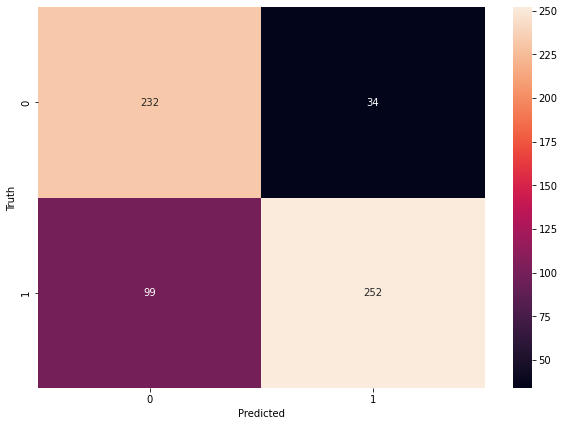

In [314]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=y_test,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [315]:
y_pred=pd.DataFrame(y_pred)

In [316]:
X_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_ann_max.xlsx")
y_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_ann_max.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_ann_max.xlsx")

In [317]:
df_x=X[2847:]
df_y=y[2847:]

In [318]:
yp = model.predict(df_x)
yp[:5]

array([[0.91896474],
       [0.9779244 ],
       [0.96752816],
       [0.9524936 ],
       [1.        ]], dtype=float32)

In [319]:
y_pred1 = []
for element in yp:
    if element > 0.5:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [320]:
y_pred1[:10]

[1, 1, 1, 1, 1, 0, 1, 1, 1, 1]

In [321]:
df_y[:10]

2848    1
2849    1
2850    1
2851    1
2852    1
2853    1
2854    1
2855    1
2856    1
2857    1
Name: Result15, dtype: int64

In [322]:
y_pred1=pd.DataFrame(y_pred1)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_ann_max_test.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_ann_max_test.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_ann_max_test.xlsx")

In [323]:
###CNN starts here



In [324]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
sns.set()

In [325]:
df =pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/2 month.csv")
df.head()

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result5
0,ALMONDZ GLOBAL SECURITIES LTD.,ALMONDZ,61581,1.264405e+05,0,0.0,61581,1.264405e+05,2.05,10-01-2015,...,2.93,0.10,-18.00,-8.00,31.00,11.00,3.24,Finance & Investments,PROFIT,PROFIT
1,ATUL LTD.,ATUL,18541,2.410243e+07,0,0.0,18541,2.410243e+07,1299.95,10-01-2015,...,81.13,0.26,306.00,-167.00,-124.00,326.00,19.54,Dyes And Pigments,PROFIT,LOSS
2,GMR INFRASTRUCTURE LTD.,GMRINFRA,14096100,3.017007e+07,0,0.0,14096100,3.017007e+07,2.14,10-01-2015,...,-5.16,0.02,2915.00,-3159.00,448.00,-2806.00,-2.65,Engineering - Turnkey Services,PROFIT,PROFIT
3,INDOWIND ENERGY LTD.,INDOWIND,3675498,1.419600e+07,0,0.0,3675498,1.419600e+07,3.86,10-01-2015,...,0.03,0.03,1.88,6.33,-8.58,0.51,145.00,Power Generation And Supply,PROFIT,PROFIT
4,JAGRAN PRAKASHAN LTD.,JAGRAN,1043972,1.458429e+08,0,0.0,1043972,1.458429e+08,139.70,10-01-2015,...,9.42,0.22,439.00,-441.00,17.00,418.00,15.26,Entertainment / Electronic Media Software,PROFIT,PROFIT


In [326]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4241 entries, 0 to 4240
Data columns (total 32 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Row Labels             4241 non-null   object 
 1   Symbol                 4241 non-null   object 
 2   No of Shares Bought    4241 non-null   int64  
 3   Value of purchase      4241 non-null   float64
 4   No of shares sold      4241 non-null   int64  
 5   Value of sale          4241 non-null   float64
 6   No of shares           4241 non-null   int64  
 7   Value                  4241 non-null   float64
 8   Avg Price              4241 non-null   float64
 9   Buy Date               4241 non-null   object 
 10  Sell date              4241 non-null   object 
 11  Buy price              4241 non-null   float64
 12  Sell price             4241 non-null   float64
 13  Nifty Index at buying  4241 non-null   float64
 14  Nfty index at selling  4241 non-null   float64
 15  Chan

In [327]:
df['Cap']

0       SmallCap
1       SmallCap
2         MidCap
3       SmallCap
4       SmallCap
          ...   
4236    SmallCap
4237    SmallCap
4238    SmallCap
4239    SmallCap
4240    SmallCap
Name: Cap, Length: 4241, dtype: object

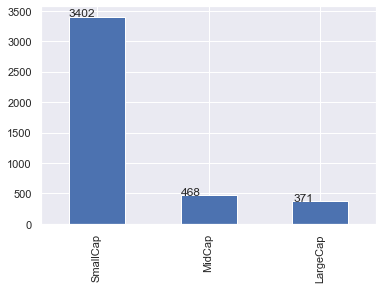

In [328]:
#Cap
ax = df.Cap.value_counts().plot(kind='bar')

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

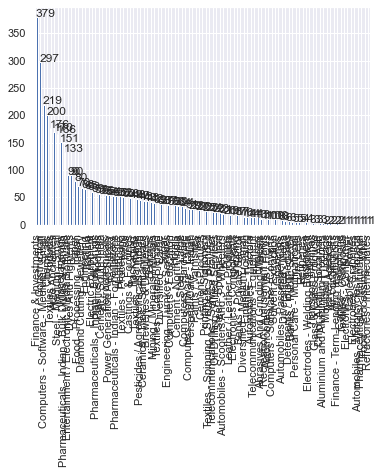

In [329]:
#Industry
ax = df.Industry.value_counts().plot(kind='bar')

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

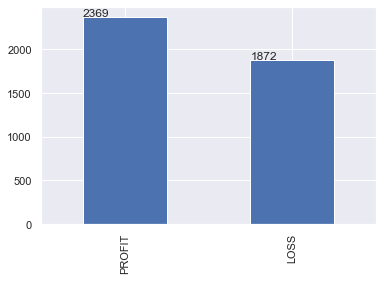

In [330]:
#Return
ax = df.Result.value_counts().plot(kind='bar')

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

In [331]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result']=df['Result'].map(r)

In [332]:
df['Cap']

0       0
1       0
2       1
3       0
4       0
       ..
4236    0
4237    0
4238    0
4239    0
4240    0
Name: Cap, Length: 4241, dtype: int64

<AxesSubplot:>

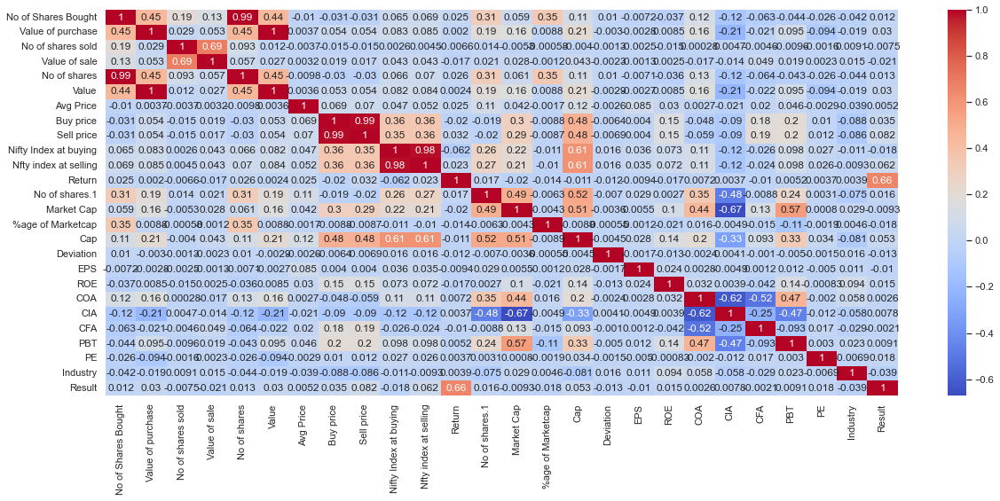

In [333]:
## Feature correlation
plt.figure(figsize=(20,8))
sns.heatmap(df.corr(), annot=True, cmap="coolwarm")

In [334]:
df.drop('Buy Date',1,inplace=True)
df.drop('Sell date',1,inplace=True)
df.drop('Row Labels',1,inplace=True)
#df.drop('Symbol',1,inplace=True)
df.drop('Return',1,inplace=True)
df.drop('Sell price',1,inplace=True)
df.drop('Result5',axis=1,inplace=True)
#df.drop('Nifty Index at buying',axis=1,inplace=True)
#df.drop('Nfty index at selling',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\3790309478.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Buy Date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\3790309478.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Sell date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\3790309478.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Row Labels',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\3790309478.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Return',1,inplace=True)
C:\Users\Anmol Choubey\

<AxesSubplot:>

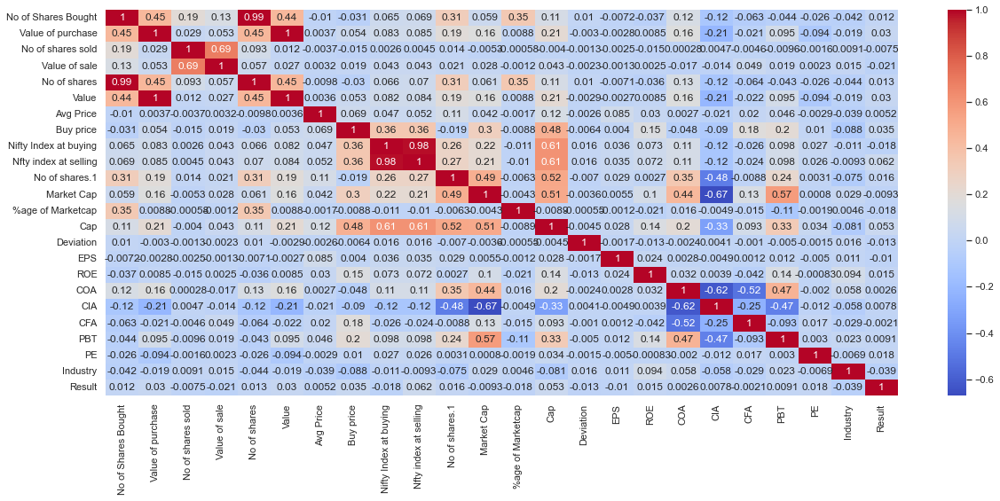

In [335]:
## Feature correlation
plt.figure(figsize=(20,8))
sns.heatmap(df.corr(), annot=True, cmap="coolwarm")

In [336]:
df['code'] = pd.factorize(df['Symbol'])[0] + 1

In [337]:
df.drop('Symbol',1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\265036371.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Symbol',1,inplace=True)


In [338]:
df_feature = df.drop('Result',axis='columns')
df_label = df['Result']

In [339]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.129067,-0.107008,-0.047593,-0.082351,-0.126057,-0.105010,-0.092596,-0.444790,-0.700391,-0.655708,...,-0.028060,-0.058507,-0.220014,-0.130812,0.148124,0.015864,-0.173498,-0.087246,-1.174670,-1.400415
1,-0.136307,-0.091216,-0.047593,-0.082351,-0.133405,-0.089202,0.045594,1.640970,-0.700391,-0.655708,...,-0.028065,0.001528,0.739882,-0.059730,0.101365,-0.034456,-0.061655,-0.010550,-1.128896,-1.394445
2,2.231717,-0.087220,-0.047593,-0.082351,2.269995,-0.085202,-0.092586,-0.439296,1.112107,1.086441,...,-0.028058,-0.064718,-0.699962,0.512658,-0.778526,0.151242,-1.173701,-0.114960,-1.083121,-1.388474
3,0.478839,-0.097741,-0.047593,-0.082351,0.490931,-0.095734,-0.092403,-0.451608,-0.700391,-0.655708,...,-0.028066,-0.060733,-0.639968,-0.126450,0.152338,0.003015,-0.177223,0.579773,-1.037347,-1.382503
4,0.036183,-0.011034,-0.047593,-0.082351,0.041662,-0.008938,-0.077940,-0.267066,-0.700391,-0.655708,...,-0.028066,-0.053524,0.499908,-0.030551,0.020787,0.011319,-0.028989,-0.030688,-0.991572,-1.376533


In [340]:
from sklearn.model_selection import train_test_split

X_big, X_test, y_big, y_test = train_test_split(df_feature_scaler, df_label, test_size=0.2, random_state=27)
#becase the data isn't too much, so I take the validation data from train data
X_train, X_val, y_train, y_val = train_test_split(X_big, y_big, test_size=0.2, random_state=27)

In [341]:
print(X_big.shape, X_val.shape, X_test.shape,X_train.shape)

(3392, 24) (679, 24) (849, 24) (2713, 24)


In [342]:
np.savez('main_train', inputs=X_train, targets=y_train)
np.savez('main_val', inputs=X_val, targets=y_val)
np.savez('main_test', inputs=X_test, targets=y_test)

In [343]:
npz_train = np.load('main_train.npz')
train_inputs, train_targets = npz_train['inputs'].astype(np.float), npz_train['targets'].astype(int)

npz_val = np.load('main_val.npz')
val_inputs, val_targets = npz_val['inputs'].astype(np.float), npz_val['targets'].astype(int)

npz_test = np.load('main_test.npz')
test_inputs, test_targets = npz_test['inputs'].astype(np.float), npz_test['targets'].astype(int)

In [344]:
#MODEL

import tensorflow as tf
hidden_layer_size = 150
output_size = 2 #0 and 1

#3 hidden layer, depth 100
model = tf.keras.Sequential([
    tf.keras.layers.Dense(hidden_layer_size, activation='relu'),
    tf.keras.layers.Dense(hidden_layer_size, activation='relu'),
    tf.keras.layers.Dense(hidden_layer_size, activation='relu'),
    tf.keras.layers.Dense(output_size, activation='softmax')
])

#optimizer
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

early_stopping = tf.keras.callbacks.EarlyStopping(patience=2)
history = model.fit(train_inputs,
          train_targets,
          batch_size = 200,
          epochs = 30,
          #callbacks = [early_stopping],
          validation_data = (val_inputs, val_targets),
          verbose = 2)

Epoch 1/30
14/14 - 0s - loss: 0.6891 - accuracy: 0.5687 - val_loss: 0.6961 - val_accuracy: 0.5140
Epoch 2/30
14/14 - 0s - loss: 0.6672 - accuracy: 0.5901 - val_loss: 0.6790 - val_accuracy: 0.5817
Epoch 3/30
14/14 - 0s - loss: 0.6488 - accuracy: 0.6366 - val_loss: 0.6698 - val_accuracy: 0.5773
Epoch 4/30
14/14 - 0s - loss: 0.6261 - accuracy: 0.6616 - val_loss: 0.6498 - val_accuracy: 0.6215
Epoch 5/30
14/14 - 0s - loss: 0.6064 - accuracy: 0.6782 - val_loss: 0.6370 - val_accuracy: 0.6377
Epoch 6/30
14/14 - 0s - loss: 0.5783 - accuracy: 0.7081 - val_loss: 0.6078 - val_accuracy: 0.6996
Epoch 7/30
14/14 - 0s - loss: 0.5592 - accuracy: 0.7162 - val_loss: 0.5961 - val_accuracy: 0.6966
Epoch 8/30
14/14 - 0s - loss: 0.5476 - accuracy: 0.7287 - val_loss: 0.5985 - val_accuracy: 0.6951
Epoch 9/30
14/14 - 0s - loss: 0.5412 - accuracy: 0.7306 - val_loss: 0.5849 - val_accuracy: 0.7069
Epoch 10/30
14/14 - 0s - loss: 0.5381 - accuracy: 0.7291 - val_loss: 0.6018 - val_accuracy: 0.6981
Epoch 11/30
14/14 -

In [345]:
def plot_learningCurve(history, epochs):
  epoch_range = range(1, epochs+1)
  plt.plot(epoch_range, history.history['accuracy'])
  plt.plot(epoch_range, history.history['val_accuracy'])
  plt.title('Model Accuracy')
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy')
  plt.legend(['Train', 'Val'], loc='upper right')
  plt.show()

  plt.plot(epoch_range, history.history['loss'])
  plt.plot(epoch_range, history.history['val_loss'])
  plt.title('Model Loss')
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.legend(['Train', 'Val'], loc='upper right')
  plt.show()

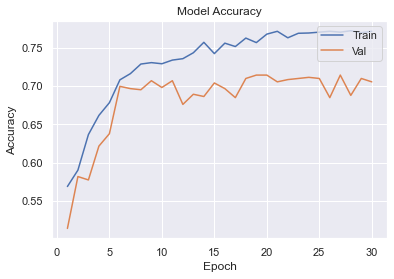

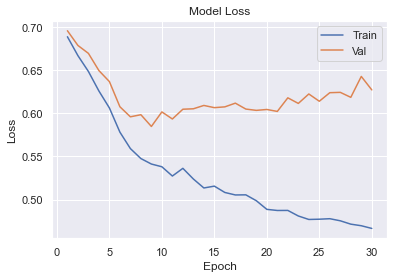

In [346]:
plot_learningCurve(history, 30)

In [347]:
test_loss, test_accuracy = model.evaluate(test_inputs, test_targets)
print("Test loss: {0:.2f} and Test accuracy: {1:.2f}% ".format(test_loss,test_accuracy*100))

27/27 [==============================] - 0s 628us/step - loss: 0.7105 - accuracy: 0.6761
Test loss: 0.71 and Test accuracy: 67.61% 


In [348]:
yp = model.predict(test_inputs)
yp[:5]

array([[0.9377526 , 0.06224741],
       [0.73503315, 0.26496682],
       [0.5377988 , 0.46220112],
       [0.40176925, 0.5982307 ],
       [0.82472575, 0.17527424]], dtype=float32)

In [349]:
test_targets[:10]

array([0, 0, 1, 1, 0, 0, 0, 0, 0, 0])

In [350]:
y_pred = []
for element in yp:
    if element[1] > element[0]:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [351]:
y_pred=pd.DataFrame(y_pred)

In [352]:
y_pred[:10]

,0
0,0
1,0
2,0
3,1
4,0
5,1
6,0
7,0
8,0
9,0


Text(66.5, 0.5, 'Truth')

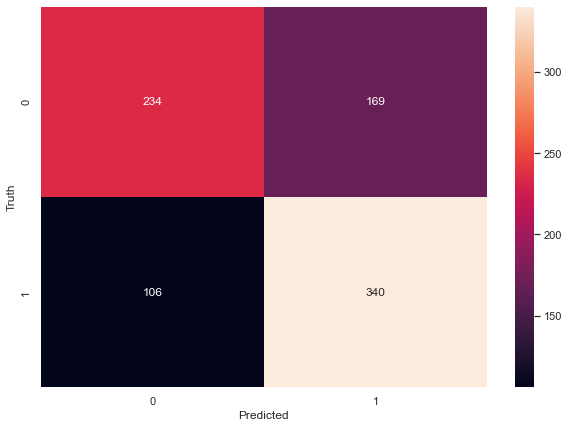

In [353]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=test_targets,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [354]:
test_inputs=pd.DataFrame(test_inputs)
test_targets=pd.DataFrame(test_targets)

In [355]:
#imp
test_inputs.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_cnn_2mon.xlsx")
test_targets.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_cnn_2mon.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_cnn_2mon.xlsx")

In [356]:
df_x=df_feature_scaler[3990:]
df_y=df_label[3990:]

In [357]:
yp = model.predict(df_x)
yp[:5]

array([[1.7248550e-01, 8.2751453e-01],
       [1.2800637e-08, 1.0000000e+00],
       [4.8605058e-01, 5.1394945e-01],
       [1.1383524e-02, 9.8861653e-01],
       [3.7133375e-01, 6.2866622e-01]], dtype=float32)

In [359]:
y_pred1 = []
for element in yp:
    if element[1] > element[0]:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [360]:
y_pred1[:10]

[1, 1, 1, 1, 1, 1, 1, 0, 0, 1]

In [361]:
df_y[:10]

3990    1
3991    1
3992    0
3993    1
3994    1
3995    1
3996    1
3997    0
3998    0
3999    1
Name: Result, dtype: int64

In [362]:
y_pred1=pd.DataFrame(y_pred1)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_cnn_2mon_test.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_cnn_2mon_test.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_cnn_2mon_test.xlsx")

In [363]:
## 6 months starts here CNN



In [364]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
sns.set()

In [365]:
df1 = pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/6 months.csv")
df1.sample(5)

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result10
803,DIVI'S LABORATORIES LTD.,DIVISLAB,28640,19347261.00,0,0.0,28640,19347261.00,675.53,09-01-2017,...,39.95,0.2900,1150.00,-1140.00,2.00,1395.00,17.75,Pharmaceuticals - Indian - Bulk Drugs,PROFIT,PROFIT
3424,D B Corp Ltd,DBCORP,201139,15405837.00,0,0.0,201139,15405837.00,76.59,10-01-2020,...,15.72,0.1900,363.00,-154.00,-307.00,348.00,5.06,Entertainment / Electronic Media Software,PROFIT,PROFIT
3800,Signet Industries Limited,SIGIND,25549,831943.00,0,0.0,25549,831943.00,32.56,03-01-2021,...,4.01,0.1600,12.00,9.00,-13.00,17.00,8.60,Trading,PROFIT,PROFIT
2867,COMPUCOM SOFTWARE LTD.-$,COMPUSOFT,25956,200047.00,0,0.0,25956,200047.00,7.71,02-01-2020,...,0.45,0.0417,10.48,-14.05,-0.07,5.18,16.11,Computers - Education,PROFIT,LOSS
528,ONWARD TECHNOLOGIES LTD.,ONWARDTEC,16300,1122202.23,0,0.0,16300,1122202.23,68.85,01-01-2017,...,2.14,0.1900,10.00,-1.00,-9.00,8.00,31.21,Computers - Software - Medium / Small,PROFIT,PROFIT


In [366]:
print(df1.isnull().sum())
df1 = df1.dropna(how='any',axis=0) 
print(df1.isnull().sum())

Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            2
No of shares             0
Value                    0
Avg Price                0
Buy Date                 0
Sell date                0
Buy price                0
Sell price               0
Nifty Index at buying    0
Nfty index at selling    0
Change in Nifty 50       0
Return                   0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Result                   0
Result10                 0
dtype: int64
Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares so

In [367]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df1['Cap']=df1['Cap'].map(c)
i={}
count=0
for _ in df1['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df1['Industry']=df1['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df1['Result']=df1['Result'].map(r)

In [368]:
df1['Cap']

0       0
1       0
2       1
3       0
4       0
       ..
4066    2
4067    0
4068    0
4069    0
4070    1
Name: Cap, Length: 4069, dtype: int64

In [369]:
df1.drop('Buy Date',1,inplace=True)
df1.drop('Sell date',1,inplace=True)
df1.drop('Row Labels',1,inplace=True)
#df1.drop('Symbol',1,inplace=True)
df1.drop('Return',1,inplace=True)
df1.drop('Sell price',1,inplace=True)
df1.drop('Result10',axis=1,inplace=True)
#df1.drop('Nifty Index at buying',axis=1,inplace=True)
#df1.drop('Nfty index at selling',axis=1,inplace=True)
df1.drop('Change in Nifty 50',axis=1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\907829336.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df1.drop('Buy Date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\907829336.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df1.drop('Sell date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\907829336.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df1.drop('Row Labels',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\907829336.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df1.drop('Return',1,inplace=True)
C:\Users\Anmol Choubey\

<AxesSubplot:>

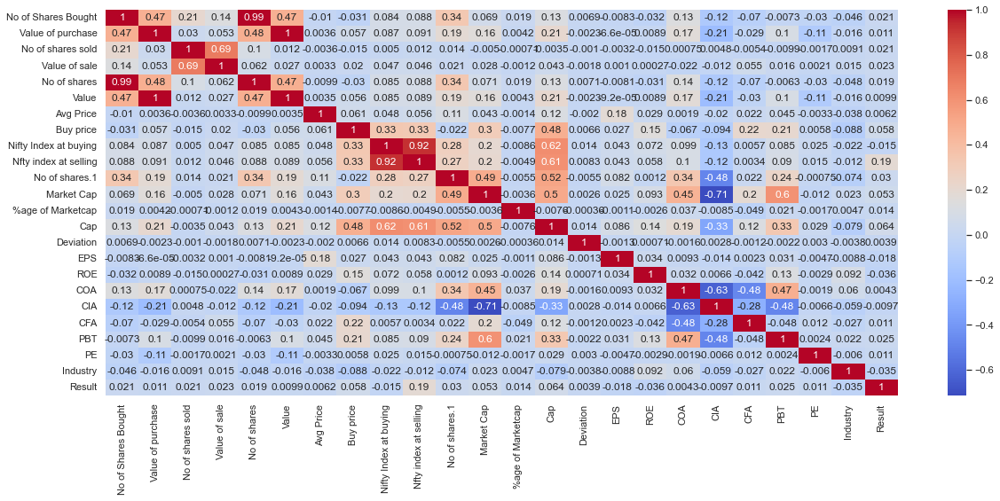

In [370]:
## Feature correlation
plt.figure(figsize=(20,8))
sns.heatmap(df1.corr(), annot=True, cmap="coolwarm")

In [371]:
df1['code'] = pd.factorize(df1['Symbol'])[0] + 1

In [372]:
df1.drop('Symbol',1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\985873070.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df1.drop('Symbol',1,inplace=True)


In [373]:
df1_feature = df1.drop('Result',axis='columns')
df1_label = df1['Result']

In [374]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df1_feature)
df1_feature_scaler = scaler.transform(df1_feature) #return in ndarray

#convert to dataframe
df1_feature_scaler = pd.DataFrame(data=df1_feature_scaler,columns=df1_feature.columns)
df1_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.133236,-0.106103,-0.047801,-0.081043,-0.130212,-0.104125,-0.090731,-0.455363,-0.681147,-0.814616,...,-0.021631,-0.065135,-0.219695,-0.122020,0.146417,0.000484,-0.170855,-0.085491,-1.173138,-1.406195
1,-0.140797,-0.090406,-0.047801,-0.081043,-0.137901,-0.088412,0.044707,1.829228,-0.681147,-0.814616,...,-0.021644,0.057697,0.728894,-0.049158,0.100029,-0.051379,-0.055526,-0.009718,-1.127087,-1.400179
2,2.332115,-0.086434,-0.047801,-0.081043,2.377162,-0.084435,-0.090721,-0.449345,1.239044,0.923055,...,-0.021625,-0.077842,-0.693990,0.537563,-0.772881,0.140014,-1.202220,-0.112871,-1.081036,-1.394163
3,0.501596,-0.096892,-0.047801,-0.081043,0.515442,-0.094904,-0.090542,-0.462831,-0.681147,-0.814616,...,-0.021645,-0.069690,-0.653082,-0.117549,0.150598,-0.012759,-0.174695,0.573498,-1.034984,-1.388146
4,0.039334,-0.010704,-0.047801,-0.081043,0.045300,-0.008627,-0.076367,-0.260697,-0.681147,-0.814616,...,-0.021645,-0.054941,0.491747,-0.019248,0.020090,-0.004200,-0.021843,-0.029615,-0.988933,-1.382130


In [375]:
from sklearn.model_selection import train_test_split

X1_big, X1_test, y1_big, y1_test = train_test_split(df1_feature_scaler, df1_label, test_size=0.2, random_state=27)
#becase the data isn't too much, so I take the validation data from train data
X1_train, X1_val, y1_train, y1_val = train_test_split(X1_big, y1_big, test_size=0.2, random_state=27)

In [376]:
print(X1_big.shape, X1_val.shape, X1_test.shape,X1_train.shape)

(3255, 24) (651, 24) (814, 24) (2604, 24)


In [377]:
np.savez('main_6_months_train', inputs=X1_train, targets=y1_train)
np.savez('main_6_months_val', inputs=X1_val, targets=y1_val)
np.savez('main_6_months_test', inputs=X1_test, targets=y1_test)

In [378]:
npz_train1 = np.load('main_6_months_train.npz')
train_inputs1, train_targets1 = npz_train1['inputs'].astype(np.float), npz_train1['targets'].astype(int)

npz_val1 = np.load('main_6_months_val.npz')
val_inputs1, val_targets1 = npz_val1['inputs'].astype(np.float), npz_val1['targets'].astype(int)

npz_test1 = np.load('main_6_months_test.npz')
test_inputs1, test_targets1 = npz_test1['inputs'].astype(np.float), npz_test1['targets'].astype(int)

In [379]:
#MODEL

import tensorflow as tf
hidden_layer_size = 150
output_size = 2 #0 and 1

#3 hidden layer, depth 100
model = keras.Sequential([
    tf.keras.layers.Dense(hidden_layer_size, activation='relu'),
    tf.keras.layers.Dense(hidden_layer_size, activation='relu'),
    tf.keras.layers.Dense(hidden_layer_size, activation='relu'),
    tf.keras.layers.Dense(output_size, activation='softmax')
])

#optimizer
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

#early_stopping = tf.keras.callbacks.EarlyStopping(patience=2)
history = model.fit(train_inputs1,
          train_targets1,
          batch_size = 200,
          epochs = 30,
          #callbacks = [early_stopping],
          validation_data = (val_inputs, val_targets),
          verbose = 2)

Epoch 1/30
14/14 - 0s - loss: 0.6753 - accuracy: 0.5707 - val_loss: 0.6879 - val_accuracy: 0.5744
Epoch 2/30
14/14 - 0s - loss: 0.6286 - accuracy: 0.6263 - val_loss: 0.6739 - val_accuracy: 0.5700
Epoch 3/30
14/14 - 0s - loss: 0.5756 - accuracy: 0.7239 - val_loss: 0.6691 - val_accuracy: 0.5965
Epoch 4/30
14/14 - 0s - loss: 0.5208 - accuracy: 0.7519 - val_loss: 0.6545 - val_accuracy: 0.6171
Epoch 5/30
14/14 - 0s - loss: 0.5051 - accuracy: 0.7646 - val_loss: 0.6448 - val_accuracy: 0.6627
Epoch 6/30
14/14 - 0s - loss: 0.4954 - accuracy: 0.7680 - val_loss: 0.6356 - val_accuracy: 0.6642
Epoch 7/30
14/14 - 0s - loss: 0.4881 - accuracy: 0.7792 - val_loss: 0.6482 - val_accuracy: 0.6480
Epoch 8/30
14/14 - 0s - loss: 0.4842 - accuracy: 0.7734 - val_loss: 0.6365 - val_accuracy: 0.6642
Epoch 9/30
14/14 - 0s - loss: 0.4833 - accuracy: 0.7849 - val_loss: 0.6708 - val_accuracy: 0.6362
Epoch 10/30
14/14 - 0s - loss: 0.4935 - accuracy: 0.7654 - val_loss: 0.6512 - val_accuracy: 0.6686
Epoch 11/30
14/14 -

In [380]:
def plot_learningCurve(history, epochs):
  epoch_range = range(1, epochs+1)
  plt.plot(epoch_range, history.history['accuracy'])
  plt.plot(epoch_range, history.history['val_accuracy'])
  plt.title('Model Accuracy')
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy')
  plt.legend(['Train', 'Val'], loc='upper right')
  plt.show()

  plt.plot(epoch_range, history.history['loss'])
  plt.plot(epoch_range, history.history['val_loss'])
  plt.title('Model Loss')
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.legend(['Train', 'Val'], loc='upper right')
  plt.show()

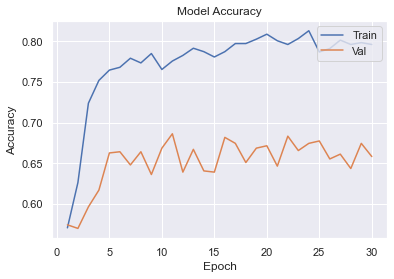

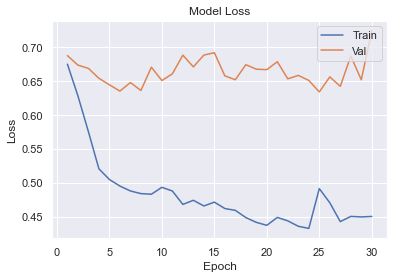

In [381]:
plot_learningCurve(history, 30)

In [382]:
test_loss, test_accuracy = model.evaluate(test_inputs1, test_targets1)
print("Test loss: {0:.2f} and Test accuracy: {1:.2f}% ".format(test_loss,test_accuracy*100))

26/26 [==============================] - 0s 614us/step - loss: 0.6658 - accuracy: 0.7248
Test loss: 0.67 and Test accuracy: 72.48% 


In [383]:
yp = model.predict(test_inputs1)
yp[:5]

array([[0.6058233 , 0.39417675],
       [0.08975524, 0.91024476],
       [0.91739434, 0.08260562],
       [0.11548341, 0.88451666],
       [0.12919106, 0.87080896]], dtype=float32)

In [384]:
y_pred = []
for element in yp:
    if element[1] > element[0]:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [385]:
y_pred=pd.DataFrame(y_pred)

In [386]:
y_pred[:10]

,0
0,0
1,1
2,0
3,1
4,1
5,1
6,1
7,0
8,1
9,1


In [387]:
test_targets1[:10]

array([0, 0, 0, 1, 1, 1, 1, 0, 1, 0])

Text(66.5, 0.5, 'Truth')

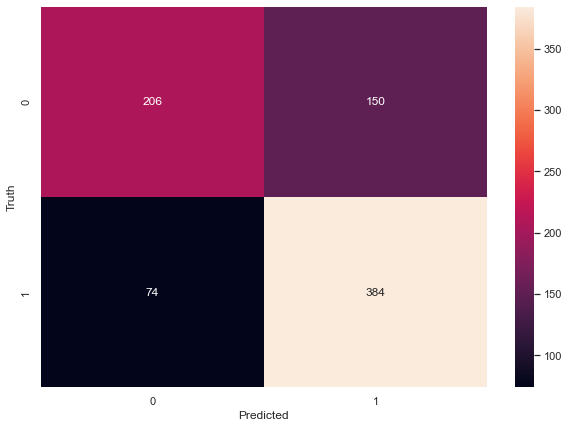

In [388]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=test_targets1,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [389]:
test_inputs1=pd.DataFrame(test_inputs1)
test_targets1=pd.DataFrame(test_targets1)

In [390]:
#imp
test_inputs1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_cnn_6mon.xlsx")
test_targets1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_cnn_6mon.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_cnn_6mon.xlsx")

In [391]:
df_x=df_feature_scaler[3806:]
df_y=df_label[3806:]

In [392]:
yp = model.predict(df_x)
yp[:5]

array([[0.13245733, 0.8675426 ],
       [0.12781633, 0.8721836 ],
       [0.14560285, 0.8543972 ],
       [0.13846682, 0.86153316],
       [0.05673978, 0.9432602 ]], dtype=float32)

In [393]:
y_pred1 = []
for element in yp:
    if element[1] > element[0]:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [394]:
y_pred1[:10]

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

In [395]:
df_y[:10]

3806    1
3807    1
3808    1
3809    1
3810    1
3811    0
3812    1
3813    1
3814    1
3815    1
Name: Result, dtype: int64

In [396]:
y_pred1=pd.DataFrame(y_pred1)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_cnn_6mon_test.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_cnn_6mon_test.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_cnn_6mon_test.xlsx")

In [397]:
# 9 months

In [398]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
sns.set()

In [399]:
df =pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/9 months.csv")
df.head()

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result13
0,ALMONDZ GLOBAL SECURITIES LTD.,ALMONDZ,61581,1.264405e+05,0,0.0,61581,1.264405e+05,2.05,10-01-2015,...,2.93,0.10,-18.00,-8.00,31.00,11.00,3.24,Finance & Investments,PROFIT,PROFIT
1,ATUL LTD.,ATUL,18541,2.410243e+07,0,0.0,18541,2.410243e+07,1299.95,10-01-2015,...,81.13,0.26,306.00,-167.00,-124.00,326.00,19.54,Dyes And Pigments,PROFIT,PROFIT
2,GMR INFRASTRUCTURE LTD.,GMRINFRA,14096100,3.017007e+07,0,0.0,14096100,3.017007e+07,2.14,10-01-2015,...,-5.16,0.02,2915.00,-3159.00,448.00,-2806.00,-2.65,Engineering - Turnkey Services,LOSS,LOSS
3,INDOWIND ENERGY LTD.,INDOWIND,3675498,1.419600e+07,0,0.0,3675498,1.419600e+07,3.86,10-01-2015,...,0.03,0.03,1.88,6.33,-8.58,0.51,145.00,Power Generation And Supply,PROFIT,LOSS
4,JAGRAN PRAKASHAN LTD.,JAGRAN,1043972,1.458429e+08,0,0.0,1043972,1.458429e+08,139.70,10-01-2015,...,9.42,0.22,439.00,-441.00,17.00,418.00,15.26,Entertainment / Electronic Media Software,PROFIT,PROFIT


In [400]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            2
No of shares             0
Value                    0
Avg Price                0
Buy Date                 0
Sell date                0
Buy price                0
Sell price               0
Nifty Index at buying    0
Nfty index at selling    0
Change in Nifty 50       0
Return                   0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Result                   0
Result13                 0
dtype: int64
Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares so

In [401]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3930 entries, 0 to 3931
Data columns (total 32 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Row Labels             3930 non-null   object 
 1   Symbol                 3930 non-null   object 
 2   No of Shares Bought    3930 non-null   int64  
 3   Value of purchase      3930 non-null   float64
 4   No of shares sold      3930 non-null   int64  
 5   Value of sale          3930 non-null   float64
 6   No of shares           3930 non-null   int64  
 7   Value                  3930 non-null   float64
 8   Avg Price              3930 non-null   float64
 9   Buy Date               3930 non-null   object 
 10  Sell date              3930 non-null   object 
 11  Buy price              3930 non-null   float64
 12  Sell price             3930 non-null   float64
 13  Nifty Index at buying  3930 non-null   float64
 14  Nfty index at selling  3930 non-null   float64
 15  Chan

In [402]:
df['Cap']

0       SmallCap
1       SmallCap
2         MidCap
3       SmallCap
4       SmallCap
          ...   
3927    SmallCap
3928    SmallCap
3929    SmallCap
3930      MidCap
3931    SmallCap
Name: Cap, Length: 3930, dtype: object

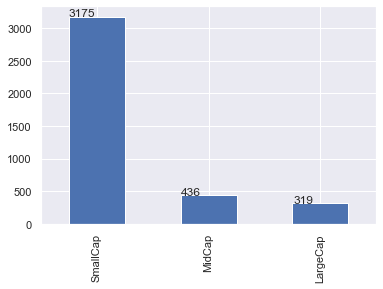

In [403]:
#Cap
ax = df.Cap.value_counts().plot(kind='bar')

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

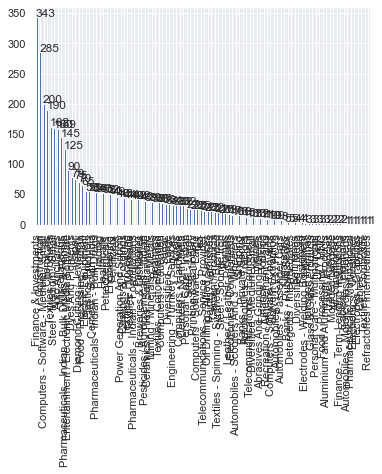

In [404]:
#Industry
ax = df.Industry.value_counts().plot(kind='bar')

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

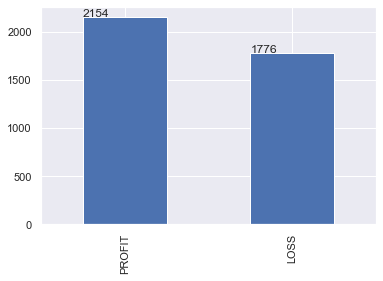

In [405]:
#Return
ax = df.Result.value_counts().plot(kind='bar')

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

In [406]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result']=df['Result'].map(r)

In [407]:
df['Cap']

0       0
1       0
2       1
3       0
4       0
       ..
3927    0
3928    0
3929    0
3930    1
3931    0
Name: Cap, Length: 3930, dtype: int64

<AxesSubplot:>

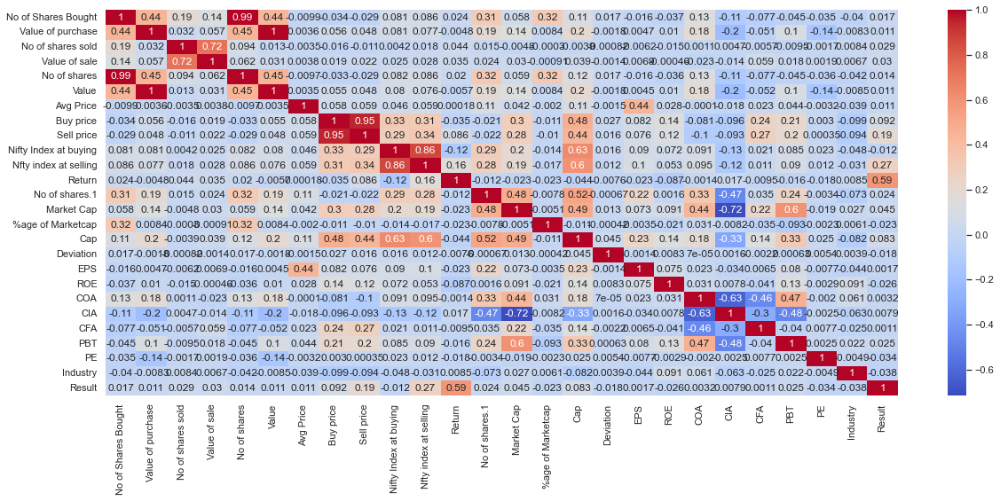

In [408]:
## Feature correlation
plt.figure(figsize=(20,8))
sns.heatmap(df.corr(), annot=True, cmap="coolwarm")

In [409]:
df.drop('Buy Date',1,inplace=True)
df.drop('Sell date',1,inplace=True)
df.drop('Row Labels',1,inplace=True)
#df.drop('Symbol',1,inplace=True)
df.drop('Return',1,inplace=True)
df.drop('Sell price',1,inplace=True)
df.drop('Result13',axis=1,inplace=True)
#df.drop('Nifty Index at buying',axis=1,inplace=True)
#df.drop('Nfty index at selling',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\3209962728.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Buy Date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\3209962728.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Sell date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\3209962728.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Row Labels',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\3209962728.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Return',1,inplace=True)
C:\Users\Anmol Choubey\

<AxesSubplot:>

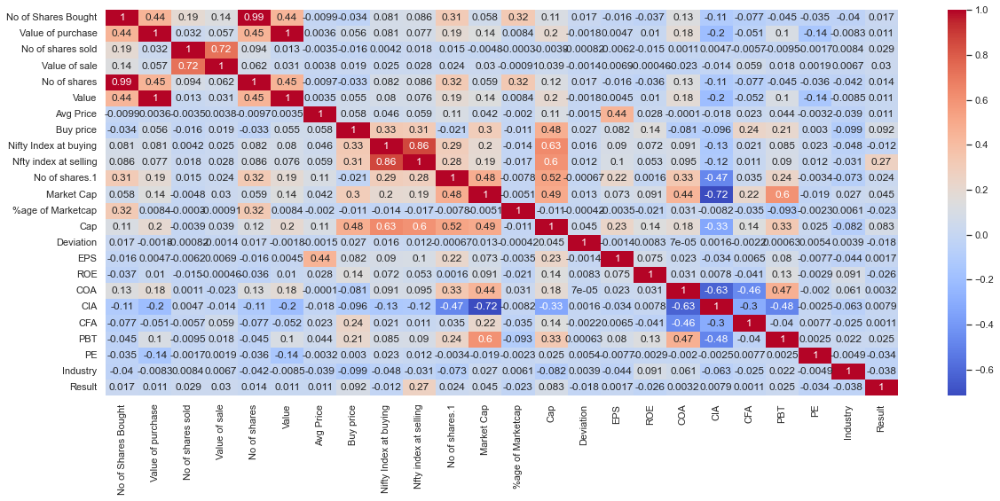

In [410]:
## Feature correlation
plt.figure(figsize=(20,8))
sns.heatmap(df.corr(), annot=True, cmap="coolwarm")

In [411]:
df['code'] = pd.factorize(df['Symbol'])[0] + 1

In [412]:
df.drop('Symbol',1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\265036371.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Symbol',1,inplace=True)


In [413]:
df_feature = df.drop('Result',axis='columns')
df_label = df['Result']

In [414]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.130340,-0.104660,-0.047655,-0.07972,-0.127341,-0.102724,-0.088595,-0.462558,-0.670799,-0.625330,...,-0.017149,-0.126163,-0.218315,-0.118179,0.144161,-0.004288,-0.163808,-0.082390,-1.174266,-1.409639
1,-0.137344,-0.088224,-0.047655,-0.07972,-0.134451,-0.086269,0.045684,1.947347,-0.670799,-0.625330,...,-0.017177,0.182627,0.720264,-0.045201,0.097982,-0.056017,-0.050900,-0.007642,-1.127962,-1.403525
2,2.153616,-0.084064,-0.047655,-0.07972,2.191031,-0.082105,-0.088586,-0.456210,1.353829,1.120459,...,-0.017135,-0.158108,-0.687605,0.542457,-0.771012,0.134879,-1.173527,-0.109400,-1.081658,-1.397411
3,0.457783,-0.095015,-0.047655,-0.07972,0.469645,-0.093068,-0.088408,-0.470435,-0.670799,-0.625330,...,-0.017178,-0.137614,-0.628944,-0.113701,0.148323,-0.017498,-0.167568,0.567691,-1.035354,-1.391297
4,0.029533,-0.004766,-0.047655,-0.07972,0.034941,-0.002717,-0.074354,-0.257214,-0.670799,-0.625330,...,-0.017178,-0.100536,0.485619,-0.015243,0.018401,-0.008961,-0.017924,-0.027269,-0.989051,-1.385183


In [415]:
from sklearn.model_selection import train_test_split

X_big, X_test, y_big, y_test = train_test_split(df_feature_scaler, df_label, test_size=0.2, random_state=27)
#becase the data isn't too much, so I take the validation data from train data
X_train, X_val, y_train, y_val = train_test_split(X_big, y_big, test_size=0.2, random_state=27)

In [416]:
print(X_big.shape, X_val.shape, X_test.shape,X_train.shape)

(3144, 24) (629, 24) (786, 24) (2515, 24)


In [417]:
np.savez('main_train', inputs=X_train, targets=y_train)
np.savez('main_val', inputs=X_val, targets=y_val)
np.savez('main_test', inputs=X_test, targets=y_test)

In [418]:
npz_train = np.load('main_train.npz')
train_inputs, train_targets = npz_train['inputs'].astype(np.float), npz_train['targets'].astype(int)

npz_val = np.load('main_val.npz')
val_inputs, val_targets = npz_val['inputs'].astype(np.float), npz_val['targets'].astype(int)

npz_test = np.load('main_test.npz')
test_inputs, test_targets = npz_test['inputs'].astype(np.float), npz_test['targets'].astype(int)

In [419]:
#MODEL

import tensorflow as tf
hidden_layer_size = 150
output_size = 2 #0 and 1

#3 hidden layer, depth 100
model = tf.keras.Sequential([
    tf.keras.layers.Dense(hidden_layer_size, activation='relu'),
    tf.keras.layers.Dense(hidden_layer_size, activation='relu'),
    tf.keras.layers.Dense(hidden_layer_size, activation='relu'),
    tf.keras.layers.Dense(output_size, activation='softmax')
])

#optimizer
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

early_stopping = tf.keras.callbacks.EarlyStopping(patience=2)
history = model.fit(train_inputs,
          train_targets,
          batch_size = 200,
          epochs = 30,
          #callbacks = [early_stopping],
          validation_data = (val_inputs, val_targets),
          verbose = 2)

Epoch 1/30
13/13 - 0s - loss: 0.6584 - accuracy: 0.6076 - val_loss: 0.6316 - val_accuracy: 0.7011
Epoch 2/30
13/13 - 0s - loss: 0.5707 - accuracy: 0.7447 - val_loss: 0.5588 - val_accuracy: 0.7424
Epoch 3/30
13/13 - 0s - loss: 0.4963 - accuracy: 0.7789 - val_loss: 0.5001 - val_accuracy: 0.7886
Epoch 4/30
13/13 - 0s - loss: 0.4639 - accuracy: 0.7881 - val_loss: 0.4814 - val_accuracy: 0.7933
Epoch 5/30
13/13 - 0s - loss: 0.4514 - accuracy: 0.7944 - val_loss: 0.4841 - val_accuracy: 0.7917
Epoch 6/30
13/13 - 0s - loss: 0.4510 - accuracy: 0.7944 - val_loss: 0.4912 - val_accuracy: 0.7949
Epoch 7/30
13/13 - 0s - loss: 0.4420 - accuracy: 0.7992 - val_loss: 0.5130 - val_accuracy: 0.7886
Epoch 8/30
13/13 - 0s - loss: 0.4360 - accuracy: 0.8020 - val_loss: 0.4924 - val_accuracy: 0.7949
Epoch 9/30
13/13 - 0s - loss: 0.4347 - accuracy: 0.8016 - val_loss: 0.5090 - val_accuracy: 0.7838
Epoch 10/30
13/13 - 0s - loss: 0.4267 - accuracy: 0.8119 - val_loss: 0.4815 - val_accuracy: 0.7965
Epoch 11/30
13/13 -

In [420]:
def plot_learningCurve(history, epochs):
  epoch_range = range(1, epochs+1)
  plt.plot(epoch_range, history.history['accuracy'])
  plt.plot(epoch_range, history.history['val_accuracy'])
  plt.title('Model Accuracy')
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy')
  plt.legend(['Train', 'Val'], loc='upper right')
  plt.show()

  plt.plot(epoch_range, history.history['loss'])
  plt.plot(epoch_range, history.history['val_loss'])
  plt.title('Model Loss')
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.legend(['Train', 'Val'], loc='upper right')
  plt.show()

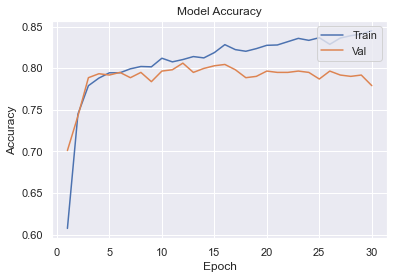

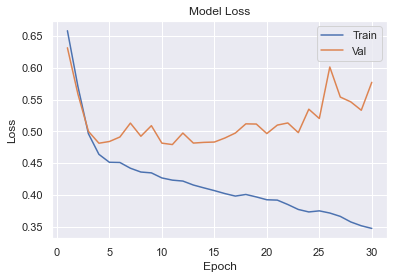

In [421]:
plot_learningCurve(history, 30)

In [422]:
test_loss, test_accuracy = model.evaluate(test_inputs, test_targets)
print("Test loss: {0:.2f} and Test accuracy: {1:.2f}% ".format(test_loss,test_accuracy*100))

25/25 [==============================] - 0s 678us/step - loss: 0.5758 - accuracy: 0.7824
Test loss: 0.58 and Test accuracy: 78.24% 


In [423]:
yp = model.predict(test_inputs)
yp[:5]

array([[0.62935364, 0.3706464 ],
       [0.06905878, 0.9309412 ],
       [0.42945346, 0.5705465 ],
       [0.60483295, 0.3951671 ],
       [0.01568247, 0.98431754]], dtype=float32)

In [424]:
test_targets[:10]

array([0, 1, 0, 0, 1, 1, 1, 1, 0, 1])

In [425]:
y_pred = []
for element in yp:
    if element[1] > element[0]:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [426]:
y_pred=pd.DataFrame(y_pred)

In [427]:
y_pred[:10]

,0
0,0
1,1
2,1
3,0
4,1
5,1
6,1
7,1
8,0
9,1


Text(66.5, 0.5, 'Truth')

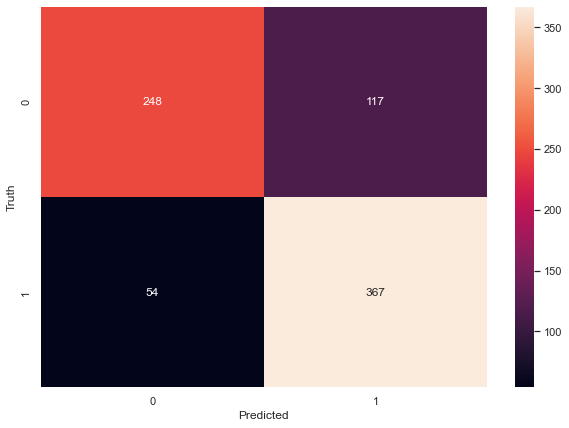

In [428]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=test_targets,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [429]:
test_inputs=pd.DataFrame(test_inputs)
test_targets=pd.DataFrame(test_targets)

In [430]:
#imp
test_inputs.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_cnn_9mon.xlsx")
test_targets.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_cnn_9mon.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_cnn_9mon.xlsx")

In [431]:
df_x=df_feature_scaler[3718:]
df_y=df_label[3718:]

In [432]:
yp = model.predict(df_x)
yp[:5]

array([[0.4204182 , 0.57958174],
       [0.19132593, 0.80867404],
       [0.00625615, 0.99374384],
       [0.00459145, 0.9954085 ],
       [0.00758258, 0.99241745]], dtype=float32)

In [433]:
y_pred1 = []
for element in yp:
    if element[1] > element[0]:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [434]:
y_pred1[:10]

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

In [435]:
df_y[:10]

3720    0
3721    0
3722    1
3723    1
3724    1
3725    1
3726    1
3727    1
3728    1
3729    1
Name: Result, dtype: int64

In [436]:
y_pred1=pd.DataFrame(y_pred1)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_cnn_9mon_test.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_cnn_9mon_test.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_cnn_9mon_test.xlsx")

In [437]:
#12 months

In [438]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
sns.set()

In [439]:
df =pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/12_months.csv")
df.head()

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result15
0,ALMONDZ GLOBAL SECURITIES LTD.,ALMONDZ,61581,1.264405e+05,0,0.0,61581,1.264405e+05,2.05,10-01-2015,...,2.93,0.10,-18.00,-8.00,31.00,11.00,3.24,Finance & Investments,PROFIT,PROFIT
1,ATUL LTD.,ATUL,18541,2.410243e+07,0,0.0,18541,2.410243e+07,1299.95,10-01-2015,...,81.13,0.26,306.00,-167.00,-124.00,326.00,19.54,Dyes And Pigments,PROFIT,PROFIT
2,GMR INFRASTRUCTURE LTD.,GMRINFRA,14096100,3.017007e+07,0,0.0,14096100,3.017007e+07,2.14,10-01-2015,...,-5.16,0.02,2915.00,-3159.00,448.00,-2806.00,-2.65,Engineering - Turnkey Services,LOSS,LOSS
3,INDOWIND ENERGY LTD.,INDOWIND,3675498,1.419600e+07,0,0.0,3675498,1.419600e+07,3.86,10-01-2015,...,0.03,0.03,1.88,6.33,-8.58,0.51,145.00,Power Generation And Supply,LOSS,LOSS
4,JAGRAN PRAKASHAN LTD.,JAGRAN,1043972,1.458429e+08,0,0.0,1043972,1.458429e+08,139.70,10-01-2015,...,9.42,0.22,439.00,-441.00,17.00,418.00,15.26,Entertainment / Electronic Media Software,PROFIT,PROFIT


In [440]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            2
No of shares             0
Value                    0
Avg Price                0
Buy Date                 0
Sell date                0
Buy price                0
Sell price               0
Nifty Index at buying    0
Nfty index at selling    0
Change in Nifty 50       0
Return                   0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Result                   0
Result15                 0
dtype: int64
Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares so

In [441]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3800 entries, 0 to 3801
Data columns (total 32 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Row Labels             3800 non-null   object 
 1   Symbol                 3800 non-null   object 
 2   No of Shares Bought    3800 non-null   int64  
 3   Value of purchase      3800 non-null   float64
 4   No of shares sold      3800 non-null   int64  
 5   Value of sale          3800 non-null   float64
 6   No of shares           3800 non-null   int64  
 7   Value                  3800 non-null   float64
 8   Avg Price              3800 non-null   float64
 9   Buy Date               3800 non-null   object 
 10  Sell date              3800 non-null   object 
 11  Buy price              3800 non-null   float64
 12  Sell price             3800 non-null   float64
 13  Nifty Index at buying  3800 non-null   float64
 14  Nfty index at selling  3800 non-null   float64
 15  Chan

In [442]:
df['Cap']

0       SmallCap
1       SmallCap
2         MidCap
3       SmallCap
4       SmallCap
          ...   
3797    SmallCap
3798    SmallCap
3799    SmallCap
3800    SmallCap
3801    SmallCap
Name: Cap, Length: 3800, dtype: object

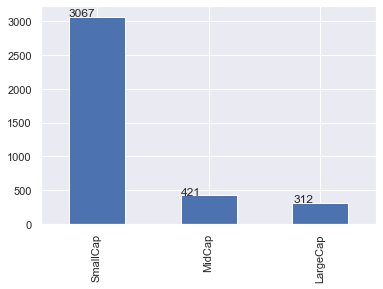

In [443]:
#Cap
ax = df.Cap.value_counts().plot(kind='bar')

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

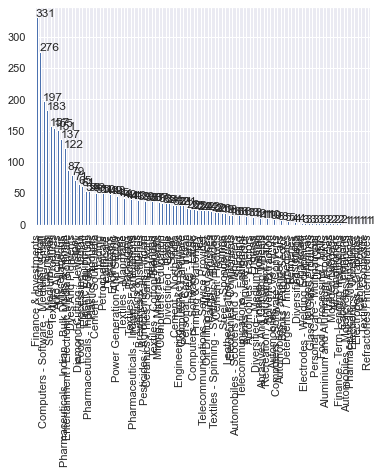

In [444]:
#Industry
ax = df.Industry.value_counts().plot(kind='bar')

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

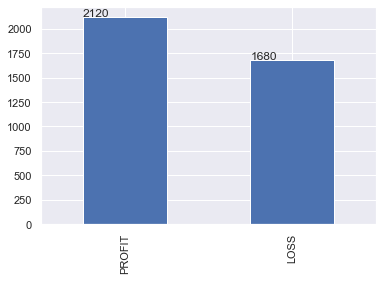

In [445]:
#Return
ax = df.Result.value_counts().plot(kind='bar')

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

In [446]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result']=df['Result'].map(r)

In [447]:
df['Cap']

0       0
1       0
2       1
3       0
4       0
       ..
3797    0
3798    0
3799    0
3800    0
3801    0
Name: Cap, Length: 3800, dtype: int64

<AxesSubplot:>

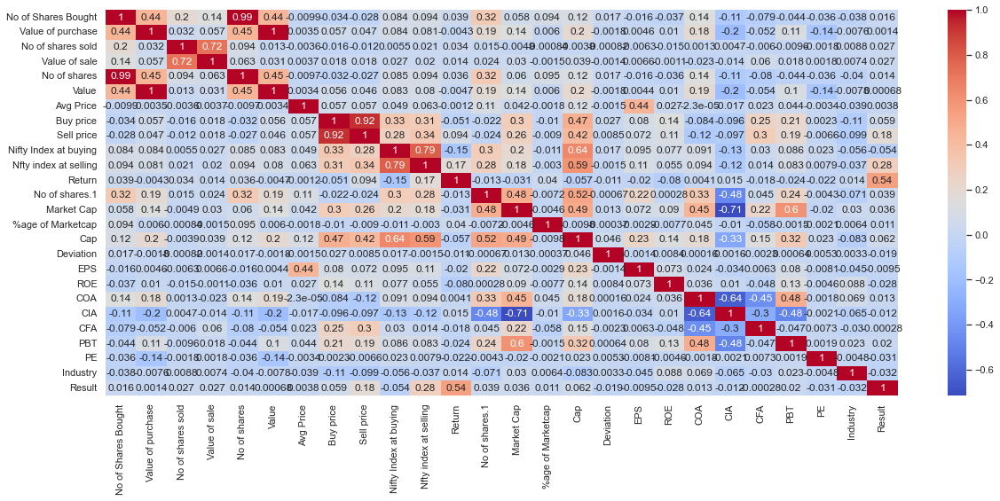

In [448]:
## Feature correlation
plt.figure(figsize=(20,8))
sns.heatmap(df.corr(), annot=True, cmap="coolwarm")

In [449]:
df.drop('Buy Date',1,inplace=True)
df.drop('Sell date',1,inplace=True)
df.drop('Row Labels',1,inplace=True)
#df.drop('Symbol',1,inplace=True)
df.drop('Return',1,inplace=True)
df.drop('Sell price',1,inplace=True)
df.drop('Result15',axis=1,inplace=True)
#df.drop('Nifty Index at buying',axis=1,inplace=True)
#df.drop('Nfty index at selling',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\1395991102.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Buy Date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\1395991102.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Sell date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\1395991102.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Row Labels',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\1395991102.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Return',1,inplace=True)
C:\Users\Anmol Choubey\

<AxesSubplot:>

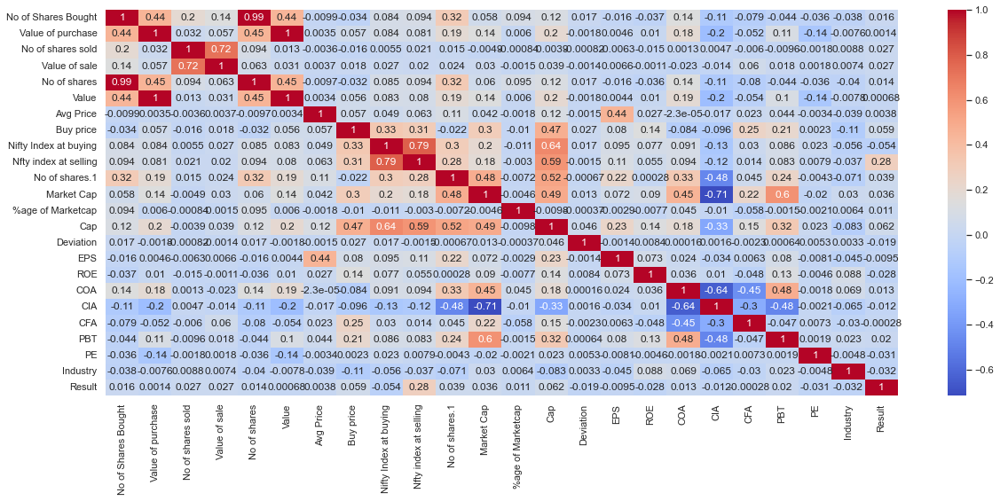

In [450]:
## Feature correlation
plt.figure(figsize=(20,8))
sns.heatmap(df.corr(), annot=True, cmap="coolwarm")

In [451]:
df['code'] = pd.factorize(df['Symbol'])[0] + 1

In [452]:
df.drop('Symbol',1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\265036371.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Symbol',1,inplace=True)


In [453]:
df_feature = df.drop('Result',axis='columns')
df_label = df['Result']

In [454]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.129914,-0.104780,-0.048032,-0.079303,-0.126863,-0.102859,-0.089025,-0.461750,-0.662357,-0.572845,...,-0.017137,-0.126859,-0.226424,-0.115510,0.144622,-0.009644,-0.164139,-0.083690,-1.176468,-1.412928
1,-0.136837,-0.088606,-0.048032,-0.079303,-0.133892,-0.086667,0.043030,1.941249,-0.662357,-0.572845,...,-0.017165,0.176922,0.707855,-0.042332,0.099079,-0.061441,-0.052840,-0.010078,-1.130019,-1.406739
2,2.127667,-0.084513,-0.048032,-0.079303,2.165097,-0.082569,-0.089015,-0.455420,1.413796,1.421866,...,-0.017123,-0.158286,-0.693564,0.546931,-0.757928,0.129707,-1.159471,-0.110290,-1.083570,-1.400550
3,0.451418,-0.095289,-0.048032,-0.079303,0.463321,-0.093357,-0.088840,-0.469605,-0.662357,-0.572845,...,-0.017165,-0.138124,-0.635172,-0.111020,0.148727,-0.022871,-0.167845,0.556506,-1.037121,-1.394361
4,0.028113,-0.006480,-0.048032,-0.079303,0.033570,-0.004447,-0.075019,-0.256994,-0.662357,-0.572845,...,-0.017166,-0.101647,0.474285,-0.012293,0.020597,-0.014322,-0.020333,-0.029407,-0.990672,-1.388172


In [455]:
from sklearn.model_selection import train_test_split

X_big, X_test, y_big, y_test = train_test_split(df_feature_scaler, df_label, test_size=0.2, random_state=27)
#becase the data isn't too much, so I take the validation data from train data
X_train, X_val, y_train, y_val = train_test_split(X_big, y_big, test_size=0.2, random_state=27)

In [456]:
print(X_big.shape, X_val.shape, X_test.shape,X_train.shape)

(3040, 24) (608, 24) (760, 24) (2432, 24)


In [457]:
np.savez('main_train', inputs=X_train, targets=y_train)
np.savez('main_val', inputs=X_val, targets=y_val)
np.savez('main_test', inputs=X_test, targets=y_test)

In [458]:
npz_train = np.load('main_train.npz')
train_inputs, train_targets = npz_train['inputs'].astype(np.float), npz_train['targets'].astype(int)

npz_val = np.load('main_val.npz')
val_inputs, val_targets = npz_val['inputs'].astype(np.float), npz_val['targets'].astype(int)

npz_test = np.load('main_test.npz')
test_inputs, test_targets = npz_test['inputs'].astype(np.float), npz_test['targets'].astype(int)

In [459]:
#MODEL

import tensorflow as tf
hidden_layer_size = 150
output_size = 2 #0 and 1

#3 hidden layer, depth 100
model = tf.keras.Sequential([
    tf.keras.layers.Dense(hidden_layer_size, activation='relu'),
    tf.keras.layers.Dense(hidden_layer_size, activation='relu'),
    tf.keras.layers.Dense(hidden_layer_size, activation='relu'),
    tf.keras.layers.Dense(output_size, activation='softmax')
])

#optimizer
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

early_stopping = tf.keras.callbacks.EarlyStopping(patience=2)
history = model.fit(train_inputs,
          train_targets,
          batch_size = 200,
          epochs = 30,
          #callbacks = [early_stopping],
          validation_data = (val_inputs, val_targets),
          verbose = 2)

Epoch 1/30
13/13 - 0s - loss: 0.6693 - accuracy: 0.5987 - val_loss: 0.6229 - val_accuracy: 0.7566
Epoch 2/30
13/13 - 0s - loss: 0.5657 - accuracy: 0.7541 - val_loss: 0.5046 - val_accuracy: 0.7780
Epoch 3/30
13/13 - 0s - loss: 0.4914 - accuracy: 0.7689 - val_loss: 0.4660 - val_accuracy: 0.7780
Epoch 4/30
13/13 - 0s - loss: 0.4672 - accuracy: 0.7845 - val_loss: 0.4545 - val_accuracy: 0.7730
Epoch 5/30
13/13 - 0s - loss: 0.4615 - accuracy: 0.7903 - val_loss: 0.4634 - val_accuracy: 0.7780
Epoch 6/30
13/13 - 0s - loss: 0.4547 - accuracy: 0.7907 - val_loss: 0.4477 - val_accuracy: 0.7911
Epoch 7/30
13/13 - 0s - loss: 0.4456 - accuracy: 0.7944 - val_loss: 0.4570 - val_accuracy: 0.7895
Epoch 8/30
13/13 - 0s - loss: 0.4430 - accuracy: 0.8047 - val_loss: 0.4543 - val_accuracy: 0.7977
Epoch 9/30
13/13 - 0s - loss: 0.4350 - accuracy: 0.8035 - val_loss: 0.4661 - val_accuracy: 0.7845
Epoch 10/30
13/13 - 0s - loss: 0.4285 - accuracy: 0.8055 - val_loss: 0.4522 - val_accuracy: 0.7928
Epoch 11/30
13/13 -

In [460]:
def plot_learningCurve(history, epochs):
  epoch_range = range(1, epochs+1)
  plt.plot(epoch_range, history.history['accuracy'])
  plt.plot(epoch_range, history.history['val_accuracy'])
  plt.title('Model Accuracy')
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy')
  plt.legend(['Train', 'Val'], loc='upper right')
  plt.show()

  plt.plot(epoch_range, history.history['loss'])
  plt.plot(epoch_range, history.history['val_loss'])
  plt.title('Model Loss')
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.legend(['Train', 'Val'], loc='upper right')
  plt.show()

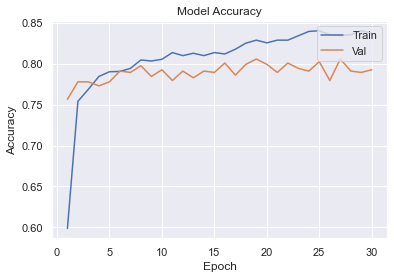

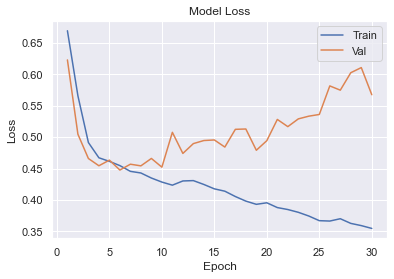

In [461]:
plot_learningCurve(history, 30)

In [462]:
test_loss, test_accuracy = model.evaluate(test_inputs, test_targets)
print("Test loss: {0:.2f} and Test accuracy: {1:.2f}% ".format(test_loss,test_accuracy*100))

24/24 [==============================] - 0s 582us/step - loss: 0.5027 - accuracy: 0.7750
Test loss: 0.50 and Test accuracy: 77.50% 


In [463]:
yp = model.predict(test_inputs)
yp[:5]

array([[0.2156923 , 0.7843077 ],
       [0.81594396, 0.18405607],
       [0.06844655, 0.9315534 ],
       [0.73963314, 0.26036683],
       [0.01256745, 0.9874326 ]], dtype=float32)

In [464]:
test_targets[:10]

array([1, 0, 1, 1, 1, 1, 0, 1, 0, 1])

In [465]:
y_pred = []
for element in yp:
    if element[1] > element[0]:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [466]:
y_pred=pd.DataFrame(y_pred)

In [467]:
y_pred[:10]

,0
0,1
1,0
2,1
3,0
4,1
5,0
6,0
7,1
8,0
9,1


Text(66.5, 0.5, 'Truth')

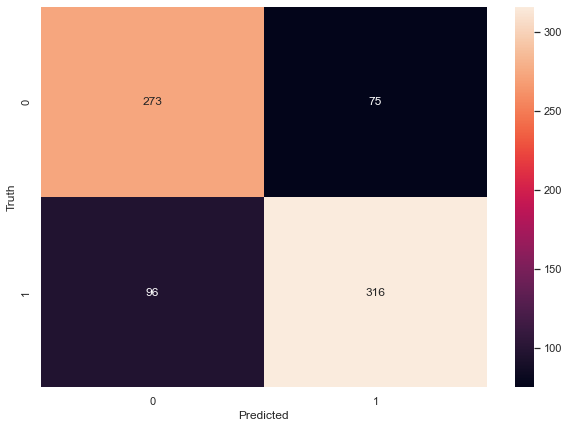

In [468]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=test_targets,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [469]:
test_inputs=pd.DataFrame(test_inputs)
test_targets=pd.DataFrame(test_targets)

In [470]:
#imp
test_inputs.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_cnn_12mon.xlsx")
test_targets.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_cnn_12mon.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_cnn_12mon.xlsx")

In [471]:
df_x=df_feature_scaler[3508:]
df_y=df_label[3508:]

In [472]:
yp = model.predict(df_x)
yp[:5]

array([[1.2257649e-02, 9.8774230e-01],
       [1.9024070e-02, 9.8097599e-01],
       [3.2854512e-02, 9.6714550e-01],
       [7.6419114e-05, 9.9992359e-01],
       [1.8987447e-01, 8.1012559e-01]], dtype=float32)

In [473]:
y_pred1 = []
for element in yp:
    if element[1] > element[0]:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [474]:
y_pred1[:10]

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

In [475]:
df_y[:10]

3510    1
3511    1
3512    1
3513    1
3514    1
3515    1
3516    1
3517    1
3518    1
3519    1
Name: Result, dtype: int64

In [476]:
y_pred1=pd.DataFrame(y_pred1)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_cnn_12mon_test.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_cnn_12mon_test.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_cnn_12mon_test.xlsx")

In [477]:
# 2 months 5%

In [478]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
sns.set()

In [479]:
df =pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/2 month.csv")
df.head()

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result5
0,ALMONDZ GLOBAL SECURITIES LTD.,ALMONDZ,61581,1.264405e+05,0,0.0,61581,1.264405e+05,2.05,10-01-2015,...,2.93,0.10,-18.00,-8.00,31.00,11.00,3.24,Finance & Investments,PROFIT,PROFIT
1,ATUL LTD.,ATUL,18541,2.410243e+07,0,0.0,18541,2.410243e+07,1299.95,10-01-2015,...,81.13,0.26,306.00,-167.00,-124.00,326.00,19.54,Dyes And Pigments,PROFIT,LOSS
2,GMR INFRASTRUCTURE LTD.,GMRINFRA,14096100,3.017007e+07,0,0.0,14096100,3.017007e+07,2.14,10-01-2015,...,-5.16,0.02,2915.00,-3159.00,448.00,-2806.00,-2.65,Engineering - Turnkey Services,PROFIT,PROFIT
3,INDOWIND ENERGY LTD.,INDOWIND,3675498,1.419600e+07,0,0.0,3675498,1.419600e+07,3.86,10-01-2015,...,0.03,0.03,1.88,6.33,-8.58,0.51,145.00,Power Generation And Supply,PROFIT,PROFIT
4,JAGRAN PRAKASHAN LTD.,JAGRAN,1043972,1.458429e+08,0,0.0,1043972,1.458429e+08,139.70,10-01-2015,...,9.42,0.22,439.00,-441.00,17.00,418.00,15.26,Entertainment / Electronic Media Software,PROFIT,PROFIT


In [480]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            0
No of shares             0
Value                    0
Avg Price                0
Buy Date                 0
Sell date                0
Buy price                0
Sell price               0
Nifty Index at buying    0
Nfty index at selling    0
Change in Nifty 50       0
Return                   0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Result                   0
Result5                  0
dtype: int64
Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares so

In [481]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4241 entries, 0 to 4240
Data columns (total 32 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Row Labels             4241 non-null   object 
 1   Symbol                 4241 non-null   object 
 2   No of Shares Bought    4241 non-null   int64  
 3   Value of purchase      4241 non-null   float64
 4   No of shares sold      4241 non-null   int64  
 5   Value of sale          4241 non-null   float64
 6   No of shares           4241 non-null   int64  
 7   Value                  4241 non-null   float64
 8   Avg Price              4241 non-null   float64
 9   Buy Date               4241 non-null   object 
 10  Sell date              4241 non-null   object 
 11  Buy price              4241 non-null   float64
 12  Sell price             4241 non-null   float64
 13  Nifty Index at buying  4241 non-null   float64
 14  Nfty index at selling  4241 non-null   float64
 15  Chan

In [482]:
df['Cap']

0       SmallCap
1       SmallCap
2         MidCap
3       SmallCap
4       SmallCap
          ...   
4236    SmallCap
4237    SmallCap
4238    SmallCap
4239    SmallCap
4240    SmallCap
Name: Cap, Length: 4241, dtype: object

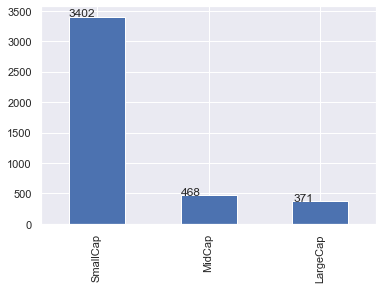

In [483]:
#Cap
ax = df.Cap.value_counts().plot(kind='bar')

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

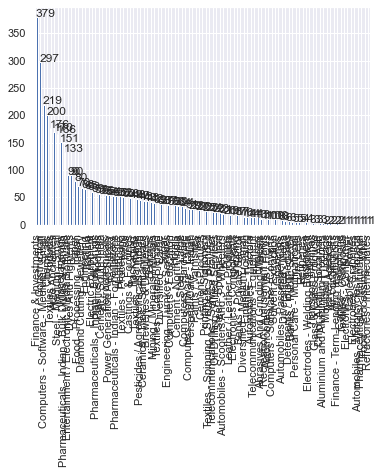

In [484]:
#Industry
ax = df.Industry.value_counts().plot(kind='bar')

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

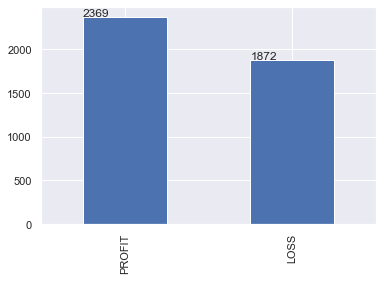

In [485]:
#Return
ax = df.Result.value_counts().plot(kind='bar')

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

In [486]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result5']=df['Result5'].map(r)

In [487]:
df['Cap']

0       0
1       0
2       1
3       0
4       0
       ..
4236    0
4237    0
4238    0
4239    0
4240    0
Name: Cap, Length: 4241, dtype: int64

<AxesSubplot:>

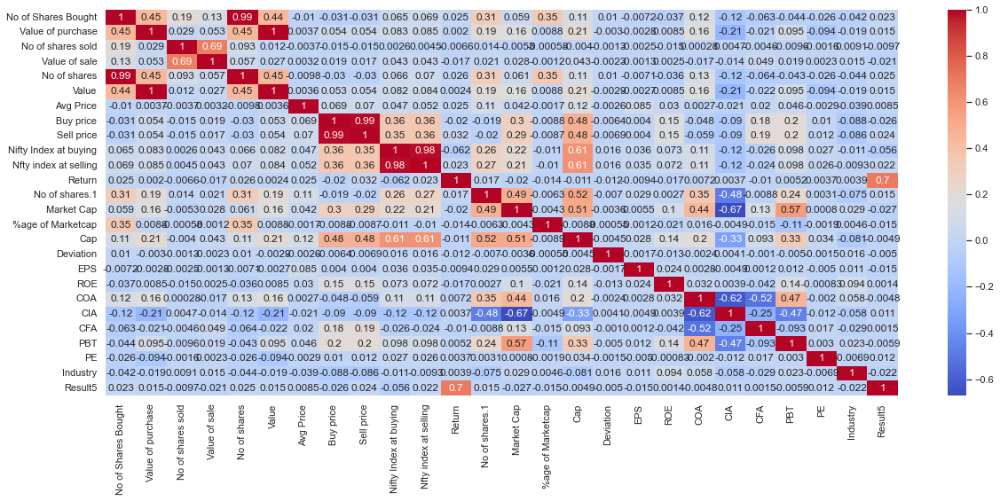

In [488]:
## Feature correlation
plt.figure(figsize=(20,8))
sns.heatmap(df.corr(), annot=True, cmap="coolwarm")

In [489]:
df.drop('Buy Date',1,inplace=True)
df.drop('Sell date',1,inplace=True)
df.drop('Row Labels',1,inplace=True)
#df.drop('Symbol',1,inplace=True)
df.drop('Return',1,inplace=True)
df.drop('Sell price',1,inplace=True)
df.drop('Result',axis=1,inplace=True)
#df.drop('Nifty Index at buying',axis=1,inplace=True)
#df.drop('Nfty index at selling',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Buy Date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Sell date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Row Labels',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Return',1,inplace=True)
C:\Users\Anmol Choubey\AppD

<AxesSubplot:>

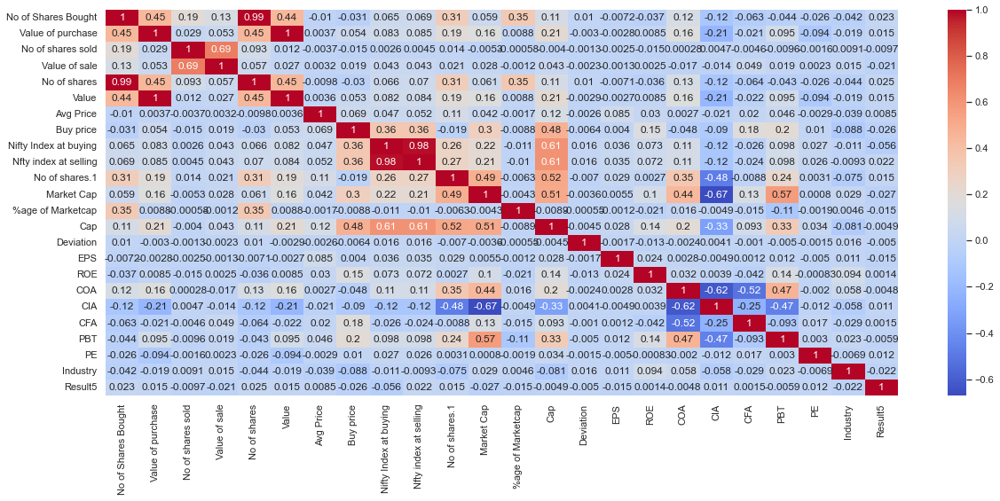

In [490]:
## Feature correlation
plt.figure(figsize=(20,8))
sns.heatmap(df.corr(), annot=True, cmap="coolwarm")

In [491]:
df['code'] = pd.factorize(df['Symbol'])[0] + 1

In [492]:
df.drop('Symbol',1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\265036371.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Symbol',1,inplace=True)


In [493]:
df_feature = df.drop('Result5',axis='columns')
df_label = df['Result5']

In [494]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.129067,-0.107008,-0.047593,-0.082351,-0.126057,-0.105010,-0.092596,-0.444790,-0.700391,-0.655708,...,-0.028060,-0.058507,-0.220014,-0.130812,0.148124,0.015864,-0.173498,-0.087246,-1.174670,-1.400415
1,-0.136307,-0.091216,-0.047593,-0.082351,-0.133405,-0.089202,0.045594,1.640970,-0.700391,-0.655708,...,-0.028065,0.001528,0.739882,-0.059730,0.101365,-0.034456,-0.061655,-0.010550,-1.128896,-1.394445
2,2.231717,-0.087220,-0.047593,-0.082351,2.269995,-0.085202,-0.092586,-0.439296,1.112107,1.086441,...,-0.028058,-0.064718,-0.699962,0.512658,-0.778526,0.151242,-1.173701,-0.114960,-1.083121,-1.388474
3,0.478839,-0.097741,-0.047593,-0.082351,0.490931,-0.095734,-0.092403,-0.451608,-0.700391,-0.655708,...,-0.028066,-0.060733,-0.639968,-0.126450,0.152338,0.003015,-0.177223,0.579773,-1.037347,-1.382503
4,0.036183,-0.011034,-0.047593,-0.082351,0.041662,-0.008938,-0.077940,-0.267066,-0.700391,-0.655708,...,-0.028066,-0.053524,0.499908,-0.030551,0.020787,0.011319,-0.028989,-0.030688,-0.991572,-1.376533


In [495]:
from sklearn.model_selection import train_test_split

X_big, X_test, y_big, y_test = train_test_split(df_feature_scaler, df_label, test_size=0.2, random_state=27)
#becase the data isn't too much, so I take the validation data from train data
X_train, X_val, y_train, y_val = train_test_split(X_big, y_big, test_size=0.2, random_state=27)

In [496]:
print(X_big.shape, X_val.shape, X_test.shape,X_train.shape)

(3392, 24) (679, 24) (849, 24) (2713, 24)


In [497]:
np.savez('main_train', inputs=X_train, targets=y_train)
np.savez('main_val', inputs=X_val, targets=y_val)
np.savez('main_test', inputs=X_test, targets=y_test)

In [498]:
npz_train = np.load('main_train.npz')
train_inputs, train_targets = npz_train['inputs'].astype(np.float), npz_train['targets'].astype(int)

npz_val = np.load('main_val.npz')
val_inputs, val_targets = npz_val['inputs'].astype(np.float), npz_val['targets'].astype(int)

npz_test = np.load('main_test.npz')
test_inputs, test_targets = npz_test['inputs'].astype(np.float), npz_test['targets'].astype(int)

In [499]:
#MODEL

import tensorflow as tf
hidden_layer_size = 150
output_size = 2 #0 and 1

#3 hidden layer, depth 100
model = tf.keras.Sequential([
    tf.keras.layers.Dense(hidden_layer_size, activation='relu'),
    tf.keras.layers.Dense(hidden_layer_size, activation='relu'),
    tf.keras.layers.Dense(hidden_layer_size, activation='relu'),
    tf.keras.layers.Dense(output_size, activation='softmax')
])

#optimizer
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

early_stopping = tf.keras.callbacks.EarlyStopping(patience=2)
history = model.fit(train_inputs,
          train_targets,
          batch_size = 200,
          epochs = 30,
          #callbacks = [early_stopping],
          validation_data = (val_inputs, val_targets),
          verbose = 2)

Epoch 1/30
14/14 - 0s - loss: 0.6925 - accuracy: 0.5558 - val_loss: 0.6908 - val_accuracy: 0.5611
Epoch 2/30
14/14 - 0s - loss: 0.6662 - accuracy: 0.6004 - val_loss: 0.6849 - val_accuracy: 0.5935
Epoch 3/30
14/14 - 0s - loss: 0.6594 - accuracy: 0.6089 - val_loss: 0.6742 - val_accuracy: 0.5950
Epoch 4/30
14/14 - 0s - loss: 0.6440 - accuracy: 0.6229 - val_loss: 0.6660 - val_accuracy: 0.6082
Epoch 5/30
14/14 - 0s - loss: 0.6295 - accuracy: 0.6436 - val_loss: 0.6562 - val_accuracy: 0.6333
Epoch 6/30
14/14 - 0s - loss: 0.6093 - accuracy: 0.6653 - val_loss: 0.6396 - val_accuracy: 0.6657
Epoch 7/30
14/14 - 0s - loss: 0.5911 - accuracy: 0.6900 - val_loss: 0.6311 - val_accuracy: 0.6510
Epoch 8/30
14/14 - 0s - loss: 0.5708 - accuracy: 0.7036 - val_loss: 0.6261 - val_accuracy: 0.6598
Epoch 9/30
14/14 - 0s - loss: 0.5566 - accuracy: 0.7121 - val_loss: 0.6426 - val_accuracy: 0.6657
Epoch 10/30
14/14 - 0s - loss: 0.5682 - accuracy: 0.7048 - val_loss: 0.6234 - val_accuracy: 0.6834
Epoch 11/30
14/14 -

In [500]:
def plot_learningCurve(history, epochs):
  epoch_range = range(1, epochs+1)
  plt.plot(epoch_range, history.history['accuracy'])
  plt.plot(epoch_range, history.history['val_accuracy'])
  plt.title('Model Accuracy')
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy')
  plt.legend(['Train', 'Val'], loc='upper right')
  plt.show()

  plt.plot(epoch_range, history.history['loss'])
  plt.plot(epoch_range, history.history['val_loss'])
  plt.title('Model Loss')
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.legend(['Train', 'Val'], loc='upper right')
  plt.show()

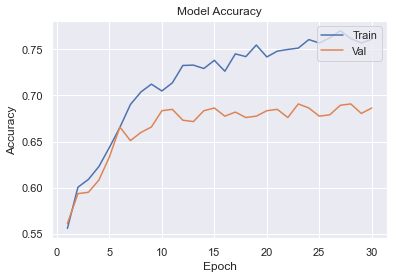

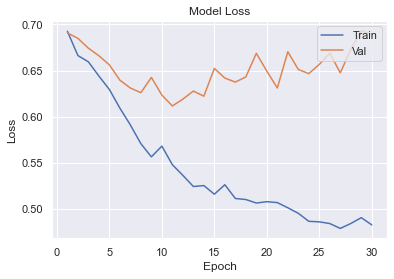

In [501]:
plot_learningCurve(history, 30)

In [502]:
test_loss, test_accuracy = model.evaluate(test_inputs, test_targets)
print("Test loss: {0:.2f} and Test accuracy: {1:.2f}% ".format(test_loss,test_accuracy*100))

27/27 [==============================] - 0s 665us/step - loss: 0.6535 - accuracy: 0.6890
Test loss: 0.65 and Test accuracy: 68.90% 


In [503]:
yp = model.predict(test_inputs)
yp[:5]

array([[0.9646948 , 0.03530514],
       [0.8747916 , 0.1252084 ],
       [0.6517554 , 0.3482446 ],
       [0.5646877 , 0.43531227],
       [0.9336902 , 0.06630983]], dtype=float32)

In [504]:
test_targets[:10]

array([0, 0, 1, 1, 0, 0, 0, 0, 0, 0])

In [505]:
y_pred = []
for element in yp:
    if element[1] > element[0]:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [506]:
y_pred=pd.DataFrame(y_pred)

In [507]:
y_pred[:10]

,0
0,0
1,0
2,0
3,0
4,0
5,1
6,0
7,0
8,0
9,0


Text(66.5, 0.5, 'Truth')

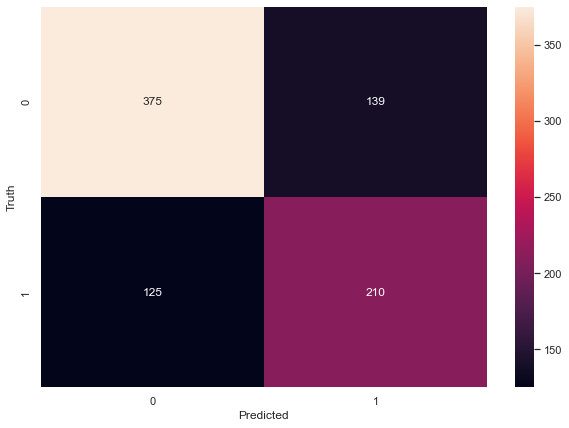

In [508]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=test_targets,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [509]:
test_inputs=pd.DataFrame(test_inputs)
test_targets=pd.DataFrame(test_targets)

In [510]:
#imp
test_inputs.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_cnn_2mon_5.xlsx")
test_targets.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_cnn_2mon_5.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_cnn_2mon_5.xlsx")

In [511]:
df_x=df_feature_scaler[3990:]
df_y=df_label[3990:]

In [512]:
yp = model.predict(df_x)
yp[:5]

array([[3.8291967e-01, 6.1708033e-01],
       [2.9031731e-05, 9.9997091e-01],
       [5.8966053e-01, 4.1033947e-01],
       [4.4103008e-02, 9.5589703e-01],
       [5.6635517e-01, 4.3364480e-01]], dtype=float32)

In [513]:
y_pred1 = []
for element in yp:
    if element[1] > element[0]:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [514]:
y_pred1[:10]

[1, 1, 0, 1, 0, 1, 0, 0, 0, 0]

In [515]:
df_y[:10]

3990    1
3991    1
3992    0
3993    1
3994    1
3995    1
3996    0
3997    0
3998    0
3999    1
Name: Result5, dtype: int64

In [516]:
y_pred1=pd.DataFrame(y_pred1)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_cnn_2mon_test_5.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_cnn_2mon_test_5.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_cnn_2mon_test_5.xlsx")

In [517]:
# 6 months 10%

In [518]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
sns.set()

In [519]:
df =pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/6 months.csv")
df.head()

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result10
0,ALMONDZ GLOBAL SECURITIES LTD.,ALMONDZ,61581,1.264405e+05,0,0.0,61581,1.264405e+05,2.05,10-01-2015,...,2.93,0.1000,-18.00,-8.00,31.00,11.00,3.24,Finance & Investments,LOSS,LOSS
1,ATUL LTD.,ATUL,18541,2.410243e+07,0,0.0,18541,2.410243e+07,1299.95,10-01-2015,...,81.13,0.2600,306.00,-167.00,-124.00,326.00,19.54,Dyes And Pigments,LOSS,LOSS
2,GMR INFRASTRUCTURE LTD.,GMRINFRA,14096100,3.017007e+07,0,0.0,14096100,3.017007e+07,2.14,10-01-2015,...,-5.16,0.0200,2915.00,-3159.00,448.00,-2806.00,-2.65,Engineering - Turnkey Services,LOSS,LOSS
3,INDOWIND ENERGY LTD.,INDOWIND,3675498,1.419600e+07,0,0.0,3675498,1.419600e+07,3.86,10-01-2015,...,0.03,0.0269,1.88,6.33,-8.58,0.51,145.00,Power Generation And Supply,LOSS,LOSS
4,JAGRAN PRAKASHAN LTD.,JAGRAN,1043972,1.458429e+08,0,0.0,1043972,1.458429e+08,139.70,10-01-2015,...,9.42,0.2200,439.00,-441.00,17.00,418.00,15.26,Entertainment / Electronic Media Software,PROFIT,PROFIT


In [520]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            2
No of shares             0
Value                    0
Avg Price                0
Buy Date                 0
Sell date                0
Buy price                0
Sell price               0
Nifty Index at buying    0
Nfty index at selling    0
Change in Nifty 50       0
Return                   0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Result                   0
Result10                 0
dtype: int64
Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares so

In [521]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4069 entries, 0 to 4070
Data columns (total 32 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Row Labels             4069 non-null   object 
 1   Symbol                 4069 non-null   object 
 2   No of Shares Bought    4069 non-null   int64  
 3   Value of purchase      4069 non-null   float64
 4   No of shares sold      4069 non-null   int64  
 5   Value of sale          4069 non-null   float64
 6   No of shares           4069 non-null   int64  
 7   Value                  4069 non-null   float64
 8   Avg Price              4069 non-null   float64
 9   Buy Date               4069 non-null   object 
 10  Sell date              4069 non-null   object 
 11  Buy price              4069 non-null   float64
 12  Sell price             4069 non-null   float64
 13  Nifty Index at buying  4069 non-null   float64
 14  Nfty index at selling  4069 non-null   float64
 15  Chan

In [522]:
df['Cap']

0       SmallCap
1       SmallCap
2         MidCap
3       SmallCap
4       SmallCap
          ...   
4066    LargeCap
4067    SmallCap
4068    SmallCap
4069    SmallCap
4070      MidCap
Name: Cap, Length: 4069, dtype: object

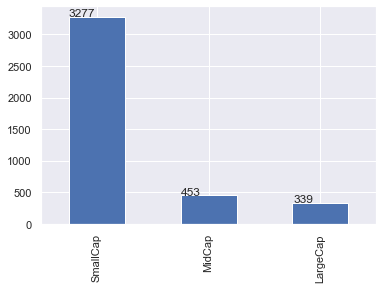

In [523]:
#Cap
ax = df.Cap.value_counts().plot(kind='bar')

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

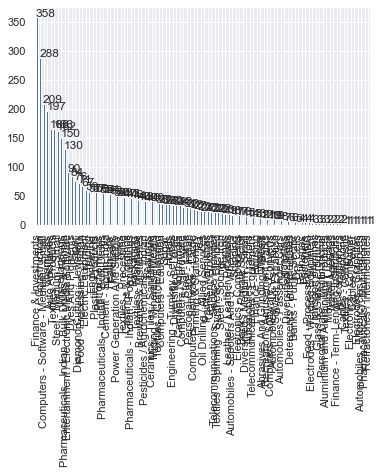

In [524]:
#Industry
ax = df.Industry.value_counts().plot(kind='bar')

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

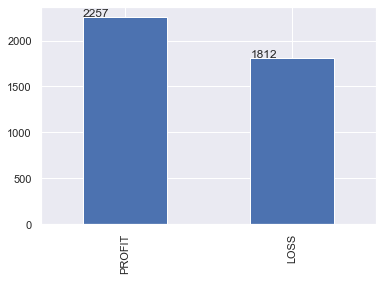

In [525]:
#Return
ax = df.Result.value_counts().plot(kind='bar')

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

In [526]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result10']=df['Result10'].map(r)

In [527]:
df['Cap']

0       0
1       0
2       1
3       0
4       0
       ..
4066    2
4067    0
4068    0
4069    0
4070    1
Name: Cap, Length: 4069, dtype: int64

<AxesSubplot:>

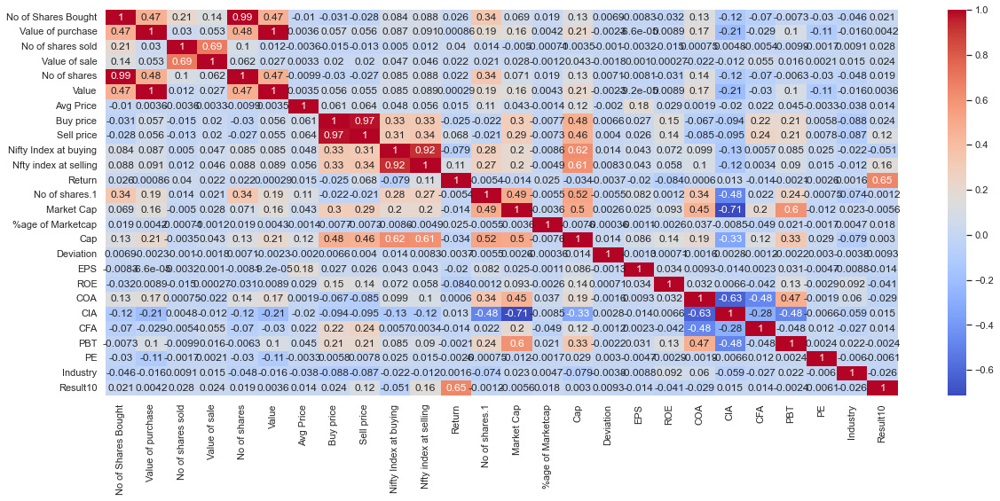

In [528]:
## Feature correlation
plt.figure(figsize=(20,8))
sns.heatmap(df.corr(), annot=True, cmap="coolwarm")

In [529]:
df.drop('Buy Date',1,inplace=True)
df.drop('Sell date',1,inplace=True)
df.drop('Row Labels',1,inplace=True)
#df.drop('Symbol',1,inplace=True)
df.drop('Return',1,inplace=True)
df.drop('Sell price',1,inplace=True)
df.drop('Result',axis=1,inplace=True)
#df.drop('Nifty Index at buying',axis=1,inplace=True)
#df.drop('Nfty index at selling',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Buy Date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Sell date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Row Labels',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Return',1,inplace=True)
C:\Users\Anmol Choubey\AppD

<AxesSubplot:>

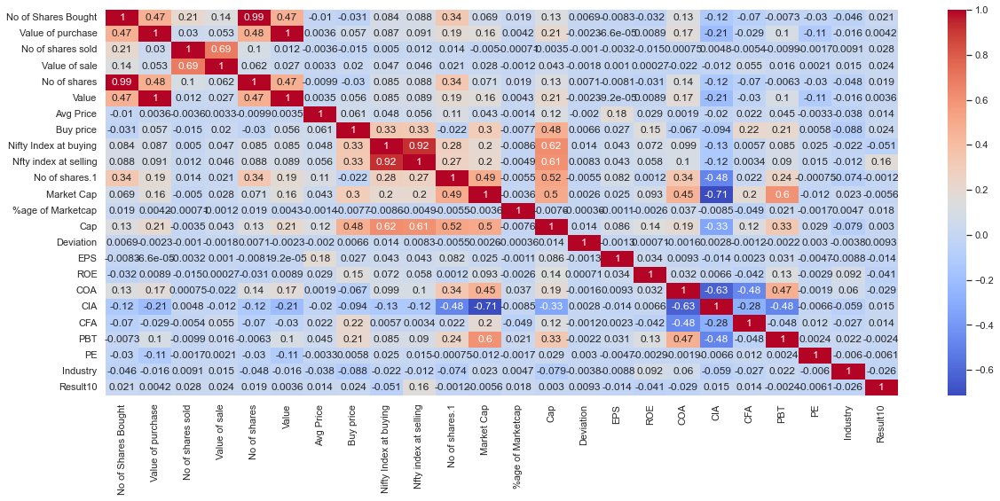

In [530]:
## Feature correlation
plt.figure(figsize=(20,8))
sns.heatmap(df.corr(), annot=True, cmap="coolwarm")

In [531]:
df['code'] = pd.factorize(df['Symbol'])[0] + 1

In [532]:
df.drop('Symbol',1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\265036371.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Symbol',1,inplace=True)


In [533]:
df_feature = df.drop('Result10',axis='columns')
df_label = df['Result10']

In [534]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.133236,-0.106103,-0.047801,-0.081043,-0.130212,-0.104125,-0.090731,-0.455363,-0.681147,-0.814616,...,-0.021631,-0.065135,-0.219695,-0.122020,0.146417,0.000484,-0.170855,-0.085491,-1.173138,-1.406195
1,-0.140797,-0.090406,-0.047801,-0.081043,-0.137901,-0.088412,0.044707,1.829228,-0.681147,-0.814616,...,-0.021644,0.057697,0.728894,-0.049158,0.100029,-0.051379,-0.055526,-0.009718,-1.127087,-1.400179
2,2.332115,-0.086434,-0.047801,-0.081043,2.377162,-0.084435,-0.090721,-0.449345,1.239044,0.923055,...,-0.021625,-0.077842,-0.693990,0.537563,-0.772881,0.140014,-1.202220,-0.112871,-1.081036,-1.394163
3,0.501596,-0.096892,-0.047801,-0.081043,0.515442,-0.094904,-0.090542,-0.462831,-0.681147,-0.814616,...,-0.021645,-0.069690,-0.653082,-0.117549,0.150598,-0.012759,-0.174695,0.573498,-1.034984,-1.388146
4,0.039334,-0.010704,-0.047801,-0.081043,0.045300,-0.008627,-0.076367,-0.260697,-0.681147,-0.814616,...,-0.021645,-0.054941,0.491747,-0.019248,0.020090,-0.004200,-0.021843,-0.029615,-0.988933,-1.382130


In [535]:
from sklearn.model_selection import train_test_split

X_big, X_test, y_big, y_test = train_test_split(df_feature_scaler, df_label, test_size=0.2, random_state=27)
#becase the data isn't too much, so I take the validation data from train data
X_train, X_val, y_train, y_val = train_test_split(X_big, y_big, test_size=0.2, random_state=27)

In [536]:
print(X_big.shape, X_val.shape, X_test.shape,X_train.shape)

(3255, 24) (651, 24) (814, 24) (2604, 24)


In [537]:
np.savez('main_train', inputs=X_train, targets=y_train)
np.savez('main_val', inputs=X_val, targets=y_val)
np.savez('main_test', inputs=X_test, targets=y_test)

In [538]:
npz_train = np.load('main_train.npz')
train_inputs, train_targets = npz_train['inputs'].astype(np.float), npz_train['targets'].astype(int)

npz_val = np.load('main_val.npz')
val_inputs, val_targets = npz_val['inputs'].astype(np.float), npz_val['targets'].astype(int)

npz_test = np.load('main_test.npz')
test_inputs, test_targets = npz_test['inputs'].astype(np.float), npz_test['targets'].astype(int)

In [539]:
#MODEL

import tensorflow as tf
hidden_layer_size = 150
output_size = 2 #0 and 1

#3 hidden layer, depth 100
model = tf.keras.Sequential([
    tf.keras.layers.Dense(hidden_layer_size, activation='relu'),
    tf.keras.layers.Dense(hidden_layer_size, activation='relu'),
    tf.keras.layers.Dense(hidden_layer_size, activation='relu'),
    tf.keras.layers.Dense(output_size, activation='softmax')
])

#optimizer
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

early_stopping = tf.keras.callbacks.EarlyStopping(patience=2)
history = model.fit(train_inputs,
          train_targets,
          batch_size = 200,
          epochs = 30,
          #callbacks = [early_stopping],
          validation_data = (val_inputs, val_targets),
          verbose = 2)

Epoch 1/30
14/14 - 0s - loss: 0.6763 - accuracy: 0.5910 - val_loss: 0.6408 - val_accuracy: 0.6359
Epoch 2/30
14/14 - 0s - loss: 0.6176 - accuracy: 0.6694 - val_loss: 0.5998 - val_accuracy: 0.7097
Epoch 3/30
14/14 - 0s - loss: 0.5510 - accuracy: 0.7508 - val_loss: 0.5402 - val_accuracy: 0.7450
Epoch 4/30
14/14 - 0s - loss: 0.5192 - accuracy: 0.7646 - val_loss: 0.5540 - val_accuracy: 0.7542
Epoch 5/30
14/14 - 0s - loss: 0.5000 - accuracy: 0.7673 - val_loss: 0.5372 - val_accuracy: 0.7573
Epoch 6/30
14/14 - 0s - loss: 0.4780 - accuracy: 0.7834 - val_loss: 0.5511 - val_accuracy: 0.7757
Epoch 7/30
14/14 - 0s - loss: 0.4812 - accuracy: 0.7842 - val_loss: 0.5533 - val_accuracy: 0.7650
Epoch 8/30
14/14 - 0s - loss: 0.4826 - accuracy: 0.7880 - val_loss: 0.5449 - val_accuracy: 0.7634
Epoch 9/30
14/14 - 0s - loss: 0.4716 - accuracy: 0.7880 - val_loss: 0.5537 - val_accuracy: 0.7634
Epoch 10/30
14/14 - 0s - loss: 0.4642 - accuracy: 0.7949 - val_loss: 0.5586 - val_accuracy: 0.7773
Epoch 11/30
14/14 -

In [540]:
def plot_learningCurve(history, epochs):
  epoch_range = range(1, epochs+1)
  plt.plot(epoch_range, history.history['accuracy'])
  plt.plot(epoch_range, history.history['val_accuracy'])
  plt.title('Model Accuracy')
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy')
  plt.legend(['Train', 'Val'], loc='upper right')
  plt.show()

  plt.plot(epoch_range, history.history['loss'])
  plt.plot(epoch_range, history.history['val_loss'])
  plt.title('Model Loss')
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.legend(['Train', 'Val'], loc='upper right')
  plt.show()

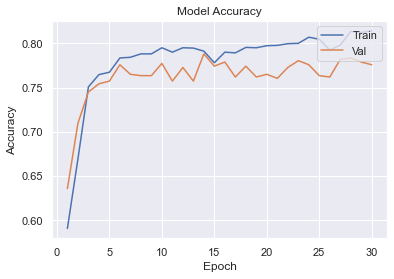

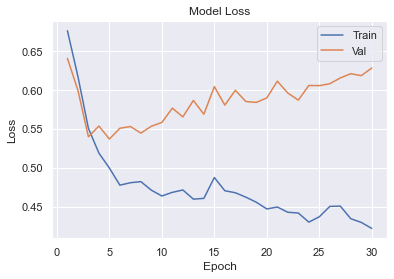

In [541]:
plot_learningCurve(history, 30)

In [542]:
test_loss, test_accuracy = model.evaluate(test_inputs, test_targets)
print("Test loss: {0:.2f} and Test accuracy: {1:.2f}% ".format(test_loss,test_accuracy*100))

26/26 [==============================] - 0s 844us/step - loss: 0.5966 - accuracy: 0.7518
Test loss: 0.60 and Test accuracy: 75.18% 


In [543]:
yp = model.predict(test_inputs)
yp[:5]

array([[0.8610523 , 0.13894777],
       [0.1553193 , 0.84468067],
       [0.9645342 , 0.03546577],
       [0.18331577, 0.81668425],
       [0.25759512, 0.7424049 ]], dtype=float32)

In [544]:
test_targets[:10]

array([0, 0, 0, 1, 0, 0, 1, 0, 1, 0])

In [545]:
y_pred = []
for element in yp:
    if element[1] > element[0]:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [546]:
y_pred=pd.DataFrame(y_pred)

In [547]:
y_pred[:10]

,0
0,0
1,1
2,0
3,1
4,1
5,1
6,1
7,0
8,1
9,1


Text(66.5, 0.5, 'Truth')

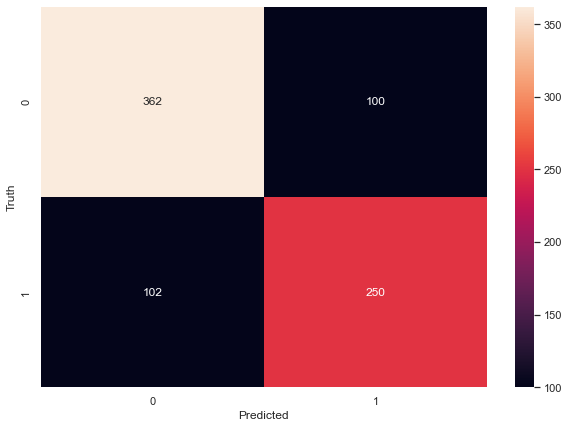

In [548]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=test_targets,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [549]:
test_inputs=pd.DataFrame(test_inputs)
test_targets=pd.DataFrame(test_targets)

In [550]:
#imp
test_inputs.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_cnn_6mon_10.xlsx")
test_targets.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_cnn_6mon_10.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_cnn_6mon_10.xlsx")

In [551]:
df_x=df_feature_scaler[3806:]
df_y=df_label[3806:]

In [552]:
yp = model.predict(df_x)
yp[:5]

array([[0.10580218, 0.8941979 ],
       [0.10774015, 0.8922599 ],
       [0.50732607, 0.49267393],
       [0.2031918 , 0.7968082 ],
       [0.06398965, 0.93601036]], dtype=float32)

In [553]:
y_pred1 = []
for element in yp:
    if element[1] > element[0]:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [554]:
y_pred1[:10]

[1, 1, 0, 1, 1, 1, 1, 1, 0, 1]

In [555]:
df_y[:10]

3808    1
3809    1
3810    0
3811    0
3812    1
3813    1
3814    1
3815    1
3816    1
3817    1
Name: Result10, dtype: int64

In [556]:
y_pred1=pd.DataFrame(y_pred1)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_cnn_6mon_test_10.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_cnn_6mon_test_10.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_cnn_6mon_test_10.xlsx")

In [557]:
# 9 months 13%

In [558]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
sns.set()

In [559]:
df =pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/9 months.csv")
df.head()

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result13
0,ALMONDZ GLOBAL SECURITIES LTD.,ALMONDZ,61581,1.264405e+05,0,0.0,61581,1.264405e+05,2.05,10-01-2015,...,2.93,0.10,-18.00,-8.00,31.00,11.00,3.24,Finance & Investments,PROFIT,PROFIT
1,ATUL LTD.,ATUL,18541,2.410243e+07,0,0.0,18541,2.410243e+07,1299.95,10-01-2015,...,81.13,0.26,306.00,-167.00,-124.00,326.00,19.54,Dyes And Pigments,PROFIT,PROFIT
2,GMR INFRASTRUCTURE LTD.,GMRINFRA,14096100,3.017007e+07,0,0.0,14096100,3.017007e+07,2.14,10-01-2015,...,-5.16,0.02,2915.00,-3159.00,448.00,-2806.00,-2.65,Engineering - Turnkey Services,LOSS,LOSS
3,INDOWIND ENERGY LTD.,INDOWIND,3675498,1.419600e+07,0,0.0,3675498,1.419600e+07,3.86,10-01-2015,...,0.03,0.03,1.88,6.33,-8.58,0.51,145.00,Power Generation And Supply,PROFIT,LOSS
4,JAGRAN PRAKASHAN LTD.,JAGRAN,1043972,1.458429e+08,0,0.0,1043972,1.458429e+08,139.70,10-01-2015,...,9.42,0.22,439.00,-441.00,17.00,418.00,15.26,Entertainment / Electronic Media Software,PROFIT,PROFIT


In [560]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            2
No of shares             0
Value                    0
Avg Price                0
Buy Date                 0
Sell date                0
Buy price                0
Sell price               0
Nifty Index at buying    0
Nfty index at selling    0
Change in Nifty 50       0
Return                   0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Result                   0
Result13                 0
dtype: int64
Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares so

In [561]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3930 entries, 0 to 3931
Data columns (total 32 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Row Labels             3930 non-null   object 
 1   Symbol                 3930 non-null   object 
 2   No of Shares Bought    3930 non-null   int64  
 3   Value of purchase      3930 non-null   float64
 4   No of shares sold      3930 non-null   int64  
 5   Value of sale          3930 non-null   float64
 6   No of shares           3930 non-null   int64  
 7   Value                  3930 non-null   float64
 8   Avg Price              3930 non-null   float64
 9   Buy Date               3930 non-null   object 
 10  Sell date              3930 non-null   object 
 11  Buy price              3930 non-null   float64
 12  Sell price             3930 non-null   float64
 13  Nifty Index at buying  3930 non-null   float64
 14  Nfty index at selling  3930 non-null   float64
 15  Chan

In [562]:
df['Cap']

0       SmallCap
1       SmallCap
2         MidCap
3       SmallCap
4       SmallCap
          ...   
3927    SmallCap
3928    SmallCap
3929    SmallCap
3930      MidCap
3931    SmallCap
Name: Cap, Length: 3930, dtype: object

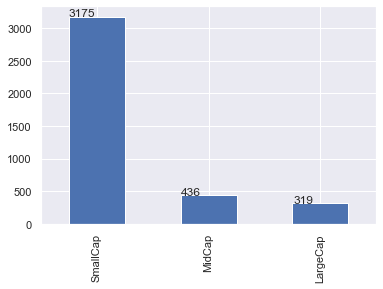

In [563]:
#Cap
ax = df.Cap.value_counts().plot(kind='bar')

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

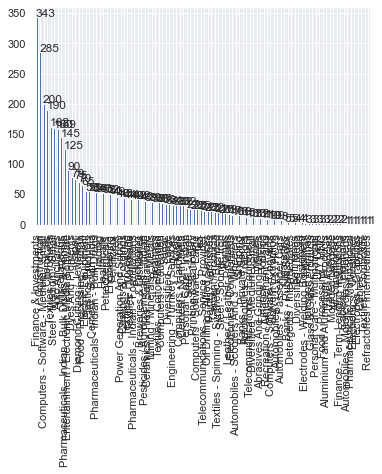

In [564]:
#Industry
ax = df.Industry.value_counts().plot(kind='bar')

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

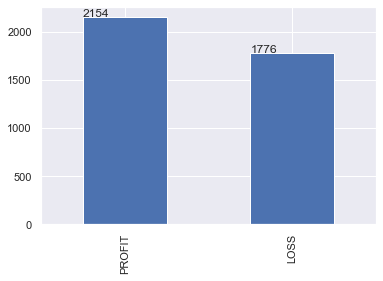

In [565]:
#Return
ax = df.Result.value_counts().plot(kind='bar')

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

In [566]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result13']=df['Result13'].map(r)

In [567]:
df['Cap']

0       0
1       0
2       1
3       0
4       0
       ..
3927    0
3928    0
3929    0
3930    1
3931    0
Name: Cap, Length: 3930, dtype: int64

<AxesSubplot:>

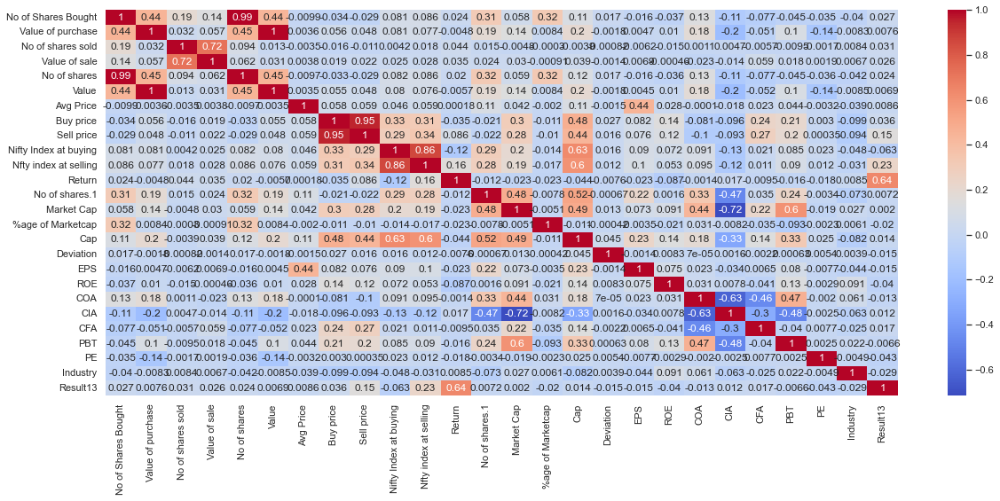

In [568]:
## Feature correlation
plt.figure(figsize=(20,8))
sns.heatmap(df.corr(), annot=True, cmap="coolwarm")

In [569]:
df.drop('Buy Date',1,inplace=True)
df.drop('Sell date',1,inplace=True)
df.drop('Row Labels',1,inplace=True)
#df.drop('Symbol',1,inplace=True)
df.drop('Return',1,inplace=True)
df.drop('Sell price',1,inplace=True)
df.drop('Result',axis=1,inplace=True)
#df.drop('Nifty Index at buying',axis=1,inplace=True)
#df.drop('Nfty index at selling',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Buy Date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Sell date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Row Labels',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Return',1,inplace=True)
C:\Users\Anmol Choubey\AppD

<AxesSubplot:>

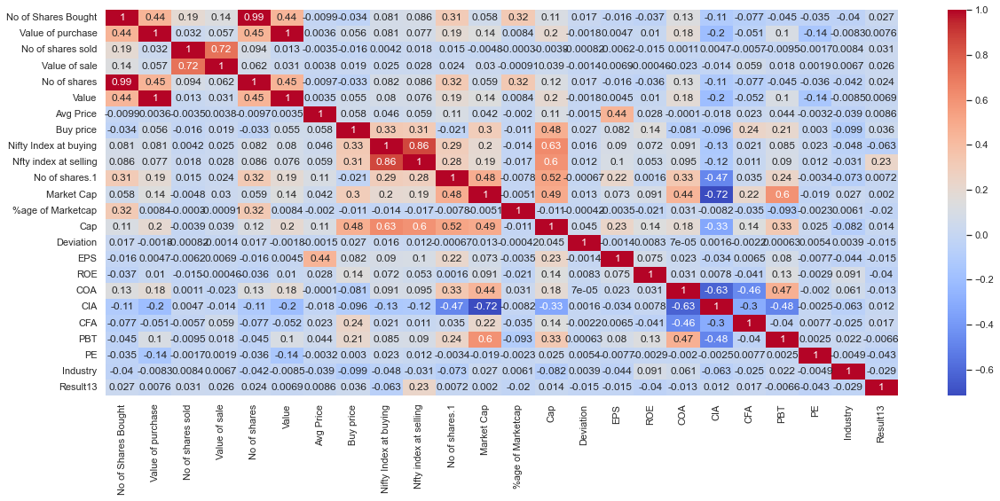

In [570]:
## Feature correlation
plt.figure(figsize=(20,8))
sns.heatmap(df.corr(), annot=True, cmap="coolwarm")

In [571]:
df['code'] = pd.factorize(df['Symbol'])[0] + 1

In [572]:
df.drop('Symbol',1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\265036371.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Symbol',1,inplace=True)


In [573]:
df_feature = df.drop('Result13',axis='columns')
df_label = df['Result13']

In [574]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.130340,-0.104660,-0.047655,-0.07972,-0.127341,-0.102724,-0.088595,-0.462558,-0.670799,-0.625330,...,-0.017149,-0.126163,-0.218315,-0.118179,0.144161,-0.004288,-0.163808,-0.082390,-1.174266,-1.409639
1,-0.137344,-0.088224,-0.047655,-0.07972,-0.134451,-0.086269,0.045684,1.947347,-0.670799,-0.625330,...,-0.017177,0.182627,0.720264,-0.045201,0.097982,-0.056017,-0.050900,-0.007642,-1.127962,-1.403525
2,2.153616,-0.084064,-0.047655,-0.07972,2.191031,-0.082105,-0.088586,-0.456210,1.353829,1.120459,...,-0.017135,-0.158108,-0.687605,0.542457,-0.771012,0.134879,-1.173527,-0.109400,-1.081658,-1.397411
3,0.457783,-0.095015,-0.047655,-0.07972,0.469645,-0.093068,-0.088408,-0.470435,-0.670799,-0.625330,...,-0.017178,-0.137614,-0.628944,-0.113701,0.148323,-0.017498,-0.167568,0.567691,-1.035354,-1.391297
4,0.029533,-0.004766,-0.047655,-0.07972,0.034941,-0.002717,-0.074354,-0.257214,-0.670799,-0.625330,...,-0.017178,-0.100536,0.485619,-0.015243,0.018401,-0.008961,-0.017924,-0.027269,-0.989051,-1.385183


In [575]:
from sklearn.model_selection import train_test_split

X_big, X_test, y_big, y_test = train_test_split(df_feature_scaler, df_label, test_size=0.2, random_state=27)
#becase the data isn't too much, so I take the validation data from train data
X_train, X_val, y_train, y_val = train_test_split(X_big, y_big, test_size=0.2, random_state=27)

In [576]:
print(X_big.shape, X_val.shape, X_test.shape,X_train.shape)

(3144, 24) (629, 24) (786, 24) (2515, 24)


In [577]:
np.savez('main_train', inputs=X_train, targets=y_train)
np.savez('main_val', inputs=X_val, targets=y_val)
np.savez('main_test', inputs=X_test, targets=y_test)

In [578]:
npz_train = np.load('main_train.npz')
train_inputs, train_targets = npz_train['inputs'].astype(np.float), npz_train['targets'].astype(int)

npz_val = np.load('main_val.npz')
val_inputs, val_targets = npz_val['inputs'].astype(np.float), npz_val['targets'].astype(int)

npz_test = np.load('main_test.npz')
test_inputs, test_targets = npz_test['inputs'].astype(np.float), npz_test['targets'].astype(int)

In [579]:
#MODEL

import tensorflow as tf
hidden_layer_size = 150
output_size = 2 #0 and 1

#3 hidden layer, depth 100
model = tf.keras.Sequential([
    tf.keras.layers.Dense(hidden_layer_size, activation='relu'),
    tf.keras.layers.Dense(hidden_layer_size, activation='relu'),
    tf.keras.layers.Dense(hidden_layer_size, activation='relu'),
    tf.keras.layers.Dense(output_size, activation='softmax')
])

#optimizer
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

early_stopping = tf.keras.callbacks.EarlyStopping(patience=2)
history = model.fit(train_inputs,
          train_targets,
          batch_size = 200,
          epochs = 30,
          #callbacks = [early_stopping],
          validation_data = (val_inputs, val_targets),
          verbose = 2)

Epoch 1/30
13/13 - 0s - loss: 0.6789 - accuracy: 0.6346 - val_loss: 0.6275 - val_accuracy: 0.6677
Epoch 2/30
13/13 - 0s - loss: 0.6128 - accuracy: 0.6835 - val_loss: 0.5699 - val_accuracy: 0.7790
Epoch 3/30
13/13 - 0s - loss: 0.5270 - accuracy: 0.7750 - val_loss: 0.4912 - val_accuracy: 0.7886
Epoch 4/30
13/13 - 0s - loss: 0.4764 - accuracy: 0.7885 - val_loss: 0.4726 - val_accuracy: 0.7997
Epoch 5/30
13/13 - 0s - loss: 0.4637 - accuracy: 0.7948 - val_loss: 0.4660 - val_accuracy: 0.7981
Epoch 6/30
13/13 - 0s - loss: 0.4565 - accuracy: 0.7944 - val_loss: 0.4779 - val_accuracy: 0.8076
Epoch 7/30
13/13 - 0s - loss: 0.4424 - accuracy: 0.8028 - val_loss: 0.4613 - val_accuracy: 0.8045
Epoch 8/30
13/13 - 0s - loss: 0.4373 - accuracy: 0.8080 - val_loss: 0.4649 - val_accuracy: 0.8076
Epoch 9/30
13/13 - 0s - loss: 0.4326 - accuracy: 0.8111 - val_loss: 0.4704 - val_accuracy: 0.8029
Epoch 10/30
13/13 - 0s - loss: 0.4294 - accuracy: 0.8123 - val_loss: 0.4655 - val_accuracy: 0.7997
Epoch 11/30
13/13 -

In [580]:
def plot_learningCurve(history, epochs):
  epoch_range = range(1, epochs+1)
  plt.plot(epoch_range, history.history['accuracy'])
  plt.plot(epoch_range, history.history['val_accuracy'])
  plt.title('Model Accuracy')
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy')
  plt.legend(['Train', 'Val'], loc='upper right')
  plt.show()

  plt.plot(epoch_range, history.history['loss'])
  plt.plot(epoch_range, history.history['val_loss'])
  plt.title('Model Loss')
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.legend(['Train', 'Val'], loc='upper right')
  plt.show()

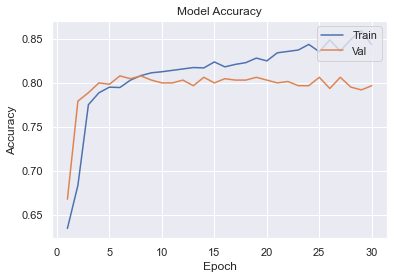

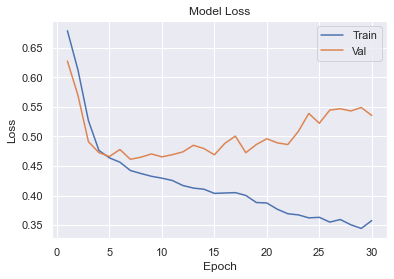

In [581]:
plot_learningCurve(history, 30)

In [582]:
test_loss, test_accuracy = model.evaluate(test_inputs, test_targets)
print("Test loss: {0:.2f} and Test accuracy: {1:.2f}% ".format(test_loss,test_accuracy*100))

25/25 [==============================] - 0s 916us/step - loss: 0.4743 - accuracy: 0.8003
Test loss: 0.47 and Test accuracy: 80.03% 


In [583]:
yp = model.predict(test_inputs)
yp[:5]

array([[0.96238416, 0.03761588],
       [0.03067539, 0.96932465],
       [0.8158577 , 0.18414226],
       [0.90095055, 0.09904952],
       [0.20936394, 0.7906361 ]], dtype=float32)

In [584]:
test_targets[:10]

array([0, 1, 0, 0, 1, 0, 1, 1, 0, 1])

In [585]:
y_pred = []
for element in yp:
    if element[1] > element[0]:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [586]:
y_pred=pd.DataFrame(y_pred)

In [587]:
y_pred[:10]

,0
0,0
1,1
2,0
3,0
4,1
5,0
6,1
7,1
8,0
9,1


Text(66.5, 0.5, 'Truth')

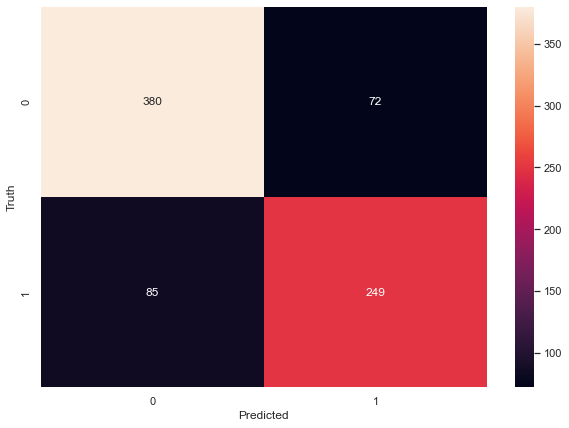

In [588]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=test_targets,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [589]:
test_inputs=pd.DataFrame(test_inputs)
test_targets=pd.DataFrame(test_targets)

In [590]:
#imp
test_inputs.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_cnn_9mon_13.xlsx")
test_targets.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_cnn_9mon_13.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_cnn_9mon_13.xlsx")

In [591]:
df_x=df_feature_scaler[3718:]
df_y=df_label[3718:]

In [592]:
yp = model.predict(df_x)
yp[:5]

array([[0.95011777, 0.04988219],
       [0.7185928 , 0.2814072 ],
       [0.17704892, 0.8229511 ],
       [0.00868743, 0.99131256],
       [0.19402081, 0.8059792 ]], dtype=float32)

In [593]:
y_pred1 = []
for element in yp:
    if element[1] > element[0]:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [594]:
y_pred1[:10]

[0, 0, 1, 1, 1, 1, 1, 1, 1, 1]

In [595]:
df_y[:10]

3720    0
3721    0
3722    1
3723    1
3724    0
3725    1
3726    1
3727    1
3728    1
3729    1
Name: Result13, dtype: int64

In [596]:
y_pred1=pd.DataFrame(y_pred1)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_cnn_9mon_test_13.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_cnn_9mon_test_13.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_cnn_9mon_test_13.xlsx")

In [597]:
# 12 months 15%

In [598]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
sns.set()

In [599]:
df =pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/12_months.csv")
df.head()

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result15
0,ALMONDZ GLOBAL SECURITIES LTD.,ALMONDZ,61581,1.264405e+05,0,0.0,61581,1.264405e+05,2.05,10-01-2015,...,2.93,0.10,-18.00,-8.00,31.00,11.00,3.24,Finance & Investments,PROFIT,PROFIT
1,ATUL LTD.,ATUL,18541,2.410243e+07,0,0.0,18541,2.410243e+07,1299.95,10-01-2015,...,81.13,0.26,306.00,-167.00,-124.00,326.00,19.54,Dyes And Pigments,PROFIT,PROFIT
2,GMR INFRASTRUCTURE LTD.,GMRINFRA,14096100,3.017007e+07,0,0.0,14096100,3.017007e+07,2.14,10-01-2015,...,-5.16,0.02,2915.00,-3159.00,448.00,-2806.00,-2.65,Engineering - Turnkey Services,LOSS,LOSS
3,INDOWIND ENERGY LTD.,INDOWIND,3675498,1.419600e+07,0,0.0,3675498,1.419600e+07,3.86,10-01-2015,...,0.03,0.03,1.88,6.33,-8.58,0.51,145.00,Power Generation And Supply,LOSS,LOSS
4,JAGRAN PRAKASHAN LTD.,JAGRAN,1043972,1.458429e+08,0,0.0,1043972,1.458429e+08,139.70,10-01-2015,...,9.42,0.22,439.00,-441.00,17.00,418.00,15.26,Entertainment / Electronic Media Software,PROFIT,PROFIT


In [600]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            2
No of shares             0
Value                    0
Avg Price                0
Buy Date                 0
Sell date                0
Buy price                0
Sell price               0
Nifty Index at buying    0
Nfty index at selling    0
Change in Nifty 50       0
Return                   0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Result                   0
Result15                 0
dtype: int64
Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares so

In [601]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3800 entries, 0 to 3801
Data columns (total 32 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Row Labels             3800 non-null   object 
 1   Symbol                 3800 non-null   object 
 2   No of Shares Bought    3800 non-null   int64  
 3   Value of purchase      3800 non-null   float64
 4   No of shares sold      3800 non-null   int64  
 5   Value of sale          3800 non-null   float64
 6   No of shares           3800 non-null   int64  
 7   Value                  3800 non-null   float64
 8   Avg Price              3800 non-null   float64
 9   Buy Date               3800 non-null   object 
 10  Sell date              3800 non-null   object 
 11  Buy price              3800 non-null   float64
 12  Sell price             3800 non-null   float64
 13  Nifty Index at buying  3800 non-null   float64
 14  Nfty index at selling  3800 non-null   float64
 15  Chan

In [602]:
df['Cap']

0       SmallCap
1       SmallCap
2         MidCap
3       SmallCap
4       SmallCap
          ...   
3797    SmallCap
3798    SmallCap
3799    SmallCap
3800    SmallCap
3801    SmallCap
Name: Cap, Length: 3800, dtype: object

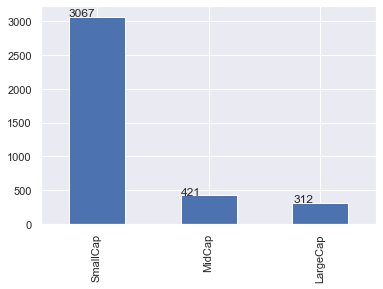

In [603]:
#Cap
ax = df.Cap.value_counts().plot(kind='bar')

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

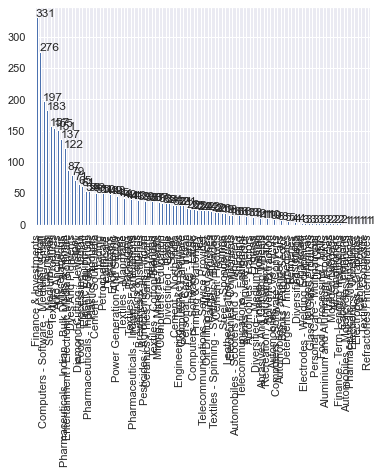

In [604]:
#Industry
ax = df.Industry.value_counts().plot(kind='bar')

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

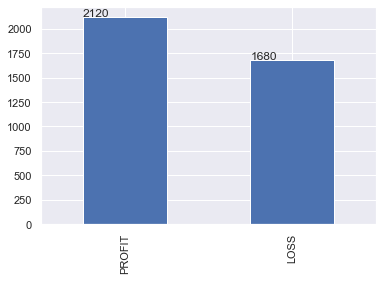

In [605]:
#Return
ax = df.Result.value_counts().plot(kind='bar')

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

In [606]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result15']=df['Result15'].map(r)

In [607]:
df['Cap']

0       0
1       0
2       1
3       0
4       0
       ..
3797    0
3798    0
3799    0
3800    0
3801    0
Name: Cap, Length: 3800, dtype: int64

<AxesSubplot:>

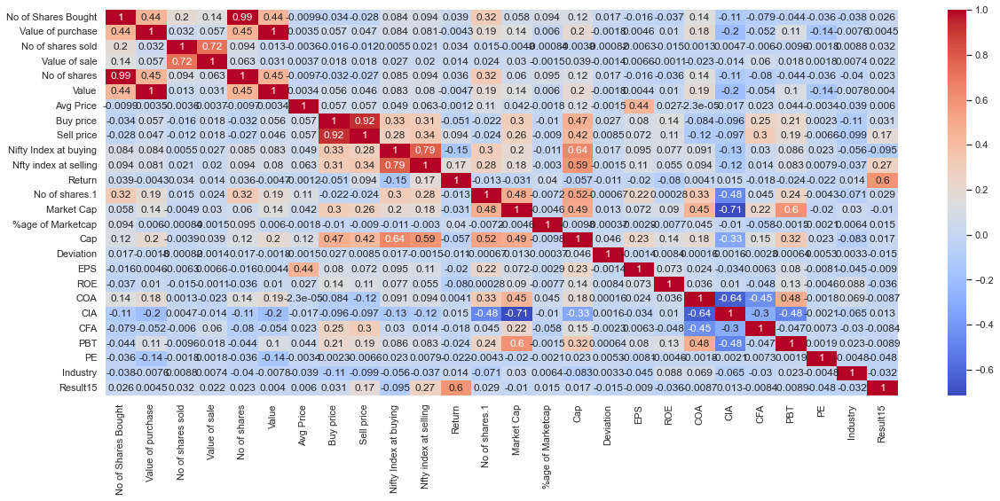

In [608]:
## Feature correlation
plt.figure(figsize=(20,8))
sns.heatmap(df.corr(), annot=True, cmap="coolwarm")

In [609]:
df.drop('Buy Date',1,inplace=True)
df.drop('Sell date',1,inplace=True)
df.drop('Row Labels',1,inplace=True)
#df.drop('Symbol',1,inplace=True)
df.drop('Return',1,inplace=True)
df.drop('Sell price',1,inplace=True)
df.drop('Result',axis=1,inplace=True)
#df.drop('Nifty Index at buying',axis=1,inplace=True)
#df.drop('Nfty index at selling',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Buy Date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Sell date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Row Labels',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Return',1,inplace=True)
C:\Users\Anmol Choubey\AppD

<AxesSubplot:>

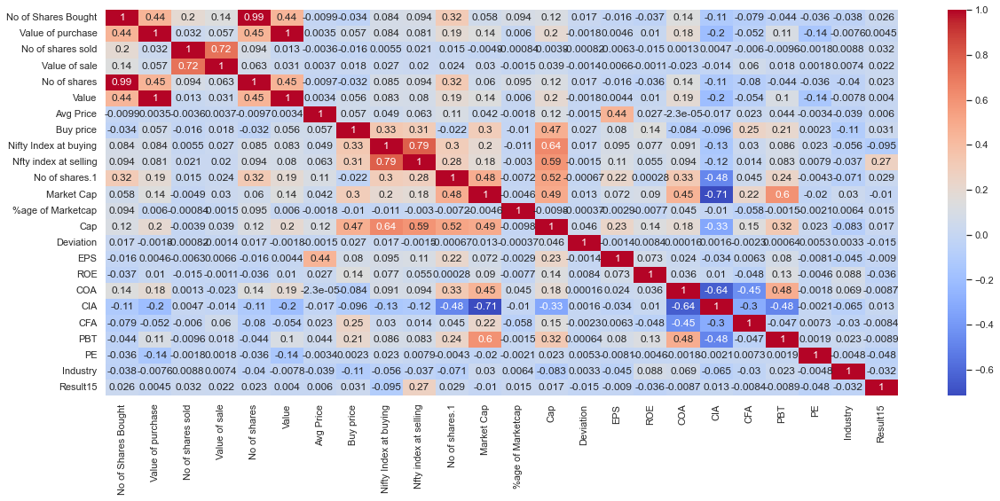

In [610]:
## Feature correlation
plt.figure(figsize=(20,8))
sns.heatmap(df.corr(), annot=True, cmap="coolwarm")

In [611]:
df['code'] = pd.factorize(df['Symbol'])[0] + 1

In [612]:
df.drop('Symbol',1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\265036371.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Symbol',1,inplace=True)


In [613]:
df_feature = df.drop('Result15',axis='columns')
df_label = df['Result15']

In [614]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.129914,-0.104780,-0.048032,-0.079303,-0.126863,-0.102859,-0.089025,-0.461750,-0.662357,-0.572845,...,-0.017137,-0.126859,-0.226424,-0.115510,0.144622,-0.009644,-0.164139,-0.083690,-1.176468,-1.412928
1,-0.136837,-0.088606,-0.048032,-0.079303,-0.133892,-0.086667,0.043030,1.941249,-0.662357,-0.572845,...,-0.017165,0.176922,0.707855,-0.042332,0.099079,-0.061441,-0.052840,-0.010078,-1.130019,-1.406739
2,2.127667,-0.084513,-0.048032,-0.079303,2.165097,-0.082569,-0.089015,-0.455420,1.413796,1.421866,...,-0.017123,-0.158286,-0.693564,0.546931,-0.757928,0.129707,-1.159471,-0.110290,-1.083570,-1.400550
3,0.451418,-0.095289,-0.048032,-0.079303,0.463321,-0.093357,-0.088840,-0.469605,-0.662357,-0.572845,...,-0.017165,-0.138124,-0.635172,-0.111020,0.148727,-0.022871,-0.167845,0.556506,-1.037121,-1.394361
4,0.028113,-0.006480,-0.048032,-0.079303,0.033570,-0.004447,-0.075019,-0.256994,-0.662357,-0.572845,...,-0.017166,-0.101647,0.474285,-0.012293,0.020597,-0.014322,-0.020333,-0.029407,-0.990672,-1.388172


In [615]:
from sklearn.model_selection import train_test_split

X_big, X_test, y_big, y_test = train_test_split(df_feature_scaler, df_label, test_size=0.2, random_state=27)
#becase the data isn't too much, so I take the validation data from train data
X_train, X_val, y_train, y_val = train_test_split(X_big, y_big, test_size=0.2, random_state=27)

In [616]:
print(X_big.shape, X_val.shape, X_test.shape,X_train.shape)

(3040, 24) (608, 24) (760, 24) (2432, 24)


In [617]:
np.savez('main_train', inputs=X_train, targets=y_train)
np.savez('main_val', inputs=X_val, targets=y_val)
np.savez('main_test', inputs=X_test, targets=y_test)

In [618]:
npz_train = np.load('main_train.npz')
train_inputs, train_targets = npz_train['inputs'].astype(np.float), npz_train['targets'].astype(int)

npz_val = np.load('main_val.npz')
val_inputs, val_targets = npz_val['inputs'].astype(np.float), npz_val['targets'].astype(int)

npz_test = np.load('main_test.npz')
test_inputs, test_targets = npz_test['inputs'].astype(np.float), npz_test['targets'].astype(int)

In [619]:
#MODEL

import tensorflow as tf
hidden_layer_size = 150
output_size = 2 #0 and 1

#3 hidden layer, depth 100
model = tf.keras.Sequential([
    tf.keras.layers.Dense(hidden_layer_size, activation='relu'),
    tf.keras.layers.Dense(hidden_layer_size, activation='relu'),
    tf.keras.layers.Dense(hidden_layer_size, activation='relu'),
    tf.keras.layers.Dense(output_size, activation='softmax')
])

#optimizer
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

early_stopping = tf.keras.callbacks.EarlyStopping(patience=2)
history = model.fit(train_inputs,
          train_targets,
          batch_size = 200,
          epochs = 30,
          #callbacks = [early_stopping],
          validation_data = (val_inputs, val_targets),
          verbose = 2)

Epoch 1/30
13/13 - 0s - loss: 0.6685 - accuracy: 0.6242 - val_loss: 0.5968 - val_accuracy: 0.7730
Epoch 2/30
13/13 - 0s - loss: 0.5692 - accuracy: 0.7574 - val_loss: 0.4952 - val_accuracy: 0.7993
Epoch 3/30
13/13 - 0s - loss: 0.4910 - accuracy: 0.7796 - val_loss: 0.4489 - val_accuracy: 0.8125
Epoch 4/30
13/13 - 0s - loss: 0.4788 - accuracy: 0.7747 - val_loss: 0.4394 - val_accuracy: 0.8174
Epoch 5/30
13/13 - 0s - loss: 0.4587 - accuracy: 0.7928 - val_loss: 0.4746 - val_accuracy: 0.7862
Epoch 6/30
13/13 - 0s - loss: 0.4646 - accuracy: 0.7944 - val_loss: 0.4489 - val_accuracy: 0.8141
Epoch 7/30
13/13 - 0s - loss: 0.4531 - accuracy: 0.7989 - val_loss: 0.4305 - val_accuracy: 0.8141
Epoch 8/30
13/13 - 0s - loss: 0.4466 - accuracy: 0.7965 - val_loss: 0.4481 - val_accuracy: 0.8141
Epoch 9/30
13/13 - 0s - loss: 0.4421 - accuracy: 0.8063 - val_loss: 0.4608 - val_accuracy: 0.8092
Epoch 10/30
13/13 - 0s - loss: 0.4345 - accuracy: 0.8035 - val_loss: 0.4479 - val_accuracy: 0.8092
Epoch 11/30
13/13 -

In [620]:
def plot_learningCurve(history, epochs):
  epoch_range = range(1, epochs+1)
  plt.plot(epoch_range, history.history['accuracy'])
  plt.plot(epoch_range, history.history['val_accuracy'])
  plt.title('Model Accuracy')
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy')
  plt.legend(['Train', 'Val'], loc='upper right')
  plt.show()

  plt.plot(epoch_range, history.history['loss'])
  plt.plot(epoch_range, history.history['val_loss'])
  plt.title('Model Loss')
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.legend(['Train', 'Val'], loc='upper right')
  plt.show()

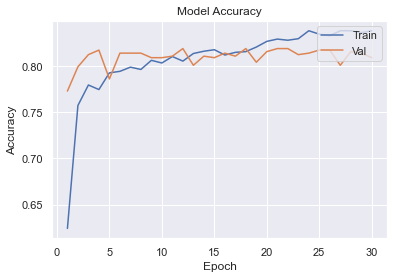

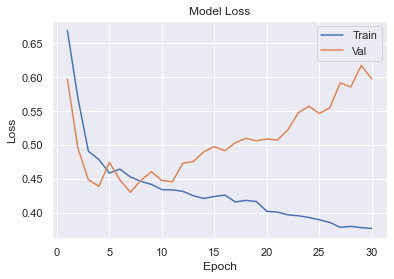

In [621]:
plot_learningCurve(history, 30)

In [622]:
test_loss, test_accuracy = model.evaluate(test_inputs, test_targets)
print("Test loss: {0:.2f} and Test accuracy: {1:.2f}% ".format(test_loss,test_accuracy*100))

24/24 [==============================] - 0s 2ms/step - loss: 0.5031 - accuracy: 0.7947
Test loss: 0.50 and Test accuracy: 79.47% 


In [623]:
yp = model.predict(test_inputs)
yp[:5]

array([[0.464871  , 0.5351291 ],
       [0.9429109 , 0.05708905],
       [0.00739294, 0.9926071 ],
       [0.86843634, 0.13156365],
       [0.4465966 , 0.55340344]], dtype=float32)

In [624]:
test_targets[:10]

array([1, 0, 1, 0, 1, 1, 0, 0, 0, 1])

In [625]:
y_pred = []
for element in yp:
    if element[1] > element[0]:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [626]:
y_pred=pd.DataFrame(y_pred)

In [627]:
y_pred[:10]

,0
0,1
1,0
2,1
3,0
4,1
5,0
6,0
7,1
8,0
9,1


Text(66.5, 0.5, 'Truth')

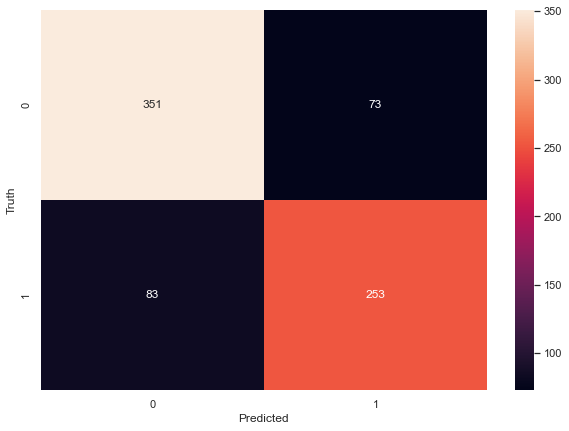

In [628]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=test_targets,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [629]:
test_inputs=pd.DataFrame(test_inputs)
test_targets=pd.DataFrame(test_targets)

In [630]:
#imp
test_inputs.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_cnn_12mon_15.xlsx")
test_targets.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_cnn_12mon_15.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_cnn_12mon_15.xlsx")

In [631]:
df_x=df_feature_scaler[3508:]
df_y=df_label[3508:]

In [632]:
yp = model.predict(df_x)
yp[:5]

array([[0.05821935, 0.9417807 ],
       [0.07842907, 0.92157096],
       [0.02209852, 0.97790146],
       [0.00561251, 0.99438745],
       [0.22963634, 0.7703637 ]], dtype=float32)

In [633]:
y_pred1 = []
for element in yp:
    if element[1] > element[0]:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [634]:
y_pred1[:10]

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

In [635]:
df_y[:10]

3510    1
3511    1
3512    1
3513    1
3514    1
3515    1
3516    1
3517    1
3518    1
3519    1
Name: Result15, dtype: int64

In [636]:
y_pred1=pd.DataFrame(y_pred1)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_cnn_12mon_test_15.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_cnn_12mon_test_15.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_cnn_12mon_test_15.xlsx")

In [637]:
# max

In [638]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
sns.set()

In [639]:
df =pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/max.csv")
df.head()

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,Change in Nifty 50(6),Change in Nifty 50(9),Change in Nifty 50(12),Return(2),Return(6),Return(9),Return(12),Return,Change in Nifty 50,Result15
0,ALMONDZ GLOBAL SECURITIES LTD.,ALMONDZ,61581,1.264405e+05,0,0.0,61581,1.264405e+05,2.05,10-01-2015,...,-7.37%,10.40%,17.25%,8.42%,-3.68%,36.84%,25.26%,0.37,0.10,PROFIT
1,ATUL LTD.,ATUL,18541,2.410243e+07,0,0.0,18541,2.410243e+07,1299.95,10-01-2015,...,-7.37%,10.40%,17.25%,2.69%,-3.07%,27.55%,50.46%,0.50,0.17,PROFIT
2,GMR INFRASTRUCTURE LTD.,GMRINFRA,14096100,3.017007e+07,0,0.0,14096100,3.017007e+07,2.14,10-01-2015,...,-2.59%,6.03%,18.83%,29.30%,-12.45%,-2.56%,-3.66%,0.29,0.02,PROFIT
3,INDOWIND ENERGY LTD.,INDOWIND,3675498,1.419600e+07,0,0.0,3675498,1.419600e+07,3.86,10-01-2015,...,-7.37%,10.40%,17.25%,8.05%,-11.49%,4.60%,-1.15%,0.08,0.06,LOSS
4,JAGRAN PRAKASHAN LTD.,JAGRAN,1043972,1.458429e+08,0,0.0,1043972,1.458429e+08,139.70,10-01-2015,...,-7.37%,10.40%,17.25%,7.76%,10.57%,23.55%,32.77%,0.33,0.17,PROFIT


In [640]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

Row Labels                  0
Symbol                      0
No of Shares Bought         0
Value of purchase           0
No of shares sold           0
Value of sale               1
No of shares                0
Value                       0
Avg Price                   0
Buy Date                    0
Sell date                   0
Buy price                   0
Nifty Index at buying       0
No of shares.1              0
Market Cap                  0
%age of Marketcap           0
Cap                         0
Deviation                   0
EPS                         0
ROE                         0
COA                         0
CIA                         0
CFA                         0
PBT                         0
PE                          0
Industry                    0
Sell price(2)               0
Nfty index at selling(2)    0
Change in Nifty 50(2)       0
Change in Nifty 50(6)       0
Change in Nifty 50(9)       0
Change in Nifty 50(12)      0
Return(2)                   0
Return(6) 

In [641]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3082 entries, 0 to 3082
Data columns (total 39 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Row Labels                3082 non-null   object 
 1   Symbol                    3082 non-null   object 
 2   No of Shares Bought       3082 non-null   int64  
 3   Value of purchase         3082 non-null   float64
 4   No of shares sold         3082 non-null   int64  
 5   Value of sale             3082 non-null   float64
 6   No of shares              3082 non-null   int64  
 7   Value                     3082 non-null   float64
 8   Avg Price                 3082 non-null   float64
 9   Buy Date                  3082 non-null   object 
 10  Sell date                 3082 non-null   object 
 11  Buy price                 3082 non-null   float64
 12  Nifty Index at buying     3082 non-null   float64
 13  No of shares.1            3082 non-null   int64  
 14  Market C

In [642]:
df['Cap']

0       SmallCap
1       SmallCap
2         MidCap
3       SmallCap
4       SmallCap
          ...   
3078      MidCap
3079    SmallCap
3080    SmallCap
3081    SmallCap
3082    SmallCap
Name: Cap, Length: 3082, dtype: object

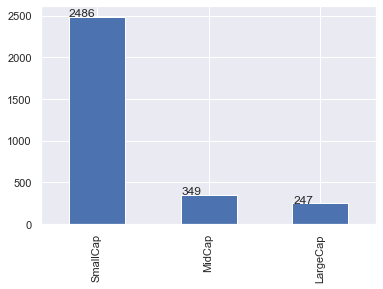

In [643]:
#Cap
ax = df.Cap.value_counts().plot(kind='bar')

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

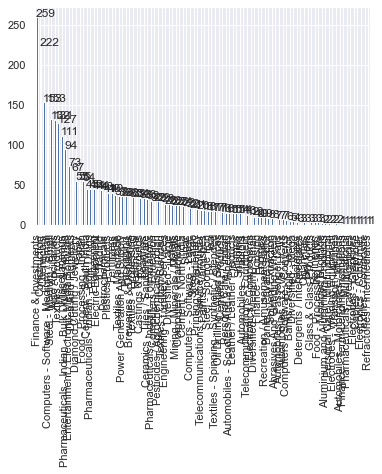

In [644]:
#Industry
ax = df.Industry.value_counts().plot(kind='bar')

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

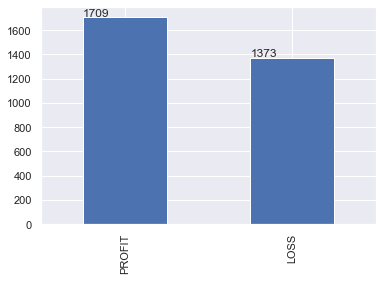

In [645]:
#Return
ax = df.Result15.value_counts().plot(kind='bar')

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

In [646]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result15']=df['Result15'].map(r)

In [647]:
df['Cap']

0       0
1       0
2       1
3       0
4       0
       ..
3078    1
3079    0
3080    0
3081    0
3082    0
Name: Cap, Length: 3082, dtype: int64

<AxesSubplot:>

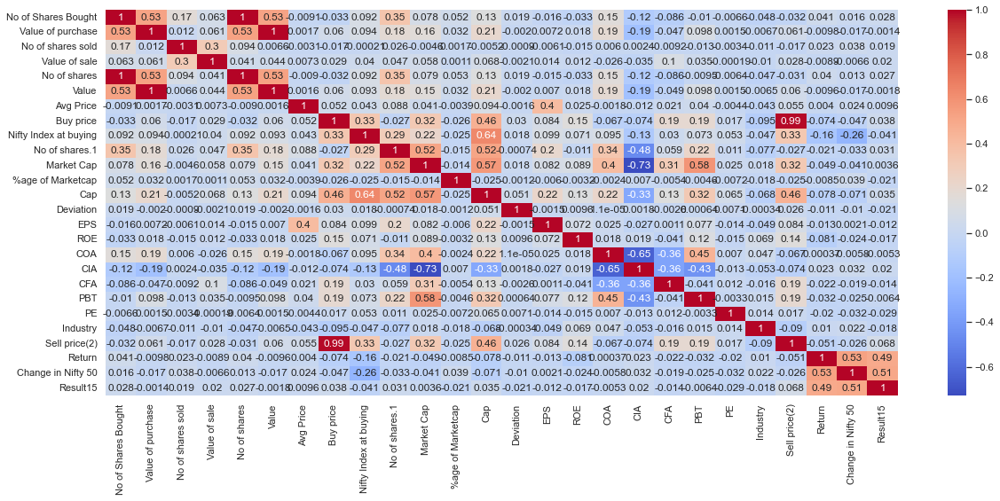

In [648]:
## Feature correlation
plt.figure(figsize=(20,8))
sns.heatmap(df.corr(), annot=True, cmap="coolwarm")

In [649]:
df.drop('Buy Date',1,inplace=True)
df.drop('Sell date',1,inplace=True)
df.drop('Row Labels',1,inplace=True)
#data.drop('Symbol',1,inplace=True)
df.drop('Return',1,inplace=True)
df.drop('Return(2)',1,inplace=True)
df.drop('Return(6)',1,inplace=True)
df.drop('Return(9)',1,inplace=True)
df.drop('Return(12)',1,inplace=True)
df.drop("Sell price(2)",1,inplace=True)
#data.drop('Result3',axis=1,inplace=True)
#data.drop('Nifty Index at buying',axis=1,inplace=True)
df.drop("Nfty index at selling(2)",axis=1,inplace=True)
df.drop("Change in Nifty 50(2)",axis=1,inplace=True)
df.drop("Change in Nifty 50(6)",axis=1,inplace=True)
df.drop("Change in Nifty 50(9)",axis=1,inplace=True)
df.drop("Change in Nifty 50(12)",axis=1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\258682244.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Buy Date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\258682244.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Sell date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\258682244.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Row Labels',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\258682244.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Return',1,inplace=True)
C:\Users\Anmol Choubey\AppD

<AxesSubplot:>

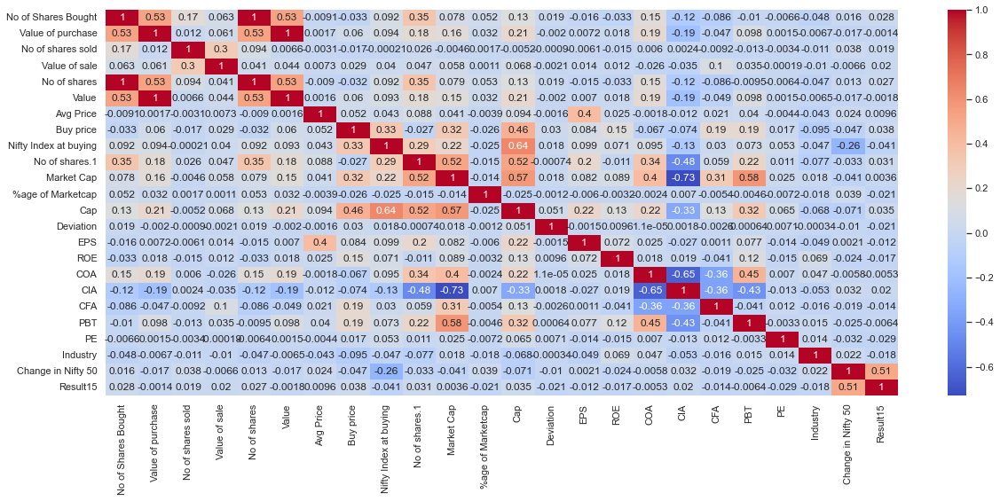

In [650]:
## Feature correlation
plt.figure(figsize=(20,8))
sns.heatmap(df.corr(), annot=True, cmap="coolwarm")

In [651]:
df['code'] = pd.factorize(df['Symbol'])[0] + 1

In [652]:
df.drop('Symbol',1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\265036371.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Symbol',1,inplace=True)


In [653]:
df_feature = df.drop('Result15',axis='columns')
df_label = df['Result15']

In [654]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,No of shares.1,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Change in Nifty 50,code
0,-0.127988,-0.107273,-0.047267,-0.107944,-0.125706,-0.105556,-0.081740,-0.462813,-0.663274,-0.347365,...,-0.127792,-0.246735,-0.132499,0.147276,-0.003521,-0.172464,-0.131762,-1.24067,-0.327825,-1.398516
1,-0.134827,-0.089132,-0.047267,-0.107944,-0.132611,-0.087398,0.040982,1.956260,-0.663274,-0.342251,...,0.199389,0.737650,-0.054647,0.102633,-0.057854,-0.058642,-0.037383,-1.19294,-0.138837,-1.392022
2,2.101849,-0.084541,-0.047267,-0.107944,2.125969,-0.082803,-0.081731,-0.456441,1.397870,7.790057,...,-0.161640,-0.738928,0.572255,-0.737443,0.142654,-1.190363,-0.165865,-1.14521,-0.543811,-1.385527
3,0.446199,-0.096628,-0.047267,-0.107944,0.454105,-0.094900,-0.081569,-0.470720,-0.663274,-0.260905,...,-0.139925,-0.677403,-0.127722,0.151299,-0.017395,-0.176255,0.689046,-1.09748,-0.435818,-1.379033
4,0.028096,0.002985,-0.047267,-0.107944,0.031908,0.004800,-0.068724,-0.256687,-0.663274,0.018920,...,-0.100638,0.491554,-0.022689,0.025701,-0.008428,-0.025398,-0.062164,-1.04975,-0.138837,-1.372538


In [655]:
from sklearn.model_selection import train_test_split

X_big, X_test, y_big, y_test = train_test_split(df_feature_scaler, df_label, test_size=0.2, random_state=27)
#becase the data isn't too much, so I take the validation data from train data
X_train, X_val, y_train, y_val = train_test_split(X_big, y_big, test_size=0.2, random_state=27)

In [656]:
print(X_big.shape, X_val.shape, X_test.shape,X_train.shape)

(2465, 24) (493, 24) (617, 24) (1972, 24)


In [657]:
np.savez('main_train', inputs=X_train, targets=y_train)
np.savez('main_val', inputs=X_val, targets=y_val)
np.savez('main_test', inputs=X_test, targets=y_test)

In [658]:
npz_train = np.load('main_train.npz')
train_inputs, train_targets = npz_train['inputs'].astype(np.float), npz_train['targets'].astype(int)

npz_val = np.load('main_val.npz')
val_inputs, val_targets = npz_val['inputs'].astype(np.float), npz_val['targets'].astype(int)

npz_test = np.load('main_test.npz')
test_inputs, test_targets = npz_test['inputs'].astype(np.float), npz_test['targets'].astype(int)

In [659]:
#MODEL

import tensorflow as tf
hidden_layer_size = 150
output_size = 2 #0 and 1

#3 hidden layer, depth 100
model = tf.keras.Sequential([
    tf.keras.layers.Dense(hidden_layer_size, activation='relu'),
    tf.keras.layers.Dense(hidden_layer_size, activation='relu'),
    tf.keras.layers.Dense(hidden_layer_size, activation='relu'),
    tf.keras.layers.Dense(output_size, activation='softmax')
])

#optimizer
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

early_stopping = tf.keras.callbacks.EarlyStopping(patience=2)
history = model.fit(train_inputs,
          train_targets,
          batch_size = 200,
          epochs = 30,
          #callbacks = [early_stopping],
          validation_data = (val_inputs, val_targets),
          verbose = 2)

Epoch 1/30
10/10 - 0s - loss: 0.6058 - accuracy: 0.6810 - val_loss: 0.5517 - val_accuracy: 0.7323
Epoch 2/30
10/10 - 0s - loss: 0.5132 - accuracy: 0.7683 - val_loss: 0.5124 - val_accuracy: 0.7586
Epoch 3/30
10/10 - 0s - loss: 0.4799 - accuracy: 0.7819 - val_loss: 0.5319 - val_accuracy: 0.7586
Epoch 4/30
10/10 - 0s - loss: 0.4759 - accuracy: 0.7825 - val_loss: 0.5430 - val_accuracy: 0.7383
Epoch 5/30
10/10 - 0s - loss: 0.4737 - accuracy: 0.7784 - val_loss: 0.5160 - val_accuracy: 0.7606
Epoch 6/30
10/10 - 0s - loss: 0.4614 - accuracy: 0.7855 - val_loss: 0.5362 - val_accuracy: 0.7485
Epoch 7/30
10/10 - 0s - loss: 0.4560 - accuracy: 0.7926 - val_loss: 0.5081 - val_accuracy: 0.7769
Epoch 8/30
10/10 - 0s - loss: 0.4456 - accuracy: 0.7997 - val_loss: 0.5093 - val_accuracy: 0.7627
Epoch 9/30
10/10 - 0s - loss: 0.4394 - accuracy: 0.8027 - val_loss: 0.5047 - val_accuracy: 0.7728
Epoch 10/30
10/10 - 0s - loss: 0.4338 - accuracy: 0.8098 - val_loss: 0.5054 - val_accuracy: 0.7708
Epoch 11/30
10/10 -

In [660]:
def plot_learningCurve(history, epochs):
  epoch_range = range(1, epochs+1)
  plt.plot(epoch_range, history.history['accuracy'])
  plt.plot(epoch_range, history.history['val_accuracy'])
  plt.title('Model Accuracy')
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy')
  plt.legend(['Train', 'Val'], loc='upper right')
  plt.show()

  plt.plot(epoch_range, history.history['loss'])
  plt.plot(epoch_range, history.history['val_loss'])
  plt.title('Model Loss')
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.legend(['Train', 'Val'], loc='upper right')
  plt.show()

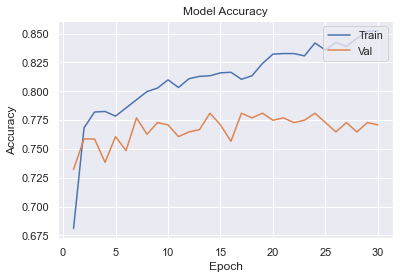

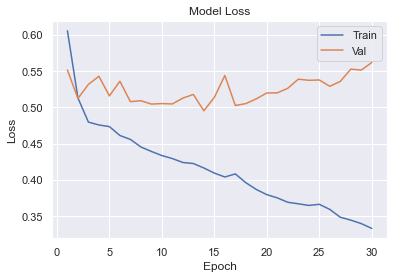

In [661]:
plot_learningCurve(history, 30)

In [662]:
test_loss, test_accuracy = model.evaluate(test_inputs, test_targets)
print("Test loss: {0:.2f} and Test accuracy: {1:.2f}% ".format(test_loss,test_accuracy*100))

20/20 [==============================] - 0s 648us/step - loss: 0.5949 - accuracy: 0.7601
Test loss: 0.59 and Test accuracy: 76.01% 


In [663]:
yp = model.predict(test_inputs)
yp[:5]

array([[0.75551915, 0.24448077],
       [0.8462545 , 0.15374544],
       [0.45822385, 0.5417761 ],
       [0.87575585, 0.1242441 ],
       [0.42640975, 0.57359034]], dtype=float32)

In [664]:
test_targets[:10]

array([1, 0, 1, 0, 0, 1, 0, 0, 1, 0])

In [665]:
y_pred = []
for element in yp:
    if element[1] > element[0]:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [666]:
y_pred=pd.DataFrame(y_pred)

In [667]:
y_pred[:10]

,0
0,0
1,0
2,1
3,0
4,1
5,1
6,0
7,0
8,0
9,1


Text(66.5, 0.5, 'Truth')

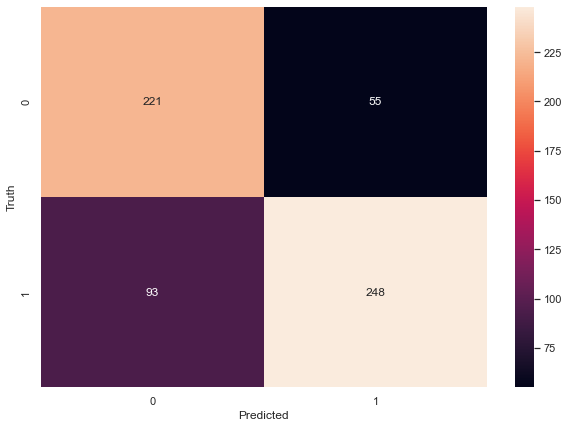

In [668]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=test_targets,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [669]:
test_inputs=pd.DataFrame(test_inputs)
test_targets=pd.DataFrame(test_targets)

In [670]:
#imp
test_inputs.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_cnn_max.xlsx")
test_targets.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_cnn_max.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_cnn_max.xlsx")

In [671]:
df_x=df_feature_scaler[2847:]
df_y=df_label[2847:]

In [672]:
yp = model.predict(df_x)
yp[:5]

array([[0.006647  , 0.993353  ],
       [0.01582057, 0.98417944],
       [0.0204687 , 0.9795313 ],
       [0.03070505, 0.96929497],
       [0.00123897, 0.99876106]], dtype=float32)

In [673]:
y_pred1 = []
for element in yp:
    if element[1] > element[0]:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [674]:
y_pred1[:10]

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

In [675]:
df_y[:10]

2848    1
2849    1
2850    1
2851    1
2852    1
2853    1
2854    1
2855    1
2856    1
2857    1
Name: Result15, dtype: int64

In [676]:
y_pred1=pd.DataFrame(y_pred1)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_cnn_max_test.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_cnn_max_test.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_cnn_max_test.xlsx")

In [677]:
#raise SystemExit("Stop right there!")

In [678]:
#pip install -U numpy==1.19.5

In [679]:
### RNN-LSTM model

import tensorflow as tf

In [680]:
# 2 months

In [1335]:
df =pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/2 month.csv")
df.head()

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result5
0,ALMONDZ GLOBAL SECURITIES LTD.,ALMONDZ,61581,1.264405e+05,0,0.0,61581,1.264405e+05,2.05,10-01-2015,...,2.93,0.10,-18.00,-8.00,31.00,11.00,3.24,Finance & Investments,PROFIT,PROFIT
1,ATUL LTD.,ATUL,18541,2.410243e+07,0,0.0,18541,2.410243e+07,1299.95,10-01-2015,...,81.13,0.26,306.00,-167.00,-124.00,326.00,19.54,Dyes And Pigments,PROFIT,LOSS
2,GMR INFRASTRUCTURE LTD.,GMRINFRA,14096100,3.017007e+07,0,0.0,14096100,3.017007e+07,2.14,10-01-2015,...,-5.16,0.02,2915.00,-3159.00,448.00,-2806.00,-2.65,Engineering - Turnkey Services,PROFIT,PROFIT
3,INDOWIND ENERGY LTD.,INDOWIND,3675498,1.419600e+07,0,0.0,3675498,1.419600e+07,3.86,10-01-2015,...,0.03,0.03,1.88,6.33,-8.58,0.51,145.00,Power Generation And Supply,PROFIT,PROFIT
4,JAGRAN PRAKASHAN LTD.,JAGRAN,1043972,1.458429e+08,0,0.0,1043972,1.458429e+08,139.70,10-01-2015,...,9.42,0.22,439.00,-441.00,17.00,418.00,15.26,Entertainment / Electronic Media Software,PROFIT,PROFIT


In [1336]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            0
No of shares             0
Value                    0
Avg Price                0
Buy Date                 0
Sell date                0
Buy price                0
Sell price               0
Nifty Index at buying    0
Nfty index at selling    0
Change in Nifty 50       0
Return                   0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Result                   0
Result5                  0
dtype: int64
Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares so

In [1337]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result']=df['Result'].map(r)

In [1338]:
df['Cap']

0       0
1       0
2       1
3       0
4       0
       ..
4236    0
4237    0
4238    0
4239    0
4240    0
Name: Cap, Length: 4241, dtype: int64

In [1339]:
df.drop('Buy Date',1,inplace=True)
df.drop('Sell date',1,inplace=True)
df.drop('Row Labels',1,inplace=True)
#df.drop('Symbol',1,inplace=True)
df.drop('Return',1,inplace=True)
df.drop('Sell price',1,inplace=True)
df.drop('Result5',axis=1,inplace=True)
#df.drop('Nifty Index at buying',axis=1,inplace=True)
#df.drop('Nfty index at selling',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\3790309478.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Buy Date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\3790309478.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Sell date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\3790309478.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Row Labels',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\3790309478.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Return',1,inplace=True)
C:\Users\Anmol Choubey\

In [1340]:
df['code']=pd.factorize(df['Symbol'])[0] + 1

In [1341]:
df.drop('Symbol',1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\265036371.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Symbol',1,inplace=True)


In [1342]:
df_feature = df.drop('Result',axis='columns')
df_label = df['Result']

In [1343]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.129067,-0.107008,-0.047593,-0.082351,-0.126057,-0.105010,-0.092596,-0.444790,-0.700391,-0.655708,...,-0.028060,-0.058507,-0.220014,-0.130812,0.148124,0.015864,-0.173498,-0.087246,-1.174670,-1.400415
1,-0.136307,-0.091216,-0.047593,-0.082351,-0.133405,-0.089202,0.045594,1.640970,-0.700391,-0.655708,...,-0.028065,0.001528,0.739882,-0.059730,0.101365,-0.034456,-0.061655,-0.010550,-1.128896,-1.394445
2,2.231717,-0.087220,-0.047593,-0.082351,2.269995,-0.085202,-0.092586,-0.439296,1.112107,1.086441,...,-0.028058,-0.064718,-0.699962,0.512658,-0.778526,0.151242,-1.173701,-0.114960,-1.083121,-1.388474
3,0.478839,-0.097741,-0.047593,-0.082351,0.490931,-0.095734,-0.092403,-0.451608,-0.700391,-0.655708,...,-0.028066,-0.060733,-0.639968,-0.126450,0.152338,0.003015,-0.177223,0.579773,-1.037347,-1.382503
4,0.036183,-0.011034,-0.047593,-0.082351,0.041662,-0.008938,-0.077940,-0.267066,-0.700391,-0.655708,...,-0.028066,-0.053524,0.499908,-0.030551,0.020787,0.011319,-0.028989,-0.030688,-0.991572,-1.376533


In [1344]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.129067,-0.107008,-0.047593,-0.082351,-0.126057,-0.105010,-0.092596,-0.444790,-0.700391,-0.655708,...,-0.028060,-0.058507,-0.220014,-0.130812,0.148124,0.015864,-0.173498,-0.087246,-1.174670,-1.400415
1,-0.136307,-0.091216,-0.047593,-0.082351,-0.133405,-0.089202,0.045594,1.640970,-0.700391,-0.655708,...,-0.028065,0.001528,0.739882,-0.059730,0.101365,-0.034456,-0.061655,-0.010550,-1.128896,-1.394445
2,2.231717,-0.087220,-0.047593,-0.082351,2.269995,-0.085202,-0.092586,-0.439296,1.112107,1.086441,...,-0.028058,-0.064718,-0.699962,0.512658,-0.778526,0.151242,-1.173701,-0.114960,-1.083121,-1.388474
3,0.478839,-0.097741,-0.047593,-0.082351,0.490931,-0.095734,-0.092403,-0.451608,-0.700391,-0.655708,...,-0.028066,-0.060733,-0.639968,-0.126450,0.152338,0.003015,-0.177223,0.579773,-1.037347,-1.382503
4,0.036183,-0.011034,-0.047593,-0.082351,0.041662,-0.008938,-0.077940,-0.267066,-0.700391,-0.655708,...,-0.028066,-0.053524,0.499908,-0.030551,0.020787,0.011319,-0.028989,-0.030688,-0.991572,-1.376533


In [1345]:
from sklearn.model_selection import train_test_split

X1_big, X1_test, y1_big, y1_test = train_test_split(df_feature_scaler, df_label, test_size=0.2, random_state=27)
#becase the data isn't too much, so I take the validation data from train data
X1_train, X1_val, y1_train, y1_val = train_test_split(X1_big, y1_big, test_size=0.2, random_state=27)

In [1346]:
print(X1_big.shape, X1_val.shape, X1_test.shape,X1_train.shape)

(3392, 24) (679, 24) (849, 24) (2713, 24)


In [1347]:
import json
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow.keras as keras
import matplotlib.pyplot as plt

In [1348]:
print(X1_train.shape, ',', X1_train.ndim, ',', type(X1_train))
print(y1_train.shape, ',', y1_train.ndim, ',', type(y1_train))
print(X1_test.shape, ',', X1_val.ndim, ',', type(X1_val))
print(y1_test.shape, ',', y1_val.ndim, ',', type(y1_val))
#print(data_dim)

(2713, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(2713,) , 1 , <class 'pandas.core.series.Series'>
(849, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(849,) , 1 , <class 'pandas.core.series.Series'>


In [1349]:
X1_train=X1_train.to_numpy()
y1_train=y1_train.to_numpy()
X1_test=X1_test.to_numpy()
y1_test=y1_test.to_numpy()
X1_val=X1_val.to_numpy()
y1_val=y1_val.to_numpy()

In [1350]:
X1_train=np.reshape(X1_train,(X1_train.shape[0],1,X1_train.shape[1]))
X1_test=np.reshape(X1_test,(X1_test.shape[0],1,X1_test.shape[1]))

In [1351]:
X1_val=np.reshape(X1_val,(X1_val.shape[0],1,X1_val.shape[1]))
print(X1_val.shape,X1_test.shape,X1_train.shape)

(679, 1, 24) (849, 1, 24) (2713, 1, 24)


In [1352]:
model=keras.Sequential()

#LSTM Layers
model.add(keras.layers.LSTM(units=100,input_shape=(1,24), return_sequences=True))
model.add(keras.layers.LSTM(units=50,dropout=0.05, recurrent_dropout=0.35, return_sequences=False))

#dense layer
model.add(keras.layers.Dense(40, activation='relu'))
model.add(keras.layers.Dropout(0.2))

#output layer
model.add(keras.layers.Dense(2, activation='softmax'))

opti= keras.optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opti, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [1353]:
#early_stopping = tf.keras.callbacks.EarlyStopping(patience=5)
history = model.fit(X1_train,y1_train,
          validation_data=(X1_val,y1_val),
          batch_size = 40,
          epochs = 150,
          #callbacks = [early_stopping],
          #validation_data = (val_inputs1, val_targets1),
          verbose = 2
          )

Epoch 1/150
68/68 - 3s - loss: 0.6912 - accuracy: 0.5507 - val_loss: 0.6909 - val_accuracy: 0.5611
Epoch 2/150
68/68 - 0s - loss: 0.6884 - accuracy: 0.5695 - val_loss: 0.6894 - val_accuracy: 0.5611
Epoch 3/150
68/68 - 0s - loss: 0.6860 - accuracy: 0.5680 - val_loss: 0.6883 - val_accuracy: 0.5611
Epoch 4/150
68/68 - 0s - loss: 0.6841 - accuracy: 0.5680 - val_loss: 0.6876 - val_accuracy: 0.5611
Epoch 5/150
68/68 - 0s - loss: 0.6823 - accuracy: 0.5676 - val_loss: 0.6874 - val_accuracy: 0.5611
Epoch 6/150
68/68 - 0s - loss: 0.6805 - accuracy: 0.5680 - val_loss: 0.6874 - val_accuracy: 0.5611
Epoch 7/150
68/68 - 0s - loss: 0.6793 - accuracy: 0.5687 - val_loss: 0.6875 - val_accuracy: 0.5611
Epoch 8/150
68/68 - 0s - loss: 0.6782 - accuracy: 0.5684 - val_loss: 0.6881 - val_accuracy: 0.5611
Epoch 9/150
68/68 - 0s - loss: 0.6762 - accuracy: 0.5687 - val_loss: 0.6885 - val_accuracy: 0.5611
Epoch 10/150
68/68 - 0s - loss: 0.6753 - accuracy: 0.5691 - val_loss: 0.6887 - val_accuracy: 0.5611
Epoch 11/

68/68 - 0s - loss: 0.5431 - accuracy: 0.7313 - val_loss: 0.6022 - val_accuracy: 0.7216
Epoch 84/150
68/68 - 0s - loss: 0.5433 - accuracy: 0.7295 - val_loss: 0.6012 - val_accuracy: 0.7172
Epoch 85/150
68/68 - 0s - loss: 0.5470 - accuracy: 0.7295 - val_loss: 0.6034 - val_accuracy: 0.7187
Epoch 86/150
68/68 - 0s - loss: 0.5428 - accuracy: 0.7291 - val_loss: 0.6069 - val_accuracy: 0.7187
Epoch 87/150
68/68 - 0s - loss: 0.5448 - accuracy: 0.7291 - val_loss: 0.6058 - val_accuracy: 0.7216
Epoch 88/150
68/68 - 0s - loss: 0.5454 - accuracy: 0.7342 - val_loss: 0.6051 - val_accuracy: 0.7172
Epoch 89/150
68/68 - 0s - loss: 0.5423 - accuracy: 0.7335 - val_loss: 0.6056 - val_accuracy: 0.7113
Epoch 90/150
68/68 - 0s - loss: 0.5462 - accuracy: 0.7291 - val_loss: 0.6047 - val_accuracy: 0.7143
Epoch 91/150
68/68 - 0s - loss: 0.5428 - accuracy: 0.7276 - val_loss: 0.6066 - val_accuracy: 0.7099
Epoch 92/150
68/68 - 0s - loss: 0.5380 - accuracy: 0.7353 - val_loss: 0.6070 - val_accuracy: 0.7202
Epoch 93/150


In [1354]:
test_loss, test_accuracy = model.evaluate(X1_test, y1_test)
print("Test loss: {0:.2f} and Test accuracy: {1:.2f}% ".format(test_loss,test_accuracy*100))

27/27 [==============================] - 0s 1ms/step - loss: 0.6680 - accuracy: 0.6985
Test loss: 0.67 and Test accuracy: 69.85% 


In [1355]:
yp = model.predict(X1_test)
yp[:5]

array([[0.8272234 , 0.17277654],
       [0.7402774 , 0.25972262],
       [0.5806048 , 0.41939518],
       [0.24585144, 0.7541486 ],
       [0.80362797, 0.19637203]], dtype=float32)

In [1356]:
y_pred=[]
for element in yp:
    if element[0]<element[1]:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [1357]:
y_pred=pd.DataFrame(y_pred)

In [1358]:
y_pred[:10]

,0
0,0
1,0
2,0
3,1
4,0
5,1
6,1
7,0
8,0
9,0


In [1359]:
y1_test[:10]

array([0, 0, 1, 1, 0, 0, 0, 0, 0, 0], dtype=int64)

Text(66.5, 0.5, 'Truth')

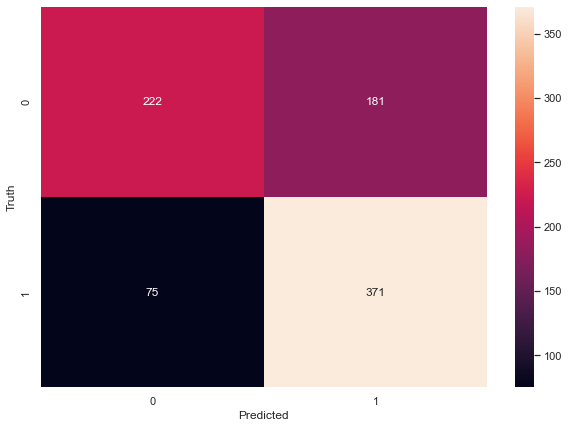

In [1360]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=y1_test,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [1361]:
X1_test=np.reshape(X1_test,(X1_test.shape[0],X1_test.shape[2]))
y1_test=pd.DataFrame(y1_test)
X1_test=pd.DataFrame(X1_test)

In [1362]:
X1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_rnn_2mon.xlsx")
y1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_rnn_2mon.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_rnn_2mon.xlsx")

In [1363]:
df_x=df_feature_scaler[3990:]
df_y=df_label[3990:]
df_x=df_x.to_numpy()
df_y=df_y.to_numpy()
df_x=np.reshape(df_x,(df_x.shape[0],1,df_x.shape[1]))

In [1364]:
yp = model.predict(df_x)
yp[:5]

array([[5.4363281e-01, 4.5636711e-01],
       [3.7134924e-09, 1.0000000e+00],
       [3.5418418e-01, 6.4581585e-01],
       [1.7458135e-01, 8.2541859e-01],
       [2.8856468e-01, 7.1143532e-01]], dtype=float32)

In [1365]:
y_pred1 = []
for element in yp:
    if element[1] > element[0]:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [1366]:
y_pred1[:10]

[0, 1, 1, 1, 1, 1, 1, 0, 0, 1]

In [1367]:
df_y[:10]

array([1, 1, 0, 1, 1, 1, 1, 0, 0, 1], dtype=int64)

In [1368]:
y_pred1=pd.DataFrame(y_pred1)
df_x=np.reshape(df_x,(df_x.shape[0],df_x.shape[2]))
df_x=pd.DataFrame(df_x)
df_y=pd.DataFrame(df_y)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_rnn_2mon_test.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_rnn_2mon_test.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_rnn_2mon_test.xlsx")

In [ ]:
#raise SystemExit("Stop right there!")

In [ ]:
# 6 months

In [1369]:
df =pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/6 months.csv")
df.head()

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result10
0,ALMONDZ GLOBAL SECURITIES LTD.,ALMONDZ,61581,1.264405e+05,0,0.0,61581,1.264405e+05,2.05,10-01-2015,...,2.93,0.1000,-18.00,-8.00,31.00,11.00,3.24,Finance & Investments,LOSS,LOSS
1,ATUL LTD.,ATUL,18541,2.410243e+07,0,0.0,18541,2.410243e+07,1299.95,10-01-2015,...,81.13,0.2600,306.00,-167.00,-124.00,326.00,19.54,Dyes And Pigments,LOSS,LOSS
2,GMR INFRASTRUCTURE LTD.,GMRINFRA,14096100,3.017007e+07,0,0.0,14096100,3.017007e+07,2.14,10-01-2015,...,-5.16,0.0200,2915.00,-3159.00,448.00,-2806.00,-2.65,Engineering - Turnkey Services,LOSS,LOSS
3,INDOWIND ENERGY LTD.,INDOWIND,3675498,1.419600e+07,0,0.0,3675498,1.419600e+07,3.86,10-01-2015,...,0.03,0.0269,1.88,6.33,-8.58,0.51,145.00,Power Generation And Supply,LOSS,LOSS
4,JAGRAN PRAKASHAN LTD.,JAGRAN,1043972,1.458429e+08,0,0.0,1043972,1.458429e+08,139.70,10-01-2015,...,9.42,0.2200,439.00,-441.00,17.00,418.00,15.26,Entertainment / Electronic Media Software,PROFIT,PROFIT


In [1370]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            2
No of shares             0
Value                    0
Avg Price                0
Buy Date                 0
Sell date                0
Buy price                0
Sell price               0
Nifty Index at buying    0
Nfty index at selling    0
Change in Nifty 50       0
Return                   0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Result                   0
Result10                 0
dtype: int64
Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares so

In [1371]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result']=df['Result'].map(r)

In [1372]:
df['Cap']

0       0
1       0
2       1
3       0
4       0
       ..
4066    2
4067    0
4068    0
4069    0
4070    1
Name: Cap, Length: 4069, dtype: int64

In [1373]:
df.drop('Buy Date',1,inplace=True)
df.drop('Sell date',1,inplace=True)
df.drop('Row Labels',1,inplace=True)
#df.drop('Symbol',1,inplace=True)
df.drop('Return',1,inplace=True)
df.drop('Sell price',1,inplace=True)
df.drop('Result10',axis=1,inplace=True)
#df.drop('Nifty Index at buying',axis=1,inplace=True)
#df.drop('Nfty index at selling',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\3409119140.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Buy Date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\3409119140.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Sell date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\3409119140.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Row Labels',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\3409119140.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Return',1,inplace=True)
C:\Users\Anmol Choubey\

In [1374]:
df['code']=pd.factorize(df['Symbol'])[0] + 1

In [1375]:
df.drop('Symbol',1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\265036371.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Symbol',1,inplace=True)


In [1376]:
df_feature = df.drop('Result',axis='columns')
df_label = df['Result']

In [1377]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.133236,-0.106103,-0.047801,-0.081043,-0.130212,-0.104125,-0.090731,-0.455363,-0.681147,-0.814616,...,-0.021631,-0.065135,-0.219695,-0.122020,0.146417,0.000484,-0.170855,-0.085491,-1.173138,-1.406195
1,-0.140797,-0.090406,-0.047801,-0.081043,-0.137901,-0.088412,0.044707,1.829228,-0.681147,-0.814616,...,-0.021644,0.057697,0.728894,-0.049158,0.100029,-0.051379,-0.055526,-0.009718,-1.127087,-1.400179
2,2.332115,-0.086434,-0.047801,-0.081043,2.377162,-0.084435,-0.090721,-0.449345,1.239044,0.923055,...,-0.021625,-0.077842,-0.693990,0.537563,-0.772881,0.140014,-1.202220,-0.112871,-1.081036,-1.394163
3,0.501596,-0.096892,-0.047801,-0.081043,0.515442,-0.094904,-0.090542,-0.462831,-0.681147,-0.814616,...,-0.021645,-0.069690,-0.653082,-0.117549,0.150598,-0.012759,-0.174695,0.573498,-1.034984,-1.388146
4,0.039334,-0.010704,-0.047801,-0.081043,0.045300,-0.008627,-0.076367,-0.260697,-0.681147,-0.814616,...,-0.021645,-0.054941,0.491747,-0.019248,0.020090,-0.004200,-0.021843,-0.029615,-0.988933,-1.382130


In [1378]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.133236,-0.106103,-0.047801,-0.081043,-0.130212,-0.104125,-0.090731,-0.455363,-0.681147,-0.814616,...,-0.021631,-0.065135,-0.219695,-0.122020,0.146417,0.000484,-0.170855,-0.085491,-1.173138,-1.406195
1,-0.140797,-0.090406,-0.047801,-0.081043,-0.137901,-0.088412,0.044707,1.829228,-0.681147,-0.814616,...,-0.021644,0.057697,0.728894,-0.049158,0.100029,-0.051379,-0.055526,-0.009718,-1.127087,-1.400179
2,2.332115,-0.086434,-0.047801,-0.081043,2.377162,-0.084435,-0.090721,-0.449345,1.239044,0.923055,...,-0.021625,-0.077842,-0.693990,0.537563,-0.772881,0.140014,-1.202220,-0.112871,-1.081036,-1.394163
3,0.501596,-0.096892,-0.047801,-0.081043,0.515442,-0.094904,-0.090542,-0.462831,-0.681147,-0.814616,...,-0.021645,-0.069690,-0.653082,-0.117549,0.150598,-0.012759,-0.174695,0.573498,-1.034984,-1.388146
4,0.039334,-0.010704,-0.047801,-0.081043,0.045300,-0.008627,-0.076367,-0.260697,-0.681147,-0.814616,...,-0.021645,-0.054941,0.491747,-0.019248,0.020090,-0.004200,-0.021843,-0.029615,-0.988933,-1.382130


In [1379]:
from sklearn.model_selection import train_test_split

X1_big, X1_test, y1_big, y1_test = train_test_split(df_feature_scaler, df_label, test_size=0.2, random_state=27)
#becase the data isn't too much, so I take the validation data from train data
X1_train, X1_val, y1_train, y1_val = train_test_split(X1_big, y1_big, test_size=0.2, random_state=27)

In [1380]:
print(X1_big.shape, X1_val.shape, X1_test.shape,X1_train.shape)

(3255, 24) (651, 24) (814, 24) (2604, 24)


In [1381]:
import json
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow.keras as keras
import matplotlib.pyplot as plt

In [1382]:
print(X1_train.shape, ',', X1_train.ndim, ',', type(X1_train))
print(y1_train.shape, ',', y1_train.ndim, ',', type(y1_train))
print(X1_test.shape, ',', X1_val.ndim, ',', type(X1_val))
print(y1_test.shape, ',', y1_val.ndim, ',', type(y1_val))
#print(data_dim)

(2604, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(2604,) , 1 , <class 'pandas.core.series.Series'>
(814, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(814,) , 1 , <class 'pandas.core.series.Series'>


In [1383]:
X1_train=X1_train.to_numpy()
y1_train=y1_train.to_numpy()
X1_test=X1_test.to_numpy()
y1_test=y1_test.to_numpy()
X1_val=X1_val.to_numpy()
y1_val=y1_val.to_numpy()

In [1384]:
X1_train=np.reshape(X1_train,(X1_train.shape[0],1,X1_train.shape[1]))
X1_test=np.reshape(X1_test,(X1_test.shape[0],1,X1_test.shape[1]))

In [1385]:
X1_val=np.reshape(X1_val,(X1_val.shape[0],1,X1_val.shape[1]))
print(X1_val.shape,X1_test.shape,X1_train.shape)

(651, 1, 24) (814, 1, 24) (2604, 1, 24)


In [1386]:
model=keras.Sequential()

#LSTM Layers
model.add(keras.layers.LSTM(units=100,input_shape=(1,24), return_sequences=True))
model.add(keras.layers.LSTM(units=50,dropout=0.05, recurrent_dropout=0.35, return_sequences=False))

#dense layer
model.add(keras.layers.Dense(40, activation='relu'))
model.add(keras.layers.Dropout(0.2))

#output layer
model.add(keras.layers.Dense(2, activation='softmax'))

opti= keras.optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opti, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [1387]:
#early_stopping = tf.keras.callbacks.EarlyStopping(patience=5)
history = model.fit(X1_train,y1_train,
          validation_data=(X1_val,y1_val),
          batch_size = 40,
          epochs = 150,
          #callbacks = [early_stopping],
          #validation_data = (val_inputs1, val_targets1),
          verbose = 2
          )

Epoch 1/150
66/66 - 1s - loss: 0.6920 - accuracy: 0.5349 - val_loss: 0.6894 - val_accuracy: 0.5637
Epoch 2/150
66/66 - 0s - loss: 0.6895 - accuracy: 0.5499 - val_loss: 0.6862 - val_accuracy: 0.5637
Epoch 3/150
66/66 - 0s - loss: 0.6871 - accuracy: 0.5495 - val_loss: 0.6828 - val_accuracy: 0.5637
Epoch 4/150
66/66 - 0s - loss: 0.6844 - accuracy: 0.5503 - val_loss: 0.6790 - val_accuracy: 0.5637
Epoch 5/150
66/66 - 0s - loss: 0.6818 - accuracy: 0.5499 - val_loss: 0.6752 - val_accuracy: 0.5637
Epoch 6/150
66/66 - 0s - loss: 0.6785 - accuracy: 0.5503 - val_loss: 0.6710 - val_accuracy: 0.5637
Epoch 7/150
66/66 - 0s - loss: 0.6744 - accuracy: 0.5549 - val_loss: 0.6659 - val_accuracy: 0.5653
Epoch 8/150
66/66 - 0s - loss: 0.6698 - accuracy: 0.5649 - val_loss: 0.6603 - val_accuracy: 0.5929
Epoch 9/150
66/66 - 0s - loss: 0.6626 - accuracy: 0.5910 - val_loss: 0.6531 - val_accuracy: 0.6175
Epoch 10/150
66/66 - 0s - loss: 0.6548 - accuracy: 0.6175 - val_loss: 0.6451 - val_accuracy: 0.6436
Epoch 11/

66/66 - 0s - loss: 0.4740 - accuracy: 0.7734 - val_loss: 0.5386 - val_accuracy: 0.7619
Epoch 84/150
66/66 - 0s - loss: 0.4724 - accuracy: 0.7834 - val_loss: 0.5402 - val_accuracy: 0.7619
Epoch 85/150
66/66 - 0s - loss: 0.4758 - accuracy: 0.7784 - val_loss: 0.5410 - val_accuracy: 0.7634
Epoch 86/150
66/66 - 0s - loss: 0.4734 - accuracy: 0.7796 - val_loss: 0.5407 - val_accuracy: 0.7680
Epoch 87/150
66/66 - 0s - loss: 0.4698 - accuracy: 0.7834 - val_loss: 0.5434 - val_accuracy: 0.7634
Epoch 88/150
66/66 - 0s - loss: 0.4701 - accuracy: 0.7830 - val_loss: 0.5439 - val_accuracy: 0.7680
Epoch 89/150
66/66 - 0s - loss: 0.4717 - accuracy: 0.7819 - val_loss: 0.5443 - val_accuracy: 0.7588
Epoch 90/150
66/66 - 0s - loss: 0.4704 - accuracy: 0.7819 - val_loss: 0.5433 - val_accuracy: 0.7680
Epoch 91/150
66/66 - 0s - loss: 0.4720 - accuracy: 0.7838 - val_loss: 0.5445 - val_accuracy: 0.7573
Epoch 92/150
66/66 - 0s - loss: 0.4721 - accuracy: 0.7838 - val_loss: 0.5445 - val_accuracy: 0.7604
Epoch 93/150


In [1388]:
test_loss, test_accuracy = model.evaluate(X1_test, y1_test)
print("Test loss: {0:.2f} and Test accuracy: {1:.2f}% ".format(test_loss,test_accuracy*100))

26/26 [==============================] - 0s 3ms/step - loss: 0.6161 - accuracy: 0.7236
Test loss: 0.62 and Test accuracy: 72.36% 


In [1389]:
yp = model.predict(X1_test)
yp[:5]

array([[0.6977835 , 0.3022164 ],
       [0.13415089, 0.86584914],
       [0.8399655 , 0.16003443],
       [0.17527187, 0.8247281 ],
       [0.22796509, 0.7720348 ]], dtype=float32)

In [1390]:
y_pred=[]
for element in yp:
    if element[0]<element[1]:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [1391]:
y_pred=pd.DataFrame(y_pred)

In [1392]:
y_pred[:10]

,0
0,0
1,1
2,0
3,1
4,1
5,1
6,1
7,0
8,1
9,1


In [1393]:
y1_test[:10]

array([0, 0, 0, 1, 1, 1, 1, 0, 1, 0], dtype=int64)

Text(66.5, 0.5, 'Truth')

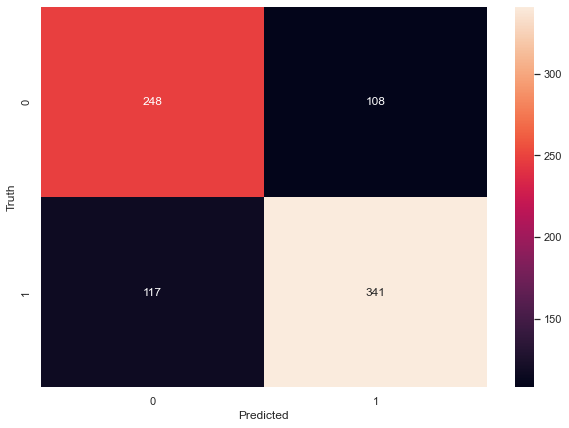

In [1394]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=y1_test,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [1395]:
X1_test=np.reshape(X1_test,(X1_test.shape[0],X1_test.shape[2]))
y1_test=pd.DataFrame(y1_test)
X1_test=pd.DataFrame(X1_test)

In [1396]:
X1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_rnn_6mon.xlsx")
y1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_rnn_6mon.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_rnn_6mon.xlsx")

In [1397]:
df_x=df_feature_scaler[3806:]
df_y=df_label[3806:]
df_x=df_x.to_numpy()
df_y=df_y.to_numpy()
df_x=np.reshape(df_x,(df_x.shape[0],1,df_x.shape[1]))

In [1398]:
yp = model.predict(df_x)
yp[:5]

array([[0.07951758, 0.92048246],
       [0.09140608, 0.90859395],
       [0.19371784, 0.80628216],
       [0.07378538, 0.9262146 ],
       [0.03312419, 0.96687585]], dtype=float32)

In [1399]:
y_pred1 = []
for element in yp:
    if element[1] > element[0]:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [1400]:
y_pred1[:10]

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

In [1401]:
df_y[:10]

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int64)

In [1402]:
y_pred1=pd.DataFrame(y_pred1)
df_x=np.reshape(df_x,(df_x.shape[0],df_x.shape[2]))
df_x=pd.DataFrame(df_x)
df_y=pd.DataFrame(df_y)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_rnn_6mon_test.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_rnn_6mon_test.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_rnn_6mon_test.xlsx")

In [ ]:
# 9 months

In [717]:
df =pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/9 months.csv")
df.head()

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result13
0,ALMONDZ GLOBAL SECURITIES LTD.,ALMONDZ,61581,1.264405e+05,0,0.0,61581,1.264405e+05,2.05,10-01-2015,...,2.93,0.10,-18.00,-8.00,31.00,11.00,3.24,Finance & Investments,PROFIT,PROFIT
1,ATUL LTD.,ATUL,18541,2.410243e+07,0,0.0,18541,2.410243e+07,1299.95,10-01-2015,...,81.13,0.26,306.00,-167.00,-124.00,326.00,19.54,Dyes And Pigments,PROFIT,PROFIT
2,GMR INFRASTRUCTURE LTD.,GMRINFRA,14096100,3.017007e+07,0,0.0,14096100,3.017007e+07,2.14,10-01-2015,...,-5.16,0.02,2915.00,-3159.00,448.00,-2806.00,-2.65,Engineering - Turnkey Services,LOSS,LOSS
3,INDOWIND ENERGY LTD.,INDOWIND,3675498,1.419600e+07,0,0.0,3675498,1.419600e+07,3.86,10-01-2015,...,0.03,0.03,1.88,6.33,-8.58,0.51,145.00,Power Generation And Supply,PROFIT,LOSS
4,JAGRAN PRAKASHAN LTD.,JAGRAN,1043972,1.458429e+08,0,0.0,1043972,1.458429e+08,139.70,10-01-2015,...,9.42,0.22,439.00,-441.00,17.00,418.00,15.26,Entertainment / Electronic Media Software,PROFIT,PROFIT


In [718]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            2
No of shares             0
Value                    0
Avg Price                0
Buy Date                 0
Sell date                0
Buy price                0
Sell price               0
Nifty Index at buying    0
Nfty index at selling    0
Change in Nifty 50       0
Return                   0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Result                   0
Result13                 0
dtype: int64
Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares so

In [719]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result']=df['Result'].map(r)

In [720]:
df['Cap']

0       0
1       0
2       1
3       0
4       0
       ..
3927    0
3928    0
3929    0
3930    1
3931    0
Name: Cap, Length: 3930, dtype: int64

In [721]:
df.drop('Buy Date',1,inplace=True)
df.drop('Sell date',1,inplace=True)
df.drop('Row Labels',1,inplace=True)
#df.drop('Symbol',1,inplace=True)
df.drop('Return',1,inplace=True)
df.drop('Sell price',1,inplace=True)
df.drop('Result13',axis=1,inplace=True)
#df.drop('Nifty Index at buying',axis=1,inplace=True)
#df.drop('Nfty index at selling',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\3209962728.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Buy Date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\3209962728.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Sell date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\3209962728.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Row Labels',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\3209962728.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Return',1,inplace=True)
C:\Users\Anmol Choubey\

In [722]:
df['code']=pd.factorize(df['Symbol'])[0] + 1

In [723]:
df.drop('Symbol',1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\265036371.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Symbol',1,inplace=True)


In [724]:
df_feature = df.drop('Result',axis='columns')
df_label = df['Result']

In [725]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.130340,-0.104660,-0.047655,-0.07972,-0.127341,-0.102724,-0.088595,-0.462558,-0.670799,-0.625330,...,-0.017149,-0.126163,-0.218315,-0.118179,0.144161,-0.004288,-0.163808,-0.082390,-1.174266,-1.409639
1,-0.137344,-0.088224,-0.047655,-0.07972,-0.134451,-0.086269,0.045684,1.947347,-0.670799,-0.625330,...,-0.017177,0.182627,0.720264,-0.045201,0.097982,-0.056017,-0.050900,-0.007642,-1.127962,-1.403525
2,2.153616,-0.084064,-0.047655,-0.07972,2.191031,-0.082105,-0.088586,-0.456210,1.353829,1.120459,...,-0.017135,-0.158108,-0.687605,0.542457,-0.771012,0.134879,-1.173527,-0.109400,-1.081658,-1.397411
3,0.457783,-0.095015,-0.047655,-0.07972,0.469645,-0.093068,-0.088408,-0.470435,-0.670799,-0.625330,...,-0.017178,-0.137614,-0.628944,-0.113701,0.148323,-0.017498,-0.167568,0.567691,-1.035354,-1.391297
4,0.029533,-0.004766,-0.047655,-0.07972,0.034941,-0.002717,-0.074354,-0.257214,-0.670799,-0.625330,...,-0.017178,-0.100536,0.485619,-0.015243,0.018401,-0.008961,-0.017924,-0.027269,-0.989051,-1.385183


In [726]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.130340,-0.104660,-0.047655,-0.07972,-0.127341,-0.102724,-0.088595,-0.462558,-0.670799,-0.625330,...,-0.017149,-0.126163,-0.218315,-0.118179,0.144161,-0.004288,-0.163808,-0.082390,-1.174266,-1.409639
1,-0.137344,-0.088224,-0.047655,-0.07972,-0.134451,-0.086269,0.045684,1.947347,-0.670799,-0.625330,...,-0.017177,0.182627,0.720264,-0.045201,0.097982,-0.056017,-0.050900,-0.007642,-1.127962,-1.403525
2,2.153616,-0.084064,-0.047655,-0.07972,2.191031,-0.082105,-0.088586,-0.456210,1.353829,1.120459,...,-0.017135,-0.158108,-0.687605,0.542457,-0.771012,0.134879,-1.173527,-0.109400,-1.081658,-1.397411
3,0.457783,-0.095015,-0.047655,-0.07972,0.469645,-0.093068,-0.088408,-0.470435,-0.670799,-0.625330,...,-0.017178,-0.137614,-0.628944,-0.113701,0.148323,-0.017498,-0.167568,0.567691,-1.035354,-1.391297
4,0.029533,-0.004766,-0.047655,-0.07972,0.034941,-0.002717,-0.074354,-0.257214,-0.670799,-0.625330,...,-0.017178,-0.100536,0.485619,-0.015243,0.018401,-0.008961,-0.017924,-0.027269,-0.989051,-1.385183


In [727]:
from sklearn.model_selection import train_test_split

X1_big, X1_test, y1_big, y1_test = train_test_split(df_feature_scaler, df_label, test_size=0.2, random_state=27)
#becase the data isn't too much, so I take the validation data from train data
X1_train, X1_val, y1_train, y1_val = train_test_split(X1_big, y1_big, test_size=0.2, random_state=27)

In [728]:
print(X1_big.shape, X1_val.shape, X1_test.shape,X1_train.shape)

(3144, 24) (629, 24) (786, 24) (2515, 24)


In [729]:
import json
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow.keras as keras
import matplotlib.pyplot as plt

In [730]:
print(X1_train.shape, ',', X1_train.ndim, ',', type(X1_train))
print(y1_train.shape, ',', y1_train.ndim, ',', type(y1_train))
print(X1_test.shape, ',', X1_val.ndim, ',', type(X1_val))
print(y1_test.shape, ',', y1_val.ndim, ',', type(y1_val))
#print(data_dim)

(2515, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(2515,) , 1 , <class 'pandas.core.series.Series'>
(786, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(786,) , 1 , <class 'pandas.core.series.Series'>


In [731]:
X1_train=X1_train.to_numpy()
y1_train=y1_train.to_numpy()
X1_test=X1_test.to_numpy()
y1_test=y1_test.to_numpy()
X1_val=X1_val.to_numpy()
y1_val=y1_val.to_numpy()

In [732]:
X1_train=np.reshape(X1_train,(X1_train.shape[0],1,X1_train.shape[1]))
X1_test=np.reshape(X1_test,(X1_test.shape[0],1,X1_test.shape[1]))

In [733]:
X1_val=np.reshape(X1_val,(X1_val.shape[0],1,X1_val.shape[1]))
print(X1_val.shape,X1_test.shape,X1_train.shape)

(629, 1, 24) (786, 1, 24) (2515, 1, 24)


In [734]:
model=keras.Sequential()

#LSTM Layers
model.add(keras.layers.LSTM(units=100,input_shape=(1,24), return_sequences=True))
model.add(keras.layers.LSTM(units=50,dropout=0.05, recurrent_dropout=0.35, return_sequences=False))

#dense layer
model.add(keras.layers.Dense(40, activation='relu'))
model.add(keras.layers.Dropout(0.2))

#output layer
model.add(keras.layers.Dense(2, activation='softmax'))

opti= keras.optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opti, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [735]:
#early_stopping = tf.keras.callbacks.EarlyStopping(patience=5)
history = model.fit(X1_train,y1_train,
          validation_data=(X1_val,y1_val),
          batch_size = 40,
          epochs = 150,
          #callbacks = [early_stopping],
          #validation_data = (val_inputs1, val_targets1),
          verbose = 2
          )

Epoch 1/150
63/63 - 1s - loss: 0.6928 - accuracy: 0.5344 - val_loss: 0.6911 - val_accuracy: 0.5485
Epoch 2/150
63/63 - 0s - loss: 0.6885 - accuracy: 0.5837 - val_loss: 0.6882 - val_accuracy: 0.5246
Epoch 3/150
63/63 - 0s - loss: 0.6835 - accuracy: 0.6258 - val_loss: 0.6833 - val_accuracy: 0.6137
Epoch 4/150
63/63 - 0s - loss: 0.6775 - accuracy: 0.6636 - val_loss: 0.6766 - val_accuracy: 0.7218
Epoch 5/150
63/63 - 0s - loss: 0.6684 - accuracy: 0.7229 - val_loss: 0.6675 - val_accuracy: 0.7440
Epoch 6/150
63/63 - 0s - loss: 0.6565 - accuracy: 0.7467 - val_loss: 0.6549 - val_accuracy: 0.7472
Epoch 7/150
63/63 - 0s - loss: 0.6416 - accuracy: 0.7583 - val_loss: 0.6381 - val_accuracy: 0.7504
Epoch 8/150
63/63 - 0s - loss: 0.6232 - accuracy: 0.7571 - val_loss: 0.6176 - val_accuracy: 0.7615
Epoch 9/150
63/63 - 0s - loss: 0.6015 - accuracy: 0.7686 - val_loss: 0.5967 - val_accuracy: 0.7568
Epoch 10/150
63/63 - 0s - loss: 0.5791 - accuracy: 0.7694 - val_loss: 0.5738 - val_accuracy: 0.7711
Epoch 11/

63/63 - 0s - loss: 0.4463 - accuracy: 0.7996 - val_loss: 0.4983 - val_accuracy: 0.7933
Epoch 84/150
63/63 - 0s - loss: 0.4444 - accuracy: 0.8016 - val_loss: 0.5007 - val_accuracy: 0.7917
Epoch 85/150
63/63 - 0s - loss: 0.4443 - accuracy: 0.8060 - val_loss: 0.5002 - val_accuracy: 0.7933
Epoch 86/150
63/63 - 0s - loss: 0.4445 - accuracy: 0.8028 - val_loss: 0.5005 - val_accuracy: 0.7933
Epoch 87/150
63/63 - 0s - loss: 0.4442 - accuracy: 0.8012 - val_loss: 0.5010 - val_accuracy: 0.7949
Epoch 88/150
63/63 - 0s - loss: 0.4436 - accuracy: 0.8028 - val_loss: 0.5016 - val_accuracy: 0.7965
Epoch 89/150
63/63 - 0s - loss: 0.4458 - accuracy: 0.8024 - val_loss: 0.4993 - val_accuracy: 0.7981
Epoch 90/150
63/63 - 0s - loss: 0.4461 - accuracy: 0.8020 - val_loss: 0.5017 - val_accuracy: 0.7949
Epoch 91/150
63/63 - 0s - loss: 0.4423 - accuracy: 0.8052 - val_loss: 0.5022 - val_accuracy: 0.7965
Epoch 92/150
63/63 - 0s - loss: 0.4400 - accuracy: 0.8080 - val_loss: 0.5012 - val_accuracy: 0.7917
Epoch 93/150


In [736]:
test_loss, test_accuracy = model.evaluate(X1_test, y1_test)
print("Test loss: {0:.2f} and Test accuracy: {1:.2f}% ".format(test_loss,test_accuracy*100))

25/25 [==============================] - 0s 1ms/step - loss: 0.5168 - accuracy: 0.7850
Test loss: 0.52 and Test accuracy: 78.50% 


In [737]:
yp = model.predict(X1_test)
yp[:5]

array([[0.7940164 , 0.20598355],
       [0.59989834, 0.40010157],
       [0.48487186, 0.51512814],
       [0.67972213, 0.32027784],
       [0.06747967, 0.93252033]], dtype=float32)

In [738]:
y_pred=[]
for element in yp:
    if element[0]<element[1]:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [739]:
y_pred=pd.DataFrame(y_pred)

In [740]:
y_pred[:10]

,0
0,0
1,0
2,1
3,0
4,1
5,1
6,1
7,1
8,0
9,1


In [741]:
y1_test[:10]

array([0, 1, 0, 0, 1, 1, 1, 1, 0, 1], dtype=int64)

Text(66.5, 0.5, 'Truth')

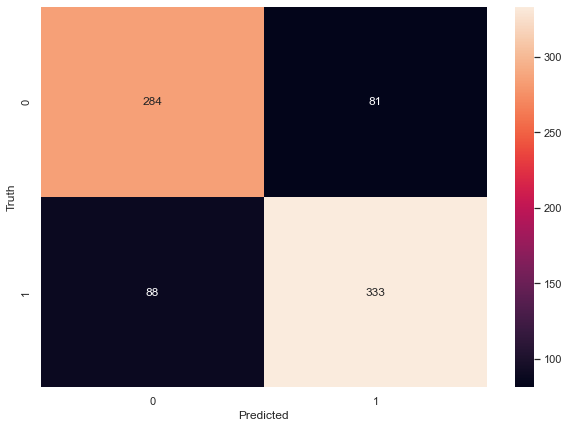

In [742]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=y1_test,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [743]:
X1_test=np.reshape(X1_test,(X1_test.shape[0],X1_test.shape[2]))
y1_test=pd.DataFrame(y1_test)
X1_test=pd.DataFrame(X1_test)

In [744]:
X1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_rnn_9mon.xlsx")
y1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_rnn_9mon.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_rnn_9mon.xlsx")

In [762]:
df_x=df_feature_scaler[3718:]
df_y=df_label[3718:]
df_x=df_x.to_numpy()
df_y=df_y.to_numpy()
df_x=np.reshape(df_x,(df_x.shape[0],1,df_x.shape[1]))

In [763]:
df_x.shape

(212, 1, 24)

In [764]:
yp = model.predict(df_x)
yp[:5]

array([[0.03663879, 0.96336114],
       [0.12413462, 0.8758654 ],
       [0.04461617, 0.9553838 ],
       [0.02660164, 0.9733984 ],
       [0.06409268, 0.93590724]], dtype=float32)

In [765]:
y_pred1 = []
for element in yp:
    if element[1] > element[0]:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [766]:
y_pred1[:10]

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

In [767]:
df_y[:10]

array([0, 0, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int64)

In [768]:
df_x.shape

(212, 1, 24)

In [769]:
y_pred1=pd.DataFrame(y_pred1)
df_x=np.reshape(df_x,(df_x.shape[0],df_x.shape[2]))
df_x=pd.DataFrame(df_x)
df_y=pd.DataFrame(df_y)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_rnn_9mon_test.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_rnn_9mon_test.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_rnn_9mon_test.xlsx")

In [ ]:
# 12 months

In [770]:
df =pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/12_months.csv")
df.head()

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result15
0,ALMONDZ GLOBAL SECURITIES LTD.,ALMONDZ,61581,1.264405e+05,0,0.0,61581,1.264405e+05,2.05,10-01-2015,...,2.93,0.10,-18.00,-8.00,31.00,11.00,3.24,Finance & Investments,PROFIT,PROFIT
1,ATUL LTD.,ATUL,18541,2.410243e+07,0,0.0,18541,2.410243e+07,1299.95,10-01-2015,...,81.13,0.26,306.00,-167.00,-124.00,326.00,19.54,Dyes And Pigments,PROFIT,PROFIT
2,GMR INFRASTRUCTURE LTD.,GMRINFRA,14096100,3.017007e+07,0,0.0,14096100,3.017007e+07,2.14,10-01-2015,...,-5.16,0.02,2915.00,-3159.00,448.00,-2806.00,-2.65,Engineering - Turnkey Services,LOSS,LOSS
3,INDOWIND ENERGY LTD.,INDOWIND,3675498,1.419600e+07,0,0.0,3675498,1.419600e+07,3.86,10-01-2015,...,0.03,0.03,1.88,6.33,-8.58,0.51,145.00,Power Generation And Supply,LOSS,LOSS
4,JAGRAN PRAKASHAN LTD.,JAGRAN,1043972,1.458429e+08,0,0.0,1043972,1.458429e+08,139.70,10-01-2015,...,9.42,0.22,439.00,-441.00,17.00,418.00,15.26,Entertainment / Electronic Media Software,PROFIT,PROFIT


In [771]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            2
No of shares             0
Value                    0
Avg Price                0
Buy Date                 0
Sell date                0
Buy price                0
Sell price               0
Nifty Index at buying    0
Nfty index at selling    0
Change in Nifty 50       0
Return                   0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Result                   0
Result15                 0
dtype: int64
Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares so

In [772]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result']=df['Result'].map(r)

In [773]:
df['Cap']

0       0
1       0
2       1
3       0
4       0
       ..
3797    0
3798    0
3799    0
3800    0
3801    0
Name: Cap, Length: 3800, dtype: int64

In [774]:
df.drop('Buy Date',1,inplace=True)
df.drop('Sell date',1,inplace=True)
df.drop('Row Labels',1,inplace=True)
#df.drop('Symbol',1,inplace=True)
df.drop('Return',1,inplace=True)
df.drop('Sell price',1,inplace=True)
df.drop('Result15',axis=1,inplace=True)
#df.drop('Nifty Index at buying',axis=1,inplace=True)
#df.drop('Nfty index at selling',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\1395991102.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Buy Date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\1395991102.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Sell date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\1395991102.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Row Labels',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\1395991102.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Return',1,inplace=True)
C:\Users\Anmol Choubey\

In [775]:
df['code']=pd.factorize(df['Symbol'])[0] + 1

In [776]:
df.drop('Symbol',1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\265036371.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Symbol',1,inplace=True)


In [777]:
df_feature = df.drop('Result',axis='columns')
df_label = df['Result']

In [778]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.129914,-0.104780,-0.048032,-0.079303,-0.126863,-0.102859,-0.089025,-0.461750,-0.662357,-0.572845,...,-0.017137,-0.126859,-0.226424,-0.115510,0.144622,-0.009644,-0.164139,-0.083690,-1.176468,-1.412928
1,-0.136837,-0.088606,-0.048032,-0.079303,-0.133892,-0.086667,0.043030,1.941249,-0.662357,-0.572845,...,-0.017165,0.176922,0.707855,-0.042332,0.099079,-0.061441,-0.052840,-0.010078,-1.130019,-1.406739
2,2.127667,-0.084513,-0.048032,-0.079303,2.165097,-0.082569,-0.089015,-0.455420,1.413796,1.421866,...,-0.017123,-0.158286,-0.693564,0.546931,-0.757928,0.129707,-1.159471,-0.110290,-1.083570,-1.400550
3,0.451418,-0.095289,-0.048032,-0.079303,0.463321,-0.093357,-0.088840,-0.469605,-0.662357,-0.572845,...,-0.017165,-0.138124,-0.635172,-0.111020,0.148727,-0.022871,-0.167845,0.556506,-1.037121,-1.394361
4,0.028113,-0.006480,-0.048032,-0.079303,0.033570,-0.004447,-0.075019,-0.256994,-0.662357,-0.572845,...,-0.017166,-0.101647,0.474285,-0.012293,0.020597,-0.014322,-0.020333,-0.029407,-0.990672,-1.388172


In [779]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.129914,-0.104780,-0.048032,-0.079303,-0.126863,-0.102859,-0.089025,-0.461750,-0.662357,-0.572845,...,-0.017137,-0.126859,-0.226424,-0.115510,0.144622,-0.009644,-0.164139,-0.083690,-1.176468,-1.412928
1,-0.136837,-0.088606,-0.048032,-0.079303,-0.133892,-0.086667,0.043030,1.941249,-0.662357,-0.572845,...,-0.017165,0.176922,0.707855,-0.042332,0.099079,-0.061441,-0.052840,-0.010078,-1.130019,-1.406739
2,2.127667,-0.084513,-0.048032,-0.079303,2.165097,-0.082569,-0.089015,-0.455420,1.413796,1.421866,...,-0.017123,-0.158286,-0.693564,0.546931,-0.757928,0.129707,-1.159471,-0.110290,-1.083570,-1.400550
3,0.451418,-0.095289,-0.048032,-0.079303,0.463321,-0.093357,-0.088840,-0.469605,-0.662357,-0.572845,...,-0.017165,-0.138124,-0.635172,-0.111020,0.148727,-0.022871,-0.167845,0.556506,-1.037121,-1.394361
4,0.028113,-0.006480,-0.048032,-0.079303,0.033570,-0.004447,-0.075019,-0.256994,-0.662357,-0.572845,...,-0.017166,-0.101647,0.474285,-0.012293,0.020597,-0.014322,-0.020333,-0.029407,-0.990672,-1.388172


In [780]:
from sklearn.model_selection import train_test_split

X1_big, X1_test, y1_big, y1_test = train_test_split(df_feature_scaler, df_label, test_size=0.2, random_state=27)
#becase the data isn't too much, so I take the validation data from train data
X1_train, X1_val, y1_train, y1_val = train_test_split(X1_big, y1_big, test_size=0.2, random_state=27)

In [781]:
print(X1_big.shape, X1_val.shape, X1_test.shape,X1_train.shape)

(3040, 24) (608, 24) (760, 24) (2432, 24)


In [782]:
import json
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow.keras as keras
import matplotlib.pyplot as plt

In [783]:
print(X1_train.shape, ',', X1_train.ndim, ',', type(X1_train))
print(y1_train.shape, ',', y1_train.ndim, ',', type(y1_train))
print(X1_test.shape, ',', X1_val.ndim, ',', type(X1_val))
print(y1_test.shape, ',', y1_val.ndim, ',', type(y1_val))
#print(data_dim)

(2432, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(2432,) , 1 , <class 'pandas.core.series.Series'>
(760, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(760,) , 1 , <class 'pandas.core.series.Series'>


In [784]:
X1_train=X1_train.to_numpy()
y1_train=y1_train.to_numpy()
X1_test=X1_test.to_numpy()
y1_test=y1_test.to_numpy()
X1_val=X1_val.to_numpy()
y1_val=y1_val.to_numpy()

In [785]:
X1_train=np.reshape(X1_train,(X1_train.shape[0],1,X1_train.shape[1]))
X1_test=np.reshape(X1_test,(X1_test.shape[0],1,X1_test.shape[1]))

In [786]:
X1_val=np.reshape(X1_val,(X1_val.shape[0],1,X1_val.shape[1]))
print(X1_val.shape,X1_test.shape,X1_train.shape)

(608, 1, 24) (760, 1, 24) (2432, 1, 24)


In [787]:
model=keras.Sequential()

#LSTM Layers
model.add(keras.layers.LSTM(units=100,input_shape=(1,24), return_sequences=True))
model.add(keras.layers.LSTM(units=50,dropout=0.05, recurrent_dropout=0.35, return_sequences=False))

#dense layer
model.add(keras.layers.Dense(40, activation='relu'))
model.add(keras.layers.Dropout(0.2))

#output layer
model.add(keras.layers.Dense(2, activation='softmax'))

opti= keras.optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opti, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [788]:
#early_stopping = tf.keras.callbacks.EarlyStopping(patience=5)
history = model.fit(X1_train,y1_train,
          validation_data=(X1_val,y1_val),
          batch_size = 40,
          epochs = 150,
          #callbacks = [early_stopping],
          #validation_data = (val_inputs1, val_targets1),
          verbose = 2
          )

Epoch 1/150
61/61 - 1s - loss: 0.6906 - accuracy: 0.5600 - val_loss: 0.6875 - val_accuracy: 0.5658
Epoch 2/150
61/61 - 0s - loss: 0.6860 - accuracy: 0.5596 - val_loss: 0.6818 - val_accuracy: 0.5707
Epoch 3/150
61/61 - 0s - loss: 0.6804 - accuracy: 0.5588 - val_loss: 0.6744 - val_accuracy: 0.5707
Epoch 4/150
61/61 - 0s - loss: 0.6733 - accuracy: 0.5674 - val_loss: 0.6649 - val_accuracy: 0.5905
Epoch 5/150
61/61 - 0s - loss: 0.6623 - accuracy: 0.5966 - val_loss: 0.6515 - val_accuracy: 0.6398
Epoch 6/150
61/61 - 0s - loss: 0.6482 - accuracy: 0.6451 - val_loss: 0.6334 - val_accuracy: 0.7023
Epoch 7/150
61/61 - 0s - loss: 0.6301 - accuracy: 0.6912 - val_loss: 0.6132 - val_accuracy: 0.7286
Epoch 8/150
61/61 - 0s - loss: 0.6087 - accuracy: 0.7076 - val_loss: 0.5907 - val_accuracy: 0.7319
Epoch 9/150
61/61 - 0s - loss: 0.5874 - accuracy: 0.7377 - val_loss: 0.5681 - val_accuracy: 0.7286
Epoch 10/150
61/61 - 0s - loss: 0.5649 - accuracy: 0.7475 - val_loss: 0.5455 - val_accuracy: 0.7401
Epoch 11/

61/61 - 0s - loss: 0.4499 - accuracy: 0.7973 - val_loss: 0.4675 - val_accuracy: 0.7944
Epoch 84/150
61/61 - 0s - loss: 0.4480 - accuracy: 0.7936 - val_loss: 0.4678 - val_accuracy: 0.7961
Epoch 85/150
61/61 - 0s - loss: 0.4482 - accuracy: 0.7952 - val_loss: 0.4692 - val_accuracy: 0.7928
Epoch 86/150
61/61 - 0s - loss: 0.4502 - accuracy: 0.7940 - val_loss: 0.4707 - val_accuracy: 0.7928
Epoch 87/150
61/61 - 0s - loss: 0.4482 - accuracy: 0.7948 - val_loss: 0.4674 - val_accuracy: 0.7944
Epoch 88/150
61/61 - 0s - loss: 0.4499 - accuracy: 0.7969 - val_loss: 0.4672 - val_accuracy: 0.7961
Epoch 89/150
61/61 - 0s - loss: 0.4474 - accuracy: 0.7965 - val_loss: 0.4706 - val_accuracy: 0.7928
Epoch 90/150
61/61 - 0s - loss: 0.4438 - accuracy: 0.7956 - val_loss: 0.4714 - val_accuracy: 0.7911
Epoch 91/150
61/61 - 0s - loss: 0.4438 - accuracy: 0.7998 - val_loss: 0.4703 - val_accuracy: 0.7911
Epoch 92/150
61/61 - 0s - loss: 0.4467 - accuracy: 0.7952 - val_loss: 0.4719 - val_accuracy: 0.7895
Epoch 93/150


In [789]:
test_loss, test_accuracy = model.evaluate(X1_test, y1_test)
print("Test loss: {0:.2f} and Test accuracy: {1:.2f}% ".format(test_loss,test_accuracy*100))

24/24 [==============================] - 0s 2ms/step - loss: 0.5238 - accuracy: 0.7711
Test loss: 0.52 and Test accuracy: 77.11% 


In [790]:
yp = model.predict(X1_test)
yp[:5]

array([[0.45157123, 0.54842883],
       [0.71078694, 0.28921306],
       [0.08380716, 0.91619277],
       [0.89076835, 0.10923166],
       [0.02416527, 0.9758347 ]], dtype=float32)

In [791]:
y_pred=[]
for element in yp:
    if element[0]<element[1]:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [792]:
y_pred=pd.DataFrame(y_pred)

In [793]:
y_pred[:10]

,0
0,1
1,0
2,1
3,0
4,1
5,0
6,0
7,1
8,0
9,1


In [794]:
y1_test[:10]

array([1, 0, 1, 1, 1, 1, 0, 1, 0, 1], dtype=int64)

Text(66.5, 0.5, 'Truth')

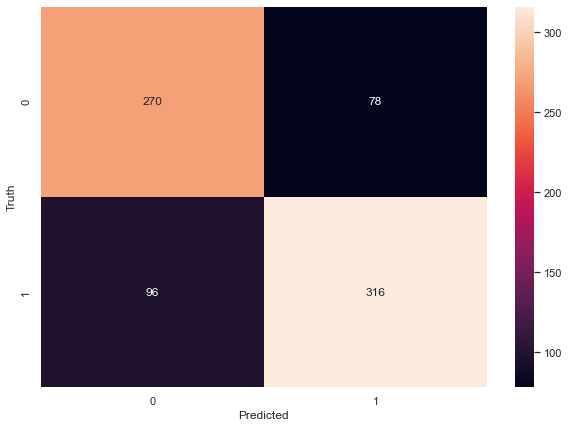

In [795]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=y1_test,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [796]:
X1_test=np.reshape(X1_test,(X1_test.shape[0],X1_test.shape[2]))
y1_test=pd.DataFrame(y1_test)
X1_test=pd.DataFrame(X1_test)

In [797]:
X1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_rnn_12mon.xlsx")
y1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_rnn_12mon.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_rnn_12mon.xlsx")

In [810]:
df_x=df_feature_scaler[3508:]
df_y=df_label[3508:]
df_x=df_x.to_numpy()
df_y=df_y.to_numpy()
df_x=np.reshape(df_x,(df_x.shape[0],1,df_x.shape[1]))

In [811]:
yp = model.predict(df_x)
yp[:5]

array([[2.7056774e-02, 9.7294331e-01],
       [2.1933319e-02, 9.7806668e-01],
       [2.7257670e-02, 9.7274232e-01],
       [2.8229554e-04, 9.9971765e-01],
       [1.4914766e-01, 8.5085237e-01]], dtype=float32)

In [812]:
y_pred1 = []
for element in yp:
    if element[1] > element[0]:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [813]:
y_pred1[:10]

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

In [814]:
df_y[:10]

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int64)

In [815]:
y_pred1=pd.DataFrame(y_pred1)
df_x=np.reshape(df_x,(df_x.shape[0],df_x.shape[2]))
df_x=pd.DataFrame(df_x)
df_y=pd.DataFrame(df_y)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_rnn_12mon_test.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_rnn_12mon_test.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_rnn_12mon_test.xlsx")

In [816]:
# 2 months 5%

In [817]:
df =pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/2 month.csv")
df.head()

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result5
0,ALMONDZ GLOBAL SECURITIES LTD.,ALMONDZ,61581,1.264405e+05,0,0.0,61581,1.264405e+05,2.05,10-01-2015,...,2.93,0.10,-18.00,-8.00,31.00,11.00,3.24,Finance & Investments,PROFIT,PROFIT
1,ATUL LTD.,ATUL,18541,2.410243e+07,0,0.0,18541,2.410243e+07,1299.95,10-01-2015,...,81.13,0.26,306.00,-167.00,-124.00,326.00,19.54,Dyes And Pigments,PROFIT,LOSS
2,GMR INFRASTRUCTURE LTD.,GMRINFRA,14096100,3.017007e+07,0,0.0,14096100,3.017007e+07,2.14,10-01-2015,...,-5.16,0.02,2915.00,-3159.00,448.00,-2806.00,-2.65,Engineering - Turnkey Services,PROFIT,PROFIT
3,INDOWIND ENERGY LTD.,INDOWIND,3675498,1.419600e+07,0,0.0,3675498,1.419600e+07,3.86,10-01-2015,...,0.03,0.03,1.88,6.33,-8.58,0.51,145.00,Power Generation And Supply,PROFIT,PROFIT
4,JAGRAN PRAKASHAN LTD.,JAGRAN,1043972,1.458429e+08,0,0.0,1043972,1.458429e+08,139.70,10-01-2015,...,9.42,0.22,439.00,-441.00,17.00,418.00,15.26,Entertainment / Electronic Media Software,PROFIT,PROFIT


In [818]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            0
No of shares             0
Value                    0
Avg Price                0
Buy Date                 0
Sell date                0
Buy price                0
Sell price               0
Nifty Index at buying    0
Nfty index at selling    0
Change in Nifty 50       0
Return                   0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Result                   0
Result5                  0
dtype: int64
Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares so

In [819]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result5']=df['Result5'].map(r)

In [820]:
df['Cap']

0       0
1       0
2       1
3       0
4       0
       ..
4236    0
4237    0
4238    0
4239    0
4240    0
Name: Cap, Length: 4241, dtype: int64

In [821]:
df.drop('Buy Date',1,inplace=True)
df.drop('Sell date',1,inplace=True)
df.drop('Row Labels',1,inplace=True)
#df.drop('Symbol',1,inplace=True)
df.drop('Return',1,inplace=True)
df.drop('Sell price',1,inplace=True)
df.drop('Result',axis=1,inplace=True)
#df.drop('Nifty Index at buying',axis=1,inplace=True)
#df.drop('Nfty index at selling',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Buy Date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Sell date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Row Labels',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Return',1,inplace=True)
C:\Users\Anmol Choubey\AppD

In [822]:
df['code']=pd.factorize(df['Symbol'])[0] + 1

In [823]:
df.drop('Symbol',1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\265036371.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Symbol',1,inplace=True)


In [824]:
df_feature = df.drop('Result5',axis='columns')
df_label = df['Result5']

In [825]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.129067,-0.107008,-0.047593,-0.082351,-0.126057,-0.105010,-0.092596,-0.444790,-0.700391,-0.655708,...,-0.028060,-0.058507,-0.220014,-0.130812,0.148124,0.015864,-0.173498,-0.087246,-1.174670,-1.400415
1,-0.136307,-0.091216,-0.047593,-0.082351,-0.133405,-0.089202,0.045594,1.640970,-0.700391,-0.655708,...,-0.028065,0.001528,0.739882,-0.059730,0.101365,-0.034456,-0.061655,-0.010550,-1.128896,-1.394445
2,2.231717,-0.087220,-0.047593,-0.082351,2.269995,-0.085202,-0.092586,-0.439296,1.112107,1.086441,...,-0.028058,-0.064718,-0.699962,0.512658,-0.778526,0.151242,-1.173701,-0.114960,-1.083121,-1.388474
3,0.478839,-0.097741,-0.047593,-0.082351,0.490931,-0.095734,-0.092403,-0.451608,-0.700391,-0.655708,...,-0.028066,-0.060733,-0.639968,-0.126450,0.152338,0.003015,-0.177223,0.579773,-1.037347,-1.382503
4,0.036183,-0.011034,-0.047593,-0.082351,0.041662,-0.008938,-0.077940,-0.267066,-0.700391,-0.655708,...,-0.028066,-0.053524,0.499908,-0.030551,0.020787,0.011319,-0.028989,-0.030688,-0.991572,-1.376533


In [826]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.129067,-0.107008,-0.047593,-0.082351,-0.126057,-0.105010,-0.092596,-0.444790,-0.700391,-0.655708,...,-0.028060,-0.058507,-0.220014,-0.130812,0.148124,0.015864,-0.173498,-0.087246,-1.174670,-1.400415
1,-0.136307,-0.091216,-0.047593,-0.082351,-0.133405,-0.089202,0.045594,1.640970,-0.700391,-0.655708,...,-0.028065,0.001528,0.739882,-0.059730,0.101365,-0.034456,-0.061655,-0.010550,-1.128896,-1.394445
2,2.231717,-0.087220,-0.047593,-0.082351,2.269995,-0.085202,-0.092586,-0.439296,1.112107,1.086441,...,-0.028058,-0.064718,-0.699962,0.512658,-0.778526,0.151242,-1.173701,-0.114960,-1.083121,-1.388474
3,0.478839,-0.097741,-0.047593,-0.082351,0.490931,-0.095734,-0.092403,-0.451608,-0.700391,-0.655708,...,-0.028066,-0.060733,-0.639968,-0.126450,0.152338,0.003015,-0.177223,0.579773,-1.037347,-1.382503
4,0.036183,-0.011034,-0.047593,-0.082351,0.041662,-0.008938,-0.077940,-0.267066,-0.700391,-0.655708,...,-0.028066,-0.053524,0.499908,-0.030551,0.020787,0.011319,-0.028989,-0.030688,-0.991572,-1.376533


In [827]:
from sklearn.model_selection import train_test_split

X1_big, X1_test, y1_big, y1_test = train_test_split(df_feature_scaler, df_label, test_size=0.2, random_state=27)
#becase the data isn't too much, so I take the validation data from train data
X1_train, X1_val, y1_train, y1_val = train_test_split(X1_big, y1_big, test_size=0.2, random_state=27)

In [828]:
print(X1_big.shape, X1_val.shape, X1_test.shape,X1_train.shape)

(3392, 24) (679, 24) (849, 24) (2713, 24)


In [829]:
import json
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow.keras as keras
import matplotlib.pyplot as plt

In [830]:
print(X1_train.shape, ',', X1_train.ndim, ',', type(X1_train))
print(y1_train.shape, ',', y1_train.ndim, ',', type(y1_train))
print(X1_test.shape, ',', X1_val.ndim, ',', type(X1_val))
print(y1_test.shape, ',', y1_val.ndim, ',', type(y1_val))
#print(data_dim)

(2713, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(2713,) , 1 , <class 'pandas.core.series.Series'>
(849, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(849,) , 1 , <class 'pandas.core.series.Series'>


In [831]:
X1_train=X1_train.to_numpy()
y1_train=y1_train.to_numpy()
X1_test=X1_test.to_numpy()
y1_test=y1_test.to_numpy()
X1_val=X1_val.to_numpy()
y1_val=y1_val.to_numpy()

In [832]:
X1_train=np.reshape(X1_train,(X1_train.shape[0],1,X1_train.shape[1]))
X1_test=np.reshape(X1_test,(X1_test.shape[0],1,X1_test.shape[1]))

In [833]:
X1_val=np.reshape(X1_val,(X1_val.shape[0],1,X1_val.shape[1]))
print(X1_val.shape,X1_test.shape,X1_train.shape)

(679, 1, 24) (849, 1, 24) (2713, 1, 24)


In [834]:
model=keras.Sequential()

#LSTM Layers
model.add(keras.layers.LSTM(units=100,input_shape=(1,24), return_sequences=True))
model.add(keras.layers.LSTM(units=50,dropout=0.05, recurrent_dropout=0.35, return_sequences=False))

#dense layer
model.add(keras.layers.Dense(40, activation='relu'))
model.add(keras.layers.Dropout(0.2))

#output layer
model.add(keras.layers.Dense(2, activation='softmax'))

opti= keras.optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opti, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [835]:
#early_stopping = tf.keras.callbacks.EarlyStopping(patience=5)
history = model.fit(X1_train,y1_train,
          validation_data=(X1_val,y1_val),
          batch_size = 40,
          epochs = 150,
          #callbacks = [early_stopping],
          #validation_data = (val_inputs1, val_targets1),
          verbose = 2
          )

Epoch 1/150
68/68 - 1s - loss: 0.6930 - accuracy: 0.5267 - val_loss: 0.6922 - val_accuracy: 0.5258
Epoch 2/150
68/68 - 0s - loss: 0.6902 - accuracy: 0.5673 - val_loss: 0.6901 - val_accuracy: 0.5626
Epoch 3/150
68/68 - 0s - loss: 0.6883 - accuracy: 0.5691 - val_loss: 0.6884 - val_accuracy: 0.5670
Epoch 4/150
68/68 - 0s - loss: 0.6860 - accuracy: 0.5728 - val_loss: 0.6870 - val_accuracy: 0.5700
Epoch 5/150
68/68 - 0s - loss: 0.6847 - accuracy: 0.5732 - val_loss: 0.6859 - val_accuracy: 0.5685
Epoch 6/150
68/68 - 0s - loss: 0.6831 - accuracy: 0.5739 - val_loss: 0.6851 - val_accuracy: 0.5685
Epoch 7/150
68/68 - 0s - loss: 0.6820 - accuracy: 0.5750 - val_loss: 0.6844 - val_accuracy: 0.5670
Epoch 8/150
68/68 - 0s - loss: 0.6807 - accuracy: 0.5746 - val_loss: 0.6839 - val_accuracy: 0.5670
Epoch 9/150
68/68 - 0s - loss: 0.6797 - accuracy: 0.5750 - val_loss: 0.6835 - val_accuracy: 0.5685
Epoch 10/150
68/68 - 0s - loss: 0.6786 - accuracy: 0.5746 - val_loss: 0.6831 - val_accuracy: 0.5685
Epoch 11/

68/68 - 0s - loss: 0.5464 - accuracy: 0.7118 - val_loss: 0.5957 - val_accuracy: 0.7069
Epoch 84/150
68/68 - 0s - loss: 0.5483 - accuracy: 0.7103 - val_loss: 0.5955 - val_accuracy: 0.7084
Epoch 85/150
68/68 - 0s - loss: 0.5487 - accuracy: 0.7110 - val_loss: 0.5957 - val_accuracy: 0.7099
Epoch 86/150
68/68 - 0s - loss: 0.5524 - accuracy: 0.7129 - val_loss: 0.5965 - val_accuracy: 0.7084
Epoch 87/150
68/68 - 0s - loss: 0.5457 - accuracy: 0.7154 - val_loss: 0.5975 - val_accuracy: 0.7099
Epoch 88/150
68/68 - 0s - loss: 0.5476 - accuracy: 0.7125 - val_loss: 0.5961 - val_accuracy: 0.7054
Epoch 89/150
68/68 - 0s - loss: 0.5455 - accuracy: 0.7125 - val_loss: 0.5982 - val_accuracy: 0.7040
Epoch 90/150
68/68 - 0s - loss: 0.5474 - accuracy: 0.7143 - val_loss: 0.5987 - val_accuracy: 0.7069
Epoch 91/150
68/68 - 0s - loss: 0.5512 - accuracy: 0.7084 - val_loss: 0.5983 - val_accuracy: 0.7025
Epoch 92/150
68/68 - 0s - loss: 0.5452 - accuracy: 0.7169 - val_loss: 0.5984 - val_accuracy: 0.7054
Epoch 93/150


In [836]:
test_loss, test_accuracy = model.evaluate(X1_test, y1_test)
print("Test loss: {0:.2f} and Test accuracy: {1:.2f}% ".format(test_loss,test_accuracy*100))

27/27 [==============================] - 0s 12ms/step - loss: 0.6180 - accuracy: 0.6761
Test loss: 0.62 and Test accuracy: 67.61% 


In [837]:
yp = model.predict(X1_test)
yp[:5]

array([[0.9199843 , 0.08001567],
       [0.85362095, 0.14637905],
       [0.77939016, 0.22060989],
       [0.32437626, 0.6756238 ],
       [0.93184006, 0.06815992]], dtype=float32)

In [838]:
y_pred=[]
for element in yp:
    if element[0]<element[1]:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [839]:
y_pred=pd.DataFrame(y_pred)

In [840]:
y_pred[:10]

,0
0,0
1,0
2,0
3,1
4,0
5,0
6,0
7,0
8,0
9,0


In [841]:
y1_test[:10]

array([0, 0, 1, 1, 0, 0, 0, 0, 0, 0], dtype=int64)

Text(66.5, 0.5, 'Truth')

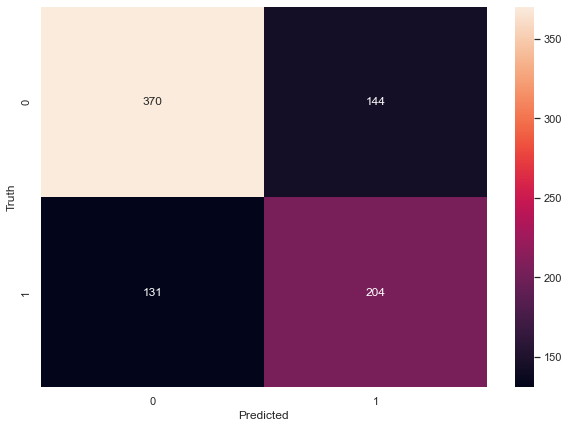

In [842]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=y1_test,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [843]:
X1_test=np.reshape(X1_test,(X1_test.shape[0],X1_test.shape[2]))
y1_test=pd.DataFrame(y1_test)
X1_test=pd.DataFrame(X1_test)

In [844]:
X1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_rnn_2mon_5.xlsx")
y1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_rnn_2mon_5.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_rnn_2mon_5.xlsx")

In [845]:
df_x=df_feature_scaler[3990:]
df_y=df_label[3990:]
df_x=df_x.to_numpy()
df_y=df_y.to_numpy()
df_x=np.reshape(df_x,(df_x.shape[0],1,df_x.shape[1]))


In [846]:
yp = model.predict(df_x)
yp[:5]

array([[6.8824965e-01, 3.1175044e-01],
       [3.0731384e-04, 9.9969268e-01],
       [5.4333979e-01, 4.5666021e-01],
       [2.6090831e-01, 7.3909169e-01],
       [4.8755944e-01, 5.1244062e-01]], dtype=float32)

In [847]:
y_pred1 = []
for element in yp:
    if element[1] > element[0]:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [848]:
y_pred1[:10]

[0, 1, 0, 1, 1, 1, 1, 0, 0, 1]

In [849]:
df_y[:10]

array([1, 1, 0, 1, 1, 1, 0, 0, 0, 1], dtype=int64)

In [850]:
y_pred1=pd.DataFrame(y_pred1)
df_x=np.reshape(df_x,(df_x.shape[0],df_x.shape[2]))
df_x=pd.DataFrame(df_x)
df_y=pd.DataFrame(df_y)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_rnn_2mon_test_5.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_rnn_2mon_test_5.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_rnn_2mon_test_5.xlsx")

In [851]:
# 6 months 10%

In [852]:
df =pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/6 months.csv")
df.head()

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result10
0,ALMONDZ GLOBAL SECURITIES LTD.,ALMONDZ,61581,1.264405e+05,0,0.0,61581,1.264405e+05,2.05,10-01-2015,...,2.93,0.1000,-18.00,-8.00,31.00,11.00,3.24,Finance & Investments,LOSS,LOSS
1,ATUL LTD.,ATUL,18541,2.410243e+07,0,0.0,18541,2.410243e+07,1299.95,10-01-2015,...,81.13,0.2600,306.00,-167.00,-124.00,326.00,19.54,Dyes And Pigments,LOSS,LOSS
2,GMR INFRASTRUCTURE LTD.,GMRINFRA,14096100,3.017007e+07,0,0.0,14096100,3.017007e+07,2.14,10-01-2015,...,-5.16,0.0200,2915.00,-3159.00,448.00,-2806.00,-2.65,Engineering - Turnkey Services,LOSS,LOSS
3,INDOWIND ENERGY LTD.,INDOWIND,3675498,1.419600e+07,0,0.0,3675498,1.419600e+07,3.86,10-01-2015,...,0.03,0.0269,1.88,6.33,-8.58,0.51,145.00,Power Generation And Supply,LOSS,LOSS
4,JAGRAN PRAKASHAN LTD.,JAGRAN,1043972,1.458429e+08,0,0.0,1043972,1.458429e+08,139.70,10-01-2015,...,9.42,0.2200,439.00,-441.00,17.00,418.00,15.26,Entertainment / Electronic Media Software,PROFIT,PROFIT


In [853]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            2
No of shares             0
Value                    0
Avg Price                0
Buy Date                 0
Sell date                0
Buy price                0
Sell price               0
Nifty Index at buying    0
Nfty index at selling    0
Change in Nifty 50       0
Return                   0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Result                   0
Result10                 0
dtype: int64
Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares so

In [854]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result10']=df['Result10'].map(r)

In [855]:
df['Cap']

0       0
1       0
2       1
3       0
4       0
       ..
4066    2
4067    0
4068    0
4069    0
4070    1
Name: Cap, Length: 4069, dtype: int64

In [856]:
df.drop('Buy Date',1,inplace=True)
df.drop('Sell date',1,inplace=True)
df.drop('Row Labels',1,inplace=True)
#df.drop('Symbol',1,inplace=True)
df.drop('Return',1,inplace=True)
df.drop('Sell price',1,inplace=True)
df.drop('Result',axis=1,inplace=True)
#df.drop('Nifty Index at buying',axis=1,inplace=True)
#df.drop('Nfty index at selling',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Buy Date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Sell date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Row Labels',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Return',1,inplace=True)
C:\Users\Anmol Choubey\AppD

In [857]:
df['code']=pd.factorize(df['Symbol'])[0] + 1

In [858]:
df.drop('Symbol',1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\265036371.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Symbol',1,inplace=True)


In [859]:
df_feature = df.drop('Result10',axis='columns')
df_label = df['Result10']

In [860]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.133236,-0.106103,-0.047801,-0.081043,-0.130212,-0.104125,-0.090731,-0.455363,-0.681147,-0.814616,...,-0.021631,-0.065135,-0.219695,-0.122020,0.146417,0.000484,-0.170855,-0.085491,-1.173138,-1.406195
1,-0.140797,-0.090406,-0.047801,-0.081043,-0.137901,-0.088412,0.044707,1.829228,-0.681147,-0.814616,...,-0.021644,0.057697,0.728894,-0.049158,0.100029,-0.051379,-0.055526,-0.009718,-1.127087,-1.400179
2,2.332115,-0.086434,-0.047801,-0.081043,2.377162,-0.084435,-0.090721,-0.449345,1.239044,0.923055,...,-0.021625,-0.077842,-0.693990,0.537563,-0.772881,0.140014,-1.202220,-0.112871,-1.081036,-1.394163
3,0.501596,-0.096892,-0.047801,-0.081043,0.515442,-0.094904,-0.090542,-0.462831,-0.681147,-0.814616,...,-0.021645,-0.069690,-0.653082,-0.117549,0.150598,-0.012759,-0.174695,0.573498,-1.034984,-1.388146
4,0.039334,-0.010704,-0.047801,-0.081043,0.045300,-0.008627,-0.076367,-0.260697,-0.681147,-0.814616,...,-0.021645,-0.054941,0.491747,-0.019248,0.020090,-0.004200,-0.021843,-0.029615,-0.988933,-1.382130


In [861]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.133236,-0.106103,-0.047801,-0.081043,-0.130212,-0.104125,-0.090731,-0.455363,-0.681147,-0.814616,...,-0.021631,-0.065135,-0.219695,-0.122020,0.146417,0.000484,-0.170855,-0.085491,-1.173138,-1.406195
1,-0.140797,-0.090406,-0.047801,-0.081043,-0.137901,-0.088412,0.044707,1.829228,-0.681147,-0.814616,...,-0.021644,0.057697,0.728894,-0.049158,0.100029,-0.051379,-0.055526,-0.009718,-1.127087,-1.400179
2,2.332115,-0.086434,-0.047801,-0.081043,2.377162,-0.084435,-0.090721,-0.449345,1.239044,0.923055,...,-0.021625,-0.077842,-0.693990,0.537563,-0.772881,0.140014,-1.202220,-0.112871,-1.081036,-1.394163
3,0.501596,-0.096892,-0.047801,-0.081043,0.515442,-0.094904,-0.090542,-0.462831,-0.681147,-0.814616,...,-0.021645,-0.069690,-0.653082,-0.117549,0.150598,-0.012759,-0.174695,0.573498,-1.034984,-1.388146
4,0.039334,-0.010704,-0.047801,-0.081043,0.045300,-0.008627,-0.076367,-0.260697,-0.681147,-0.814616,...,-0.021645,-0.054941,0.491747,-0.019248,0.020090,-0.004200,-0.021843,-0.029615,-0.988933,-1.382130


In [862]:
from sklearn.model_selection import train_test_split

X1_big, X1_test, y1_big, y1_test = train_test_split(df_feature_scaler, df_label, test_size=0.2, random_state=27)
#becase the data isn't too much, so I take the validation data from train data
X1_train, X1_val, y1_train, y1_val = train_test_split(X1_big, y1_big, test_size=0.2, random_state=27)

In [863]:
print(X1_big.shape, X1_val.shape, X1_test.shape,X1_train.shape)

(3255, 24) (651, 24) (814, 24) (2604, 24)


In [864]:
import json
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow.keras as keras
import matplotlib.pyplot as plt

In [865]:
print(X1_train.shape, ',', X1_train.ndim, ',', type(X1_train))
print(y1_train.shape, ',', y1_train.ndim, ',', type(y1_train))
print(X1_test.shape, ',', X1_val.ndim, ',', type(X1_val))
print(y1_test.shape, ',', y1_val.ndim, ',', type(y1_val))
#print(data_dim)

(2604, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(2604,) , 1 , <class 'pandas.core.series.Series'>
(814, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(814,) , 1 , <class 'pandas.core.series.Series'>


In [866]:
X1_train=X1_train.to_numpy()
y1_train=y1_train.to_numpy()
X1_test=X1_test.to_numpy()
y1_test=y1_test.to_numpy()
X1_val=X1_val.to_numpy()
y1_val=y1_val.to_numpy()

In [867]:
X1_train=np.reshape(X1_train,(X1_train.shape[0],1,X1_train.shape[1]))
X1_test=np.reshape(X1_test,(X1_test.shape[0],1,X1_test.shape[1]))

In [868]:
X1_val=np.reshape(X1_val,(X1_val.shape[0],1,X1_val.shape[1]))
print(X1_val.shape,X1_test.shape,X1_train.shape)

(651, 1, 24) (814, 1, 24) (2604, 1, 24)


In [869]:
model=keras.Sequential()

#LSTM Layers
model.add(keras.layers.LSTM(units=100,input_shape=(1,24), return_sequences=True))
model.add(keras.layers.LSTM(units=50,dropout=0.05, recurrent_dropout=0.35, return_sequences=False))

#dense layer
model.add(keras.layers.Dense(40, activation='relu'))
model.add(keras.layers.Dropout(0.2))

#output layer
model.add(keras.layers.Dense(2, activation='softmax'))

opti= keras.optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opti, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [870]:
#early_stopping = tf.keras.callbacks.EarlyStopping(patience=5)
history = model.fit(X1_train,y1_train,
          validation_data=(X1_val,y1_val),
          batch_size = 40,
          epochs = 150,
          #callbacks = [early_stopping],
          #validation_data = (val_inputs1, val_targets1),
          verbose = 2
          )

Epoch 1/150
66/66 - 1s - loss: 0.6915 - accuracy: 0.5553 - val_loss: 0.6893 - val_accuracy: 0.5714
Epoch 2/150
66/66 - 0s - loss: 0.6878 - accuracy: 0.5691 - val_loss: 0.6854 - val_accuracy: 0.5668
Epoch 3/150
66/66 - 0s - loss: 0.6845 - accuracy: 0.5691 - val_loss: 0.6822 - val_accuracy: 0.5653
Epoch 4/150
66/66 - 0s - loss: 0.6807 - accuracy: 0.5695 - val_loss: 0.6788 - val_accuracy: 0.5637
Epoch 5/150
66/66 - 0s - loss: 0.6762 - accuracy: 0.5710 - val_loss: 0.6747 - val_accuracy: 0.5637
Epoch 6/150
66/66 - 0s - loss: 0.6712 - accuracy: 0.5714 - val_loss: 0.6703 - val_accuracy: 0.5668
Epoch 7/150
66/66 - 0s - loss: 0.6650 - accuracy: 0.5757 - val_loss: 0.6644 - val_accuracy: 0.5714
Epoch 8/150
66/66 - 0s - loss: 0.6564 - accuracy: 0.5829 - val_loss: 0.6573 - val_accuracy: 0.5853
Epoch 9/150
66/66 - 0s - loss: 0.6469 - accuracy: 0.5949 - val_loss: 0.6478 - val_accuracy: 0.5929
Epoch 10/150
66/66 - 0s - loss: 0.6344 - accuracy: 0.6233 - val_loss: 0.6357 - val_accuracy: 0.6175
Epoch 11/

66/66 - 0s - loss: 0.4679 - accuracy: 0.7930 - val_loss: 0.5370 - val_accuracy: 0.7680
Epoch 84/150
66/66 - 0s - loss: 0.4665 - accuracy: 0.7888 - val_loss: 0.5376 - val_accuracy: 0.7665
Epoch 85/150
66/66 - 0s - loss: 0.4679 - accuracy: 0.7907 - val_loss: 0.5376 - val_accuracy: 0.7680
Epoch 86/150
66/66 - 0s - loss: 0.4651 - accuracy: 0.7949 - val_loss: 0.5370 - val_accuracy: 0.7680
Epoch 87/150
66/66 - 0s - loss: 0.4633 - accuracy: 0.7949 - val_loss: 0.5366 - val_accuracy: 0.7665
Epoch 88/150
66/66 - 0s - loss: 0.4664 - accuracy: 0.7926 - val_loss: 0.5372 - val_accuracy: 0.7619
Epoch 89/150
66/66 - 0s - loss: 0.4657 - accuracy: 0.7945 - val_loss: 0.5392 - val_accuracy: 0.7588
Epoch 90/150
66/66 - 0s - loss: 0.4638 - accuracy: 0.7942 - val_loss: 0.5382 - val_accuracy: 0.7604
Epoch 91/150
66/66 - 0s - loss: 0.4692 - accuracy: 0.7899 - val_loss: 0.5384 - val_accuracy: 0.7665
Epoch 92/150
66/66 - 0s - loss: 0.4653 - accuracy: 0.7919 - val_loss: 0.5369 - val_accuracy: 0.7634
Epoch 93/150


In [871]:
test_loss, test_accuracy = model.evaluate(X1_test, y1_test)
print("Test loss: {0:.2f} and Test accuracy: {1:.2f}% ".format(test_loss,test_accuracy*100))

26/26 [==============================] - 0s 1ms/step - loss: 0.5716 - accuracy: 0.7383
Test loss: 0.57 and Test accuracy: 73.83% 


In [872]:
yp = model.predict(X1_test)
yp[:5]

array([[0.8671676 , 0.13283242],
       [0.27050054, 0.72949946],
       [0.92789274, 0.07210719],
       [0.34137136, 0.65862864],
       [0.33924994, 0.6607501 ]], dtype=float32)

In [873]:
y_pred=[]
for element in yp:
    if element[0]<element[1]:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [874]:
y_pred=pd.DataFrame(y_pred)

In [875]:
y_pred[:10]

,0
0,0
1,1
2,0
3,1
4,1
5,1
6,1
7,0
8,1
9,0


In [876]:
y1_test[:10]

array([0, 0, 0, 1, 0, 0, 1, 0, 1, 0], dtype=int64)

Text(66.5, 0.5, 'Truth')

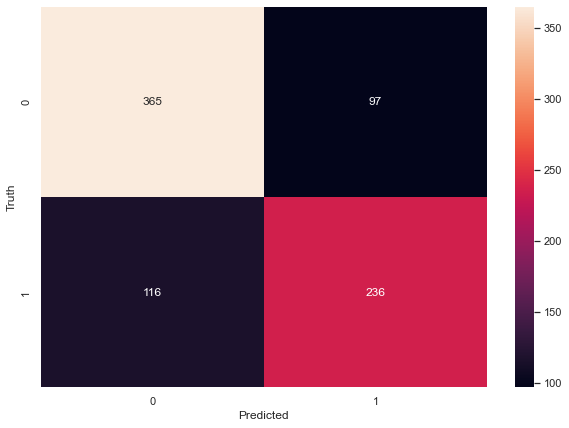

In [877]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=y1_test,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [878]:
X1_test=np.reshape(X1_test,(X1_test.shape[0],X1_test.shape[2]))
y1_test=pd.DataFrame(y1_test)
X1_test=pd.DataFrame(X1_test)

In [879]:
X1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_rnn_6mon_10.xlsx")
y1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_rnn_6mon_10.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_rnn_6mon_10.xlsx")

In [880]:
df_x=df_feature_scaler[3806:]
df_y=df_label[3806:]
df_x=df_x.to_numpy()
df_y=df_y.to_numpy()
df_x=np.reshape(df_x,(df_x.shape[0],1,df_x.shape[1]))


In [881]:
yp = model.predict(df_x)
yp[:5]

array([[0.16677858, 0.8332214 ],
       [0.16543305, 0.83456695],
       [0.4083774 , 0.59162253],
       [0.15096289, 0.8490371 ],
       [0.09309889, 0.90690106]], dtype=float32)

In [882]:
y_pred1 = []
for element in yp:
    if element[1] > element[0]:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [883]:
y_pred1[:10]

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

In [884]:
df_y[:10]

array([1, 1, 0, 0, 1, 1, 1, 1, 1, 1], dtype=int64)

In [885]:
y_pred1=pd.DataFrame(y_pred1)
df_x=np.reshape(df_x,(df_x.shape[0],df_x.shape[2]))
df_x=pd.DataFrame(df_x)
df_y=pd.DataFrame(df_y)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_rnn_6mon_test_10.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_rnn_6mon_test_10.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_rnn_6mon_test_10.xlsx")

In [886]:
# 9 months 13%

In [887]:
df =pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/9 months.csv")
df.head()

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result13
0,ALMONDZ GLOBAL SECURITIES LTD.,ALMONDZ,61581,1.264405e+05,0,0.0,61581,1.264405e+05,2.05,10-01-2015,...,2.93,0.10,-18.00,-8.00,31.00,11.00,3.24,Finance & Investments,PROFIT,PROFIT
1,ATUL LTD.,ATUL,18541,2.410243e+07,0,0.0,18541,2.410243e+07,1299.95,10-01-2015,...,81.13,0.26,306.00,-167.00,-124.00,326.00,19.54,Dyes And Pigments,PROFIT,PROFIT
2,GMR INFRASTRUCTURE LTD.,GMRINFRA,14096100,3.017007e+07,0,0.0,14096100,3.017007e+07,2.14,10-01-2015,...,-5.16,0.02,2915.00,-3159.00,448.00,-2806.00,-2.65,Engineering - Turnkey Services,LOSS,LOSS
3,INDOWIND ENERGY LTD.,INDOWIND,3675498,1.419600e+07,0,0.0,3675498,1.419600e+07,3.86,10-01-2015,...,0.03,0.03,1.88,6.33,-8.58,0.51,145.00,Power Generation And Supply,PROFIT,LOSS
4,JAGRAN PRAKASHAN LTD.,JAGRAN,1043972,1.458429e+08,0,0.0,1043972,1.458429e+08,139.70,10-01-2015,...,9.42,0.22,439.00,-441.00,17.00,418.00,15.26,Entertainment / Electronic Media Software,PROFIT,PROFIT


In [888]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            2
No of shares             0
Value                    0
Avg Price                0
Buy Date                 0
Sell date                0
Buy price                0
Sell price               0
Nifty Index at buying    0
Nfty index at selling    0
Change in Nifty 50       0
Return                   0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Result                   0
Result13                 0
dtype: int64
Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares so

In [889]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result13']=df['Result13'].map(r)

In [890]:
df['Cap']

0       0
1       0
2       1
3       0
4       0
       ..
3927    0
3928    0
3929    0
3930    1
3931    0
Name: Cap, Length: 3930, dtype: int64

In [891]:
df.drop('Buy Date',1,inplace=True)
df.drop('Sell date',1,inplace=True)
df.drop('Row Labels',1,inplace=True)
#df.drop('Symbol',1,inplace=True)
df.drop('Return',1,inplace=True)
df.drop('Sell price',1,inplace=True)
df.drop('Result',axis=1,inplace=True)
#df.drop('Nifty Index at buying',axis=1,inplace=True)
#df.drop('Nfty index at selling',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Buy Date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Sell date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Row Labels',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Return',1,inplace=True)
C:\Users\Anmol Choubey\AppD

In [892]:
df['code']=pd.factorize(df['Symbol'])[0] + 1

In [893]:
df.drop('Symbol',1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\265036371.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Symbol',1,inplace=True)


In [894]:
df_feature = df.drop('Result13',axis='columns')
df_label = df['Result13']

In [895]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.130340,-0.104660,-0.047655,-0.07972,-0.127341,-0.102724,-0.088595,-0.462558,-0.670799,-0.625330,...,-0.017149,-0.126163,-0.218315,-0.118179,0.144161,-0.004288,-0.163808,-0.082390,-1.174266,-1.409639
1,-0.137344,-0.088224,-0.047655,-0.07972,-0.134451,-0.086269,0.045684,1.947347,-0.670799,-0.625330,...,-0.017177,0.182627,0.720264,-0.045201,0.097982,-0.056017,-0.050900,-0.007642,-1.127962,-1.403525
2,2.153616,-0.084064,-0.047655,-0.07972,2.191031,-0.082105,-0.088586,-0.456210,1.353829,1.120459,...,-0.017135,-0.158108,-0.687605,0.542457,-0.771012,0.134879,-1.173527,-0.109400,-1.081658,-1.397411
3,0.457783,-0.095015,-0.047655,-0.07972,0.469645,-0.093068,-0.088408,-0.470435,-0.670799,-0.625330,...,-0.017178,-0.137614,-0.628944,-0.113701,0.148323,-0.017498,-0.167568,0.567691,-1.035354,-1.391297
4,0.029533,-0.004766,-0.047655,-0.07972,0.034941,-0.002717,-0.074354,-0.257214,-0.670799,-0.625330,...,-0.017178,-0.100536,0.485619,-0.015243,0.018401,-0.008961,-0.017924,-0.027269,-0.989051,-1.385183


In [896]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.130340,-0.104660,-0.047655,-0.07972,-0.127341,-0.102724,-0.088595,-0.462558,-0.670799,-0.625330,...,-0.017149,-0.126163,-0.218315,-0.118179,0.144161,-0.004288,-0.163808,-0.082390,-1.174266,-1.409639
1,-0.137344,-0.088224,-0.047655,-0.07972,-0.134451,-0.086269,0.045684,1.947347,-0.670799,-0.625330,...,-0.017177,0.182627,0.720264,-0.045201,0.097982,-0.056017,-0.050900,-0.007642,-1.127962,-1.403525
2,2.153616,-0.084064,-0.047655,-0.07972,2.191031,-0.082105,-0.088586,-0.456210,1.353829,1.120459,...,-0.017135,-0.158108,-0.687605,0.542457,-0.771012,0.134879,-1.173527,-0.109400,-1.081658,-1.397411
3,0.457783,-0.095015,-0.047655,-0.07972,0.469645,-0.093068,-0.088408,-0.470435,-0.670799,-0.625330,...,-0.017178,-0.137614,-0.628944,-0.113701,0.148323,-0.017498,-0.167568,0.567691,-1.035354,-1.391297
4,0.029533,-0.004766,-0.047655,-0.07972,0.034941,-0.002717,-0.074354,-0.257214,-0.670799,-0.625330,...,-0.017178,-0.100536,0.485619,-0.015243,0.018401,-0.008961,-0.017924,-0.027269,-0.989051,-1.385183


In [897]:
from sklearn.model_selection import train_test_split

X1_big, X1_test, y1_big, y1_test = train_test_split(df_feature_scaler, df_label, test_size=0.2, random_state=27)
#becase the data isn't too much, so I take the validation data from train data
X1_train, X1_val, y1_train, y1_val = train_test_split(X1_big, y1_big, test_size=0.2, random_state=27)

In [898]:
print(X1_big.shape, X1_val.shape, X1_test.shape,X1_train.shape)

(3144, 24) (629, 24) (786, 24) (2515, 24)


In [899]:
import json
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow.keras as keras
import matplotlib.pyplot as plt

In [900]:
print(X1_train.shape, ',', X1_train.ndim, ',', type(X1_train))
print(y1_train.shape, ',', y1_train.ndim, ',', type(y1_train))
print(X1_test.shape, ',', X1_val.ndim, ',', type(X1_val))
print(y1_test.shape, ',', y1_val.ndim, ',', type(y1_val))
#print(data_dim)

(2515, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(2515,) , 1 , <class 'pandas.core.series.Series'>
(786, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(786,) , 1 , <class 'pandas.core.series.Series'>


In [901]:
X1_train=X1_train.to_numpy()
y1_train=y1_train.to_numpy()
X1_test=X1_test.to_numpy()
y1_test=y1_test.to_numpy()
X1_val=X1_val.to_numpy()
y1_val=y1_val.to_numpy()

In [902]:
X1_train=np.reshape(X1_train,(X1_train.shape[0],1,X1_train.shape[1]))
X1_test=np.reshape(X1_test,(X1_test.shape[0],1,X1_test.shape[1]))

In [903]:
X1_val=np.reshape(X1_val,(X1_val.shape[0],1,X1_val.shape[1]))
print(X1_val.shape,X1_test.shape,X1_train.shape)

(629, 1, 24) (786, 1, 24) (2515, 1, 24)


In [904]:
model=keras.Sequential()

#LSTM Layers
model.add(keras.layers.LSTM(units=100,input_shape=(1,24), return_sequences=True))
model.add(keras.layers.LSTM(units=50,dropout=0.05, recurrent_dropout=0.35, return_sequences=False))

#dense layer
model.add(keras.layers.Dense(40, activation='relu'))
model.add(keras.layers.Dropout(0.2))

#output layer
model.add(keras.layers.Dense(2, activation='softmax'))

opti= keras.optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opti, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [905]:
#early_stopping = tf.keras.callbacks.EarlyStopping(patience=5)
history = model.fit(X1_train,y1_train,
          validation_data=(X1_val,y1_val),
          batch_size = 40,
          epochs = 150,
          #callbacks = [early_stopping],
          #validation_data = (val_inputs1, val_targets1),
          verbose = 2
          )

Epoch 1/150
63/63 - 1s - loss: 0.6929 - accuracy: 0.5089 - val_loss: 0.6905 - val_accuracy: 0.6025
Epoch 2/150
63/63 - 0s - loss: 0.6903 - accuracy: 0.5555 - val_loss: 0.6865 - val_accuracy: 0.5978
Epoch 3/150
63/63 - 0s - loss: 0.6872 - accuracy: 0.5551 - val_loss: 0.6813 - val_accuracy: 0.5962
Epoch 4/150
63/63 - 0s - loss: 0.6833 - accuracy: 0.5547 - val_loss: 0.6752 - val_accuracy: 0.5978
Epoch 5/150
63/63 - 0s - loss: 0.6777 - accuracy: 0.5662 - val_loss: 0.6675 - val_accuracy: 0.6025
Epoch 6/150
63/63 - 0s - loss: 0.6702 - accuracy: 0.5837 - val_loss: 0.6576 - val_accuracy: 0.6264
Epoch 7/150
63/63 - 0s - loss: 0.6607 - accuracy: 0.6103 - val_loss: 0.6440 - val_accuracy: 0.6486
Epoch 8/150
63/63 - 0s - loss: 0.6473 - accuracy: 0.6517 - val_loss: 0.6271 - val_accuracy: 0.6979
Epoch 9/150
63/63 - 0s - loss: 0.6306 - accuracy: 0.6887 - val_loss: 0.6057 - val_accuracy: 0.7393
Epoch 10/150
63/63 - 0s - loss: 0.6082 - accuracy: 0.7308 - val_loss: 0.5820 - val_accuracy: 0.7679
Epoch 11/

63/63 - 0s - loss: 0.4525 - accuracy: 0.8064 - val_loss: 0.4668 - val_accuracy: 0.8045
Epoch 84/150
63/63 - 0s - loss: 0.4498 - accuracy: 0.8064 - val_loss: 0.4675 - val_accuracy: 0.8060
Epoch 85/150
63/63 - 0s - loss: 0.4503 - accuracy: 0.8068 - val_loss: 0.4683 - val_accuracy: 0.8076
Epoch 86/150
63/63 - 0s - loss: 0.4493 - accuracy: 0.8048 - val_loss: 0.4685 - val_accuracy: 0.8076
Epoch 87/150
63/63 - 0s - loss: 0.4495 - accuracy: 0.8080 - val_loss: 0.4677 - val_accuracy: 0.8045
Epoch 88/150
63/63 - 0s - loss: 0.4512 - accuracy: 0.8072 - val_loss: 0.4684 - val_accuracy: 0.8060
Epoch 89/150
63/63 - 0s - loss: 0.4492 - accuracy: 0.8064 - val_loss: 0.4683 - val_accuracy: 0.8060
Epoch 90/150
63/63 - 0s - loss: 0.4502 - accuracy: 0.8091 - val_loss: 0.4694 - val_accuracy: 0.8060
Epoch 91/150
63/63 - 0s - loss: 0.4476 - accuracy: 0.8080 - val_loss: 0.4693 - val_accuracy: 0.8060
Epoch 92/150
63/63 - 0s - loss: 0.4473 - accuracy: 0.8111 - val_loss: 0.4684 - val_accuracy: 0.8029
Epoch 93/150


In [906]:
test_loss, test_accuracy = model.evaluate(X1_test, y1_test)
print("Test loss: {0:.2f} and Test accuracy: {1:.2f}% ".format(test_loss,test_accuracy*100))

25/25 [==============================] - 0s 1ms/step - loss: 0.4860 - accuracy: 0.7952
Test loss: 0.49 and Test accuracy: 79.52% 


In [907]:
yp = model.predict(X1_test)
yp[:5]

array([[0.80224496, 0.197755  ],
       [0.2260861 , 0.7739139 ],
       [0.70494896, 0.29505098],
       [0.89272004, 0.10727993],
       [0.17391422, 0.8260858 ]], dtype=float32)

In [908]:
y_pred=[]
for element in yp:
    if element[0]<element[1]:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [909]:
y_pred=pd.DataFrame(y_pred)

In [910]:
y_pred[:10]

,0
0,0
1,1
2,0
3,0
4,1
5,0
6,1
7,1
8,0
9,1


In [911]:
y1_test[:10]

array([0, 1, 0, 0, 1, 0, 1, 1, 0, 1], dtype=int64)

Text(66.5, 0.5, 'Truth')

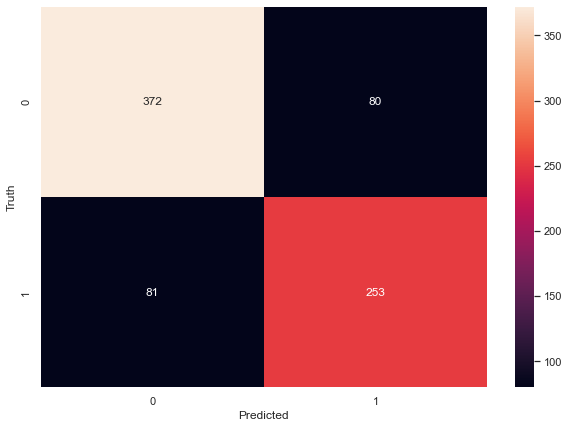

In [912]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=y1_test,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [913]:
X1_test=np.reshape(X1_test,(X1_test.shape[0],X1_test.shape[2]))
y1_test=pd.DataFrame(y1_test)
X1_test=pd.DataFrame(X1_test)

In [914]:
X1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_rnn_9mon_13.xlsx")
y1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_rnn_9mon_13.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_rnn_9mon_13.xlsx")

In [915]:
df_x=df_feature_scaler[3718:]
df_y=df_label[3718:]
df_x=df_x.to_numpy()
df_y=df_y.to_numpy()
df_x=np.reshape(df_x,(df_x.shape[0],1,df_x.shape[1]))


In [916]:
yp = model.predict(df_x)
yp[:5]

array([[0.8066148 , 0.1933852 ],
       [0.2968398 , 0.70316017],
       [0.17278726, 0.82721275],
       [0.16098155, 0.83901846],
       [0.1803615 , 0.8196385 ]], dtype=float32)

In [917]:
y_pred1 = []
for element in yp:
    if element[1] > element[0]:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [918]:
y_pred1[:10]

[0, 1, 1, 1, 1, 1, 1, 1, 1, 1]

In [919]:
df_y[:10]

array([0, 0, 1, 1, 0, 1, 1, 1, 1, 1], dtype=int64)

In [920]:
y_pred1=pd.DataFrame(y_pred1)
df_x=np.reshape(df_x,(df_x.shape[0],df_x.shape[2]))
df_x=pd.DataFrame(df_x)
df_y=pd.DataFrame(df_y)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_rnn_9mon_test_13.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_rnn_9mon_test_13.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_rnn_9mon_test_13.xlsx")

In [921]:
# 12 months 15%

In [922]:
df =pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/12_months.csv")
df.head()
print(data.isnull().sum())
data = data.dropna(how='any',axis=0) 
print(data.isnull().sum())

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result15
0,ALMONDZ GLOBAL SECURITIES LTD.,ALMONDZ,61581,1.264405e+05,0,0.0,61581,1.264405e+05,2.05,10-01-2015,...,2.93,0.10,-18.00,-8.00,31.00,11.00,3.24,Finance & Investments,PROFIT,PROFIT
1,ATUL LTD.,ATUL,18541,2.410243e+07,0,0.0,18541,2.410243e+07,1299.95,10-01-2015,...,81.13,0.26,306.00,-167.00,-124.00,326.00,19.54,Dyes And Pigments,PROFIT,PROFIT
2,GMR INFRASTRUCTURE LTD.,GMRINFRA,14096100,3.017007e+07,0,0.0,14096100,3.017007e+07,2.14,10-01-2015,...,-5.16,0.02,2915.00,-3159.00,448.00,-2806.00,-2.65,Engineering - Turnkey Services,LOSS,LOSS
3,INDOWIND ENERGY LTD.,INDOWIND,3675498,1.419600e+07,0,0.0,3675498,1.419600e+07,3.86,10-01-2015,...,0.03,0.03,1.88,6.33,-8.58,0.51,145.00,Power Generation And Supply,LOSS,LOSS
4,JAGRAN PRAKASHAN LTD.,JAGRAN,1043972,1.458429e+08,0,0.0,1043972,1.458429e+08,139.70,10-01-2015,...,9.42,0.22,439.00,-441.00,17.00,418.00,15.26,Entertainment / Electronic Media Software,PROFIT,PROFIT


In [923]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result15']=df['Result15'].map(r)

In [924]:
df['Cap']

0       0
1       0
2       1
3       0
4       0
       ..
3797    0
3798    0
3799    0
3800    0
3801    0
Name: Cap, Length: 3802, dtype: int64

In [925]:
df.drop('Buy Date',1,inplace=True)
df.drop('Sell date',1,inplace=True)
df.drop('Row Labels',1,inplace=True)
#df.drop('Symbol',1,inplace=True)
df.drop('Return',1,inplace=True)
df.drop('Sell price',1,inplace=True)
df.drop('Result',axis=1,inplace=True)
#df.drop('Nifty Index at buying',axis=1,inplace=True)
#df.drop('Nfty index at selling',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Buy Date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Sell date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Row Labels',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\620537291.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Return',1,inplace=True)
C:\Users\Anmol Choubey\AppD

In [926]:
df['code']=pd.factorize(df['Symbol'])[0] + 1

In [927]:
df.drop('Symbol',1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\265036371.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Symbol',1,inplace=True)


In [928]:
df_feature = df.drop('Result15',axis='columns')
df_label = df['Result15']

In [929]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.129960,-0.104783,-0.048497,-0.079303,-0.126861,-0.102862,-0.089014,-0.461681,-0.662150,-0.572817,...,-0.017133,-0.126822,-0.226413,-0.115495,0.144601,-0.009641,-0.164106,-0.083656,-1.176471,-1.414336
1,-0.136886,-0.088604,-0.048497,-0.079303,-0.133892,-0.086665,0.043075,1.941879,-0.662150,-0.572817,...,-0.017160,0.177036,0.700012,-0.042298,0.099047,-0.061451,-0.052778,-0.010025,-1.130015,-1.408140
2,2.128211,-0.084510,-0.048497,-0.079303,2.165699,-0.082566,-0.089005,-0.455350,1.414348,1.422368,...,-0.017118,-0.158257,-0.689626,0.547119,-0.758183,0.129747,-1.159694,-0.110263,-1.083558,-1.401944
3,0.451523,-0.095289,-0.048497,-0.079303,0.463478,-0.093358,-0.088830,-0.469537,-0.662150,-0.572817,...,-0.017161,-0.138091,-0.631725,-0.111004,0.148707,-0.022871,-0.167813,0.556707,-1.037101,-1.395748
4,0.028107,-0.006457,-0.048497,-0.079303,0.033614,-0.004424,-0.075005,-0.256877,-0.662150,-0.572817,...,-0.017162,-0.101605,0.468406,-0.012251,0.020544,-0.014320,-0.020263,-0.029359,-0.990645,-1.389552


In [930]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.129960,-0.104783,-0.048497,-0.079303,-0.126861,-0.102862,-0.089014,-0.461681,-0.662150,-0.572817,...,-0.017133,-0.126822,-0.226413,-0.115495,0.144601,-0.009641,-0.164106,-0.083656,-1.176471,-1.414336
1,-0.136886,-0.088604,-0.048497,-0.079303,-0.133892,-0.086665,0.043075,1.941879,-0.662150,-0.572817,...,-0.017160,0.177036,0.700012,-0.042298,0.099047,-0.061451,-0.052778,-0.010025,-1.130015,-1.408140
2,2.128211,-0.084510,-0.048497,-0.079303,2.165699,-0.082566,-0.089005,-0.455350,1.414348,1.422368,...,-0.017118,-0.158257,-0.689626,0.547119,-0.758183,0.129747,-1.159694,-0.110263,-1.083558,-1.401944
3,0.451523,-0.095289,-0.048497,-0.079303,0.463478,-0.093358,-0.088830,-0.469537,-0.662150,-0.572817,...,-0.017161,-0.138091,-0.631725,-0.111004,0.148707,-0.022871,-0.167813,0.556707,-1.037101,-1.395748
4,0.028107,-0.006457,-0.048497,-0.079303,0.033614,-0.004424,-0.075005,-0.256877,-0.662150,-0.572817,...,-0.017162,-0.101605,0.468406,-0.012251,0.020544,-0.014320,-0.020263,-0.029359,-0.990645,-1.389552


In [931]:
from sklearn.model_selection import train_test_split

X1_big, X1_test, y1_big, y1_test = train_test_split(df_feature_scaler, df_label, test_size=0.2, random_state=27)
#becase the data isn't too much, so I take the validation data from train data
X1_train, X1_val, y1_train, y1_val = train_test_split(X1_big, y1_big, test_size=0.2, random_state=27)

In [932]:
print(X1_big.shape, X1_val.shape, X1_test.shape,X1_train.shape)

(3041, 24) (609, 24) (761, 24) (2432, 24)


In [933]:
import json
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow.keras as keras
import matplotlib.pyplot as plt

In [934]:
print(X1_train.shape, ',', X1_train.ndim, ',', type(X1_train))
print(y1_train.shape, ',', y1_train.ndim, ',', type(y1_train))
print(X1_test.shape, ',', X1_val.ndim, ',', type(X1_val))
print(y1_test.shape, ',', y1_val.ndim, ',', type(y1_val))
#print(data_dim)

(2432, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(2432,) , 1 , <class 'pandas.core.series.Series'>
(761, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(761,) , 1 , <class 'pandas.core.series.Series'>


In [935]:
X1_train=X1_train.to_numpy()
y1_train=y1_train.to_numpy()
X1_test=X1_test.to_numpy()
y1_test=y1_test.to_numpy()
X1_val=X1_val.to_numpy()
y1_val=y1_val.to_numpy()

In [936]:
X1_train=np.reshape(X1_train,(X1_train.shape[0],1,X1_train.shape[1]))
X1_test=np.reshape(X1_test,(X1_test.shape[0],1,X1_test.shape[1]))

In [937]:
X1_val=np.reshape(X1_val,(X1_val.shape[0],1,X1_val.shape[1]))
print(X1_val.shape,X1_test.shape,X1_train.shape)

(609, 1, 24) (761, 1, 24) (2432, 1, 24)


In [938]:
model=keras.Sequential()

#LSTM Layers
model.add(keras.layers.LSTM(units=100,input_shape=(1,24), return_sequences=True))
model.add(keras.layers.LSTM(units=50,dropout=0.05, recurrent_dropout=0.35, return_sequences=False))

#dense layer
model.add(keras.layers.Dense(40, activation='relu'))
model.add(keras.layers.Dropout(0.2))

#output layer
model.add(keras.layers.Dense(2, activation='softmax'))

opti= keras.optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opti, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [939]:
#early_stopping = tf.keras.callbacks.EarlyStopping(patience=5)
history = model.fit(X1_train,y1_train,
          validation_data=(X1_val,y1_val),
          batch_size = 40,
          epochs = 150,
          #callbacks = [early_stopping],
          #validation_data = (val_inputs1, val_targets1),
          verbose = 2
          )

Epoch 1/150
61/61 - 1s - loss: 0.6912 - accuracy: 0.5736 - val_loss: nan - val_accuracy: 0.5534
Epoch 2/150
61/61 - 0s - loss: 0.6867 - accuracy: 0.5609 - val_loss: nan - val_accuracy: 0.5665
Epoch 3/150
61/61 - 0s - loss: 0.6815 - accuracy: 0.5666 - val_loss: nan - val_accuracy: 0.5731
Epoch 4/150
61/61 - 0s - loss: 0.6746 - accuracy: 0.5917 - val_loss: nan - val_accuracy: 0.5977
Epoch 5/150
61/61 - 0s - loss: 0.6650 - accuracy: 0.6213 - val_loss: nan - val_accuracy: 0.6470
Epoch 6/150
61/61 - 0s - loss: 0.6510 - accuracy: 0.6780 - val_loss: nan - val_accuracy: 0.6946
Epoch 7/150
61/61 - 0s - loss: 0.6326 - accuracy: 0.7109 - val_loss: nan - val_accuracy: 0.7274
Epoch 8/150
61/61 - 0s - loss: 0.6088 - accuracy: 0.7303 - val_loss: nan - val_accuracy: 0.7323
Epoch 9/150
61/61 - 0s - loss: 0.5831 - accuracy: 0.7434 - val_loss: nan - val_accuracy: 0.7389
Epoch 10/150
61/61 - 0s - loss: 0.5591 - accuracy: 0.7599 - val_loss: nan - val_accuracy: 0.7603
Epoch 11/150
61/61 - 0s - loss: 0.5363 

Epoch 86/150
61/61 - 0s - loss: 0.4350 - accuracy: 0.8088 - val_loss: nan - val_accuracy: 0.7849
Epoch 87/150
61/61 - 0s - loss: 0.4327 - accuracy: 0.8121 - val_loss: nan - val_accuracy: 0.7816
Epoch 88/150
61/61 - 0s - loss: 0.4346 - accuracy: 0.8104 - val_loss: nan - val_accuracy: 0.7833
Epoch 89/150
61/61 - 0s - loss: 0.4334 - accuracy: 0.8080 - val_loss: nan - val_accuracy: 0.7833
Epoch 90/150
61/61 - 0s - loss: 0.4314 - accuracy: 0.8113 - val_loss: nan - val_accuracy: 0.7833
Epoch 91/150
61/61 - 0s - loss: 0.4336 - accuracy: 0.8072 - val_loss: nan - val_accuracy: 0.7833
Epoch 92/150
61/61 - 0s - loss: 0.4332 - accuracy: 0.8109 - val_loss: nan - val_accuracy: 0.7816
Epoch 93/150
61/61 - 0s - loss: 0.4321 - accuracy: 0.8072 - val_loss: nan - val_accuracy: 0.7849
Epoch 94/150
61/61 - 0s - loss: 0.4298 - accuracy: 0.8104 - val_loss: nan - val_accuracy: 0.7833
Epoch 95/150
61/61 - 0s - loss: 0.4327 - accuracy: 0.8067 - val_loss: nan - val_accuracy: 0.7816
Epoch 96/150
61/61 - 0s - loss

In [940]:
test_loss, test_accuracy = model.evaluate(X1_test, y1_test)
print("Test loss: {0:.2f} and Test accuracy: {1:.2f}% ".format(test_loss,test_accuracy*100))

24/24 [==============================] - 0s 1ms/step - loss: nan - accuracy: 0.7898
Test loss: nan and Test accuracy: 78.98% 


In [941]:
yp = model.predict(X1_test)
yp[:5]

array([[0.6815343 , 0.31846577],
       [0.6188991 , 0.3811009 ],
       [0.26523423, 0.73476577],
       [0.91359735, 0.08640268],
       [0.9410485 , 0.05895148]], dtype=float32)

In [942]:
y_pred=[]
for element in yp:
    if element[0]<element[1]:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [943]:
y_pred=pd.DataFrame(y_pred)

In [944]:
y_pred[:10]

,0
0,0
1,0
2,1
3,0
4,0
5,0
6,0
7,0
8,0
9,1


In [945]:
y1_test[:10]

array([0, 0, 1, 0, 0, 0, 0, 0, 0, 1], dtype=int64)

Text(66.5, 0.5, 'Truth')

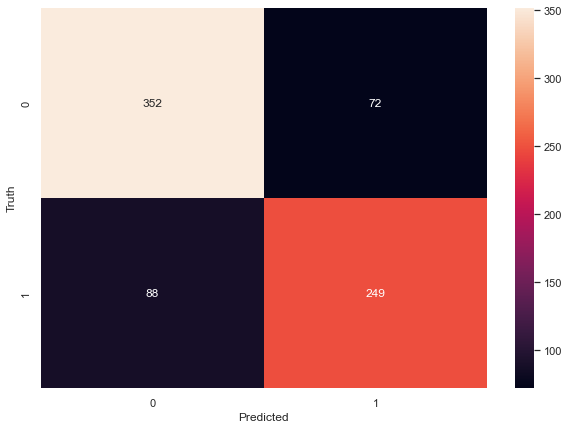

In [946]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=y1_test,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [947]:
X1_test=np.reshape(X1_test,(X1_test.shape[0],X1_test.shape[2]))
y1_test=pd.DataFrame(y1_test)
X1_test=pd.DataFrame(X1_test)

In [948]:
X1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_rnn_12mon_15.xlsx")
y1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_rnn_12mon_15.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_rnn_12mon_15.xlsx")

In [949]:
df_x=df_feature_scaler[3508:]
df_y=df_label[3508:]
df_x=df_x.to_numpy()
df_y=df_y.to_numpy()
df_x=np.reshape(df_x,(df_x.shape[0],1,df_x.shape[1]))


In [950]:
yp = model.predict(df_x)
yp[:5]

array([[0.07828828, 0.92171174],
       [0.08578696, 0.91421306],
       [0.10551029, 0.89448977],
       [0.07889027, 0.92110974],
       [0.0633426 , 0.93665737]], dtype=float32)

In [951]:
y_pred1 = []
for element in yp:
    if element[1] > element[0]:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [952]:
y_pred1[:10]

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

In [953]:
df_y[:10]

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int64)

In [954]:
y_pred1=pd.DataFrame(y_pred1)
df_x=np.reshape(df_x,(df_x.shape[0],df_x.shape[2]))
df_x=pd.DataFrame(df_x)
df_y=pd.DataFrame(df_y)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_rnn_12mon_test_15.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_rnn_12mon_test_15.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_rnn_12mon_test_15.xlsx")

In [955]:
#max

In [956]:
df =pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/max.csv")

print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())
df.head()

Row Labels                  0
Symbol                      0
No of Shares Bought         0
Value of purchase           0
No of shares sold           0
Value of sale               1
No of shares                0
Value                       0
Avg Price                   0
Buy Date                    0
Sell date                   0
Buy price                   0
Nifty Index at buying       0
No of shares.1              0
Market Cap                  0
%age of Marketcap           0
Cap                         0
Deviation                   0
EPS                         0
ROE                         0
COA                         0
CIA                         0
CFA                         0
PBT                         0
PE                          0
Industry                    0
Sell price(2)               0
Nfty index at selling(2)    0
Change in Nifty 50(2)       0
Change in Nifty 50(6)       0
Change in Nifty 50(9)       0
Change in Nifty 50(12)      0
Return(2)                   0
Return(6) 

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,Change in Nifty 50(6),Change in Nifty 50(9),Change in Nifty 50(12),Return(2),Return(6),Return(9),Return(12),Return,Change in Nifty 50,Result15
0,ALMONDZ GLOBAL SECURITIES LTD.,ALMONDZ,61581,1.264405e+05,0,0.0,61581,1.264405e+05,2.05,10-01-2015,...,-7.37%,10.40%,17.25%,8.42%,-3.68%,36.84%,25.26%,0.37,0.10,PROFIT
1,ATUL LTD.,ATUL,18541,2.410243e+07,0,0.0,18541,2.410243e+07,1299.95,10-01-2015,...,-7.37%,10.40%,17.25%,2.69%,-3.07%,27.55%,50.46%,0.50,0.17,PROFIT
2,GMR INFRASTRUCTURE LTD.,GMRINFRA,14096100,3.017007e+07,0,0.0,14096100,3.017007e+07,2.14,10-01-2015,...,-2.59%,6.03%,18.83%,29.30%,-12.45%,-2.56%,-3.66%,0.29,0.02,PROFIT
3,INDOWIND ENERGY LTD.,INDOWIND,3675498,1.419600e+07,0,0.0,3675498,1.419600e+07,3.86,10-01-2015,...,-7.37%,10.40%,17.25%,8.05%,-11.49%,4.60%,-1.15%,0.08,0.06,LOSS
4,JAGRAN PRAKASHAN LTD.,JAGRAN,1043972,1.458429e+08,0,0.0,1043972,1.458429e+08,139.70,10-01-2015,...,-7.37%,10.40%,17.25%,7.76%,10.57%,23.55%,32.77%,0.33,0.17,PROFIT


In [957]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result15']=df['Result15'].map(r)

In [958]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3082 entries, 0 to 3082
Data columns (total 39 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Row Labels                3082 non-null   object 
 1   Symbol                    3082 non-null   object 
 2   No of Shares Bought       3082 non-null   int64  
 3   Value of purchase         3082 non-null   float64
 4   No of shares sold         3082 non-null   int64  
 5   Value of sale             3082 non-null   float64
 6   No of shares              3082 non-null   int64  
 7   Value                     3082 non-null   float64
 8   Avg Price                 3082 non-null   float64
 9   Buy Date                  3082 non-null   object 
 10  Sell date                 3082 non-null   object 
 11  Buy price                 3082 non-null   float64
 12  Nifty Index at buying     3082 non-null   float64
 13  No of shares.1            3082 non-null   int64  
 14  Market C

In [959]:
df['Cap']

0       0
1       0
2       1
3       0
4       0
       ..
3078    1
3079    0
3080    0
3081    0
3082    0
Name: Cap, Length: 3082, dtype: int64

In [960]:
df.drop('Buy Date',1,inplace=True)
df.drop('Sell date',1,inplace=True)
df.drop('Row Labels',1,inplace=True)
#data.drop('Symbol',1,inplace=True)
df.drop('Return',1,inplace=True)
df.drop('Return(2)',1,inplace=True)
df.drop('Return(6)',1,inplace=True)
df.drop('Return(9)',1,inplace=True)
df.drop('Return(12)',1,inplace=True)
df.drop("Sell price(2)",1,inplace=True)
#data.drop('Result3',axis=1,inplace=True)
#data.drop('Nifty Index at buying',axis=1,inplace=True)
df.drop("Nfty index at selling(2)",axis=1,inplace=True)
df.drop("Change in Nifty 50(2)",axis=1,inplace=True)
df.drop("Change in Nifty 50(6)",axis=1,inplace=True)
df.drop("Change in Nifty 50(9)",axis=1,inplace=True)
df.drop("Change in Nifty 50(12)",axis=1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\258682244.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Buy Date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\258682244.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Sell date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\258682244.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Row Labels',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\258682244.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Return',1,inplace=True)
C:\Users\Anmol Choubey\AppD

In [961]:
df['code']=pd.factorize(df['Symbol'])[0] + 1

In [962]:
df.drop('Symbol',1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\265036371.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Symbol',1,inplace=True)


In [963]:
df_feature = df.drop('Result15',axis='columns')
df_label = df['Result15']

In [964]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,No of shares.1,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Change in Nifty 50,code
0,-0.127988,-0.107273,-0.047267,-0.107944,-0.125706,-0.105556,-0.081740,-0.462813,-0.663274,-0.347365,...,-0.127792,-0.246735,-0.132499,0.147276,-0.003521,-0.172464,-0.131762,-1.24067,-0.327825,-1.398516
1,-0.134827,-0.089132,-0.047267,-0.107944,-0.132611,-0.087398,0.040982,1.956260,-0.663274,-0.342251,...,0.199389,0.737650,-0.054647,0.102633,-0.057854,-0.058642,-0.037383,-1.19294,-0.138837,-1.392022
2,2.101849,-0.084541,-0.047267,-0.107944,2.125969,-0.082803,-0.081731,-0.456441,1.397870,7.790057,...,-0.161640,-0.738928,0.572255,-0.737443,0.142654,-1.190363,-0.165865,-1.14521,-0.543811,-1.385527
3,0.446199,-0.096628,-0.047267,-0.107944,0.454105,-0.094900,-0.081569,-0.470720,-0.663274,-0.260905,...,-0.139925,-0.677403,-0.127722,0.151299,-0.017395,-0.176255,0.689046,-1.09748,-0.435818,-1.379033
4,0.028096,0.002985,-0.047267,-0.107944,0.031908,0.004800,-0.068724,-0.256687,-0.663274,0.018920,...,-0.100638,0.491554,-0.022689,0.025701,-0.008428,-0.025398,-0.062164,-1.04975,-0.138837,-1.372538


In [965]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,No of shares.1,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Change in Nifty 50,code
0,-0.127988,-0.107273,-0.047267,-0.107944,-0.125706,-0.105556,-0.081740,-0.462813,-0.663274,-0.347365,...,-0.127792,-0.246735,-0.132499,0.147276,-0.003521,-0.172464,-0.131762,-1.24067,-0.327825,-1.398516
1,-0.134827,-0.089132,-0.047267,-0.107944,-0.132611,-0.087398,0.040982,1.956260,-0.663274,-0.342251,...,0.199389,0.737650,-0.054647,0.102633,-0.057854,-0.058642,-0.037383,-1.19294,-0.138837,-1.392022
2,2.101849,-0.084541,-0.047267,-0.107944,2.125969,-0.082803,-0.081731,-0.456441,1.397870,7.790057,...,-0.161640,-0.738928,0.572255,-0.737443,0.142654,-1.190363,-0.165865,-1.14521,-0.543811,-1.385527
3,0.446199,-0.096628,-0.047267,-0.107944,0.454105,-0.094900,-0.081569,-0.470720,-0.663274,-0.260905,...,-0.139925,-0.677403,-0.127722,0.151299,-0.017395,-0.176255,0.689046,-1.09748,-0.435818,-1.379033
4,0.028096,0.002985,-0.047267,-0.107944,0.031908,0.004800,-0.068724,-0.256687,-0.663274,0.018920,...,-0.100638,0.491554,-0.022689,0.025701,-0.008428,-0.025398,-0.062164,-1.04975,-0.138837,-1.372538


In [966]:
from sklearn.model_selection import train_test_split

X1_big, X1_test, y1_big, y1_test = train_test_split(df_feature_scaler, df_label, test_size=0.2, random_state=27)
#becase the data isn't too much, so I take the validation data from train data
X1_train, X1_val, y1_train, y1_val = train_test_split(X1_big, y1_big, test_size=0.2, random_state=27)

In [967]:
print(X1_big.shape, X1_val.shape, X1_test.shape,X1_train.shape)

(2465, 24) (493, 24) (617, 24) (1972, 24)


In [968]:
import json
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow.keras as keras
import matplotlib.pyplot as plt

In [969]:
print(X1_train.shape, ',', X1_train.ndim, ',', type(X1_train))
print(y1_train.shape, ',', y1_train.ndim, ',', type(y1_train))
print(X1_test.shape, ',', X1_val.ndim, ',', type(X1_val))
print(y1_test.shape, ',', y1_val.ndim, ',', type(y1_val))
#print(data_dim)

(1972, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(1972,) , 1 , <class 'pandas.core.series.Series'>
(617, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(617,) , 1 , <class 'pandas.core.series.Series'>


In [970]:
X1_train=X1_train.to_numpy()
y1_train=y1_train.to_numpy()
X1_test=X1_test.to_numpy()
y1_test=y1_test.to_numpy()
X1_val=X1_val.to_numpy()
y1_val=y1_val.to_numpy()

In [971]:
X1_train=np.reshape(X1_train,(X1_train.shape[0],1,X1_train.shape[1]))
X1_test=np.reshape(X1_test,(X1_test.shape[0],1,X1_test.shape[1]))

In [972]:
X1_val=np.reshape(X1_val,(X1_val.shape[0],1,X1_val.shape[1]))
print(X1_val.shape,X1_test.shape,X1_train.shape)

(493, 1, 24) (617, 1, 24) (1972, 1, 24)


In [973]:
model=keras.Sequential()

#LSTM Layers
model.add(keras.layers.LSTM(units=100,input_shape=(1,24), return_sequences=True))
model.add(keras.layers.LSTM(units=50,dropout=0.05, recurrent_dropout=0.35, return_sequences=False))

#dense layer
model.add(keras.layers.Dense(40, activation='relu'))
model.add(keras.layers.Dropout(0.2))

#output layer
model.add(keras.layers.Dense(2, activation='softmax'))

opti= keras.optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opti, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [974]:
#early_stopping = tf.keras.callbacks.EarlyStopping(patience=5)
history = model.fit(X1_train,y1_train,
          validation_data=(X1_val,y1_val),
          batch_size = 40,
          epochs = 150,
          #callbacks = [early_stopping],
          #validation_data = (val_inputs1, val_targets1),
          verbose = 2
          )

Epoch 1/150
50/50 - 1s - loss: 0.6888 - accuracy: 0.6587 - val_loss: 0.6841 - val_accuracy: 0.7120
Epoch 2/150
50/50 - 0s - loss: 0.6816 - accuracy: 0.7145 - val_loss: 0.6759 - val_accuracy: 0.7221
Epoch 3/150
50/50 - 0s - loss: 0.6725 - accuracy: 0.7216 - val_loss: 0.6654 - val_accuracy: 0.7363
Epoch 4/150
50/50 - 0s - loss: 0.6609 - accuracy: 0.7399 - val_loss: 0.6520 - val_accuracy: 0.7424
Epoch 5/150
50/50 - 0s - loss: 0.6453 - accuracy: 0.7515 - val_loss: 0.6345 - val_accuracy: 0.7444
Epoch 6/150
50/50 - 0s - loss: 0.6243 - accuracy: 0.7606 - val_loss: 0.6138 - val_accuracy: 0.7485
Epoch 7/150
50/50 - 0s - loss: 0.6022 - accuracy: 0.7683 - val_loss: 0.5909 - val_accuracy: 0.7505
Epoch 8/150
50/50 - 0s - loss: 0.5769 - accuracy: 0.7769 - val_loss: 0.5690 - val_accuracy: 0.7566
Epoch 9/150
50/50 - 0s - loss: 0.5544 - accuracy: 0.7718 - val_loss: 0.5497 - val_accuracy: 0.7586
Epoch 10/150
50/50 - 0s - loss: 0.5338 - accuracy: 0.7748 - val_loss: 0.5359 - val_accuracy: 0.7647
Epoch 11/

50/50 - 0s - loss: 0.4482 - accuracy: 0.8007 - val_loss: 0.5094 - val_accuracy: 0.7708
Epoch 84/150
50/50 - 0s - loss: 0.4513 - accuracy: 0.7982 - val_loss: 0.5106 - val_accuracy: 0.7708
Epoch 85/150
50/50 - 0s - loss: 0.4468 - accuracy: 0.7926 - val_loss: 0.5098 - val_accuracy: 0.7708
Epoch 86/150
50/50 - 0s - loss: 0.4524 - accuracy: 0.7977 - val_loss: 0.5092 - val_accuracy: 0.7708
Epoch 87/150
50/50 - 0s - loss: 0.4478 - accuracy: 0.7992 - val_loss: 0.5106 - val_accuracy: 0.7688
Epoch 88/150
50/50 - 0s - loss: 0.4478 - accuracy: 0.8012 - val_loss: 0.5089 - val_accuracy: 0.7728
Epoch 89/150
50/50 - 0s - loss: 0.4470 - accuracy: 0.8027 - val_loss: 0.5090 - val_accuracy: 0.7728
Epoch 90/150
50/50 - 0s - loss: 0.4457 - accuracy: 0.7961 - val_loss: 0.5105 - val_accuracy: 0.7708
Epoch 91/150
50/50 - 0s - loss: 0.4488 - accuracy: 0.8007 - val_loss: 0.5115 - val_accuracy: 0.7708
Epoch 92/150
50/50 - 0s - loss: 0.4477 - accuracy: 0.8007 - val_loss: 0.5113 - val_accuracy: 0.7708
Epoch 93/150


In [975]:
test_loss, test_accuracy = model.evaluate(X1_test, y1_test)
print("Test loss: {0:.2f} and Test accuracy: {1:.2f}% ".format(test_loss,test_accuracy*100))

20/20 [==============================] - 0s 2ms/step - loss: 0.5565 - accuracy: 0.7601
Test loss: 0.56 and Test accuracy: 76.01% 


In [976]:
yp = model.predict(X1_test)
yp[:5]

array([[0.84337676, 0.15662329],
       [0.7587954 , 0.24120463],
       [0.5253789 , 0.4746211 ],
       [0.756883  , 0.24311695],
       [0.6529379 , 0.34706208]], dtype=float32)

In [977]:
y_pred=[]
for element in yp:
    if element[0]<element[1]:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [978]:
y_pred=pd.DataFrame(y_pred)

In [979]:
y_pred[:10]

,0
0,0
1,0
2,0
3,0
4,0
5,1
6,0
7,0
8,0
9,1


In [980]:
y1_test[:10]

array([1, 0, 1, 0, 0, 1, 0, 0, 1, 0], dtype=int64)

Text(66.5, 0.5, 'Truth')

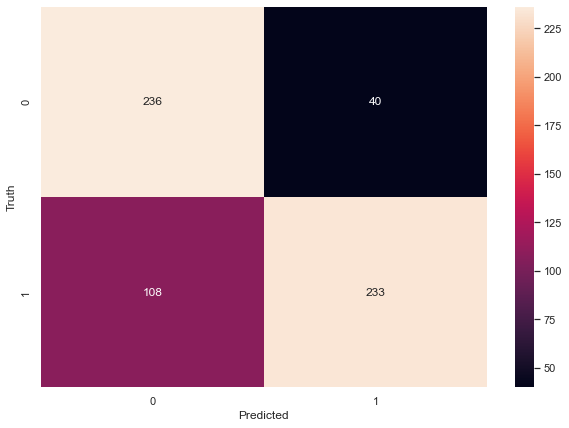

In [981]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=y1_test,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [982]:
X1_test=np.reshape(X1_test,(X1_test.shape[0],X1_test.shape[2]))
y1_test=pd.DataFrame(y1_test)
X1_test=pd.DataFrame(X1_test)

In [983]:
X1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_rnn_max.xlsx")
y1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_rnn_max.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_rnn_max.xlsx")

In [984]:
df_x=df_feature_scaler[2847:]
df_y=df_label[2847:]
df_x=df_x.to_numpy()
df_y=df_y.to_numpy()
df_x=np.reshape(df_x,(df_x.shape[0],1,df_x.shape[1]))


In [985]:
yp = model.predict(df_x)
yp[:5]

array([[2.0685745e-02, 9.7931427e-01],
       [2.1723840e-02, 9.7827607e-01],
       [9.4616925e-03, 9.9053824e-01],
       [7.9962060e-02, 9.2003798e-01],
       [3.4614085e-04, 9.9965382e-01]], dtype=float32)

In [986]:
y_pred1 = []
for element in yp:
    if element[1] > element[0]:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [987]:
y_pred1[:10]

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

In [988]:
df_y[:10]

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int64)

In [989]:
y_pred1=pd.DataFrame(y_pred1)
df_x=np.reshape(df_x,(df_x.shape[0],df_x.shape[2]))
df_x=pd.DataFrame(df_x)
df_y=pd.DataFrame(df_y)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_rnn_max_test.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_rnn_max_test.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_rnn_max_test.xlsx")

In [990]:
raise SystemExit("Stop right there!")

SystemExit: Stop right there!

C:\Users\Anmol Choubey\anaconda3\envs\deeplearning\lib\site-packages\IPython\core\interactiveshell.py:3377: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [991]:
model.summary()

Model: "sequential_25"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_14 (LSTM)               (None, 1, 100)            50000     
_________________________________________________________________
lstm_15 (LSTM)               (None, 50)                30200     
_________________________________________________________________
dense_78 (Dense)             (None, 40)                2040      
_________________________________________________________________
dropout_7 (Dropout)          (None, 40)                0         
_________________________________________________________________
dense_79 (Dense)             (None, 2)                 82        
Total params: 82,322
Trainable params: 82,322
Non-trainable params: 0
_________________________________________________________________


In [992]:
#FCL

In [993]:
df = pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/2 month.csv")
df.sample(5)

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result5
1644,ARVIND LTD.,ARVIND,14500,4.634802e+06,0,0.0,14500,4.634802e+06,319.64,11-01-2018,...,11.97,0.09,428.0,-353.0,-55.0,385.0,27.31,Textiles - Cotton/Blended,LOSS,LOSS
1449,ADANI PORTS AND SPECIAL ECONOMIC ZONE LTD.,ADANIPORTS,10000,3.775996e+06,0,0.0,10000,3.775996e+06,377.60,09-01-2018,...,17.74,0.17,5608.0,-3846.0,-1889.0,5234.0,21.67,Miscellaneous,LOSS,LOSS
3621,TRIDENT LTD.,TRIDENT,160000000,1.225690e+09,0,0.0,160000000,1.225690e+09,7.66,12-01-2020,...,0.67,0.10,1214.0,-43.0,-862.0,421.0,12.24,Textiles - Products,PROFIT,PROFIT
418,ASTEC LIFESCIENCES LIMITED,ASTEC,16087,6.489099e+06,0,0.0,16087,6.489099e+06,403.38,11-01-2016,...,2.55,0.12,-13.0,-17.0,31.0,12.0,250.80,Pesticides / Agrochemicals - Indian,LOSS,LOSS
2196,ORICON ENTERPRISES LTD.-$,ORICONENT,1000000,3.329404e+07,0,0.0,1000000,3.329404e+07,33.29,04-01-2019,...,1.14,0.03,102.0,59.0,-160.0,32.0,25.53,Packaging,LOSS,LOSS


In [994]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result']=df['Result'].map(r)

In [995]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            0
No of shares             0
Value                    0
Avg Price                0
Buy Date                 0
Sell date                0
Buy price                0
Sell price               0
Nifty Index at buying    0
Nfty index at selling    0
Change in Nifty 50       0
Return                   0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Result                   0
Result5                  0
dtype: int64
Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares so

In [996]:
df['Cap']

0       0
1       0
2       1
3       0
4       0
       ..
4236    0
4237    0
4238    0
4239    0
4240    0
Name: Cap, Length: 4241, dtype: int64

In [997]:
df.drop('Buy Date',axis=1,inplace=True)
df.drop('Sell date',axis=1,inplace=True)
df.drop('Row Labels',axis=1,inplace=True)
#df.drop('Symbol',axis=1,inplace=True)
#df.drop('Return %',axis=1,inplace=True)
df.drop('Return',axis=1,inplace=True)
df.drop('Sell price',axis=1,inplace=True)
df.drop('Result5',axis=1,inplace=True)
#df.drop('Nifty Index at buying',axis=1,inplace=True)
#df.drop('Nfty index at selling',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)

In [998]:
df['code']=pd.factorize(df['Symbol'])[0] + 1
df.drop('Symbol',axis=1,inplace=True)

In [999]:
df_feature = df.drop('Result',axis='columns')
df_label = df['Result']

In [1000]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.129067,-0.107008,-0.047593,-0.082351,-0.126057,-0.105010,-0.092596,-0.444790,-0.700391,-0.655708,...,-0.028060,-0.058507,-0.220014,-0.130812,0.148124,0.015864,-0.173498,-0.087246,-1.174670,-1.400415
1,-0.136307,-0.091216,-0.047593,-0.082351,-0.133405,-0.089202,0.045594,1.640970,-0.700391,-0.655708,...,-0.028065,0.001528,0.739882,-0.059730,0.101365,-0.034456,-0.061655,-0.010550,-1.128896,-1.394445
2,2.231717,-0.087220,-0.047593,-0.082351,2.269995,-0.085202,-0.092586,-0.439296,1.112107,1.086441,...,-0.028058,-0.064718,-0.699962,0.512658,-0.778526,0.151242,-1.173701,-0.114960,-1.083121,-1.388474
3,0.478839,-0.097741,-0.047593,-0.082351,0.490931,-0.095734,-0.092403,-0.451608,-0.700391,-0.655708,...,-0.028066,-0.060733,-0.639968,-0.126450,0.152338,0.003015,-0.177223,0.579773,-1.037347,-1.382503
4,0.036183,-0.011034,-0.047593,-0.082351,0.041662,-0.008938,-0.077940,-0.267066,-0.700391,-0.655708,...,-0.028066,-0.053524,0.499908,-0.030551,0.020787,0.011319,-0.028989,-0.030688,-0.991572,-1.376533


In [1001]:
from sklearn.model_selection import train_test_split

X1_big, X1_test, y1_big, y1_test = train_test_split(df_feature_scaler, df_label, test_size=0.2, random_state=27)
#becase the data isn't too much, so I take the validation data from train data
X1_train, X1_val, y1_train, y1_val = train_test_split(X1_big, y1_big, test_size=0.2, random_state=27)

In [1002]:
print(X1_big.shape, X1_val.shape, X1_test.shape,X1_train.shape)

(3392, 24) (679, 24) (849, 24) (2713, 24)


In [1003]:
print(X1_train.shape, ',', X1_train.ndim, ',', type(X1_train))
print(y1_train.shape, ',', y1_train.ndim, ',', type(y1_train))
print(X1_test.shape, ',', X1_val.ndim, ',', type(X1_val))
print(y1_test.shape, ',', y1_val.ndim, ',', type(y1_val))

(2713, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(2713,) , 1 , <class 'pandas.core.series.Series'>
(849, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(849,) , 1 , <class 'pandas.core.series.Series'>


In [1004]:
X1_train=X1_train.to_numpy()
y1_train=y1_train.to_numpy()
X1_test=X1_test.to_numpy()
y1_test=y1_test.to_numpy()
X1_val=X1_val.to_numpy()
y1_val=y1_val.to_numpy()

In [1005]:
X1_train=np.reshape(X1_train,(X1_train.shape[0],1,X1_train.shape[1]))
X1_test=np.reshape(X1_test,(X1_test.shape[0],1,X1_test.shape[1]))

In [1006]:
X1_val=np.reshape(X1_val,(X1_val.shape[0],1,X1_val.shape[1]))
print(X1_val.shape,X1_test.shape,X1_train.shape)

(679, 1, 24) (849, 1, 24) (2713, 1, 24)


In [1007]:
df_feature_scaler.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4241 entries, 0 to 4240
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   No of Shares Bought    4241 non-null   float64
 1   Value of purchase      4241 non-null   float64
 2   No of shares sold      4241 non-null   float64
 3   Value of sale          4241 non-null   float64
 4   No of shares           4241 non-null   float64
 5   Value                  4241 non-null   float64
 6   Avg Price              4241 non-null   float64
 7   Buy price              4241 non-null   float64
 8   Nifty Index at buying  4241 non-null   float64
 9   Nfty index at selling  4241 non-null   float64
 10  No of shares.1         4241 non-null   float64
 11  Market Cap             4241 non-null   float64
 12  %age of Marketcap      4241 non-null   float64
 13  Cap                    4241 non-null   float64
 14  Deviation              4241 non-null   float64
 15  EPS 

In [1008]:
# Define model
# FULLY CONNECTED LAYER
from keras import models
from keras import layers
from keras import optimizers

epochs = 100

modelfcl = models.Sequential()
modelfcl.add(layers.Flatten(input_shape=(1,24)))
modelfcl.add(layers.Dense(256, activation='relu', input_dim=(1*24)))
modelfcl.add(layers.Dense(128, activation='relu'))
modelfcl.add(layers.Dense(64, activation='relu'))
modelfcl.add(layers.Dense(32, activation='relu'))
modelfcl.add(layers.Dropout(0.5))
modelfcl.add(layers.Dense(1, activation='sigmoid'))
modelfcl.summary()

Model: "sequential_26"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 24)                0         
_________________________________________________________________
dense_80 (Dense)             (None, 256)               6400      
_________________________________________________________________
dense_81 (Dense)             (None, 128)               32896     
_________________________________________________________________
dense_82 (Dense)             (None, 64)                8256      
_________________________________________________________________
dense_83 (Dense)             (None, 32)                2080      
_________________________________________________________________
dropout_8 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_84 (Dense)             (None, 1)               

In [1009]:
# Compile model
modelfcl.compile(optimizer=optimizers.Adam(),
              loss='binary_crossentropy',
              metrics=['acc'])

In [1010]:
# Train model
history = modelfcl.fit(X1_train, y1_train,
                    epochs=100,
                    batch_size=50, 
                    validation_data=(X1_val, y1_val))

Epoch 1/100
55/55 [==============================] - 0s 6ms/step - loss: 0.6925 - acc: 0.5422 - val_loss: 0.6859 - val_acc: 0.5611
Epoch 2/100
55/55 [==============================] - 0s 2ms/step - loss: 0.6786 - acc: 0.5724 - val_loss: 0.6841 - val_acc: 0.5700
Epoch 3/100
55/55 [==============================] - 0s 2ms/step - loss: 0.6663 - acc: 0.5872 - val_loss: 0.6703 - val_acc: 0.5803
Epoch 4/100
55/55 [==============================] - 0s 2ms/step - loss: 0.6491 - acc: 0.6344 - val_loss: 0.6734 - val_acc: 0.5935
Epoch 5/100
55/55 [==============================] - 0s 2ms/step - loss: 0.6294 - acc: 0.6532 - val_loss: 0.6496 - val_acc: 0.6289
Epoch 6/100
55/55 [==============================] - 0s 2ms/step - loss: 0.5985 - acc: 0.6804 - val_loss: 0.6365 - val_acc: 0.6348
Epoch 7/100
55/55 [==============================] - 0s 2ms/step - loss: 0.5963 - acc: 0.6985 - val_loss: 0.6223 - val_acc: 0.6760
Epoch 8/100
55/55 [==============================] - 0s 2ms/step - loss: 0.5751 - a

In [1011]:
test_loss, test_accuracy = modelfcl.evaluate(X1_test, y1_test)
print("Test loss: {0:.2f} and Test accuracy: {1:.2f}% ".format(test_loss,test_accuracy*100))

27/27 [==============================] - 0s 923us/step - loss: 1.6426 - acc: 0.6514
Test loss: 1.64 and Test accuracy: 65.14% 


In [1012]:
yp = modelfcl.predict(X1_test)
yp[:5]

array([[0.11045468],
       [0.4882295 ],
       [0.2116113 ],
       [0.74300677],
       [0.00493136]], dtype=float32)

In [1013]:
y_pred=[]
for element in yp:
    if element>0.5:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [1014]:
y_pred=pd.DataFrame(y_pred)

In [1015]:
y_pred[:10]

,0
0,0
1,0
2,0
3,1
4,0
5,1
6,0
7,0
8,0
9,0


In [1016]:
y1_test[:10]

array([0, 0, 1, 1, 0, 0, 0, 0, 0, 0], dtype=int64)

Text(66.5, 0.5, 'Truth')

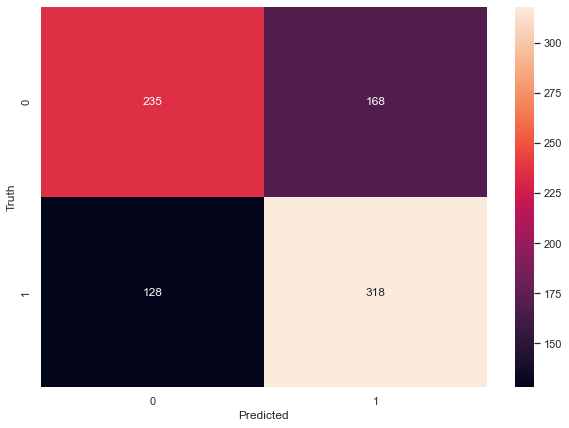

In [1017]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=y1_test,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

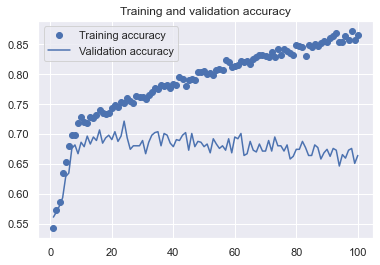

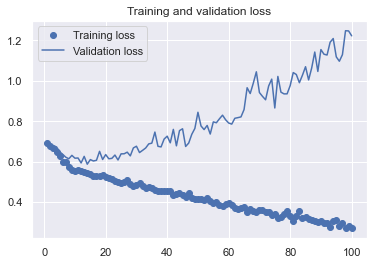

In [1018]:
# Plot results
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc)+1)

plt.plot(epochs, acc, 'bo', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [1019]:
#Fully Connected Layer Model in Action
predict=modelfcl.predict(X1_test)
predict

array([[1.10454679e-01],
       [4.88229513e-01],
       [2.11611301e-01],
       [7.43006766e-01],
       [4.93136048e-03],
       [9.29551125e-01],
       [1.79799587e-01],
       [1.43991801e-05],
       [1.14003778e-01],
       [6.78896904e-04],
       [1.15219134e-09],
       [3.86943549e-01],
       [9.12421942e-03],
       [3.00583482e-01],
       [3.36154401e-01],
       [7.25062966e-01],
       [7.37438083e-01],
       [1.37274861e-02],
       [7.49421120e-03],
       [9.81698871e-01],
       [8.08823586e-01],
       [3.53823155e-01],
       [7.18056083e-01],
       [6.69062138e-03],
       [8.03462863e-01],
       [1.00000000e+00],
       [5.59157729e-01],
       [8.55168104e-01],
       [9.44854140e-01],
       [3.82617116e-03],
       [9.96367931e-01],
       [6.18897319e-01],
       [9.46533680e-02],
       [7.41059184e-01],
       [3.76769841e-01],
       [8.86380672e-01],
       [3.32370400e-03],
       [8.17571521e-01],
       [2.11686254e-01],
       [4.98895347e-02],


In [1020]:
# Define function to visualize predictions
def test_output(classifier):
    result = []
    for f in X1_test:
      try:
          prediction = classifier.predict(f)
      except:
          prediction = classifier.predict(f.reshape(1,1,21))
      if(prediction < 0.5):
        result.append(0)
      else:
        result.append(1)
        
    return result
o = test_output(modelfcl)

Confusion Matrix: 
[[235 168]
 [128 318]]
Accuracy:  0.6513545347467609
Specificity:  0.5831265508684863
Precision/Positive Predictive Value:  0.654320987654321
Negative Predictive Value:  0.6473829201101928
Recall/Sensitivity:  0.7130044843049327
False Positive Rate:  0.5675675675675675
False Negative Rate:  0.28699551569506726
Positive Likelihood Ratio:  1.25624599615631
Negative Likelihod Ratio:  0.4921667779792005
Diagnostic Odds Ratio:  2.552480281814959
False Omission Rate:  0.3526170798898072
F1 Score:  0.6824034334763949
Area under ROC curve:  0.6480655175867096


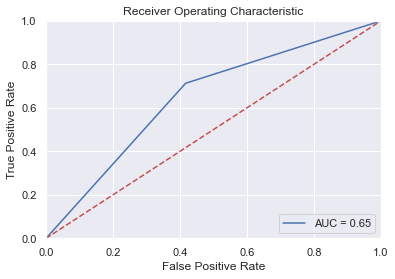

In [1021]:
from sklearn.metrics import *
matrix = confusion_matrix(y1_test, o)
print("Confusion Matrix: ")
print(matrix)
[[tn, fp], [fn, tp]] = matrix

acc_score = accuracy_score(y1_test, o)
precision = precision_score(y1_test, o)
recall = tpr = recall_score(y1_test, o)
f1 = f1_score(y1_test, o)
roc_score = roc_auc_score(y1_test, o)
spc = tnr = tn/(tn + fp)
fpr = fp/(fp + fn)
fnr = fn/(fn+tp)
plr = tpr/fpr
nlr = fnr/tnr
dor = plr/nlr
npv = tn/(fn+tn)
fr = fn/(fn+tn)

print("Accuracy: ", acc_score)
print("Specificity: ", spc)
print("Precision/Positive Predictive Value: ", precision)
print("Negative Predictive Value: ", npv)
print("Recall/Sensitivity: ", recall)
print("False Positive Rate: ", fpr)
print("False Negative Rate: ", fnr)
print("Positive Likelihood Ratio: ", plr)
print("Negative Likelihod Ratio: ", nlr)
print("Diagnostic Odds Ratio: ", dor)
print("False Omission Rate: ", fr)
print("F1 Score: ", f1)
print("Area under ROC curve: ", roc_score)


fpr, tpr, threshold = roc_curve(y1_test, o)
roc_auc = auc(fpr, tpr)

import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [1022]:
X1_test=np.reshape(X1_test,(X1_test.shape[0],X1_test.shape[2]))
y1_test=pd.DataFrame(y1_test)
X1_test=pd.DataFrame(X1_test)

In [1023]:
X1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_fcl_2mon.xlsx")
y1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_fcl_2mon.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_fcl_2mon.xlsx")

In [1024]:
df_x=df_feature_scaler[3990:]
df_y=df_label[3990:]
df_x=df_x.to_numpy()
df_y=df_y.to_numpy()
df_x=np.reshape(df_x,(df_x.shape[0],1,df_x.shape[1]))

In [1025]:
yp = modelfcl.predict(df_x)
yp[:5]

array([[0.9988868 ],
       [1.        ],
       [0.2250047 ],
       [0.99936944],
       [0.76051223]], dtype=float32)

In [1026]:
y_pred1 = []
for element in yp:
    if element > 0.5:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [1027]:
y_pred1[:10]

[1, 1, 0, 1, 1, 1, 0, 0, 0, 1]

In [1028]:
df_y[:10]

array([1, 1, 0, 1, 1, 1, 1, 0, 0, 1], dtype=int64)

In [1029]:
y_pred1=pd.DataFrame(y_pred1)
df_x=np.reshape(df_x,(df_x.shape[0],df_x.shape[2]))
df_x=pd.DataFrame(df_x)
df_y=pd.DataFrame(df_y)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_fcl_2mon_test.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_fcl_2mon_test.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_fcl_2mon_test.xlsx")

In [1030]:
# 6 months

In [1031]:
df = pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/6 months.csv")
df.sample(5)

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result10
2665,EVEREST KANTO CYLINDER LTD.,EKC,32970,870033.0,0,0.0,32970,870033.0,26.39,11-01-2019,...,5.23,0.06,54.0,22.0,-76.0,12.0,5.48,Packaging,LOSS,LOSS
1339,MRO-TEK Realty Ltd,MRO-TEK,20895,847989.0,0,0.0,20895,847989.0,40.58,07-01-2018,...,3.85,0.34,10.0,1.0,-10.0,8.0,11.00,Computers - Hardware,PROFIT,LOSS
2989,BOMBAY BURMAH TRADING CORP.LTD.,BBTC,3000,2132978.0,0,0.0,3000,2132978.0,710.99,04-01-2020,...,89.00,0.37,1104.0,-772.0,-368.0,1841.0,8.05,Diversified - Large,PROFIT,PROFIT
160,SUMMIT SECURITIES LTD.,SUMMITSEC,14327,3462440.0,0,0.0,14327,3462440.0,241.67,03-01-2016,...,22.61,0.05,24.0,-22.0,0.0,25.0,11.79,Finance & Investments,PROFIT,PROFIT
1629,TATA CONSULTANCY SERVICES LTD.,TCS,1000,2067630.0,0,0.0,1000,2067630.0,2067.63,10-01-2018,...,67.46,0.39,25067.0,3104.0,-26885.0,34092.0,0.15,Computers - Software - Large,LOSS,LOSS


In [1032]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result']=df['Result'].map(r)

In [1033]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            2
No of shares             0
Value                    0
Avg Price                0
Buy Date                 0
Sell date                0
Buy price                0
Sell price               0
Nifty Index at buying    0
Nfty index at selling    0
Change in Nifty 50       0
Return                   0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Result                   0
Result10                 0
dtype: int64
Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares so

In [1034]:
df['Cap']

0       0
1       0
2       1
3       0
4       0
       ..
4066    2
4067    0
4068    0
4069    0
4070    1
Name: Cap, Length: 4069, dtype: int64

In [1035]:
df.drop('Buy Date',axis=1,inplace=True)
df.drop('Sell date',axis=1,inplace=True)
df.drop('Row Labels',axis=1,inplace=True)
#df.drop('Symbol',axis=1,inplace=True)
#df.drop('Return %',axis=1,inplace=True)
df.drop('Return',axis=1,inplace=True)
df.drop('Sell price',axis=1,inplace=True)
df.drop('Result10',axis=1,inplace=True)
#df.drop('Nifty Index at buying',axis=1,inplace=True)
#df.drop('Nfty index at selling',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)

In [1036]:
df['code']=pd.factorize(df['Symbol'])[0] + 1
df.drop('Symbol',axis=1,inplace=True)

In [1037]:
df_feature = df.drop('Result',axis='columns')
df_label = df['Result']

In [1038]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.133236,-0.106103,-0.047801,-0.081043,-0.130212,-0.104125,-0.090731,-0.455363,-0.681147,-0.814616,...,-0.021631,-0.065135,-0.219695,-0.122020,0.146417,0.000484,-0.170855,-0.085491,-1.173138,-1.406195
1,-0.140797,-0.090406,-0.047801,-0.081043,-0.137901,-0.088412,0.044707,1.829228,-0.681147,-0.814616,...,-0.021644,0.057697,0.728894,-0.049158,0.100029,-0.051379,-0.055526,-0.009718,-1.127087,-1.400179
2,2.332115,-0.086434,-0.047801,-0.081043,2.377162,-0.084435,-0.090721,-0.449345,1.239044,0.923055,...,-0.021625,-0.077842,-0.693990,0.537563,-0.772881,0.140014,-1.202220,-0.112871,-1.081036,-1.394163
3,0.501596,-0.096892,-0.047801,-0.081043,0.515442,-0.094904,-0.090542,-0.462831,-0.681147,-0.814616,...,-0.021645,-0.069690,-0.653082,-0.117549,0.150598,-0.012759,-0.174695,0.573498,-1.034984,-1.388146
4,0.039334,-0.010704,-0.047801,-0.081043,0.045300,-0.008627,-0.076367,-0.260697,-0.681147,-0.814616,...,-0.021645,-0.054941,0.491747,-0.019248,0.020090,-0.004200,-0.021843,-0.029615,-0.988933,-1.382130


In [1039]:
from sklearn.model_selection import train_test_split

X1_big, X1_test, y1_big, y1_test = train_test_split(df_feature_scaler, df_label, test_size=0.2, random_state=27)
#becase the data isn't too much, so I take the validation data from train data
X1_train, X1_val, y1_train, y1_val = train_test_split(X1_big, y1_big, test_size=0.2, random_state=27)

In [1040]:
print(X1_big.shape, X1_val.shape, X1_test.shape,X1_train.shape)

(3255, 24) (651, 24) (814, 24) (2604, 24)


In [1041]:
print(X1_train.shape, ',', X1_train.ndim, ',', type(X1_train))
print(y1_train.shape, ',', y1_train.ndim, ',', type(y1_train))
print(X1_test.shape, ',', X1_val.ndim, ',', type(X1_val))
print(y1_test.shape, ',', y1_val.ndim, ',', type(y1_val))

(2604, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(2604,) , 1 , <class 'pandas.core.series.Series'>
(814, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(814,) , 1 , <class 'pandas.core.series.Series'>


In [1042]:
X1_train=X1_train.to_numpy()
y1_train=y1_train.to_numpy()
X1_test=X1_test.to_numpy()
y1_test=y1_test.to_numpy()
X1_val=X1_val.to_numpy()
y1_val=y1_val.to_numpy()

In [1043]:
X1_train=np.reshape(X1_train,(X1_train.shape[0],1,X1_train.shape[1]))
X1_test=np.reshape(X1_test,(X1_test.shape[0],1,X1_test.shape[1]))

In [1044]:
X1_val=np.reshape(X1_val,(X1_val.shape[0],1,X1_val.shape[1]))
print(X1_val.shape,X1_test.shape,X1_train.shape)

(651, 1, 24) (814, 1, 24) (2604, 1, 24)


In [1045]:
df_feature_scaler.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4069 entries, 0 to 4068
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   No of Shares Bought    4069 non-null   float64
 1   Value of purchase      4069 non-null   float64
 2   No of shares sold      4069 non-null   float64
 3   Value of sale          4069 non-null   float64
 4   No of shares           4069 non-null   float64
 5   Value                  4069 non-null   float64
 6   Avg Price              4069 non-null   float64
 7   Buy price              4069 non-null   float64
 8   Nifty Index at buying  4069 non-null   float64
 9   Nfty index at selling  4069 non-null   float64
 10  No of shares.1         4069 non-null   float64
 11  Market Cap             4069 non-null   float64
 12  %age of Marketcap      4069 non-null   float64
 13  Cap                    4069 non-null   float64
 14  Deviation              4069 non-null   float64
 15  EPS 

In [1046]:
# Define model
# FULLY CONNECTED LAYER
from keras import models
from keras import layers
from keras import optimizers

epochs = 100

modelfcl = models.Sequential()
modelfcl.add(layers.Flatten(input_shape=(1,24)))
modelfcl.add(layers.Dense(256, activation='relu', input_dim=(1*24)))
modelfcl.add(layers.Dense(128, activation='relu'))
modelfcl.add(layers.Dense(64, activation='relu'))
modelfcl.add(layers.Dense(32, activation='relu'))
modelfcl.add(layers.Dropout(0.5))
modelfcl.add(layers.Dense(1, activation='sigmoid'))
modelfcl.summary()

Model: "sequential_27"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_1 (Flatten)          (None, 24)                0         
_________________________________________________________________
dense_85 (Dense)             (None, 256)               6400      
_________________________________________________________________
dense_86 (Dense)             (None, 128)               32896     
_________________________________________________________________
dense_87 (Dense)             (None, 64)                8256      
_________________________________________________________________
dense_88 (Dense)             (None, 32)                2080      
_________________________________________________________________
dropout_9 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_89 (Dense)             (None, 1)               

In [1047]:
# Compile model
modelfcl.compile(optimizer=optimizers.Adam(),
              loss='binary_crossentropy',
              metrics=['acc'])

In [1048]:
# Train model
history = modelfcl.fit(X1_train, y1_train,
                    epochs=100,
                    batch_size=50, 
                    validation_data=(X1_val, y1_val))

Epoch 1/100
53/53 [==============================] - 0s 6ms/step - loss: 0.6765 - acc: 0.5799 - val_loss: 0.6351 - val_acc: 0.7174
Epoch 2/100
53/53 [==============================] - 0s 2ms/step - loss: 0.5901 - acc: 0.7154 - val_loss: 0.5389 - val_acc: 0.7343
Epoch 3/100
53/53 [==============================] - 0s 3ms/step - loss: 0.5438 - acc: 0.7442 - val_loss: 0.5313 - val_acc: 0.7619
Epoch 4/100
53/53 [==============================] - 0s 3ms/step - loss: 0.5115 - acc: 0.7600 - val_loss: 0.5445 - val_acc: 0.7542
Epoch 5/100
53/53 [==============================] - 0s 3ms/step - loss: 0.4922 - acc: 0.7757 - val_loss: 0.5189 - val_acc: 0.7650
Epoch 6/100
53/53 [==============================] - 0s 3ms/step - loss: 0.5066 - acc: 0.7704 - val_loss: 0.5369 - val_acc: 0.7619
Epoch 7/100
53/53 [==============================] - 0s 2ms/step - loss: 0.4982 - acc: 0.7669 - val_loss: 0.5500 - val_acc: 0.7665
Epoch 8/100
53/53 [==============================] - 0s 2ms/step - loss: 0.4900 - a

In [1049]:
test_loss, test_accuracy = modelfcl.evaluate(X1_test, y1_test)
print("Test loss: {0:.2f} and Test accuracy: {1:.2f}% ".format(test_loss,test_accuracy*100))

26/26 [==============================] - 0s 1ms/step - loss: 1.4389 - acc: 0.7334
Test loss: 1.44 and Test accuracy: 73.34% 


In [1050]:
yp = modelfcl.predict(X1_test)
yp[:5]

array([[2.3950735e-01],
       [9.6616691e-01],
       [3.9899349e-04],
       [9.5611906e-01],
       [8.6516213e-01]], dtype=float32)

In [1051]:
y_pred=[]
for element in yp:
    if element>0.5:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [1052]:
y_pred=pd.DataFrame(y_pred)

In [1053]:
y_pred[:10]

,0
0,0
1,1
2,0
3,1
4,1
5,1
6,1
7,1
8,1
9,1


In [1054]:
y1_test[:10]

array([0, 0, 0, 1, 1, 1, 1, 0, 1, 0], dtype=int64)

Text(66.5, 0.5, 'Truth')

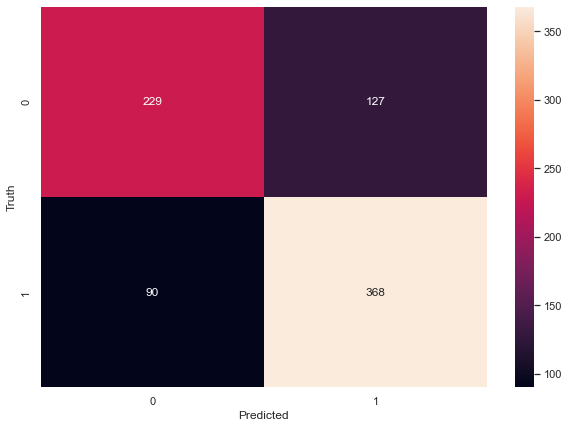

In [1055]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=y1_test,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

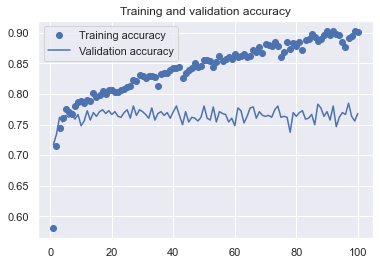

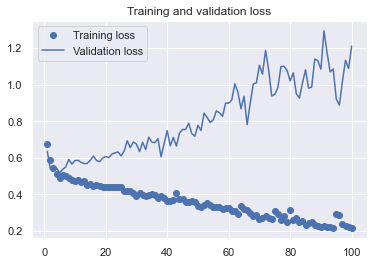

In [1056]:
# Plot results
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc)+1)

plt.plot(epochs, acc, 'bo', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [1057]:
#Fully Connected Layer Model in Action
predict=modelfcl.predict(X1_test)
predict

array([[2.39507347e-01],
       [9.66166914e-01],
       [3.98993492e-04],
       [9.56119061e-01],
       [8.65162134e-01],
       [1.00000000e+00],
       [9.99162555e-01],
       [8.05453181e-01],
       [9.98565912e-01],
       [9.14711118e-01],
       [4.25358325e-01],
       [8.07370543e-01],
       [1.00000000e+00],
       [1.72791243e-01],
       [3.66638899e-02],
       [5.68282485e-01],
       [4.47777659e-01],
       [9.35951829e-01],
       [9.49988782e-01],
       [2.89345622e-01],
       [7.06662118e-01],
       [3.82571638e-01],
       [1.00000000e+00],
       [6.71505153e-01],
       [9.18604493e-01],
       [8.39548230e-01],
       [5.34481585e-01],
       [9.98999774e-01],
       [3.52233648e-04],
       [7.96528697e-01],
       [5.80272079e-03],
       [5.58537245e-03],
       [8.30699086e-01],
       [3.52964640e-01],
       [8.99560452e-01],
       [7.09812045e-01],
       [3.54195237e-02],
       [3.93608212e-03],
       [9.86806929e-01],
       [9.99999702e-01],


In [1058]:
# Define function to visualize predictions
def test_output(classifier):
    result = []
    for f in X1_test:
      try:
          prediction = classifier.predict(f)
      except:
          prediction = classifier.predict(f.reshape(1,1,21))
      if(prediction < 0.5):
        result.append(0)
      else:
        result.append(1)
        
    return result
o = test_output(modelfcl)

Confusion Matrix: 
[[229 127]
 [ 90 368]]
Accuracy:  0.7334152334152334
Specificity:  0.6432584269662921
Precision/Positive Predictive Value:  0.7434343434343434
Negative Predictive Value:  0.7178683385579937
Recall/Sensitivity:  0.8034934497816594
False Positive Rate:  0.5852534562211982
False Negative Rate:  0.1965065502183406
Positive Likelihood Ratio:  1.372898256713544
Negative Likelihod Ratio:  0.30548616540493123
Diagnostic Odds Ratio:  4.494142164813668
False Omission Rate:  0.28213166144200624
F1 Score:  0.7722980062959076
Area under ROC curve:  0.7233759383739758


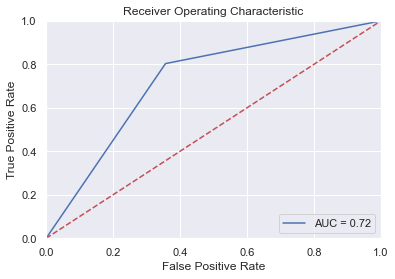

In [1059]:
from sklearn.metrics import *
matrix = confusion_matrix(y1_test, o)
print("Confusion Matrix: ")
print(matrix)
[[tn, fp], [fn, tp]] = matrix

acc_score = accuracy_score(y1_test, o)
precision = precision_score(y1_test, o)
recall = tpr = recall_score(y1_test, o)
f1 = f1_score(y1_test, o)
roc_score = roc_auc_score(y1_test, o)
spc = tnr = tn/(tn + fp)
fpr = fp/(fp + fn)
fnr = fn/(fn+tp)
plr = tpr/fpr
nlr = fnr/tnr
dor = plr/nlr
npv = tn/(fn+tn)
fr = fn/(fn+tn)

print("Accuracy: ", acc_score)
print("Specificity: ", spc)
print("Precision/Positive Predictive Value: ", precision)
print("Negative Predictive Value: ", npv)
print("Recall/Sensitivity: ", recall)
print("False Positive Rate: ", fpr)
print("False Negative Rate: ", fnr)
print("Positive Likelihood Ratio: ", plr)
print("Negative Likelihod Ratio: ", nlr)
print("Diagnostic Odds Ratio: ", dor)
print("False Omission Rate: ", fr)
print("F1 Score: ", f1)
print("Area under ROC curve: ", roc_score)


fpr, tpr, threshold = roc_curve(y1_test, o)
roc_auc = auc(fpr, tpr)

import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [1060]:
X1_test=np.reshape(X1_test,(X1_test.shape[0],X1_test.shape[2]))
y1_test=pd.DataFrame(y1_test)
X1_test=pd.DataFrame(X1_test)

In [1061]:
X1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_fcl_6mon.xlsx")
y1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_fcl_6mon.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_fcl_6mon.xlsx")

In [1062]:
df_x=df_feature_scaler[3806:]
df_y=df_label[3806:]
df_x=df_x.to_numpy()
df_y=df_y.to_numpy()
df_x=np.reshape(df_x,(df_x.shape[0],1,df_x.shape[1]))

In [1063]:
yp = modelfcl.predict(df_x)
yp[:5]

array([[0.9996954 ],
       [0.9997357 ],
       [0.9400596 ],
       [0.99904656],
       [0.99981475]], dtype=float32)

In [1064]:
y_pred1 = []
for element in yp:
    if element > 0.5:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [1065]:
y_pred1[:10]

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

In [1066]:
df_y[:10]

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int64)

In [1067]:
y_pred1=pd.DataFrame(y_pred1)
df_x=np.reshape(df_x,(df_x.shape[0],df_x.shape[2]))
df_x=pd.DataFrame(df_x)
df_y=pd.DataFrame(df_y)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_fcl_6mon_test.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_fcl_6mon_test.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_fcl_6mon_test.xlsx")

In [1068]:
# 9 months

In [1069]:
df = pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/9 months.csv")
df.sample(5)

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result13
139,INDIAN METALS & FERRO ALLOYS LTD.,IMFA,3000,312329.79,0,0.0,3000,312329.79,104.11,03-01-2016,...,0.71,0.07,174.0,-43.0,-113.0,26.0,79.93,Mining / Minerals / Metals,PROFIT,PROFIT
2883,S Chand and Company Ltd,SCHAND,5000,454939.00,0,0.0,5000,454939.00,90.99,02-01-2020,...,-19.13,-0.04,39.0,-84.0,39.0,-95.0,-4.52,Printing & Stationery,LOSS,LOSS
3356,GANDHI SPECIAL TUBES LTD.-$,GANDHITUBE,2000,454000.00,0,0.0,2000,454000.00,227.00,09-01-2020,...,16.54,0.15,19.0,56.0,-76.0,26.0,13.55,Steel - Medium / Small,PROFIT,PROFIT
906,LA OPALA RG LTD.,LAOPALA,3948,2058278.00,0,0.0,3948,2058278.00,521.35,11-01-2017,...,5.60,0.26,72.0,-52.0,-19.0,86.0,46.74,Glass & Glass Products,LOSS,LOSS
1415,MAHARASHTRA SEAMLESS LTD.,MAHSEAMLES,143039,64507153.81,0,0.0,143039,64507153.81,450.98,08-01-2018,...,31.45,0.09,93.0,13.0,-95.0,292.0,14.92,Steel - Medium / Small,LOSS,LOSS


In [1070]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result']=df['Result'].map(r)

In [1071]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            2
No of shares             0
Value                    0
Avg Price                0
Buy Date                 0
Sell date                0
Buy price                0
Sell price               0
Nifty Index at buying    0
Nfty index at selling    0
Change in Nifty 50       0
Return                   0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Result                   0
Result13                 0
dtype: int64
Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares so

In [1072]:
df['Cap']

0       0
1       0
2       1
3       0
4       0
       ..
3927    0
3928    0
3929    0
3930    1
3931    0
Name: Cap, Length: 3930, dtype: int64

In [1073]:
df.drop('Buy Date',axis=1,inplace=True)
df.drop('Sell date',axis=1,inplace=True)
df.drop('Row Labels',axis=1,inplace=True)
#df.drop('Symbol',axis=1,inplace=True)
#df.drop('Return %',axis=1,inplace=True)
df.drop('Return',axis=1,inplace=True)
df.drop('Sell price',axis=1,inplace=True)
df.drop('Result13',axis=1,inplace=True)
#df.drop('Nifty Index at buying',axis=1,inplace=True)
#df.drop('Nfty index at selling',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)

In [1074]:
df['code']=pd.factorize(df['Symbol'])[0] + 1
df.drop('Symbol',axis=1,inplace=True)

In [1075]:
df_feature = df.drop('Result',axis='columns')
df_label = df['Result']

In [1076]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.130340,-0.104660,-0.047655,-0.07972,-0.127341,-0.102724,-0.088595,-0.462558,-0.670799,-0.625330,...,-0.017149,-0.126163,-0.218315,-0.118179,0.144161,-0.004288,-0.163808,-0.082390,-1.174266,-1.409639
1,-0.137344,-0.088224,-0.047655,-0.07972,-0.134451,-0.086269,0.045684,1.947347,-0.670799,-0.625330,...,-0.017177,0.182627,0.720264,-0.045201,0.097982,-0.056017,-0.050900,-0.007642,-1.127962,-1.403525
2,2.153616,-0.084064,-0.047655,-0.07972,2.191031,-0.082105,-0.088586,-0.456210,1.353829,1.120459,...,-0.017135,-0.158108,-0.687605,0.542457,-0.771012,0.134879,-1.173527,-0.109400,-1.081658,-1.397411
3,0.457783,-0.095015,-0.047655,-0.07972,0.469645,-0.093068,-0.088408,-0.470435,-0.670799,-0.625330,...,-0.017178,-0.137614,-0.628944,-0.113701,0.148323,-0.017498,-0.167568,0.567691,-1.035354,-1.391297
4,0.029533,-0.004766,-0.047655,-0.07972,0.034941,-0.002717,-0.074354,-0.257214,-0.670799,-0.625330,...,-0.017178,-0.100536,0.485619,-0.015243,0.018401,-0.008961,-0.017924,-0.027269,-0.989051,-1.385183


In [1077]:
from sklearn.model_selection import train_test_split

X1_big, X1_test, y1_big, y1_test = train_test_split(df_feature_scaler, df_label, test_size=0.2, random_state=27)
#becase the data isn't too much, so I take the validation data from train data
X1_train, X1_val, y1_train, y1_val = train_test_split(X1_big, y1_big, test_size=0.2, random_state=27)

In [1078]:
print(X1_big.shape, X1_val.shape, X1_test.shape,X1_train.shape)

(3144, 24) (629, 24) (786, 24) (2515, 24)


In [1079]:
print(X1_train.shape, ',', X1_train.ndim, ',', type(X1_train))
print(y1_train.shape, ',', y1_train.ndim, ',', type(y1_train))
print(X1_test.shape, ',', X1_val.ndim, ',', type(X1_val))
print(y1_test.shape, ',', y1_val.ndim, ',', type(y1_val))

(2515, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(2515,) , 1 , <class 'pandas.core.series.Series'>
(786, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(786,) , 1 , <class 'pandas.core.series.Series'>


In [1080]:
X1_train=X1_train.to_numpy()
y1_train=y1_train.to_numpy()
X1_test=X1_test.to_numpy()
y1_test=y1_test.to_numpy()
X1_val=X1_val.to_numpy()
y1_val=y1_val.to_numpy()

In [1081]:
X1_train=np.reshape(X1_train,(X1_train.shape[0],1,X1_train.shape[1]))
X1_test=np.reshape(X1_test,(X1_test.shape[0],1,X1_test.shape[1]))

In [1082]:
X1_val=np.reshape(X1_val,(X1_val.shape[0],1,X1_val.shape[1]))
print(X1_val.shape,X1_test.shape,X1_train.shape)

(629, 1, 24) (786, 1, 24) (2515, 1, 24)


In [1083]:
df_feature_scaler.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3930 entries, 0 to 3929
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   No of Shares Bought    3930 non-null   float64
 1   Value of purchase      3930 non-null   float64
 2   No of shares sold      3930 non-null   float64
 3   Value of sale          3930 non-null   float64
 4   No of shares           3930 non-null   float64
 5   Value                  3930 non-null   float64
 6   Avg Price              3930 non-null   float64
 7   Buy price              3930 non-null   float64
 8   Nifty Index at buying  3930 non-null   float64
 9   Nfty index at selling  3930 non-null   float64
 10  No of shares.1         3930 non-null   float64
 11  Market Cap             3930 non-null   float64
 12  %age of Marketcap      3930 non-null   float64
 13  Cap                    3930 non-null   float64
 14  Deviation              3930 non-null   float64
 15  EPS 

In [1084]:
# Define model
# FULLY CONNECTED LAYER
from keras import models
from keras import layers
from keras import optimizers

epochs = 100

modelfcl = models.Sequential()
modelfcl.add(layers.Flatten(input_shape=(1,24)))
modelfcl.add(layers.Dense(256, activation='relu', input_dim=(1*24)))
modelfcl.add(layers.Dense(128, activation='relu'))
modelfcl.add(layers.Dense(64, activation='relu'))
modelfcl.add(layers.Dense(32, activation='relu'))
modelfcl.add(layers.Dropout(0.5))
modelfcl.add(layers.Dense(1, activation='sigmoid'))
modelfcl.summary()

Model: "sequential_28"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_2 (Flatten)          (None, 24)                0         
_________________________________________________________________
dense_90 (Dense)             (None, 256)               6400      
_________________________________________________________________
dense_91 (Dense)             (None, 128)               32896     
_________________________________________________________________
dense_92 (Dense)             (None, 64)                8256      
_________________________________________________________________
dense_93 (Dense)             (None, 32)                2080      
_________________________________________________________________
dropout_10 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_94 (Dense)             (None, 1)               

In [1085]:
# Compile model
modelfcl.compile(optimizer=optimizers.Adam(),
              loss='binary_crossentropy',
              metrics=['acc'])

In [1086]:
# Train model
history = modelfcl.fit(X1_train, y1_train,
                    epochs=100,
                    batch_size=50, 
                    validation_data=(X1_val, y1_val))

Epoch 1/100
51/51 [==============================] - 0s 6ms/step - loss: 0.6479 - acc: 0.6429 - val_loss: 0.5868 - val_acc: 0.7170
Epoch 2/100
51/51 [==============================] - 0s 2ms/step - loss: 0.5294 - acc: 0.7547 - val_loss: 0.4979 - val_acc: 0.7695
Epoch 3/100
51/51 [==============================] - 0s 2ms/step - loss: 0.4907 - acc: 0.7785 - val_loss: 0.4767 - val_acc: 0.7933
Epoch 4/100
51/51 [==============================] - 0s 2ms/step - loss: 0.4826 - acc: 0.7901 - val_loss: 0.4891 - val_acc: 0.7886
Epoch 5/100
51/51 [==============================] - 0s 2ms/step - loss: 0.4793 - acc: 0.7877 - val_loss: 0.4971 - val_acc: 0.7854
Epoch 6/100
51/51 [==============================] - 0s 2ms/step - loss: 0.4604 - acc: 0.8016 - val_loss: 0.5048 - val_acc: 0.7933
Epoch 7/100
51/51 [==============================] - 0s 2ms/step - loss: 0.4534 - acc: 0.8004 - val_loss: 0.4865 - val_acc: 0.7838
Epoch 8/100
51/51 [==============================] - 0s 2ms/step - loss: 0.4578 - a

In [1087]:
test_loss, test_accuracy = modelfcl.evaluate(X1_test, y1_test)
print("Test loss: {0:.2f} and Test accuracy: {1:.2f}% ".format(test_loss,test_accuracy*100))

25/25 [==============================] - 0s 1ms/step - loss: 1.3110 - acc: 0.7863
Test loss: 1.31 and Test accuracy: 78.63% 


In [1088]:
yp = modelfcl.predict(X1_test)
yp[:5]

array([[0.57193315],
       [0.3887566 ],
       [0.05015308],
       [0.9878282 ],
       [0.99968785]], dtype=float32)

In [1089]:
y_pred=[]
for element in yp:
    if element>0.5:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [1090]:
y_pred=pd.DataFrame(y_pred)

In [1091]:
y_pred[:10]

,0
0,1
1,0
2,0
3,1
4,1
5,1
6,1
7,1
8,0
9,1


In [1092]:
y1_test[:10]

array([0, 1, 0, 0, 1, 1, 1, 1, 0, 1], dtype=int64)

Text(66.5, 0.5, 'Truth')

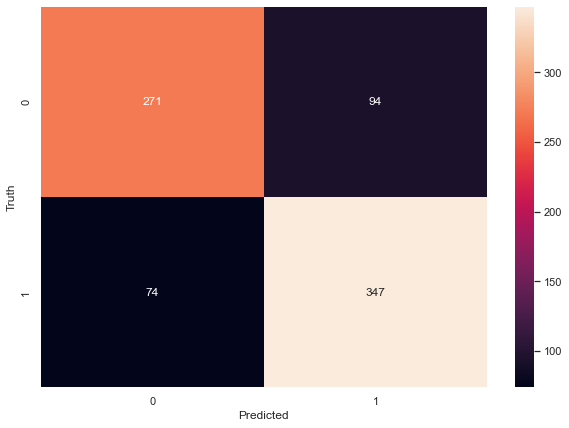

In [1093]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=y1_test,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

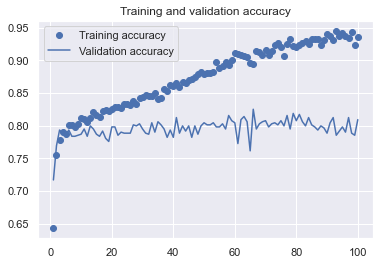

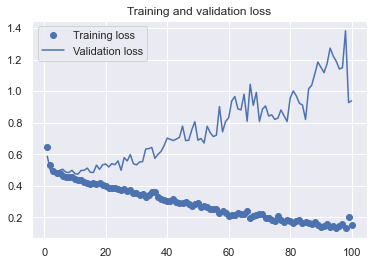

In [1094]:
# Plot results
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc)+1)

plt.plot(epochs, acc, 'bo', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [1095]:
#Fully Connected Layer Model in Action
predict=modelfcl.predict(X1_test)
predict

array([[5.71933150e-01],
       [3.88756603e-01],
       [5.01530766e-02],
       [9.87828195e-01],
       [9.99687850e-01],
       [9.99941349e-01],
       [9.99982715e-01],
       [1.00000000e+00],
       [1.81141734e-01],
       [9.99880195e-01],
       [9.99992132e-01],
       [8.53776813e-01],
       [9.63507175e-01],
       [1.25744773e-15],
       [9.43544805e-02],
       [2.30401754e-04],
       [1.16983354e-02],
       [7.63205026e-05],
       [9.99635220e-01],
       [9.99996424e-01],
       [8.74208331e-01],
       [1.95297480e-01],
       [4.74619836e-01],
       [1.79376841e-01],
       [8.03299308e-01],
       [3.80028993e-01],
       [3.99200737e-01],
       [2.99189105e-05],
       [9.42617655e-04],
       [1.05153431e-05],
       [8.39171052e-01],
       [7.09521949e-01],
       [6.44245744e-03],
       [8.44222307e-03],
       [3.29378098e-01],
       [9.34721410e-01],
       [9.98749614e-01],
       [1.08119845e-03],
       [9.99989390e-01],
       [6.92478861e-05],


In [1096]:
# Define function to visualize predictions
def test_output(classifier):
    result = []
    for f in X1_test:
      try:
          prediction = classifier.predict(f)
      except:
          prediction = classifier.predict(f.reshape(1,1,21))
      if(prediction < 0.5):
        result.append(0)
      else:
        result.append(1)
        
    return result
o = test_output(modelfcl)

Confusion Matrix: 
[[271  94]
 [ 74 347]]
Accuracy:  0.7862595419847328
Specificity:  0.7424657534246575
Precision/Positive Predictive Value:  0.7868480725623582
Negative Predictive Value:  0.7855072463768116
Recall/Sensitivity:  0.8242280285035629
False Positive Rate:  0.5595238095238095
False Negative Rate:  0.17577197149643706
Positive Likelihood Ratio:  1.47308839136807
Negative Likelihod Ratio:  0.23674084721844846
Diagnostic Odds Ratio:  6.222366814497388
False Omission Rate:  0.2144927536231884
F1 Score:  0.8051044083526683
Area under ROC curve:  0.7833468909641101


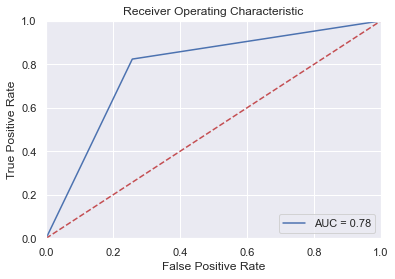

In [1097]:
from sklearn.metrics import *
matrix = confusion_matrix(y1_test, o)
print("Confusion Matrix: ")
print(matrix)
[[tn, fp], [fn, tp]] = matrix

acc_score = accuracy_score(y1_test, o)
precision = precision_score(y1_test, o)
recall = tpr = recall_score(y1_test, o)
f1 = f1_score(y1_test, o)
roc_score = roc_auc_score(y1_test, o)
spc = tnr = tn/(tn + fp)
fpr = fp/(fp + fn)
fnr = fn/(fn+tp)
plr = tpr/fpr
nlr = fnr/tnr
dor = plr/nlr
npv = tn/(fn+tn)
fr = fn/(fn+tn)

print("Accuracy: ", acc_score)
print("Specificity: ", spc)
print("Precision/Positive Predictive Value: ", precision)
print("Negative Predictive Value: ", npv)
print("Recall/Sensitivity: ", recall)
print("False Positive Rate: ", fpr)
print("False Negative Rate: ", fnr)
print("Positive Likelihood Ratio: ", plr)
print("Negative Likelihod Ratio: ", nlr)
print("Diagnostic Odds Ratio: ", dor)
print("False Omission Rate: ", fr)
print("F1 Score: ", f1)
print("Area under ROC curve: ", roc_score)


fpr, tpr, threshold = roc_curve(y1_test, o)
roc_auc = auc(fpr, tpr)

import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [1098]:
X1_test=np.reshape(X1_test,(X1_test.shape[0],X1_test.shape[2]))
y1_test=pd.DataFrame(y1_test)
X1_test=pd.DataFrame(X1_test)

In [1099]:
X1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_fcl_9mon.xlsx")
y1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_fcl_9mon.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_fcl_9mon.xlsx")

In [1100]:
df_x=df_feature_scaler[3718:]
df_y=df_label[3718:]
df_x=df_x.to_numpy()
df_y=df_y.to_numpy()
df_x=np.reshape(df_x,(df_x.shape[0],1,df_x.shape[1]))

In [1101]:
yp = modelfcl.predict(df_x)
yp[:5]

array([[0.2842249],
       [0.8844464],
       [1.       ],
       [0.9996815],
       [0.9999628]], dtype=float32)

In [1102]:
y_pred1 = []
for element in yp:
    if element > 0.5:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [1103]:
y_pred1[:10]

[0, 1, 1, 1, 1, 1, 1, 1, 1, 1]

In [1104]:
df_y[:10]

array([0, 0, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int64)

In [1105]:
y_pred1=pd.DataFrame(y_pred1)
df_x=np.reshape(df_x,(df_x.shape[0],df_x.shape[2]))
df_x=pd.DataFrame(df_x)
df_y=pd.DataFrame(df_y)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_fcl_9mon_test.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_fcl_9mon_test.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_fcl_9mon_test.xlsx")

In [1106]:
# 12 months

In [1107]:
df = pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/12_months.csv")
df.sample(5)

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result15
3616,REPRO INDIA LTD.,REPRO,15849,5729371.00,0,0.0,15849,5729371.00,361.50,12-01-2020,...,15.55,0.06,63.0,-55.0,-6.0,18.0,22.20,Printing & Stationery,PROFIT,PROFIT
3392,SURYA ROSHNI LTD.,SURYAROSNI,456550,66085700.00,0,0.0,456550,66085700.00,144.75,09-01-2020,...,18.79,0.11,276.0,-48.0,-229.0,140.0,9.15,Steel - Large,PROFIT,PROFIT
2202,PLASTIBLENDS INDIA LTD.-$,PLASTIBLEN,27000,5197462.00,0,0.0,27000,5197462.00,192.50,04-01-2019,...,10.51,0.14,15.0,-17.0,3.0,38.0,18.36,Chemicals,LOSS,LOSS
572,BHANSALI ENGINEERING POLYMERS LTD.-$,BEPL,1770000,41074449.77,0,0.0,1770000,41074449.77,23.21,03-01-2017,...,0.98,0.18,56.0,-35.0,-23.0,23.0,23.78,Petrochemicals,PROFIT,PROFIT
1798,ECLERX SERVICES LTD.,ECLERX,61000,64358992.17,0,0.0,61000,64358992.17,1055.07,12-01-2018,...,75.07,0.29,305.0,26.0,-304.0,380.0,13.53,Computers - Software - Medium / Small,LOSS,LOSS


In [1108]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result']=df['Result'].map(r)

In [1109]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            2
No of shares             0
Value                    0
Avg Price                0
Buy Date                 0
Sell date                0
Buy price                0
Sell price               0
Nifty Index at buying    0
Nfty index at selling    0
Change in Nifty 50       0
Return                   0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Result                   0
Result15                 0
dtype: int64
Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares so

In [1110]:
df['Cap']

0       0
1       0
2       1
3       0
4       0
       ..
3797    0
3798    0
3799    0
3800    0
3801    0
Name: Cap, Length: 3800, dtype: int64

In [1111]:
df.drop('Buy Date',axis=1,inplace=True)
df.drop('Sell date',axis=1,inplace=True)
df.drop('Row Labels',axis=1,inplace=True)
#df.drop('Symbol',axis=1,inplace=True)
#df.drop('Return %',axis=1,inplace=True)
df.drop('Return',axis=1,inplace=True)
df.drop('Sell price',axis=1,inplace=True)
df.drop('Result15',axis=1,inplace=True)
#df.drop('Nifty Index at buying',axis=1,inplace=True)
#df.drop('Nfty index at selling',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)

In [1112]:
df['code']=pd.factorize(df['Symbol'])[0] + 1
df.drop('Symbol',axis=1,inplace=True)

In [1113]:
df_feature = df.drop('Result',axis='columns')
df_label = df['Result']

In [1114]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.129914,-0.104780,-0.048032,-0.079303,-0.126863,-0.102859,-0.089025,-0.461750,-0.662357,-0.572845,...,-0.017137,-0.126859,-0.226424,-0.115510,0.144622,-0.009644,-0.164139,-0.083690,-1.176468,-1.412928
1,-0.136837,-0.088606,-0.048032,-0.079303,-0.133892,-0.086667,0.043030,1.941249,-0.662357,-0.572845,...,-0.017165,0.176922,0.707855,-0.042332,0.099079,-0.061441,-0.052840,-0.010078,-1.130019,-1.406739
2,2.127667,-0.084513,-0.048032,-0.079303,2.165097,-0.082569,-0.089015,-0.455420,1.413796,1.421866,...,-0.017123,-0.158286,-0.693564,0.546931,-0.757928,0.129707,-1.159471,-0.110290,-1.083570,-1.400550
3,0.451418,-0.095289,-0.048032,-0.079303,0.463321,-0.093357,-0.088840,-0.469605,-0.662357,-0.572845,...,-0.017165,-0.138124,-0.635172,-0.111020,0.148727,-0.022871,-0.167845,0.556506,-1.037121,-1.394361
4,0.028113,-0.006480,-0.048032,-0.079303,0.033570,-0.004447,-0.075019,-0.256994,-0.662357,-0.572845,...,-0.017166,-0.101647,0.474285,-0.012293,0.020597,-0.014322,-0.020333,-0.029407,-0.990672,-1.388172


In [1115]:
from sklearn.model_selection import train_test_split

X1_big, X1_test, y1_big, y1_test = train_test_split(df_feature_scaler, df_label, test_size=0.2, random_state=27)
#becase the data isn't too much, so I take the validation data from train data
X1_train, X1_val, y1_train, y1_val = train_test_split(X1_big, y1_big, test_size=0.2, random_state=27)

In [1116]:
print(X1_big.shape, X1_val.shape, X1_test.shape,X1_train.shape)

(3040, 24) (608, 24) (760, 24) (2432, 24)


In [1117]:
print(X1_train.shape, ',', X1_train.ndim, ',', type(X1_train))
print(y1_train.shape, ',', y1_train.ndim, ',', type(y1_train))
print(X1_test.shape, ',', X1_val.ndim, ',', type(X1_val))
print(y1_test.shape, ',', y1_val.ndim, ',', type(y1_val))

(2432, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(2432,) , 1 , <class 'pandas.core.series.Series'>
(760, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(760,) , 1 , <class 'pandas.core.series.Series'>


In [1118]:
X1_train=X1_train.to_numpy()
y1_train=y1_train.to_numpy()
X1_test=X1_test.to_numpy()
y1_test=y1_test.to_numpy()
X1_val=X1_val.to_numpy()
y1_val=y1_val.to_numpy()

In [1119]:
X1_train=np.reshape(X1_train,(X1_train.shape[0],1,X1_train.shape[1]))
X1_test=np.reshape(X1_test,(X1_test.shape[0],1,X1_test.shape[1]))

In [1120]:
X1_val=np.reshape(X1_val,(X1_val.shape[0],1,X1_val.shape[1]))
print(X1_val.shape,X1_test.shape,X1_train.shape)

(608, 1, 24) (760, 1, 24) (2432, 1, 24)


In [1121]:
df_feature_scaler.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3800 entries, 0 to 3799
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   No of Shares Bought    3800 non-null   float64
 1   Value of purchase      3800 non-null   float64
 2   No of shares sold      3800 non-null   float64
 3   Value of sale          3800 non-null   float64
 4   No of shares           3800 non-null   float64
 5   Value                  3800 non-null   float64
 6   Avg Price              3800 non-null   float64
 7   Buy price              3800 non-null   float64
 8   Nifty Index at buying  3800 non-null   float64
 9   Nfty index at selling  3800 non-null   float64
 10  No of shares.1         3800 non-null   float64
 11  Market Cap             3800 non-null   float64
 12  %age of Marketcap      3800 non-null   float64
 13  Cap                    3800 non-null   float64
 14  Deviation              3800 non-null   float64
 15  EPS 

In [1122]:
# Define model
# FULLY CONNECTED LAYER
from keras import models
from keras import layers
from keras import optimizers

epochs = 100

modelfcl = models.Sequential()
modelfcl.add(layers.Flatten(input_shape=(1,24)))
modelfcl.add(layers.Dense(256, activation='relu', input_dim=(1*24)))
modelfcl.add(layers.Dense(128, activation='relu'))
modelfcl.add(layers.Dense(64, activation='relu'))
modelfcl.add(layers.Dense(32, activation='relu'))
modelfcl.add(layers.Dropout(0.5))
modelfcl.add(layers.Dense(1, activation='sigmoid'))
modelfcl.summary()

Model: "sequential_29"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_3 (Flatten)          (None, 24)                0         
_________________________________________________________________
dense_95 (Dense)             (None, 256)               6400      
_________________________________________________________________
dense_96 (Dense)             (None, 128)               32896     
_________________________________________________________________
dense_97 (Dense)             (None, 64)                8256      
_________________________________________________________________
dense_98 (Dense)             (None, 32)                2080      
_________________________________________________________________
dropout_11 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_99 (Dense)             (None, 1)               

In [1123]:
# Compile model
modelfcl.compile(optimizer=optimizers.Adam(),
              loss='binary_crossentropy',
              metrics=['acc'])

In [1124]:
# Train model
history = modelfcl.fit(X1_train, y1_train,
                    epochs=100,
                    batch_size=50, 
                    validation_data=(X1_val, y1_val))

Epoch 1/100
49/49 [==============================] - 0s 6ms/step - loss: 0.6296 - acc: 0.6715 - val_loss: 0.5190 - val_acc: 0.7582
Epoch 2/100
49/49 [==============================] - 0s 2ms/step - loss: 0.5245 - acc: 0.7537 - val_loss: 0.4573 - val_acc: 0.7911
Epoch 3/100
49/49 [==============================] - 0s 3ms/step - loss: 0.4938 - acc: 0.7673 - val_loss: 0.4724 - val_acc: 0.7648
Epoch 4/100
49/49 [==============================] - 0s 3ms/step - loss: 0.4935 - acc: 0.7747 - val_loss: 0.4684 - val_acc: 0.7648
Epoch 5/100
49/49 [==============================] - 0s 2ms/step - loss: 0.4786 - acc: 0.7775 - val_loss: 0.4574 - val_acc: 0.7845
Epoch 6/100
49/49 [==============================] - 0s 2ms/step - loss: 0.4681 - acc: 0.7936 - val_loss: 0.4735 - val_acc: 0.7895
Epoch 7/100
49/49 [==============================] - 0s 3ms/step - loss: 0.4633 - acc: 0.7919 - val_loss: 0.4645 - val_acc: 0.7895
Epoch 8/100
49/49 [==============================] - 0s 3ms/step - loss: 0.4550 - a

Epoch 63/100
49/49 [==============================] - 0s 2ms/step - loss: 0.2274 - acc: 0.8960 - val_loss: 1.0823 - val_acc: 0.7730
Epoch 64/100
49/49 [==============================] - 0s 2ms/step - loss: 0.2442 - acc: 0.8956 - val_loss: 0.8356 - val_acc: 0.7829
Epoch 65/100
49/49 [==============================] - 0s 2ms/step - loss: 0.2331 - acc: 0.8980 - val_loss: 0.9775 - val_acc: 0.7747
Epoch 66/100
49/49 [==============================] - 0s 2ms/step - loss: 0.2194 - acc: 0.9042 - val_loss: 0.9805 - val_acc: 0.7911
Epoch 67/100
49/49 [==============================] - 0s 2ms/step - loss: 0.2160 - acc: 0.9071 - val_loss: 1.1602 - val_acc: 0.7911
Epoch 68/100
49/49 [==============================] - 0s 2ms/step - loss: 0.2095 - acc: 0.9100 - val_loss: 1.1461 - val_acc: 0.7796
Epoch 69/100
49/49 [==============================] - 0s 3ms/step - loss: 0.2303 - acc: 0.8972 - val_loss: 1.0906 - val_acc: 0.7812
Epoch 70/100
49/49 [==============================] - 0s 2ms/step - loss: 0.

In [1125]:
test_loss, test_accuracy = modelfcl.evaluate(X1_test, y1_test)
print("Test loss: {0:.2f} and Test accuracy: {1:.2f}% ".format(test_loss,test_accuracy*100))

24/24 [==============================] - 0s 997us/step - loss: 1.2081 - acc: 0.7618
Test loss: 1.21 and Test accuracy: 76.18% 


In [1126]:
yp = modelfcl.predict(X1_test)
yp[:5]

array([[9.7146440e-01],
       [9.4902515e-04],
       [9.9894392e-01],
       [3.8834184e-02],
       [1.0000000e+00]], dtype=float32)

In [1127]:
y_pred=[]
for element in yp:
    if element>0.5:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [1128]:
y_pred=pd.DataFrame(y_pred)

In [1129]:
y_pred[:10]

,0
0,1
1,0
2,1
3,0
4,1
5,0
6,0
7,0
8,0
9,1


In [1130]:
y1_test[:10]

array([1, 0, 1, 1, 1, 1, 0, 1, 0, 1], dtype=int64)

Text(66.5, 0.5, 'Truth')

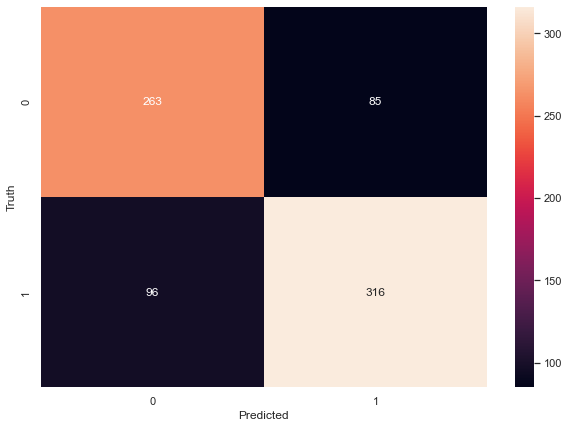

In [1131]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=y1_test,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

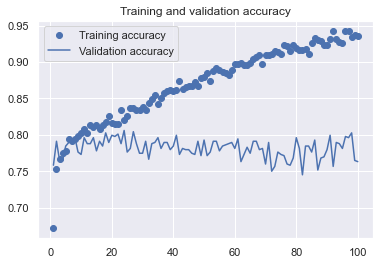

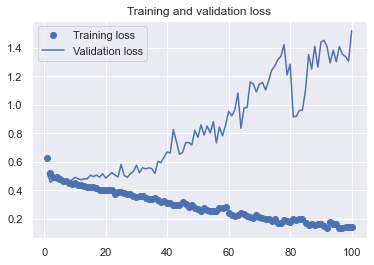

In [1132]:
# Plot results
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc)+1)

plt.plot(epochs, acc, 'bo', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [1133]:
#Fully Connected Layer Model in Action
predict=modelfcl.predict(X1_test)
predict

array([[9.71464396e-01],
       [9.49025154e-04],
       [9.98943925e-01],
       [3.88341844e-02],
       [1.00000000e+00],
       [1.90189779e-01],
       [4.00130230e-05],
       [4.38363850e-01],
       [1.69485807e-04],
       [9.97798443e-01],
       [1.00000000e+00],
       [4.47841967e-06],
       [9.73710775e-01],
       [6.48892546e-06],
       [1.75029039e-04],
       [2.76937544e-01],
       [1.80664659e-03],
       [2.47732203e-07],
       [1.00000000e+00],
       [9.78831887e-01],
       [2.86594903e-09],
       [9.98267770e-01],
       [1.00000000e+00],
       [2.63152421e-02],
       [3.00651193e-02],
       [3.63711119e-02],
       [2.81058669e-01],
       [1.00000000e+00],
       [8.97715688e-01],
       [7.67515421e-01],
       [6.42955482e-01],
       [5.30451536e-04],
       [2.73942947e-04],
       [2.65648961e-03],
       [9.99902844e-01],
       [2.04083631e-06],
       [2.74134163e-06],
       [9.99922574e-01],
       [9.96337295e-01],
       [2.14895606e-03],


In [1134]:
# Define function to visualize predictions
def test_output(classifier):
    result = []
    for f in X1_test:
      try:
          prediction = classifier.predict(f)
      except:
          prediction = classifier.predict(f.reshape(1,1,21))
      if(prediction < 0.5):
        result.append(0)
      else:
        result.append(1)
        
    return result
o = test_output(modelfcl)

Confusion Matrix: 
[[263  85]
 [ 96 316]]
Accuracy:  0.7618421052631579
Specificity:  0.7557471264367817
Precision/Positive Predictive Value:  0.7880299251870324
Negative Predictive Value:  0.7325905292479109
Recall/Sensitivity:  0.7669902912621359
False Positive Rate:  0.4696132596685083
False Negative Rate:  0.23300970873786409
Positive Likelihood Ratio:  1.6332381496287836
Negative Likelihod Ratio:  0.3083170290523829
Diagnostic Odds Ratio:  5.297268706333107
False Omission Rate:  0.26740947075208915
F1 Score:  0.7773677736777368
Area under ROC curve:  0.7613687088494588


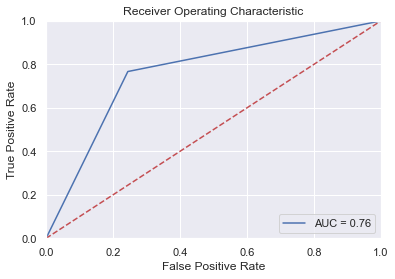

In [1135]:
from sklearn.metrics import *
matrix = confusion_matrix(y1_test, o)
print("Confusion Matrix: ")
print(matrix)
[[tn, fp], [fn, tp]] = matrix

acc_score = accuracy_score(y1_test, o)
precision = precision_score(y1_test, o)
recall = tpr = recall_score(y1_test, o)
f1 = f1_score(y1_test, o)
roc_score = roc_auc_score(y1_test, o)
spc = tnr = tn/(tn + fp)
fpr = fp/(fp + fn)
fnr = fn/(fn+tp)
plr = tpr/fpr
nlr = fnr/tnr
dor = plr/nlr
npv = tn/(fn+tn)
fr = fn/(fn+tn)

print("Accuracy: ", acc_score)
print("Specificity: ", spc)
print("Precision/Positive Predictive Value: ", precision)
print("Negative Predictive Value: ", npv)
print("Recall/Sensitivity: ", recall)
print("False Positive Rate: ", fpr)
print("False Negative Rate: ", fnr)
print("Positive Likelihood Ratio: ", plr)
print("Negative Likelihod Ratio: ", nlr)
print("Diagnostic Odds Ratio: ", dor)
print("False Omission Rate: ", fr)
print("F1 Score: ", f1)
print("Area under ROC curve: ", roc_score)


fpr, tpr, threshold = roc_curve(y1_test, o)
roc_auc = auc(fpr, tpr)

import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [1136]:
X1_test=np.reshape(X1_test,(X1_test.shape[0],X1_test.shape[2]))
y1_test=pd.DataFrame(y1_test)
X1_test=pd.DataFrame(X1_test)

In [1137]:
X1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_fcl_12mon.xlsx")
y1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_fcl_12mon.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_fcl_12mon.xlsx")

In [1138]:
df_x=df_feature_scaler[3508:]
df_y=df_label[3508:]
df_x=df_x.to_numpy()
df_y=df_y.to_numpy()
df_x=np.reshape(df_x,(df_x.shape[0],1,df_x.shape[1]))

In [1139]:
yp = modelfcl.predict(df_x)
yp[:5]

array([[1.        ],
       [0.99999976],
       [0.9999907 ],
       [1.        ],
       [0.9999998 ]], dtype=float32)

In [1140]:
y_pred1 = []
for element in yp:
    if element > 0.5:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [1141]:
y_pred1[:10]

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

In [1142]:
df_y[:10]

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int64)

In [1143]:
y_pred1=pd.DataFrame(y_pred1)
df_x=np.reshape(df_x,(df_x.shape[0],df_x.shape[2]))
df_x=pd.DataFrame(df_x)
df_y=pd.DataFrame(df_y)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_fcl_12mon_test.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_fcl_12mon_test.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_fcl_12mon_test.xlsx")

In [1144]:
# 2 months 5%

In [1145]:
df = pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/2 month.csv")
df.sample(5)

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result5
4201,ALBERT DAVID LTD.-$,ALBERTDAVD,3650,2147784.0,0,0.0,3650,2147784.0,588.43,01-01-2022,...,38.79,0.12,37.0,-37.0,-2.0,27.00,17.36,Pharmaceuticals - Indian - Formulations,LOSS,LOSS
2836,SIMPLEX INFRASTRUCTURES LTD.,SIMPLEXINF,462837,12475706.0,462579,12411530.0,258,64176.0,248.74,01-01-2020,...,21.40,0.12,33.0,-70.0,32.0,183.00,1.68,Construction,PROFIT,PROFIT
3084,ORBIT EXPORTS LTD.,ORBTEXP,295865,15687597.0,0,0.0,295865,15687597.0,53.02,04-01-2020,...,9.11,0.21,34.0,-23.0,-6.0,33.12,6.53,Textiles - Processing,LOSS,LOSS
4037,NATCO PHARMA LTD.,NATCOPHARM,1736,1571078.0,0,0.0,1736,1571078.0,905.00,09-01-2021,...,24.18,0.13,299.0,-107.0,-186.0,580.00,40.53,Pharmaceuticals - Indian - Bulk Drugs & Formln,LOSS,LOSS
2727,ORBIT EXPORTS LTD.,ORBTEXP,15881,1335057.0,0,0.0,15881,1335057.0,84.07,12-01-2019,...,9.11,0.21,34.0,-23.0,-6.0,33.12,9.18,Textiles - Processing,PROFIT,LOSS


In [1146]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result5']=df['Result5'].map(r)

In [1147]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            0
No of shares             0
Value                    0
Avg Price                0
Buy Date                 0
Sell date                0
Buy price                0
Sell price               0
Nifty Index at buying    0
Nfty index at selling    0
Change in Nifty 50       0
Return                   0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Result                   0
Result5                  0
dtype: int64
Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares so

In [1148]:
df['Cap']

0       0
1       0
2       1
3       0
4       0
       ..
4236    0
4237    0
4238    0
4239    0
4240    0
Name: Cap, Length: 4241, dtype: int64

In [1149]:
df.drop('Buy Date',axis=1,inplace=True)
df.drop('Sell date',axis=1,inplace=True)
df.drop('Row Labels',axis=1,inplace=True)
#df.drop('Symbol',axis=1,inplace=True)
#df.drop('Return %',axis=1,inplace=True)
df.drop('Return',axis=1,inplace=True)
df.drop('Sell price',axis=1,inplace=True)
df.drop('Result',axis=1,inplace=True)
#df.drop('Nifty Index at buying',axis=1,inplace=True)
#df.drop('Nfty index at selling',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)

In [1150]:
df['code']=pd.factorize(df['Symbol'])[0] + 1
df.drop('Symbol',axis=1,inplace=True)

In [1151]:
df_feature = df.drop('Result5',axis='columns')
df_label = df['Result5']

In [1152]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.129067,-0.107008,-0.047593,-0.082351,-0.126057,-0.105010,-0.092596,-0.444790,-0.700391,-0.655708,...,-0.028060,-0.058507,-0.220014,-0.130812,0.148124,0.015864,-0.173498,-0.087246,-1.174670,-1.400415
1,-0.136307,-0.091216,-0.047593,-0.082351,-0.133405,-0.089202,0.045594,1.640970,-0.700391,-0.655708,...,-0.028065,0.001528,0.739882,-0.059730,0.101365,-0.034456,-0.061655,-0.010550,-1.128896,-1.394445
2,2.231717,-0.087220,-0.047593,-0.082351,2.269995,-0.085202,-0.092586,-0.439296,1.112107,1.086441,...,-0.028058,-0.064718,-0.699962,0.512658,-0.778526,0.151242,-1.173701,-0.114960,-1.083121,-1.388474
3,0.478839,-0.097741,-0.047593,-0.082351,0.490931,-0.095734,-0.092403,-0.451608,-0.700391,-0.655708,...,-0.028066,-0.060733,-0.639968,-0.126450,0.152338,0.003015,-0.177223,0.579773,-1.037347,-1.382503
4,0.036183,-0.011034,-0.047593,-0.082351,0.041662,-0.008938,-0.077940,-0.267066,-0.700391,-0.655708,...,-0.028066,-0.053524,0.499908,-0.030551,0.020787,0.011319,-0.028989,-0.030688,-0.991572,-1.376533


In [1153]:
from sklearn.model_selection import train_test_split

X1_big, X1_test, y1_big, y1_test = train_test_split(df_feature_scaler, df_label, test_size=0.2, random_state=27)
#becase the data isn't too much, so I take the validation data from train data
X1_train, X1_val, y1_train, y1_val = train_test_split(X1_big, y1_big, test_size=0.2, random_state=27)

In [1154]:
print(X1_big.shape, X1_val.shape, X1_test.shape,X1_train.shape)

(3392, 24) (679, 24) (849, 24) (2713, 24)


In [1155]:
print(X1_train.shape, ',', X1_train.ndim, ',', type(X1_train))
print(y1_train.shape, ',', y1_train.ndim, ',', type(y1_train))
print(X1_test.shape, ',', X1_val.ndim, ',', type(X1_val))
print(y1_test.shape, ',', y1_val.ndim, ',', type(y1_val))

(2713, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(2713,) , 1 , <class 'pandas.core.series.Series'>
(849, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(849,) , 1 , <class 'pandas.core.series.Series'>


In [1156]:
X1_train=X1_train.to_numpy()
y1_train=y1_train.to_numpy()
X1_test=X1_test.to_numpy()
y1_test=y1_test.to_numpy()
X1_val=X1_val.to_numpy()
y1_val=y1_val.to_numpy()

In [1157]:
X1_train=np.reshape(X1_train,(X1_train.shape[0],1,X1_train.shape[1]))
X1_test=np.reshape(X1_test,(X1_test.shape[0],1,X1_test.shape[1]))

In [1158]:
X1_val=np.reshape(X1_val,(X1_val.shape[0],1,X1_val.shape[1]))
print(X1_val.shape,X1_test.shape,X1_train.shape)

(679, 1, 24) (849, 1, 24) (2713, 1, 24)


In [1159]:
df_feature_scaler.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4241 entries, 0 to 4240
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   No of Shares Bought    4241 non-null   float64
 1   Value of purchase      4241 non-null   float64
 2   No of shares sold      4241 non-null   float64
 3   Value of sale          4241 non-null   float64
 4   No of shares           4241 non-null   float64
 5   Value                  4241 non-null   float64
 6   Avg Price              4241 non-null   float64
 7   Buy price              4241 non-null   float64
 8   Nifty Index at buying  4241 non-null   float64
 9   Nfty index at selling  4241 non-null   float64
 10  No of shares.1         4241 non-null   float64
 11  Market Cap             4241 non-null   float64
 12  %age of Marketcap      4241 non-null   float64
 13  Cap                    4241 non-null   float64
 14  Deviation              4241 non-null   float64
 15  EPS 

In [1160]:
# Define model
# FULLY CONNECTED LAYER
from keras import models
from keras import layers
from keras import optimizers

epochs = 100

modelfcl = models.Sequential()
modelfcl.add(layers.Flatten(input_shape=(1,24)))
modelfcl.add(layers.Dense(256, activation='relu', input_dim=(1*24)))
modelfcl.add(layers.Dense(128, activation='relu'))
modelfcl.add(layers.Dense(64, activation='relu'))
modelfcl.add(layers.Dense(32, activation='relu'))
modelfcl.add(layers.Dropout(0.5))
modelfcl.add(layers.Dense(1, activation='sigmoid'))
modelfcl.summary()

Model: "sequential_30"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_4 (Flatten)          (None, 24)                0         
_________________________________________________________________
dense_100 (Dense)            (None, 256)               6400      
_________________________________________________________________
dense_101 (Dense)            (None, 128)               32896     
_________________________________________________________________
dense_102 (Dense)            (None, 64)                8256      
_________________________________________________________________
dense_103 (Dense)            (None, 32)                2080      
_________________________________________________________________
dropout_12 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_104 (Dense)            (None, 1)               

In [1161]:
# Compile model
modelfcl.compile(optimizer=optimizers.Adam(),
              loss='binary_crossentropy',
              metrics=['acc'])

In [1162]:
# Train model
history = modelfcl.fit(X1_train, y1_train,
                    epochs=100,
                    batch_size=50, 
                    validation_data=(X1_val, y1_val))

Epoch 1/100
55/55 [==============================] - 0s 6ms/step - loss: 0.6906 - acc: 0.5651 - val_loss: 0.6881 - val_acc: 0.5670
Epoch 2/100
55/55 [==============================] - 0s 3ms/step - loss: 0.6809 - acc: 0.5816 - val_loss: 0.6831 - val_acc: 0.5832
Epoch 3/100
55/55 [==============================] - 0s 3ms/step - loss: 0.6733 - acc: 0.6030 - val_loss: 0.6704 - val_acc: 0.5994
Epoch 4/100
55/55 [==============================] - 0s 3ms/step - loss: 0.6547 - acc: 0.6052 - val_loss: 0.6424 - val_acc: 0.6259
Epoch 5/100
55/55 [==============================] - 0s 3ms/step - loss: 0.6207 - acc: 0.6642 - val_loss: 0.6078 - val_acc: 0.6510
Epoch 6/100
55/55 [==============================] - 0s 2ms/step - loss: 0.5971 - acc: 0.6874 - val_loss: 0.5990 - val_acc: 0.6907
Epoch 7/100
55/55 [==============================] - 0s 2ms/step - loss: 0.5925 - acc: 0.6882 - val_loss: 0.5875 - val_acc: 0.6819
Epoch 8/100
55/55 [==============================] - 0s 3ms/step - loss: 0.5830 - a

In [1163]:
test_loss, test_accuracy = modelfcl.evaluate(X1_test, y1_test)
print("Test loss: {0:.2f} and Test accuracy: {1:.2f}% ".format(test_loss,test_accuracy*100))

27/27 [==============================] - 0s 1ms/step - loss: 1.4085 - acc: 0.6502
Test loss: 1.41 and Test accuracy: 65.02% 


In [1164]:
yp = modelfcl.predict(X1_test)
yp[:5]

array([[5.4645538e-04],
       [1.0378659e-01],
       [8.4823263e-01],
       [9.6183479e-01],
       [1.0320246e-03]], dtype=float32)

In [1165]:
y_pred=[]
for element in yp:
    if element>0.5:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [1166]:
y_pred=pd.DataFrame(y_pred)

In [1167]:
y_pred[:10]

,0
0,0
1,0
2,1
3,1
4,0
5,0
6,1
7,0
8,0
9,0


In [1168]:
y1_test[:10]

array([0, 0, 1, 1, 0, 0, 0, 0, 0, 0], dtype=int64)

Text(66.5, 0.5, 'Truth')

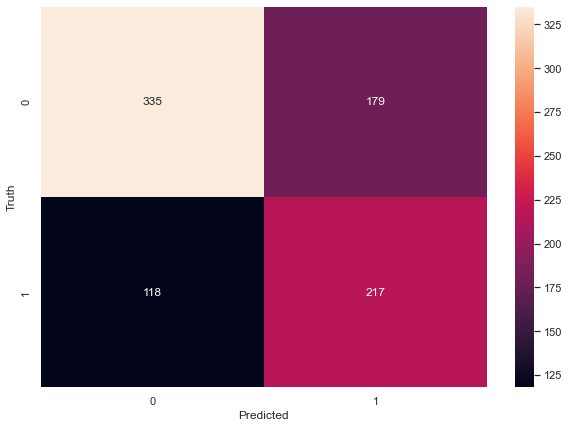

In [1169]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=y1_test,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

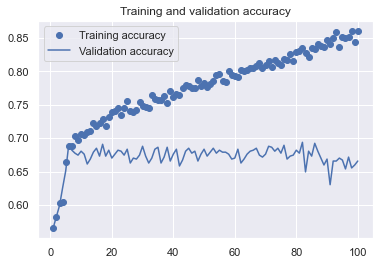

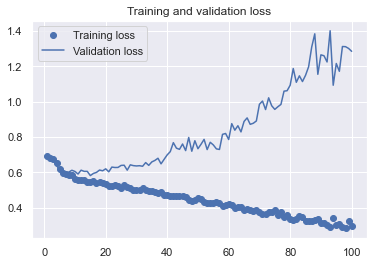

In [1170]:
# Plot results
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc)+1)

plt.plot(epochs, acc, 'bo', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [1171]:
#Fully Connected Layer Model in Action
predict=modelfcl.predict(X1_test)
predict

array([[5.46455383e-04],
       [1.03786588e-01],
       [8.48232627e-01],
       [9.61834788e-01],
       [1.03202462e-03],
       [2.43914030e-07],
       [6.20343447e-01],
       [2.41196776e-05],
       [5.13846874e-02],
       [7.18199317e-07],
       [1.72913074e-04],
       [7.90235162e-01],
       [2.96990573e-02],
       [4.23388362e-01],
       [1.30382478e-02],
       [7.56168604e-01],
       [5.00615001e-01],
       [1.70349330e-01],
       [1.89870596e-04],
       [9.64270413e-01],
       [5.68662882e-02],
       [2.91630834e-01],
       [6.56732798e-01],
       [7.80582428e-04],
       [7.32550919e-01],
       [9.99999642e-01],
       [3.55820477e-01],
       [9.89336252e-01],
       [9.99868870e-01],
       [5.96904755e-03],
       [9.99449492e-01],
       [9.99573648e-01],
       [6.34131134e-02],
       [8.89223278e-01],
       [9.11900401e-03],
       [2.06155747e-01],
       [2.57429481e-03],
       [6.61134958e-01],
       [2.67917931e-01],
       [3.23965997e-01],


In [1172]:
# Define function to visualize predictions
def test_output(classifier):
    result = []
    for f in X1_test:
      try:
          prediction = classifier.predict(f)
      except:
          prediction = classifier.predict(f.reshape(1,1,21))
      if(prediction < 0.5):
        result.append(0)
      else:
        result.append(1)
        
    return result
o = test_output(modelfcl)

Confusion Matrix: 
[[335 179]
 [118 217]]
Accuracy:  0.6501766784452296
Specificity:  0.6517509727626459
Precision/Positive Predictive Value:  0.547979797979798
Negative Predictive Value:  0.739514348785872
Recall/Sensitivity:  0.6477611940298508
False Positive Rate:  0.6026936026936027
False Negative Rate:  0.3522388059701492
Positive Likelihood Ratio:  1.0747769532227132
Negative Likelihod Ratio:  0.5404499888616617
Diagnostic Odds Ratio:  1.988670506750297
False Omission Rate:  0.26048565121412803
F1 Score:  0.5937072503419972
Area under ROC curve:  0.6497560833962485


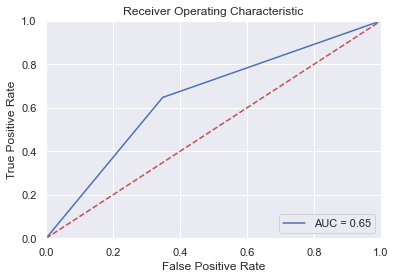

In [1173]:
from sklearn.metrics import *
matrix = confusion_matrix(y1_test, o)
print("Confusion Matrix: ")
print(matrix)
[[tn, fp], [fn, tp]] = matrix

acc_score = accuracy_score(y1_test, o)
precision = precision_score(y1_test, o)
recall = tpr = recall_score(y1_test, o)
f1 = f1_score(y1_test, o)
roc_score = roc_auc_score(y1_test, o)
spc = tnr = tn/(tn + fp)
fpr = fp/(fp + fn)
fnr = fn/(fn+tp)
plr = tpr/fpr
nlr = fnr/tnr
dor = plr/nlr
npv = tn/(fn+tn)
fr = fn/(fn+tn)

print("Accuracy: ", acc_score)
print("Specificity: ", spc)
print("Precision/Positive Predictive Value: ", precision)
print("Negative Predictive Value: ", npv)
print("Recall/Sensitivity: ", recall)
print("False Positive Rate: ", fpr)
print("False Negative Rate: ", fnr)
print("Positive Likelihood Ratio: ", plr)
print("Negative Likelihod Ratio: ", nlr)
print("Diagnostic Odds Ratio: ", dor)
print("False Omission Rate: ", fr)
print("F1 Score: ", f1)
print("Area under ROC curve: ", roc_score)


fpr, tpr, threshold = roc_curve(y1_test, o)
roc_auc = auc(fpr, tpr)

import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [1174]:
X1_test=np.reshape(X1_test,(X1_test.shape[0],X1_test.shape[2]))
y1_test=pd.DataFrame(y1_test)
X1_test=pd.DataFrame(X1_test)

In [1175]:
X1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_fcl_2mon_5.xlsx")
y1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_fcl_2mon_5.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_fcl_2mon_5.xlsx")

In [1176]:
df_x=df_feature_scaler[3990:]
df_y=df_label[3990:]
df_x=df_x.to_numpy()
df_y=df_y.to_numpy()
df_x=np.reshape(df_x,(df_x.shape[0],1,df_x.shape[1]))

In [1177]:
yp = modelfcl.predict(df_x)
yp[:5]

array([[0.9999639 ],
       [1.        ],
       [0.40726298],
       [0.98809767],
       [0.9871503 ]], dtype=float32)

In [1178]:
y_pred1 = []
for element in yp:
    if element > 0.5:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [1179]:
y_pred1[:10]

[1, 1, 0, 1, 1, 1, 0, 0, 0, 1]

In [1180]:
df_y[:10]

array([1, 1, 0, 1, 1, 1, 0, 0, 0, 1], dtype=int64)

In [1181]:
y_pred1=pd.DataFrame(y_pred1)
df_x=np.reshape(df_x,(df_x.shape[0],df_x.shape[2]))
df_x=pd.DataFrame(df_x)
df_y=pd.DataFrame(df_y)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_fcl_2mon_test_5.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_fcl_2mon_test_5.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_fcl_2mon_test_5.xlsx")

In [1182]:
# 6 months 10%

In [1183]:
df = pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/6 months.csv")
df.sample(5)

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result10
762,GRASIM INDUSTRIES LTD.,GRASIM,1400,2453439.00,0,0.0,1400,2453439.00,1752.46,08-01-2017,...,67.85,0.16,7288.00,-3509.00,-3799.00,5952.00,16.29,Textiles - Manmade,PROFIT,LOSS
2649,TV TODAY NETWORK LTD.,TVTODAY,1953,595790.00,0,0.0,1953,595790.00,305.06,10-01-2019,...,21.97,0.26,125.00,-104.00,-14.00,204.00,14.13,Entertainment / Electronic Media Software,LOSS,LOSS
213,ALMONDZ GLOBAL SECURITIES LTD.,ALMONDZ,37501,390881.70,0,0.0,37501,390881.70,10.42,05-01-2016,...,-0.12,0.03,32.00,4.00,-42.00,0.00,-95.00,Finance & Investments,PROFIT,PROFIT
3451,Lotus Eye Hospital And Institute Ltd,LOTUSEYE,7604,229192.00,0,0.0,7604,229192.00,30.14,10-01-2020,...,0.51,0.05,4.97,-0.68,0.13,1.45,58.24,Healthcare,PROFIT,PROFIT
628,WEST COAST PAPER MILLS LTD.,WSTCSTPAPR,41313,7380937.11,0,0.0,41313,7380937.11,178.66,04-01-2017,...,-0.07,0.10,98.00,34.00,-132.00,14.00,-2532.86,Paper,PROFIT,LOSS


In [1184]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result10']=df['Result10'].map(r)

In [1185]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            2
No of shares             0
Value                    0
Avg Price                0
Buy Date                 0
Sell date                0
Buy price                0
Sell price               0
Nifty Index at buying    0
Nfty index at selling    0
Change in Nifty 50       0
Return                   0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Result                   0
Result10                 0
dtype: int64
Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares so

In [1186]:
df['Cap']

0       0
1       0
2       1
3       0
4       0
       ..
4066    2
4067    0
4068    0
4069    0
4070    1
Name: Cap, Length: 4069, dtype: int64

In [1187]:
df.drop('Buy Date',axis=1,inplace=True)
df.drop('Sell date',axis=1,inplace=True)
df.drop('Row Labels',axis=1,inplace=True)
#df.drop('Symbol',axis=1,inplace=True)
#df.drop('Return %',axis=1,inplace=True)
df.drop('Return',axis=1,inplace=True)
df.drop('Sell price',axis=1,inplace=True)
df.drop('Result',axis=1,inplace=True)
#df.drop('Nifty Index at buying',axis=1,inplace=True)
#df.drop('Nfty index at selling',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)

In [1188]:
df['code']=pd.factorize(df['Symbol'])[0] + 1
df.drop('Symbol',axis=1,inplace=True)

In [1189]:
df_feature = df.drop('Result10',axis='columns')
df_label = df['Result10']

In [1190]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.133236,-0.106103,-0.047801,-0.081043,-0.130212,-0.104125,-0.090731,-0.455363,-0.681147,-0.814616,...,-0.021631,-0.065135,-0.219695,-0.122020,0.146417,0.000484,-0.170855,-0.085491,-1.173138,-1.406195
1,-0.140797,-0.090406,-0.047801,-0.081043,-0.137901,-0.088412,0.044707,1.829228,-0.681147,-0.814616,...,-0.021644,0.057697,0.728894,-0.049158,0.100029,-0.051379,-0.055526,-0.009718,-1.127087,-1.400179
2,2.332115,-0.086434,-0.047801,-0.081043,2.377162,-0.084435,-0.090721,-0.449345,1.239044,0.923055,...,-0.021625,-0.077842,-0.693990,0.537563,-0.772881,0.140014,-1.202220,-0.112871,-1.081036,-1.394163
3,0.501596,-0.096892,-0.047801,-0.081043,0.515442,-0.094904,-0.090542,-0.462831,-0.681147,-0.814616,...,-0.021645,-0.069690,-0.653082,-0.117549,0.150598,-0.012759,-0.174695,0.573498,-1.034984,-1.388146
4,0.039334,-0.010704,-0.047801,-0.081043,0.045300,-0.008627,-0.076367,-0.260697,-0.681147,-0.814616,...,-0.021645,-0.054941,0.491747,-0.019248,0.020090,-0.004200,-0.021843,-0.029615,-0.988933,-1.382130


In [1191]:
from sklearn.model_selection import train_test_split

X1_big, X1_test, y1_big, y1_test = train_test_split(df_feature_scaler, df_label, test_size=0.2, random_state=27)
#becase the data isn't too much, so I take the validation data from train data
X1_train, X1_val, y1_train, y1_val = train_test_split(X1_big, y1_big, test_size=0.2, random_state=27)

In [1192]:
print(X1_big.shape, X1_val.shape, X1_test.shape,X1_train.shape)

(3255, 24) (651, 24) (814, 24) (2604, 24)


In [1193]:
print(X1_train.shape, ',', X1_train.ndim, ',', type(X1_train))
print(y1_train.shape, ',', y1_train.ndim, ',', type(y1_train))
print(X1_test.shape, ',', X1_val.ndim, ',', type(X1_val))
print(y1_test.shape, ',', y1_val.ndim, ',', type(y1_val))

(2604, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(2604,) , 1 , <class 'pandas.core.series.Series'>
(814, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(814,) , 1 , <class 'pandas.core.series.Series'>


In [1194]:
X1_train=X1_train.to_numpy()
y1_train=y1_train.to_numpy()
X1_test=X1_test.to_numpy()
y1_test=y1_test.to_numpy()
X1_val=X1_val.to_numpy()
y1_val=y1_val.to_numpy()

In [1195]:
X1_train=np.reshape(X1_train,(X1_train.shape[0],1,X1_train.shape[1]))
X1_test=np.reshape(X1_test,(X1_test.shape[0],1,X1_test.shape[1]))

In [1196]:
X1_val=np.reshape(X1_val,(X1_val.shape[0],1,X1_val.shape[1]))
print(X1_val.shape,X1_test.shape,X1_train.shape)

(651, 1, 24) (814, 1, 24) (2604, 1, 24)


In [1197]:
df_feature_scaler.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4069 entries, 0 to 4068
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   No of Shares Bought    4069 non-null   float64
 1   Value of purchase      4069 non-null   float64
 2   No of shares sold      4069 non-null   float64
 3   Value of sale          4069 non-null   float64
 4   No of shares           4069 non-null   float64
 5   Value                  4069 non-null   float64
 6   Avg Price              4069 non-null   float64
 7   Buy price              4069 non-null   float64
 8   Nifty Index at buying  4069 non-null   float64
 9   Nfty index at selling  4069 non-null   float64
 10  No of shares.1         4069 non-null   float64
 11  Market Cap             4069 non-null   float64
 12  %age of Marketcap      4069 non-null   float64
 13  Cap                    4069 non-null   float64
 14  Deviation              4069 non-null   float64
 15  EPS 

In [1198]:
# Define model
# FULLY CONNECTED LAYER
from keras import models
from keras import layers
from keras import optimizers

epochs = 100

modelfcl = models.Sequential()
modelfcl.add(layers.Flatten(input_shape=(1,24)))
modelfcl.add(layers.Dense(256, activation='relu', input_dim=(1*24)))
modelfcl.add(layers.Dense(128, activation='relu'))
modelfcl.add(layers.Dense(64, activation='relu'))
modelfcl.add(layers.Dense(32, activation='relu'))
modelfcl.add(layers.Dropout(0.5))
modelfcl.add(layers.Dense(1, activation='sigmoid'))
modelfcl.summary()

Model: "sequential_31"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_5 (Flatten)          (None, 24)                0         
_________________________________________________________________
dense_105 (Dense)            (None, 256)               6400      
_________________________________________________________________
dense_106 (Dense)            (None, 128)               32896     
_________________________________________________________________
dense_107 (Dense)            (None, 64)                8256      
_________________________________________________________________
dense_108 (Dense)            (None, 32)                2080      
_________________________________________________________________
dropout_13 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_109 (Dense)            (None, 1)               

In [1199]:
# Compile model
modelfcl.compile(optimizer=optimizers.Adam(),
              loss='binary_crossentropy',
              metrics=['acc'])

In [1200]:
# Train model
history = modelfcl.fit(X1_train, y1_train,
                    epochs=100,
                    batch_size=50, 
                    validation_data=(X1_val, y1_val))

Epoch 1/100
53/53 [==============================] - 0s 6ms/step - loss: 0.6661 - acc: 0.6022 - val_loss: 0.6066 - val_acc: 0.7281
Epoch 2/100
53/53 [==============================] - 0s 3ms/step - loss: 0.5706 - acc: 0.7220 - val_loss: 0.5531 - val_acc: 0.7450
Epoch 3/100
53/53 [==============================] - 0s 3ms/step - loss: 0.5356 - acc: 0.7558 - val_loss: 0.5546 - val_acc: 0.7634
Epoch 4/100
53/53 [==============================] - 0s 3ms/step - loss: 0.5266 - acc: 0.7650 - val_loss: 0.5448 - val_acc: 0.7542
Epoch 5/100
53/53 [==============================] - 0s 3ms/step - loss: 0.5113 - acc: 0.7719 - val_loss: 0.5436 - val_acc: 0.7634
Epoch 6/100
53/53 [==============================] - 0s 3ms/step - loss: 0.5060 - acc: 0.7738 - val_loss: 0.5646 - val_acc: 0.7588
Epoch 7/100
53/53 [==============================] - 0s 3ms/step - loss: 0.5030 - acc: 0.7834 - val_loss: 0.5551 - val_acc: 0.7619
Epoch 8/100
53/53 [==============================] - 0s 3ms/step - loss: 0.4980 - a

In [1201]:
test_loss, test_accuracy = modelfcl.evaluate(X1_test, y1_test)
print("Test loss: {0:.2f} and Test accuracy: {1:.2f}% ".format(test_loss,test_accuracy*100))

26/26 [==============================] - 0s 1ms/step - loss: 1.7228 - acc: 0.7592
Test loss: 1.72 and Test accuracy: 75.92% 


In [1202]:
yp = modelfcl.predict(X1_test)
yp[:5]

array([[4.1550398e-04],
       [9.4498754e-01],
       [2.3656046e-09],
       [9.9867392e-01],
       [2.3518267e-01]], dtype=float32)

In [1203]:
y_pred=[]
for element in yp:
    if element>0.5:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [1204]:
y_pred=pd.DataFrame(y_pred)

In [1205]:
y_pred[:10]

,0
0,0
1,1
2,0
3,1
4,0
5,0
6,1
7,0
8,1
9,1


In [1206]:
y1_test[:10]

array([0, 0, 0, 1, 0, 0, 1, 0, 1, 0], dtype=int64)

Text(66.5, 0.5, 'Truth')

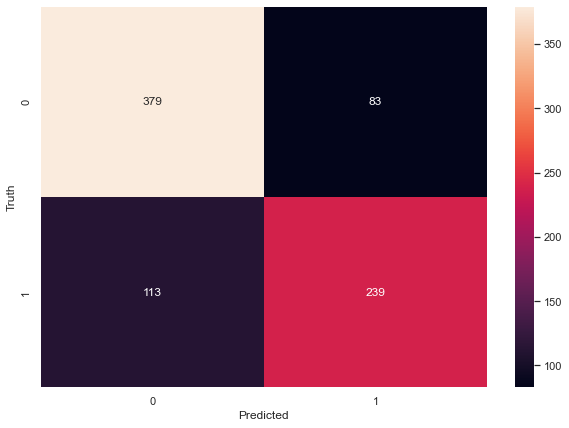

In [1207]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=y1_test,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

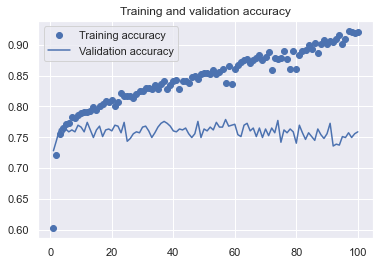

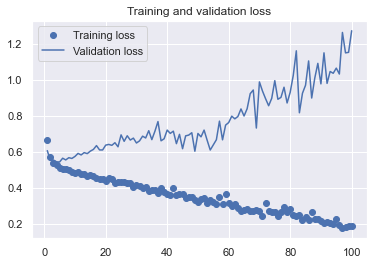

In [1208]:
# Plot results
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc)+1)

plt.plot(epochs, acc, 'bo', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [1209]:
#Fully Connected Layer Model in Action
predict=modelfcl.predict(X1_test)
predict

array([[4.15503979e-04],
       [9.44987535e-01],
       [2.36560460e-09],
       [9.98673916e-01],
       [2.35182673e-01],
       [3.47797871e-01],
       [9.98283625e-01],
       [2.66492367e-04],
       [6.35468662e-01],
       [7.65364289e-01],
       [2.14725733e-04],
       [6.93901062e-01],
       [5.16624868e-01],
       [6.10192046e-07],
       [2.66894698e-03],
       [2.72829205e-01],
       [1.21616125e-02],
       [8.57981145e-01],
       [6.35606349e-01],
       [8.20685148e-01],
       [4.31590766e-01],
       [4.78863716e-03],
       [9.99885440e-01],
       [2.55778432e-03],
       [3.03949037e-05],
       [8.93738925e-01],
       [3.38118851e-01],
       [9.99602079e-01],
       [5.31990622e-07],
       [8.46064210e-01],
       [1.77532434e-04],
       [8.19149613e-03],
       [4.93402451e-01],
       [5.35952882e-09],
       [8.69757593e-01],
       [4.12846118e-01],
       [5.86968660e-03],
       [3.57366800e-02],
       [6.28913403e-01],
       [9.98753667e-01],


In [1210]:
# Define function to visualize predictions
def test_output(classifier):
    result = []
    for f in X1_test:
      try:
          prediction = classifier.predict(f)
      except:
          prediction = classifier.predict(f.reshape(1,1,21))
      if(prediction < 0.5):
        result.append(0)
      else:
        result.append(1)
        
    return result
o = test_output(modelfcl)

Confusion Matrix: 
[[379  83]
 [113 239]]
Accuracy:  0.7592137592137592
Specificity:  0.8203463203463204
Precision/Positive Predictive Value:  0.7422360248447205
Negative Predictive Value:  0.7703252032520326
Recall/Sensitivity:  0.6789772727272727
False Positive Rate:  0.42346938775510207
False Negative Rate:  0.3210227272727273
Positive Likelihood Ratio:  1.6033680175246439
Negative Likelihod Ratio:  0.39132585751978893
Diagnostic Odds Ratio:  4.097270821015356
False Omission Rate:  0.22967479674796748
F1 Score:  0.7091988130563799
Area under ROC curve:  0.7496617965367965


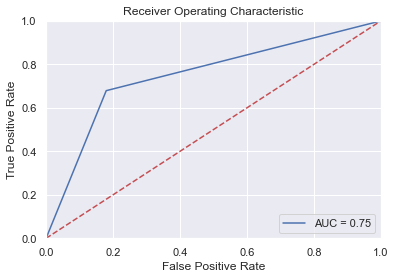

In [1211]:
from sklearn.metrics import *
matrix = confusion_matrix(y1_test, o)
print("Confusion Matrix: ")
print(matrix)
[[tn, fp], [fn, tp]] = matrix

acc_score = accuracy_score(y1_test, o)
precision = precision_score(y1_test, o)
recall = tpr = recall_score(y1_test, o)
f1 = f1_score(y1_test, o)
roc_score = roc_auc_score(y1_test, o)
spc = tnr = tn/(tn + fp)
fpr = fp/(fp + fn)
fnr = fn/(fn+tp)
plr = tpr/fpr
nlr = fnr/tnr
dor = plr/nlr
npv = tn/(fn+tn)
fr = fn/(fn+tn)

print("Accuracy: ", acc_score)
print("Specificity: ", spc)
print("Precision/Positive Predictive Value: ", precision)
print("Negative Predictive Value: ", npv)
print("Recall/Sensitivity: ", recall)
print("False Positive Rate: ", fpr)
print("False Negative Rate: ", fnr)
print("Positive Likelihood Ratio: ", plr)
print("Negative Likelihod Ratio: ", nlr)
print("Diagnostic Odds Ratio: ", dor)
print("False Omission Rate: ", fr)
print("F1 Score: ", f1)
print("Area under ROC curve: ", roc_score)


fpr, tpr, threshold = roc_curve(y1_test, o)
roc_auc = auc(fpr, tpr)

import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [1212]:
X1_test=np.reshape(X1_test,(X1_test.shape[0],X1_test.shape[2]))
y1_test=pd.DataFrame(y1_test)
X1_test=pd.DataFrame(X1_test)

In [1213]:
X1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_fcl_6mon_10.xlsx")
y1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_fcl_6mon_10.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_fcl_6mon_10.xlsx")

In [1214]:
df_x=df_feature_scaler[3806:]
df_y=df_label[3806:]
df_x=df_x.to_numpy()
df_y=df_y.to_numpy()
df_x=np.reshape(df_x,(df_x.shape[0],1,df_x.shape[1]))

In [1215]:
yp = modelfcl.predict(df_x)
yp[:5]

array([[9.9665844e-01],
       [7.5381207e-01],
       [1.7052889e-04],
       [7.9832757e-01],
       [9.9813759e-01]], dtype=float32)

In [1216]:
y_pred1 = []
for element in yp:
    if element > 0.5:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [1217]:
y_pred1[:10]

[1, 1, 0, 1, 1, 1, 1, 1, 0, 1]

In [1218]:
df_y[:10]

array([1, 1, 0, 0, 1, 1, 1, 1, 1, 1], dtype=int64)

In [1219]:
y_pred1=pd.DataFrame(y_pred1)
df_x=np.reshape(df_x,(df_x.shape[0],df_x.shape[2]))
df_x=pd.DataFrame(df_x)
df_y=pd.DataFrame(df_y)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_fcl_6mon_test_10.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_fcl_6mon_test_10.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_fcl_6mon_test_10.xlsx")

In [1220]:
# 9 months 13%

In [1221]:
df = pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/9 months.csv")
df.sample(5)

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result13
233,ONWARD TECHNOLOGIES LTD.,ONWARDTEC,21500,1479450.00,0,0.00,21500,1479450.00,68.81,05-01-2016,...,2.14,0.19,10.0,-1.0,-9.0,8.0,33.39,Computers - Software - Medium / Small,LOSS,LOSS
3835,Lotus Eye Hospital And Institute Ltd,LOTUSEYE,6482,240380.00,0,0.00,6482,240380.00,37.08,04-01-2021,...,0.51,0.05,5.0,-1.0,0.0,1.0,80.98,Healthcare,PROFIT,PROFIT
3124,SIYARAM SILK MILLS LTD.-$,SIYSIL,54964,7075000.00,0,0.00,54964,7075000.00,128.72,04-01-2020,...,21.14,0.17,192.0,-13.0,-194.0,152.0,6.10,Textiles - Processing,PROFIT,PROFIT
948,HCL TECHNOLOGIES LTD.,HCLTECH,35000,29784937.15,11139,9607155.42,23861,20177781.73,845.64,12-01-2017,...,30.16,0.34,8995.0,-3890.0,-4517.0,10542.0,14.06,Computers - Software - Large,PROFIT,PROFIT
1313,EVEREADY INDUSTRIES INDIA LTD.,EVEREADY,20000,4686858.00,0,0.00,20000,4686858.00,234.34,07-01-2018,...,7.31,0.18,81.0,-100.0,-37.0,76.0,30.42,Dry Cells,LOSS,LOSS


In [1222]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result13']=df['Result13'].map(r)

In [1223]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            2
No of shares             0
Value                    0
Avg Price                0
Buy Date                 0
Sell date                0
Buy price                0
Sell price               0
Nifty Index at buying    0
Nfty index at selling    0
Change in Nifty 50       0
Return                   0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Result                   0
Result13                 0
dtype: int64
Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares so

In [1224]:
df['Cap']

0       0
1       0
2       1
3       0
4       0
       ..
3927    0
3928    0
3929    0
3930    1
3931    0
Name: Cap, Length: 3930, dtype: int64

In [1225]:
df.drop('Buy Date',axis=1,inplace=True)
df.drop('Sell date',axis=1,inplace=True)
df.drop('Row Labels',axis=1,inplace=True)
#df.drop('Symbol',axis=1,inplace=True)
#df.drop('Return %',axis=1,inplace=True)
df.drop('Return',axis=1,inplace=True)
df.drop('Sell price',axis=1,inplace=True)
df.drop('Result',axis=1,inplace=True)
#df.drop('Nifty Index at buying',axis=1,inplace=True)
#df.drop('Nfty index at selling',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)

In [1226]:
df['code']=pd.factorize(df['Symbol'])[0] + 1
df.drop('Symbol',axis=1,inplace=True)

In [1227]:
df_feature = df.drop('Result13',axis='columns')
df_label = df['Result13']

In [1228]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.130340,-0.104660,-0.047655,-0.07972,-0.127341,-0.102724,-0.088595,-0.462558,-0.670799,-0.625330,...,-0.017149,-0.126163,-0.218315,-0.118179,0.144161,-0.004288,-0.163808,-0.082390,-1.174266,-1.409639
1,-0.137344,-0.088224,-0.047655,-0.07972,-0.134451,-0.086269,0.045684,1.947347,-0.670799,-0.625330,...,-0.017177,0.182627,0.720264,-0.045201,0.097982,-0.056017,-0.050900,-0.007642,-1.127962,-1.403525
2,2.153616,-0.084064,-0.047655,-0.07972,2.191031,-0.082105,-0.088586,-0.456210,1.353829,1.120459,...,-0.017135,-0.158108,-0.687605,0.542457,-0.771012,0.134879,-1.173527,-0.109400,-1.081658,-1.397411
3,0.457783,-0.095015,-0.047655,-0.07972,0.469645,-0.093068,-0.088408,-0.470435,-0.670799,-0.625330,...,-0.017178,-0.137614,-0.628944,-0.113701,0.148323,-0.017498,-0.167568,0.567691,-1.035354,-1.391297
4,0.029533,-0.004766,-0.047655,-0.07972,0.034941,-0.002717,-0.074354,-0.257214,-0.670799,-0.625330,...,-0.017178,-0.100536,0.485619,-0.015243,0.018401,-0.008961,-0.017924,-0.027269,-0.989051,-1.385183


In [1229]:
from sklearn.model_selection import train_test_split

X1_big, X1_test, y1_big, y1_test = train_test_split(df_feature_scaler, df_label, test_size=0.2, random_state=27)
#becase the data isn't too much, so I take the validation data from train data
X1_train, X1_val, y1_train, y1_val = train_test_split(X1_big, y1_big, test_size=0.2, random_state=27)

In [1230]:
print(X1_big.shape, X1_val.shape, X1_test.shape,X1_train.shape)

(3144, 24) (629, 24) (786, 24) (2515, 24)


In [1231]:
print(X1_train.shape, ',', X1_train.ndim, ',', type(X1_train))
print(y1_train.shape, ',', y1_train.ndim, ',', type(y1_train))
print(X1_test.shape, ',', X1_val.ndim, ',', type(X1_val))
print(y1_test.shape, ',', y1_val.ndim, ',', type(y1_val))

(2515, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(2515,) , 1 , <class 'pandas.core.series.Series'>
(786, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(786,) , 1 , <class 'pandas.core.series.Series'>


In [1232]:
X1_train=X1_train.to_numpy()
y1_train=y1_train.to_numpy()
X1_test=X1_test.to_numpy()
y1_test=y1_test.to_numpy()
X1_val=X1_val.to_numpy()
y1_val=y1_val.to_numpy()

In [1233]:
X1_train=np.reshape(X1_train,(X1_train.shape[0],1,X1_train.shape[1]))
X1_test=np.reshape(X1_test,(X1_test.shape[0],1,X1_test.shape[1]))

In [1234]:
X1_val=np.reshape(X1_val,(X1_val.shape[0],1,X1_val.shape[1]))
print(X1_val.shape,X1_test.shape,X1_train.shape)

(629, 1, 24) (786, 1, 24) (2515, 1, 24)


In [1235]:
df_feature_scaler.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3930 entries, 0 to 3929
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   No of Shares Bought    3930 non-null   float64
 1   Value of purchase      3930 non-null   float64
 2   No of shares sold      3930 non-null   float64
 3   Value of sale          3930 non-null   float64
 4   No of shares           3930 non-null   float64
 5   Value                  3930 non-null   float64
 6   Avg Price              3930 non-null   float64
 7   Buy price              3930 non-null   float64
 8   Nifty Index at buying  3930 non-null   float64
 9   Nfty index at selling  3930 non-null   float64
 10  No of shares.1         3930 non-null   float64
 11  Market Cap             3930 non-null   float64
 12  %age of Marketcap      3930 non-null   float64
 13  Cap                    3930 non-null   float64
 14  Deviation              3930 non-null   float64
 15  EPS 

In [1236]:
# Define model
# FULLY CONNECTED LAYER
from keras import models
from keras import layers
from keras import optimizers

epochs = 100

modelfcl = models.Sequential()
modelfcl.add(layers.Flatten(input_shape=(1,24)))
modelfcl.add(layers.Dense(256, activation='relu', input_dim=(1*24)))
modelfcl.add(layers.Dense(128, activation='relu'))
modelfcl.add(layers.Dense(64, activation='relu'))
modelfcl.add(layers.Dense(32, activation='relu'))
modelfcl.add(layers.Dropout(0.5))
modelfcl.add(layers.Dense(1, activation='sigmoid'))
modelfcl.summary()

Model: "sequential_32"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_6 (Flatten)          (None, 24)                0         
_________________________________________________________________
dense_110 (Dense)            (None, 256)               6400      
_________________________________________________________________
dense_111 (Dense)            (None, 128)               32896     
_________________________________________________________________
dense_112 (Dense)            (None, 64)                8256      
_________________________________________________________________
dense_113 (Dense)            (None, 32)                2080      
_________________________________________________________________
dropout_14 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_114 (Dense)            (None, 1)               

In [1237]:
# Compile model
modelfcl.compile(optimizer=optimizers.Adam(),
              loss='binary_crossentropy',
              metrics=['acc'])

In [1238]:
# Train model
history = modelfcl.fit(X1_train, y1_train,
                    epochs=100,
                    batch_size=50, 
                    validation_data=(X1_val, y1_val))

Epoch 1/100
51/51 [==============================] - 0s 7ms/step - loss: 0.6329 - acc: 0.6724 - val_loss: 0.5124 - val_acc: 0.7870
Epoch 2/100
51/51 [==============================] - 0s 3ms/step - loss: 0.5242 - acc: 0.7817 - val_loss: 0.4778 - val_acc: 0.7949
Epoch 3/100
51/51 [==============================] - 0s 3ms/step - loss: 0.4920 - acc: 0.7849 - val_loss: 0.4693 - val_acc: 0.7949
Epoch 4/100
51/51 [==============================] - 0s 3ms/step - loss: 0.4837 - acc: 0.7853 - val_loss: 0.4654 - val_acc: 0.8029
Epoch 5/100
51/51 [==============================] - 0s 3ms/step - loss: 0.4804 - acc: 0.7873 - val_loss: 0.4779 - val_acc: 0.7997
Epoch 6/100
51/51 [==============================] - 0s 3ms/step - loss: 0.4711 - acc: 0.7964 - val_loss: 0.4708 - val_acc: 0.7965
Epoch 7/100
51/51 [==============================] - 0s 3ms/step - loss: 0.4626 - acc: 0.7996 - val_loss: 0.4807 - val_acc: 0.8108
Epoch 8/100
51/51 [==============================] - 0s 3ms/step - loss: 0.4555 - a

In [1239]:
test_loss, test_accuracy = modelfcl.evaluate(X1_test, y1_test)
print("Test loss: {0:.2f} and Test accuracy: {1:.2f}% ".format(test_loss,test_accuracy*100))

25/25 [==============================] - 0s 1ms/step - loss: 0.9183 - acc: 0.7888
Test loss: 0.92 and Test accuracy: 78.88% 


In [1240]:
yp = modelfcl.predict(X1_test)
yp[:5]

array([[1.1762066e-11],
       [7.8496748e-01],
       [6.1343521e-02],
       [1.4257784e-10],
       [3.5698527e-01]], dtype=float32)

In [1241]:
y_pred=[]
for element in yp:
    if element>0.5:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [1242]:
y_pred=pd.DataFrame(y_pred)

In [1243]:
y_pred[:10]

,0
0,0
1,1
2,0
3,0
4,0
5,1
6,1
7,1
8,0
9,1


In [1244]:
y1_test[:10]

array([0, 1, 0, 0, 1, 0, 1, 1, 0, 1], dtype=int64)

Text(66.5, 0.5, 'Truth')

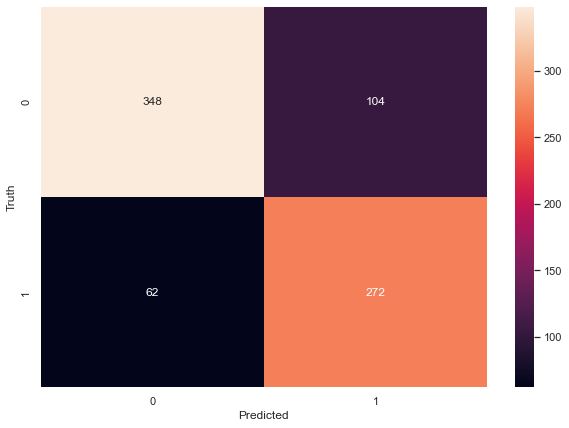

In [1245]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=y1_test,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

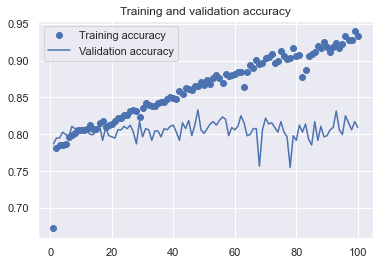

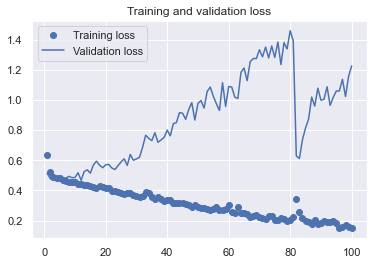

In [1246]:
# Plot results
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc)+1)

plt.plot(epochs, acc, 'bo', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [1247]:
#Fully Connected Layer Model in Action
predict=modelfcl.predict(X1_test)
predict

array([[1.17620661e-11],
       [7.84967482e-01],
       [6.13435209e-02],
       [1.42577838e-10],
       [3.56985271e-01],
       [6.10110462e-01],
       [9.93575811e-01],
       [9.99907672e-01],
       [1.56805214e-07],
       [9.99999285e-01],
       [7.54685283e-01],
       [8.24109077e-01],
       [6.36477351e-01],
       [7.00661573e-09],
       [3.35243044e-07],
       [1.12682581e-03],
       [2.50297785e-03],
       [9.38385725e-04],
       [9.99992251e-01],
       [1.00000000e+00],
       [4.52511877e-01],
       [2.73844600e-03],
       [1.79921180e-01],
       [9.99363184e-01],
       [4.20552790e-02],
       [1.62739216e-05],
       [3.35618854e-03],
       [4.78357077e-04],
       [5.43369055e-02],
       [9.93191934e-05],
       [1.91051543e-01],
       [7.24857211e-01],
       [2.72258660e-07],
       [2.76852870e-08],
       [2.42463946e-02],
       [9.99380946e-01],
       [9.89637375e-01],
       [6.17057085e-03],
       [9.94760871e-01],
       [1.92458529e-08],


In [1248]:
# Define function to visualize predictions
def test_output(classifier):
    result = []
    for f in X1_test:
      try:
          prediction = classifier.predict(f)
      except:
          prediction = classifier.predict(f.reshape(1,1,21))
      if(prediction < 0.5):
        result.append(0)
      else:
        result.append(1)
        
    return result
o = test_output(modelfcl)

Confusion Matrix: 
[[348 104]
 [ 62 272]]
Accuracy:  0.7888040712468194
Specificity:  0.7699115044247787
Precision/Positive Predictive Value:  0.723404255319149
Negative Predictive Value:  0.848780487804878
Recall/Sensitivity:  0.8143712574850299
False Positive Rate:  0.6265060240963856
False Negative Rate:  0.18562874251497005
Positive Likelihood Ratio:  1.2998618148318746
Negative Likelihod Ratio:  0.24110399889875422
Diagnostic Odds Ratio:  5.391290981356638
False Omission Rate:  0.15121951219512195
F1 Score:  0.7661971830985914
Area under ROC curve:  0.7921413809549043


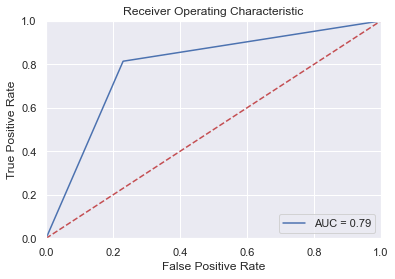

In [1249]:
from sklearn.metrics import *
matrix = confusion_matrix(y1_test, o)
print("Confusion Matrix: ")
print(matrix)
[[tn, fp], [fn, tp]] = matrix

acc_score = accuracy_score(y1_test, o)
precision = precision_score(y1_test, o)
recall = tpr = recall_score(y1_test, o)
f1 = f1_score(y1_test, o)
roc_score = roc_auc_score(y1_test, o)
spc = tnr = tn/(tn + fp)
fpr = fp/(fp + fn)
fnr = fn/(fn+tp)
plr = tpr/fpr
nlr = fnr/tnr
dor = plr/nlr
npv = tn/(fn+tn)
fr = fn/(fn+tn)

print("Accuracy: ", acc_score)
print("Specificity: ", spc)
print("Precision/Positive Predictive Value: ", precision)
print("Negative Predictive Value: ", npv)
print("Recall/Sensitivity: ", recall)
print("False Positive Rate: ", fpr)
print("False Negative Rate: ", fnr)
print("Positive Likelihood Ratio: ", plr)
print("Negative Likelihod Ratio: ", nlr)
print("Diagnostic Odds Ratio: ", dor)
print("False Omission Rate: ", fr)
print("F1 Score: ", f1)
print("Area under ROC curve: ", roc_score)


fpr, tpr, threshold = roc_curve(y1_test, o)
roc_auc = auc(fpr, tpr)

import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [1250]:
X1_test=np.reshape(X1_test,(X1_test.shape[0],X1_test.shape[2]))
y1_test=pd.DataFrame(y1_test)
X1_test=pd.DataFrame(X1_test)

In [1251]:
X1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_fcl_9mon_13.xlsx")
y1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_fcl_9mon_13.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_fcl_9mon_13.xlsx")

In [1252]:
df_x=df_feature_scaler[3718:]
df_y=df_label[3718:]
df_x=df_x.to_numpy()
df_y=df_y.to_numpy()
df_x=np.reshape(df_x,(df_x.shape[0],1,df_x.shape[1]))

In [1253]:
yp = modelfcl.predict(df_x)
yp[:5]

array([[1.6470143e-08],
       [1.4865696e-03],
       [9.9878764e-01],
       [9.9999917e-01],
       [9.9992013e-01]], dtype=float32)

In [1254]:
y_pred1 = []
for element in yp:
    if element > 0.5:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [1255]:
y_pred1[:10]

[0, 0, 1, 1, 1, 1, 1, 1, 1, 1]

In [1256]:
df_y[:10]

array([0, 0, 1, 1, 0, 1, 1, 1, 1, 1], dtype=int64)

In [1257]:
y_pred1=pd.DataFrame(y_pred1)
df_x=np.reshape(df_x,(df_x.shape[0],df_x.shape[2]))
df_x=pd.DataFrame(df_x)
df_y=pd.DataFrame(df_y)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_fcl_9mon_test_13.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_fcl_9mon_test_13.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_fcl_9mon_test_13.xlsx")

In [1258]:
# 12 months 15%

In [1259]:
df = pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/12_months.csv")
df.sample(5)

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Result,Result15
1330,LUMAX INDUSTRIES LTD.,LUMAXIND,13957,3.087207e+07,0,0.0,13957,3.087207e+07,2211.94,07-01-2018,...,76.34,0.24,140.0,-128.0,-11.0,98.0,25.51,Auto Ancillaries,LOSS,LOSS
1787,BHARTIYA INTERNATIONAL LTD.,BIL,3324,7.936830e+05,0,0.0,3324,7.936830e+05,238.77,12-01-2018,...,14.34,0.08,-56.0,-28.0,65.0,26.0,6.38,Leather / Leather Products,LOSS,LOSS
2946,TIME TECHNOPLAST LTD.,TIMETECHNO,102590,4.743045e+06,0,0.0,102590,4.743045e+06,46.23,03-01-2020,...,8.96,0.16,281.0,-231.0,-58.0,282.0,5.10,Plastics Products,PROFIT,PROFIT
512,CHAMBAL FERTILISERS & CHEMICALS LTD.,CHAMBLFERT,425000,2.814910e+07,0,0.0,425000,2.814910e+07,66.23,01-01-2017,...,5.31,0.10,-27.0,-348.0,362.0,308.0,13.44,Fertilizers,PROFIT,PROFIT
1687,Godrej Properties Ltd,GODREJPROP,181240,1.074849e+08,0,0.0,181240,1.074849e+08,593.05,11-01-2018,...,4.01,0.01,1155.0,-973.0,-493.0,117.0,151.23,Construction,PROFIT,PROFIT


In [1260]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result15']=df['Result15'].map(r)

In [1261]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares sold        0
Value of sale            2
No of shares             0
Value                    0
Avg Price                0
Buy Date                 0
Sell date                0
Buy price                0
Sell price               0
Nifty Index at buying    0
Nfty index at selling    0
Change in Nifty 50       0
Return                   0
No of shares.1           0
Market Cap               0
%age of Marketcap        0
Cap                      0
Deviation                0
EPS                      0
ROE                      0
COA                      0
CIA                      0
CFA                      0
PBT                      0
PE                       0
Industry                 0
Result                   0
Result15                 0
dtype: int64
Row Labels               0
Symbol                   0
No of Shares Bought      0
Value of purchase        0
No of shares so

In [1262]:
df['Cap']

0       0
1       0
2       1
3       0
4       0
       ..
3797    0
3798    0
3799    0
3800    0
3801    0
Name: Cap, Length: 3800, dtype: int64

In [1263]:
df.drop('Buy Date',axis=1,inplace=True)
df.drop('Sell date',axis=1,inplace=True)
df.drop('Row Labels',axis=1,inplace=True)
#df.drop('Symbol',axis=1,inplace=True)
#df.drop('Return %',axis=1,inplace=True)
df.drop('Return',axis=1,inplace=True)
df.drop('Sell price',axis=1,inplace=True)
df.drop('Result',axis=1,inplace=True)
#df.drop('Nifty Index at buying',axis=1,inplace=True)
#df.drop('Nfty index at selling',axis=1,inplace=True)
df.drop('Change in Nifty 50',axis=1,inplace=True)

In [1264]:
df['code']=pd.factorize(df['Symbol'])[0] + 1
df.drop('Symbol',axis=1,inplace=True)

In [1265]:
df_feature = df.drop('Result15',axis='columns')
df_label = df['Result15']

In [1266]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,Nfty index at selling,...,Deviation,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,code
0,-0.129914,-0.104780,-0.048032,-0.079303,-0.126863,-0.102859,-0.089025,-0.461750,-0.662357,-0.572845,...,-0.017137,-0.126859,-0.226424,-0.115510,0.144622,-0.009644,-0.164139,-0.083690,-1.176468,-1.412928
1,-0.136837,-0.088606,-0.048032,-0.079303,-0.133892,-0.086667,0.043030,1.941249,-0.662357,-0.572845,...,-0.017165,0.176922,0.707855,-0.042332,0.099079,-0.061441,-0.052840,-0.010078,-1.130019,-1.406739
2,2.127667,-0.084513,-0.048032,-0.079303,2.165097,-0.082569,-0.089015,-0.455420,1.413796,1.421866,...,-0.017123,-0.158286,-0.693564,0.546931,-0.757928,0.129707,-1.159471,-0.110290,-1.083570,-1.400550
3,0.451418,-0.095289,-0.048032,-0.079303,0.463321,-0.093357,-0.088840,-0.469605,-0.662357,-0.572845,...,-0.017165,-0.138124,-0.635172,-0.111020,0.148727,-0.022871,-0.167845,0.556506,-1.037121,-1.394361
4,0.028113,-0.006480,-0.048032,-0.079303,0.033570,-0.004447,-0.075019,-0.256994,-0.662357,-0.572845,...,-0.017166,-0.101647,0.474285,-0.012293,0.020597,-0.014322,-0.020333,-0.029407,-0.990672,-1.388172


In [1267]:
from sklearn.model_selection import train_test_split

X1_big, X1_test, y1_big, y1_test = train_test_split(df_feature_scaler, df_label, test_size=0.2, random_state=27)
#becase the data isn't too much, so I take the validation data from train data
X1_train, X1_val, y1_train, y1_val = train_test_split(X1_big, y1_big, test_size=0.2, random_state=27)

In [1268]:
print(X1_big.shape, X1_val.shape, X1_test.shape,X1_train.shape)

(3040, 24) (608, 24) (760, 24) (2432, 24)


In [1269]:
print(X1_train.shape, ',', X1_train.ndim, ',', type(X1_train))
print(y1_train.shape, ',', y1_train.ndim, ',', type(y1_train))
print(X1_test.shape, ',', X1_val.ndim, ',', type(X1_val))
print(y1_test.shape, ',', y1_val.ndim, ',', type(y1_val))

(2432, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(2432,) , 1 , <class 'pandas.core.series.Series'>
(760, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(760,) , 1 , <class 'pandas.core.series.Series'>


In [1270]:
X1_train=X1_train.to_numpy()
y1_train=y1_train.to_numpy()
X1_test=X1_test.to_numpy()
y1_test=y1_test.to_numpy()
X1_val=X1_val.to_numpy()
y1_val=y1_val.to_numpy()

In [1271]:
X1_train=np.reshape(X1_train,(X1_train.shape[0],1,X1_train.shape[1]))
X1_test=np.reshape(X1_test,(X1_test.shape[0],1,X1_test.shape[1]))

In [1272]:
X1_val=np.reshape(X1_val,(X1_val.shape[0],1,X1_val.shape[1]))
print(X1_val.shape,X1_test.shape,X1_train.shape)

(608, 1, 24) (760, 1, 24) (2432, 1, 24)


In [1273]:
df_feature_scaler.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3800 entries, 0 to 3799
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   No of Shares Bought    3800 non-null   float64
 1   Value of purchase      3800 non-null   float64
 2   No of shares sold      3800 non-null   float64
 3   Value of sale          3800 non-null   float64
 4   No of shares           3800 non-null   float64
 5   Value                  3800 non-null   float64
 6   Avg Price              3800 non-null   float64
 7   Buy price              3800 non-null   float64
 8   Nifty Index at buying  3800 non-null   float64
 9   Nfty index at selling  3800 non-null   float64
 10  No of shares.1         3800 non-null   float64
 11  Market Cap             3800 non-null   float64
 12  %age of Marketcap      3800 non-null   float64
 13  Cap                    3800 non-null   float64
 14  Deviation              3800 non-null   float64
 15  EPS 

In [1274]:
# Define model
# FULLY CONNECTED LAYER
from keras import models
from keras import layers
from keras import optimizers

epochs = 100

modelfcl = models.Sequential()
modelfcl.add(layers.Flatten(input_shape=(1,24)))
modelfcl.add(layers.Dense(256, activation='relu', input_dim=(1*24)))
modelfcl.add(layers.Dense(128, activation='relu'))
modelfcl.add(layers.Dense(64, activation='relu'))
modelfcl.add(layers.Dense(32, activation='relu'))
modelfcl.add(layers.Dropout(0.5))
modelfcl.add(layers.Dense(1, activation='sigmoid'))
modelfcl.summary()

Model: "sequential_33"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_7 (Flatten)          (None, 24)                0         
_________________________________________________________________
dense_115 (Dense)            (None, 256)               6400      
_________________________________________________________________
dense_116 (Dense)            (None, 128)               32896     
_________________________________________________________________
dense_117 (Dense)            (None, 64)                8256      
_________________________________________________________________
dense_118 (Dense)            (None, 32)                2080      
_________________________________________________________________
dropout_15 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_119 (Dense)            (None, 1)               

In [1275]:
# Compile model
modelfcl.compile(optimizer=optimizers.Adam(),
              loss='binary_crossentropy',
              metrics=['acc'])

In [1276]:
# Train model
history = modelfcl.fit(X1_train, y1_train,
                    epochs=100,
                    batch_size=50, 
                    validation_data=(X1_val, y1_val))

Epoch 1/100
49/49 [==============================] - 0s 7ms/step - loss: 0.6223 - acc: 0.6748 - val_loss: 0.5001 - val_acc: 0.7829
Epoch 2/100
49/49 [==============================] - 0s 3ms/step - loss: 0.5247 - acc: 0.7648 - val_loss: 0.4767 - val_acc: 0.8010
Epoch 3/100
49/49 [==============================] - 0s 3ms/step - loss: 0.5008 - acc: 0.7706 - val_loss: 0.4566 - val_acc: 0.8043
Epoch 4/100
49/49 [==============================] - 0s 3ms/step - loss: 0.4932 - acc: 0.7767 - val_loss: 0.4781 - val_acc: 0.8076
Epoch 5/100
49/49 [==============================] - 0s 3ms/step - loss: 0.4830 - acc: 0.7870 - val_loss: 0.4626 - val_acc: 0.8043
Epoch 6/100
49/49 [==============================] - 0s 3ms/step - loss: 0.4890 - acc: 0.7837 - val_loss: 0.4903 - val_acc: 0.7796
Epoch 7/100
49/49 [==============================] - 0s 3ms/step - loss: 0.4740 - acc: 0.7887 - val_loss: 0.4555 - val_acc: 0.8125
Epoch 8/100
49/49 [==============================] - 0s 3ms/step - loss: 0.4675 - a

In [1277]:
test_loss, test_accuracy = modelfcl.evaluate(X1_test, y1_test)
print("Test loss: {0:.2f} and Test accuracy: {1:.2f}% ".format(test_loss,test_accuracy*100))

24/24 [==============================] - 0s 997us/step - loss: 1.1204 - acc: 0.7737
Test loss: 1.12 and Test accuracy: 77.37% 


In [1278]:
yp = modelfcl.predict(X1_test)
yp[:5]

array([[5.2334315e-01],
       [1.7239241e-08],
       [9.9999797e-01],
       [2.3647601e-06],
       [9.8177826e-01]], dtype=float32)

In [1279]:
y_pred=[]
for element in yp:
    if element>0.5:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [1280]:
y_pred=pd.DataFrame(y_pred)

In [1281]:
y_pred[:10]

,0
0,1
1,0
2,1
3,0
4,1
5,0
6,0
7,0
8,0
9,1


In [1282]:
y1_test[:10]

array([1, 0, 1, 0, 1, 1, 0, 0, 0, 1], dtype=int64)

Text(66.5, 0.5, 'Truth')

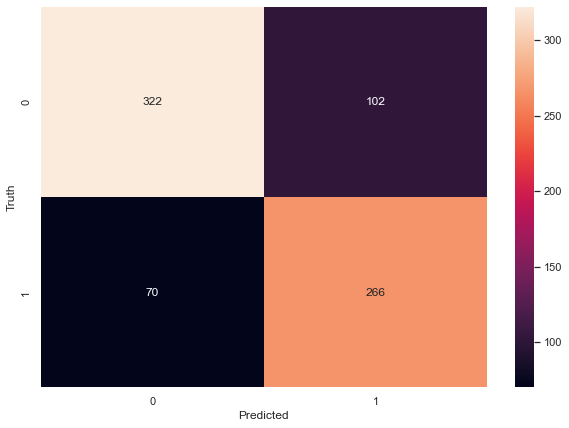

In [1283]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=y1_test,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

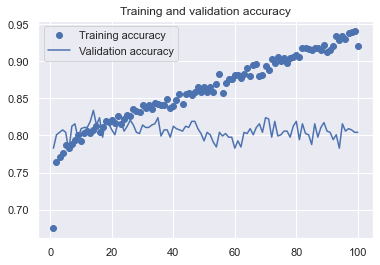

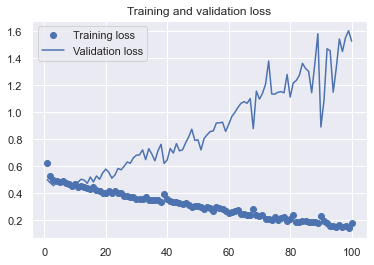

In [1284]:
# Plot results
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc)+1)

plt.plot(epochs, acc, 'bo', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [1285]:
#Fully Connected Layer Model in Action
predict=modelfcl.predict(X1_test)
predict

array([[5.23343146e-01],
       [1.72392411e-08],
       [9.99997973e-01],
       [2.36476012e-06],
       [9.81778264e-01],
       [7.93896616e-02],
       [1.11449783e-08],
       [1.65031046e-01],
       [1.71983242e-03],
       [9.90575075e-01],
       [1.00000000e+00],
       [1.89270750e-07],
       [7.59040713e-01],
       [2.46465206e-04],
       [1.93384153e-06],
       [6.62122369e-01],
       [8.95448029e-02],
       [2.10732222e-04],
       [9.30139661e-01],
       [3.94597650e-03],
       [5.83578768e-08],
       [9.99720037e-01],
       [9.99884129e-01],
       [9.71756279e-01],
       [2.28927791e-01],
       [3.37220430e-01],
       [1.94670022e-01],
       [9.99966383e-01],
       [5.33367276e-01],
       [9.95671272e-01],
       [3.68767977e-03],
       [9.03964043e-04],
       [6.06706738e-03],
       [1.01856887e-02],
       [7.16525495e-01],
       [1.88842416e-03],
       [6.49418155e-08],
       [9.99610126e-01],
       [9.42276120e-01],
       [3.35615873e-03],


In [1286]:
# Define function to visualize predictions
def test_output(classifier):
    result = []
    for f in X1_test:
      try:
          prediction = classifier.predict(f)
      except:
          prediction = classifier.predict(f.reshape(1,1,21))
      if(prediction < 0.5):
        result.append(0)
      else:
        result.append(1)
        
    return result
o = test_output(modelfcl)

Confusion Matrix: 
[[322 102]
 [ 70 266]]
Accuracy:  0.7736842105263158
Specificity:  0.7594339622641509
Precision/Positive Predictive Value:  0.7228260869565217
Negative Predictive Value:  0.8214285714285714
Recall/Sensitivity:  0.7916666666666666
False Positive Rate:  0.5930232558139535
False Negative Rate:  0.20833333333333334
Positive Likelihood Ratio:  1.3349673202614378
Negative Likelihod Ratio:  0.27432712215320915
Diagnostic Odds Ratio:  4.866333703292637
False Omission Rate:  0.17857142857142858
F1 Score:  0.7556818181818181
Area under ROC curve:  0.7755503144654088


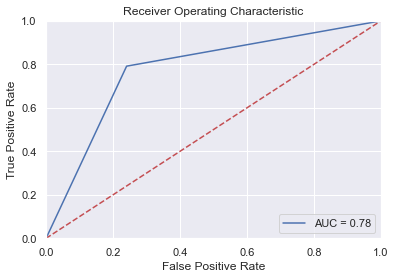

In [1287]:
from sklearn.metrics import *
matrix = confusion_matrix(y1_test, o)
print("Confusion Matrix: ")
print(matrix)
[[tn, fp], [fn, tp]] = matrix

acc_score = accuracy_score(y1_test, o)
precision = precision_score(y1_test, o)
recall = tpr = recall_score(y1_test, o)
f1 = f1_score(y1_test, o)
roc_score = roc_auc_score(y1_test, o)
spc = tnr = tn/(tn + fp)
fpr = fp/(fp + fn)
fnr = fn/(fn+tp)
plr = tpr/fpr
nlr = fnr/tnr
dor = plr/nlr
npv = tn/(fn+tn)
fr = fn/(fn+tn)

print("Accuracy: ", acc_score)
print("Specificity: ", spc)
print("Precision/Positive Predictive Value: ", precision)
print("Negative Predictive Value: ", npv)
print("Recall/Sensitivity: ", recall)
print("False Positive Rate: ", fpr)
print("False Negative Rate: ", fnr)
print("Positive Likelihood Ratio: ", plr)
print("Negative Likelihod Ratio: ", nlr)
print("Diagnostic Odds Ratio: ", dor)
print("False Omission Rate: ", fr)
print("F1 Score: ", f1)
print("Area under ROC curve: ", roc_score)


fpr, tpr, threshold = roc_curve(y1_test, o)
roc_auc = auc(fpr, tpr)

import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [1288]:
X1_test=np.reshape(X1_test,(X1_test.shape[0],X1_test.shape[2]))
y1_test=pd.DataFrame(y1_test)
X1_test=pd.DataFrame(X1_test)

In [1289]:
X1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_fcl_12mon_15.xlsx")
y1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_fcl_12mon_15.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_fcl_12mon_15.xlsx")

In [1290]:
df_x=df_feature_scaler[3508:]
df_y=df_label[3508:]
df_x=df_x.to_numpy()
df_y=df_y.to_numpy()
df_x=np.reshape(df_x,(df_x.shape[0],1,df_x.shape[1]))

In [1291]:
yp = modelfcl.predict(df_x)
yp[:5]

array([[0.99998164],
       [0.99896216],
       [0.9999994 ],
       [0.99999297],
       [0.99993074]], dtype=float32)

In [1292]:
y_pred1 = []
for element in yp:
    if element > 0.5:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [1293]:
y_pred1[:10]

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

In [1294]:
df_y[:10]

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int64)

In [1295]:
y_pred1=pd.DataFrame(y_pred1)
df_x=np.reshape(df_x,(df_x.shape[0],df_x.shape[2]))
df_x=pd.DataFrame(df_x)
df_y=pd.DataFrame(df_y)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_fcl_12mon_test_15.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_fcl_12mon_test_15.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_fcl_12mon_test_15.xlsx")

In [1296]:
# max

In [1297]:
df = pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/max.csv")
df.sample(5)

,Row Labels,Symbol,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy Date,...,Change in Nifty 50(6),Change in Nifty 50(9),Change in Nifty 50(12),Return(2),Return(6),Return(9),Return(12),Return,Change in Nifty 50,Result15
1995,BIOCON LTD.,BIOCON,129814,27963505.00,0,0.0,129814,27963505.00,215.41,09-01-2019,...,9.42%,-13.49%,7.58%,16.95%,25.40%,69.79%,82.45%,0.82,0.08,PROFIT
1954,Cyient Limited,CYIENT,80000,36924439.00,0,0.0,80000,36924439.00,461.56,08-01-2019,...,13.01%,-27.52%,-8.68%,6.59%,8.53%,-48.81%,-25.68%,0.09,0.13,LOSS
1800,Rama Steel Tubes Ltd,RAMASTEEL,20000,2060000.00,0,0.0,20000,2060000.00,103.00,04-01-2019,...,-16.33%,-12.87%,-46.19%,-14.63%,-50.31%,-59.23%,-82.07%,-0.15,-0.02,LOSS
691,MANGALAM CEMENT LTD.,MANGLMCEM,45160,17089127.11,0,0.0,45160,17089127.11,378.41,10-01-2017,...,2.08%,-5.92%,-20.10%,3.91%,-0.82%,-31.53%,-30.15%,0.04,0.14,LOSS
1013,BHARTI AIRTEL LTD.,BHARTIARTL,140000,53908512.10,0,0.0,140000,53908512.10,385.06,06-01-2018,...,1.79%,0.97%,11.32%,0.19%,-14.11%,-17.31%,3.21%,0.03,0.11,LOSS


In [1298]:
c={'SmallCap':0,'MidCap':1,'LargeCap':2}
df['Cap']=df['Cap'].map(c)
i={}
count=0
for _ in df['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df['Industry']=df['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df['Result15']=df['Result15'].map(r)

In [1299]:
print(df.isnull().sum())
df = df.dropna(how='any',axis=0) 
print(df.isnull().sum())

Row Labels                  0
Symbol                      0
No of Shares Bought         0
Value of purchase           0
No of shares sold           0
Value of sale               1
No of shares                0
Value                       0
Avg Price                   0
Buy Date                    0
Sell date                   0
Buy price                   0
Nifty Index at buying       0
No of shares.1              0
Market Cap                  0
%age of Marketcap           0
Cap                         0
Deviation                   0
EPS                         0
ROE                         0
COA                         0
CIA                         0
CFA                         0
PBT                         0
PE                          0
Industry                    0
Sell price(2)               0
Nfty index at selling(2)    0
Change in Nifty 50(2)       0
Change in Nifty 50(6)       0
Change in Nifty 50(9)       0
Change in Nifty 50(12)      0
Return(2)                   0
Return(6) 

In [1300]:
df['Cap']

0       0
1       0
2       1
3       0
4       0
       ..
3078    1
3079    0
3080    0
3081    0
3082    0
Name: Cap, Length: 3082, dtype: int64

In [1301]:
df.drop('Buy Date',1,inplace=True)
df.drop('Sell date',1,inplace=True)
df.drop('Row Labels',1,inplace=True)
#data.drop('Symbol',1,inplace=True)
df.drop('Return',1,inplace=True)
df.drop('Return(2)',1,inplace=True)
df.drop('Return(6)',1,inplace=True)
df.drop('Return(9)',1,inplace=True)
df.drop('Return(12)',1,inplace=True)
df.drop("Sell price(2)",1,inplace=True)
#data.drop('Result3',axis=1,inplace=True)
#data.drop('Nifty Index at buying',axis=1,inplace=True)
df.drop("Nfty index at selling(2)",axis=1,inplace=True)
df.drop("Change in Nifty 50(2)",axis=1,inplace=True)
df.drop("Change in Nifty 50(6)",axis=1,inplace=True)
df.drop("Change in Nifty 50(9)",axis=1,inplace=True)
df.drop("Change in Nifty 50(12)",axis=1,inplace=True)

C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\258682244.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Buy Date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\258682244.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Sell date',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\258682244.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Row Labels',1,inplace=True)
C:\Users\Anmol Choubey\AppData\Local\Temp\ipykernel_15120\258682244.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop('Return',1,inplace=True)
C:\Users\Anmol Choubey\AppD

In [1302]:
df['code']=pd.factorize(df['Symbol'])[0] + 1
df.drop('Symbol',axis=1,inplace=True)

In [1303]:
df_feature = df.drop('Result15',axis='columns')
df_label = df['Result15']

In [1304]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df_feature)
df_feature_scaler = scaler.transform(df_feature) #return in ndarray

#convert to dataframe
df_feature_scaler = pd.DataFrame(data=df_feature_scaler,columns=df_feature.columns)
df_feature_scaler.head()

,No of Shares Bought,Value of purchase,No of shares sold,Value of sale,No of shares,Value,Avg Price,Buy price,Nifty Index at buying,No of shares.1,...,EPS,ROE,COA,CIA,CFA,PBT,PE,Industry,Change in Nifty 50,code
0,-0.127988,-0.107273,-0.047267,-0.107944,-0.125706,-0.105556,-0.081740,-0.462813,-0.663274,-0.347365,...,-0.127792,-0.246735,-0.132499,0.147276,-0.003521,-0.172464,-0.131762,-1.24067,-0.327825,-1.398516
1,-0.134827,-0.089132,-0.047267,-0.107944,-0.132611,-0.087398,0.040982,1.956260,-0.663274,-0.342251,...,0.199389,0.737650,-0.054647,0.102633,-0.057854,-0.058642,-0.037383,-1.19294,-0.138837,-1.392022
2,2.101849,-0.084541,-0.047267,-0.107944,2.125969,-0.082803,-0.081731,-0.456441,1.397870,7.790057,...,-0.161640,-0.738928,0.572255,-0.737443,0.142654,-1.190363,-0.165865,-1.14521,-0.543811,-1.385527
3,0.446199,-0.096628,-0.047267,-0.107944,0.454105,-0.094900,-0.081569,-0.470720,-0.663274,-0.260905,...,-0.139925,-0.677403,-0.127722,0.151299,-0.017395,-0.176255,0.689046,-1.09748,-0.435818,-1.379033
4,0.028096,0.002985,-0.047267,-0.107944,0.031908,0.004800,-0.068724,-0.256687,-0.663274,0.018920,...,-0.100638,0.491554,-0.022689,0.025701,-0.008428,-0.025398,-0.062164,-1.04975,-0.138837,-1.372538


In [1305]:
from sklearn.model_selection import train_test_split

X1_big, X1_test, y1_big, y1_test = train_test_split(df_feature_scaler, df_label, test_size=0.2, random_state=27)
#becase the data isn't too much, so I take the validation data from train data
X1_train, X1_val, y1_train, y1_val = train_test_split(X1_big, y1_big, test_size=0.2, random_state=27)

In [1306]:
print(X1_big.shape, X1_val.shape, X1_test.shape,X1_train.shape)

(2465, 24) (493, 24) (617, 24) (1972, 24)


In [1307]:
print(X1_train.shape, ',', X1_train.ndim, ',', type(X1_train))
print(y1_train.shape, ',', y1_train.ndim, ',', type(y1_train))
print(X1_test.shape, ',', X1_val.ndim, ',', type(X1_val))
print(y1_test.shape, ',', y1_val.ndim, ',', type(y1_val))

(1972, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(1972,) , 1 , <class 'pandas.core.series.Series'>
(617, 24) , 2 , <class 'pandas.core.frame.DataFrame'>
(617,) , 1 , <class 'pandas.core.series.Series'>


In [1308]:
X1_train=X1_train.to_numpy()
y1_train=y1_train.to_numpy()
X1_test=X1_test.to_numpy()
y1_test=y1_test.to_numpy()
X1_val=X1_val.to_numpy()
y1_val=y1_val.to_numpy()

In [1309]:
X1_train=np.reshape(X1_train,(X1_train.shape[0],1,X1_train.shape[1]))
X1_test=np.reshape(X1_test,(X1_test.shape[0],1,X1_test.shape[1]))

In [1310]:
X1_val=np.reshape(X1_val,(X1_val.shape[0],1,X1_val.shape[1]))
print(X1_val.shape,X1_test.shape,X1_train.shape)

(493, 1, 24) (617, 1, 24) (1972, 1, 24)


In [1311]:
df_feature_scaler.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3082 entries, 0 to 3081
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   No of Shares Bought    3082 non-null   float64
 1   Value of purchase      3082 non-null   float64
 2   No of shares sold      3082 non-null   float64
 3   Value of sale          3082 non-null   float64
 4   No of shares           3082 non-null   float64
 5   Value                  3082 non-null   float64
 6   Avg Price              3082 non-null   float64
 7   Buy price              3082 non-null   float64
 8   Nifty Index at buying  3082 non-null   float64
 9   No of shares.1         3082 non-null   float64
 10  Market Cap             3082 non-null   float64
 11  %age of Marketcap      3082 non-null   float64
 12  Cap                    3082 non-null   float64
 13  Deviation              3082 non-null   float64
 14  EPS                    3082 non-null   float64
 15  ROE 

In [1312]:
# Define model
# FULLY CONNECTED LAYER
from keras import models
from keras import layers
from keras import optimizers

epochs = 100

modelfcl = models.Sequential()
modelfcl.add(layers.Flatten(input_shape=(1,24)))
modelfcl.add(layers.Dense(256, activation='relu', input_dim=(1*24)))
modelfcl.add(layers.Dense(128, activation='relu'))
modelfcl.add(layers.Dense(64, activation='relu'))
modelfcl.add(layers.Dense(32, activation='relu'))
modelfcl.add(layers.Dropout(0.5))
modelfcl.add(layers.Dense(1, activation='sigmoid'))
modelfcl.summary()

Model: "sequential_34"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_8 (Flatten)          (None, 24)                0         
_________________________________________________________________
dense_120 (Dense)            (None, 256)               6400      
_________________________________________________________________
dense_121 (Dense)            (None, 128)               32896     
_________________________________________________________________
dense_122 (Dense)            (None, 64)                8256      
_________________________________________________________________
dense_123 (Dense)            (None, 32)                2080      
_________________________________________________________________
dropout_16 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_124 (Dense)            (None, 1)               

In [1313]:
# Compile model
modelfcl.compile(optimizer=optimizers.Adam(),
              loss='binary_crossentropy',
              metrics=['acc'])

In [1314]:
# Train model
history = modelfcl.fit(X1_train, y1_train,
                    epochs=100,
                    batch_size=50, 
                    validation_data=(X1_val, y1_val))

Epoch 1/100
40/40 [==============================] - 0s 9ms/step - loss: 0.5989 - acc: 0.7074 - val_loss: 0.5141 - val_acc: 0.7485
Epoch 2/100
40/40 [==============================] - 0s 3ms/step - loss: 0.5045 - acc: 0.7728 - val_loss: 0.5082 - val_acc: 0.7505
Epoch 3/100
40/40 [==============================] - 0s 3ms/step - loss: 0.4961 - acc: 0.7774 - val_loss: 0.5027 - val_acc: 0.7505
Epoch 4/100
40/40 [==============================] - 0s 3ms/step - loss: 0.4965 - acc: 0.7794 - val_loss: 0.4960 - val_acc: 0.7606
Epoch 5/100
40/40 [==============================] - 0s 3ms/step - loss: 0.4799 - acc: 0.7840 - val_loss: 0.4920 - val_acc: 0.7708
Epoch 6/100
40/40 [==============================] - 0s 3ms/step - loss: 0.4854 - acc: 0.7845 - val_loss: 0.4941 - val_acc: 0.7525
Epoch 7/100
40/40 [==============================] - 0s 3ms/step - loss: 0.4692 - acc: 0.7977 - val_loss: 0.5240 - val_acc: 0.7465
Epoch 8/100
40/40 [==============================] - 0s 3ms/step - loss: 0.4718 - a

In [1315]:
test_loss, test_accuracy = modelfcl.evaluate(X1_test, y1_test)
print("Test loss: {0:.2f} and Test accuracy: {1:.2f}% ".format(test_loss,test_accuracy*100))

20/20 [==============================] - 0s 898us/step - loss: 1.1089 - acc: 0.7699
Test loss: 1.11 and Test accuracy: 76.99% 


In [1316]:
yp = modelfcl.predict(X1_test)
yp[:5]

array([[9.9170178e-02],
       [6.6244602e-04],
       [9.7454381e-01],
       [3.0377507e-04],
       [9.3911493e-01]], dtype=float32)

In [1317]:
y_pred=[]
for element in yp:
    if element>0.5:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [1318]:
y_pred=pd.DataFrame(y_pred)

In [1319]:
y_pred[:10]

,0
0,0
1,0
2,1
3,0
4,1
5,1
6,0
7,0
8,0
9,1


In [1320]:
y1_test[:10]

array([1, 0, 1, 0, 0, 1, 0, 0, 1, 0], dtype=int64)

Text(66.5, 0.5, 'Truth')

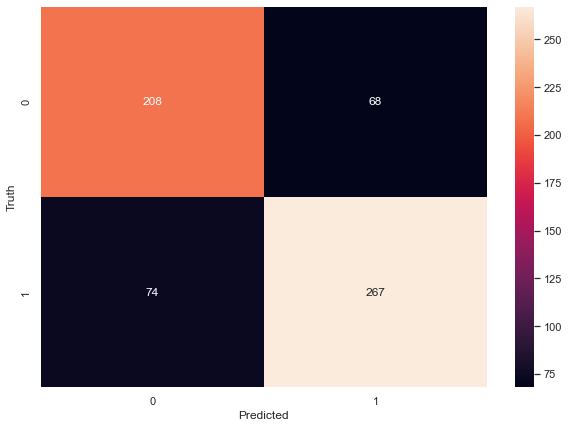

In [1321]:
import seaborn as sn
cm = tf.math.confusion_matrix(labels=y1_test,predictions=y_pred)

plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

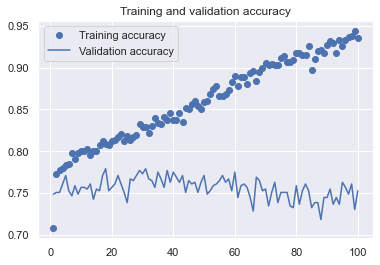

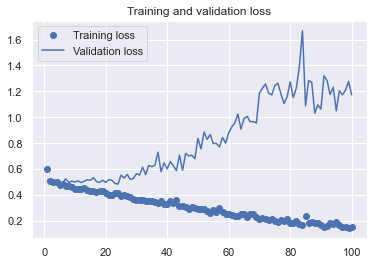

In [1322]:
# Plot results
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc)+1)

plt.plot(epochs, acc, 'bo', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [1323]:
#Fully Connected Layer Model in Action
predict=modelfcl.predict(X1_test)
predict

array([[9.91701782e-02],
       [6.62446022e-04],
       [9.74543810e-01],
       [3.03775072e-04],
       [9.39114928e-01],
       [9.99964297e-01],
       [2.82278359e-02],
       [2.17214227e-02],
       [3.46739531e-01],
       [9.99997735e-01],
       [1.00000000e+00],
       [4.75224853e-03],
       [2.32845098e-01],
       [2.18692422e-02],
       [9.62764263e-01],
       [5.24774790e-02],
       [9.96958256e-01],
       [2.54690349e-02],
       [1.00000000e+00],
       [9.01513815e-01],
       [9.99704540e-01],
       [9.99734640e-01],
       [1.00000000e+00],
       [9.99572277e-01],
       [1.42108798e-02],
       [9.99999166e-01],
       [9.94209290e-01],
       [9.06542301e-01],
       [9.06333685e-01],
       [1.34808421e-02],
       [1.65492296e-04],
       [7.57863224e-02],
       [1.00000000e+00],
       [1.90463662e-03],
       [9.21255350e-03],
       [5.05824327e-01],
       [9.99989688e-01],
       [6.74147964e-01],
       [7.81539321e-01],
       [8.73615503e-01],


In [1324]:
# Define function to visualize predictions
def test_output(classifier):
    result = []
    for f in X1_test:
      try:
          prediction = classifier.predict(f)
      except:
          prediction = classifier.predict(f.reshape(1,1,21))
      if(prediction < 0.5):
        result.append(0)
      else:
        result.append(1)
        
    return result
o = test_output(modelfcl)

Confusion Matrix: 
[[208  68]
 [ 74 267]]
Accuracy:  0.7698541329011345
Specificity:  0.7536231884057971
Precision/Positive Predictive Value:  0.7970149253731343
Negative Predictive Value:  0.7375886524822695
Recall/Sensitivity:  0.782991202346041
False Positive Rate:  0.4788732394366197
False Negative Rate:  0.21700879765395895
Positive Likelihood Ratio:  1.635069863722615
Negative Likelihod Ratio:  0.2879539815023686
Diagnostic Odds Ratio:  5.678233220432708
False Omission Rate:  0.2624113475177305
F1 Score:  0.7899408284023669
Area under ROC curve:  0.7683071953759191


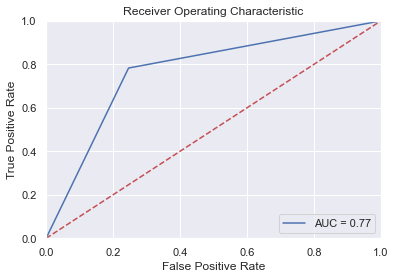

In [1325]:
from sklearn.metrics import *
matrix = confusion_matrix(y1_test, o)
print("Confusion Matrix: ")
print(matrix)
[[tn, fp], [fn, tp]] = matrix

acc_score = accuracy_score(y1_test, o)
precision = precision_score(y1_test, o)
recall = tpr = recall_score(y1_test, o)
f1 = f1_score(y1_test, o)
roc_score = roc_auc_score(y1_test, o)
spc = tnr = tn/(tn + fp)
fpr = fp/(fp + fn)
fnr = fn/(fn+tp)
plr = tpr/fpr
nlr = fnr/tnr
dor = plr/nlr
npv = tn/(fn+tn)
fr = fn/(fn+tn)

print("Accuracy: ", acc_score)
print("Specificity: ", spc)
print("Precision/Positive Predictive Value: ", precision)
print("Negative Predictive Value: ", npv)
print("Recall/Sensitivity: ", recall)
print("False Positive Rate: ", fpr)
print("False Negative Rate: ", fnr)
print("Positive Likelihood Ratio: ", plr)
print("Negative Likelihod Ratio: ", nlr)
print("Diagnostic Odds Ratio: ", dor)
print("False Omission Rate: ", fr)
print("F1 Score: ", f1)
print("Area under ROC curve: ", roc_score)


fpr, tpr, threshold = roc_curve(y1_test, o)
roc_auc = auc(fpr, tpr)

import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [1326]:
X1_test=np.reshape(X1_test,(X1_test.shape[0],X1_test.shape[2]))
y1_test=pd.DataFrame(y1_test)
X1_test=pd.DataFrame(X1_test)

In [1327]:
X1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_fcl_max.xlsx")
y1_test.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_fcl_max.xlsx")
y_pred.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_fcl_max.xlsx")

In [1328]:
df_x=df_feature_scaler[2847:]
df_y=df_label[2847:]
df_x=df_x.to_numpy()
df_y=df_y.to_numpy()
df_x=np.reshape(df_x,(df_x.shape[0],1,df_x.shape[1]))

In [1329]:
yp = modelfcl.predict(df_x)
yp[:5]

array([[1.        ],
       [0.99997616],
       [0.9999827 ],
       [1.        ],
       [1.        ]], dtype=float32)

In [1330]:
y_pred1 = []
for element in yp:
    if element > 0.5:
        y_pred1.append(1)
    else:
        y_pred1.append(0)

In [1331]:
y_pred1[:10]

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

In [1332]:
df_y[:10]

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int64)

In [1333]:
y_pred1=pd.DataFrame(y_pred1)
df_x=np.reshape(df_x,(df_x.shape[0],df_x.shape[2]))
df_x=pd.DataFrame(df_x)
df_y=pd.DataFrame(df_y)
df_x.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_detail_fcl_max_test.xlsx")
df_y.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_fcl_max_test.xlsx")
y_pred1.to_excel("C:/Users/Arnab Karmakar/Downloads/test_data_pred_fcl_max_test.xlsx")

In [1334]:
raise SystemExit("Stop right there!")

SystemExit: Stop right there!

C:\Users\Anmol Choubey\anaconda3\envs\deeplearning\lib\site-packages\IPython\core\interactiveshell.py:3377: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [ ]:
def predict_class(data,classifier=modelfcl):
    for x in data:
        try:
            prediction = classifier.predict(x)
        except:
            prediction = classifier.predict(x.reshape(1,1,21))
        print(x)
        print(prediction)
        if prediction<0.5:
            print('LOSS')
        else:
            print('PROFIT')
        
        

In [ ]:
predict_class(X1_test,modelfcl)

In [ ]:
df1 =pd.read_csv(r"C:/Users/Arnab Karmakar/Downloads/main_data.csv")
df1.head()

In [ ]:
df1.info()

In [ ]:
c={'Small-Cap':0,'Mid-Cap':1,'Large-Cap':2}
df1['Cap']=df1['Cap'].map(c)
i={}
count=0
for _ in df1['Industry']:
    if _ not in i:
        i[_]=count
        count+=1
df1['Industry']=df1['Industry'].map(i)

r={'PROFIT':1,'LOSS':0}
df1['Return']=df1['Return'].map(r)

In [ ]:
df1.drop('Buy Date',axis=1,inplace=True)
df1.drop('Sell date',axis=1,inplace=True)
df1.drop('Row Labels',axis=1,inplace=True)
df1.drop('Symbol',axis=1,inplace=True)
df1.drop('Return %',axis=1,inplace=True)
df1.drop('Sell price',axis=1,inplace=True)
df1.drop('Nifty Index at buying',axis=1,inplace=True)
df1.drop('Nfty index at selling',axis=1,inplace=True)
df1.drop('Change in Nifty 50 %',axis=1,inplace=True)

In [ ]:
df1_feature = df1.drop('Return',axis='columns')
df1_label = df1['Return']

In [ ]:
df1_feature.shape

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(df1_feature)
df1_feature_scaler = scaler.transform(df1_feature) #return in ndarray

#convert to dataframe
df1_feature_scaler = pd.DataFrame(data=df1_feature_scaler,columns=df1_feature.columns)
df1_feature_scaler.head()

In [ ]:
model_mlp=Sequential()
model_mlp.add(Dense(21, input_dim=21,activation='relu'))
model_mlp.add(Dense(15,activation='relu'))
model_mlp.add(Dense(8,activation='relu'))
model_mlp.add(Dense(1,activation='sigmoid'))

model_mlp.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])

X_train, X_test, y_train, y_test = train_test_split(df1_feature_scaler,df1_label,test_size=0.2,random_state=24)

history=model_mlp.fit(X_train,y_train, epochs=500, batch_size=100)

In [ ]:
# Get predictions
train_preds = [round(x[0]) for x in model_mlp.predict(X_train)]
test_preds = [round(x[0]) for x in model_mlp.predict(X_test)]

# Get AUC and ROC
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, train_preds)
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, test_preds)
train_roc_auc = auc(train_fpr, train_tpr)
test_roc_auc = auc(test_fpr, test_tpr)

# Visualize ROC curve
plt.figure(figsize=(7, 5), dpi=80)
plt.plot(test_fpr,
         test_tpr,
         color='tomato',
         label='ROC curve for test set (area = %0.4f)' % test_roc_auc)
plt.plot(train_fpr,
         train_tpr,
         color='dodgerblue',
         label='ROC curve for train set (area = %0.4f)' % train_roc_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=14)
plt.ylabel('True Positive Rate', fontsize=14)
plt.title('ROC Curve', fontsize=16)
plt.legend(loc="lower right")

plt.show()

In [ ]:
print('Accuracy for test set: %0.4f' % accuracy_score(y_test,test_preds))
print('Accuracy for train set: %0.4f' % accuracy_score(y_train,train_preds))

print('Precision for test set: %0.4f' % precision_score(y_test,test_preds))
print('Precision for train set: %0.4f' % precision_score(y_train,train_preds))

print('Recall for test set: %0.4f' % recall_score(y_test,test_preds))
print('Recall for train set: %0.4f' % recall_score(y_test,test_preds))

In [ ]:
### Neural Prediction
def model_nn(X_train, y_train, X_test, y_test, params):
    model_nn = Sequential()
    model_nn.add(Dense(params['first_neuron'], 
                        input_dim=X_train.shape[1],
                        kernel_regularizer=keras.regularizers.l2(0.001),  
                        activation=params['activation']))

    model_nn.add(Dense(params['second_neuron'], 
                        kernel_regularizer=keras.regularizers.l2(0.001), 
                        activation=params['activation']))

    model_nn.add(Dense(1, activation='sigmoid'))
    
    model_nn.compile(loss = 'binary_crossentropy', 
                          optimizer=params['optimizer'], 
                          metrics=['accuracy'])
    
    history = model_nn.fit(X_train, y_train, 
                    validation_data=(X_test, y_test),
                    batch_size=1024,
                    epochs=100, 
                    verbose=1)
    
    return history, model_nn


In [ ]:
model_nn1=models.Sequential()
model_nn1.add(Dense(21, 
                        input_dim=X_train.shape[1],
                        kernel_regularizer=keras.regularizers.l2(0.001),  
                        activation='relu'))

model_nn1.add(Dense(10, 
                        kernel_regularizer=keras.regularizers.l2(0.001), 
                        activation='relu'))
model_nn1.add(Dense(3, 
                        kernel_regularizer=keras.regularizers.l2(0.001), 
                        activation='relu'))

model_nn1.add(Dense(1, activation='sigmoid'))
    
model_nn1.compile(loss = 'binary_crossentropy', 
                          optimizer=params['optimizer'], 
                          metrics=['accuracy'])

#model_mlp.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])

In [ ]:
import numpy as np
#from numpy import array
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('dark_background')
#import talos as ta
from scipy import stats
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PowerTransformer

import keras
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense

import warnings
warnings.filterwarnings("ignore")

In [ ]:
import talos

In [ ]:
from sklearn.model_selection import train_test_split

X1_big, X1_test, y1_big, y1_test = train_test_split(df1_feature_scaler, df1_label, test_size=0.2, random_state=27)
#becase the data isn't too much, so I take the validation data from train data
X1_train, X1_val, y1_train, y1_val = train_test_split(X1_big, y1_big, test_size=0.2, random_state=27)

In [ ]:
params = {'first_neuron':[10, 21],
     'second_neuron':[5, 10],
          'third_neuron':[3,5],
     'activation': ['relu', 'tanh'],
     'optimizer': ['adam', 'rmsprop']}

h = talos.Scan(x=X1_train.to_numpy(),
            y=y1_train.to_numpy(),
            x_val=X1_val.to_numpy(),
            y_val=y1_val.to_numpy(),
            model=model_nn,
            params=params,
            experiment_name='result_pred')

In [ ]:
actual = pd.DataFrame(y1_val)
actual.reset_index(drop=False, inplace=True)
preds = pd.DataFrame(model_nn1.predict(X1_val), dtype=np.float64, columns=['churn_probability'])
preds_classes = pd.DataFrame(model_nn1.predict_classes(X1_val), dtype=np.int8, columns=['predicted'])

pd.concat([actual.rename(columns={"churn":"Return"}), preds, preds_classes], axis=1) \
            [['churn_probability','predicted','Return']].head(10)

In [ ]:
print(np.__version__)

In [ ]:
pip uninstall numpy

In [ ]:
pip install numpy==1.22.3

In [ ]:
import numpy as np
print(np.__version__)